In [3500]:
import pandas as pd
import numpy as np
import seaborn as sns
import polars as pl
import matplotlib.pyplot as plt
from matplotlib import pyplot

In [3501]:
df_everything_stats_sa199m2e = pd.read_csv('sa199m2e_new_newest_everything_stats.csv')
df_everything_stats_sa196m2e = pd.read_csv('sa196m2e_new_newest_everything_stats.csv')
df_everything_stats_sa196m1e = pd.read_csv('sa196m1e_new_newest_everything_stats.csv')
df_everything_stats_sa198m2e = pd.read_csv('sa198m2e_new_newest_everything_stats.csv')
df_everything_stats_sa196m3e = pd.read_csv('sa196m3e_new_newest_everything_stats.csv')
df_everything_stats_sa199m3e = pd.read_csv('sa199m3e_new_newest_everything_stats.csv')
df_everything_stats_sa199m1e = pd.read_csv('sa199m1e_new_newest_everything_stats.csv')
df_everything_stats_sa78m1 = pd.read_csv('sa78m1_new_newest_everything_stats.csv')
df_everything_stats_sa78m3 = pd.read_csv('sa78m3_new_newest_everything_stats.csv')
df_everything_stats_sa78m5 = pd.read_csv('sa78m5_new_newest_everything_stats.csv')


df_everything_stats_sa325m1 = pd.read_csv('sa325m1_new_newest_everything_stats.csv')
df_everything_stats_sa325m2 = pd.read_csv('sa325m2_new_newest_everything_stats.csv')
df_everything_stats_sa325m3 = pd.read_csv('sa325m3_new_newest_everything_stats.csv')
df_everything_stats_sa325m4 = pd.read_csv('sa325m4_new_newest_everything_stats.csv')
df_everything_stats_sa498m2 = pd.read_csv('sa498m2_new_newest_everything_stats.csv')
df_everything_stats_sa498m3 = pd.read_csv('sa498m3_new_newest_everything_stats.csv')
df_everything_stats_sa499m1 = pd.read_csv('sa499m1_new_newest_everything_stats.csv')
df_everything_stats_sa499m2 = pd.read_csv('sa499m2_new_newest_everything_stats.csv')
df_everything_stats_sa499m3 = pd.read_csv('sa499m3_new_newest_everything_stats.csv')


In [3502]:
'''
function to chance nomenclature of choice output (2, 3, 4, or 5) to (0 - decrease, 1 - maintained, or 2 - improved)
'''
def set_new_class_individual(df_everything):
    df_new_class = df_everything.copy()
    new_class=[1];
    
    for ind in range(1, len(df_new_class)):
        c = (df_new_class['Choice Output'][ind]-df_new_class['Choice Output'][ind-1])
        if (c > 0):
            new_class.append(2)
        elif (c == 0):
            new_class.append(1)
        elif (c < 0):
            new_class.append(0)
    df_new_class['New Class'] = new_class;
    return df_new_class;

In [3503]:
df_new_class_sa199m2e = set_new_class_individual(df_everything_stats_sa199m2e)
df_new_class_sa196m2e = set_new_class_individual(df_everything_stats_sa196m2e)
df_new_class_sa196m1e = set_new_class_individual(df_everything_stats_sa196m1e)
df_new_class_sa198m2e = set_new_class_individual(df_everything_stats_sa198m2e)
df_new_class_sa196m3e = set_new_class_individual(df_everything_stats_sa196m3e)
df_new_class_sa199m3e = set_new_class_individual(df_everything_stats_sa199m3e)
df_new_class_sa199m1e = set_new_class_individual(df_everything_stats_sa199m1e)
df_new_class_sa78m1 = set_new_class_individual(df_everything_stats_sa78m1)
df_new_class_sa78m3 = set_new_class_individual(df_everything_stats_sa78m3)
df_new_class_sa78m5 = set_new_class_individual(df_everything_stats_sa78m5)

df_new_class_sa325m1 = set_new_class_individual(df_everything_stats_sa325m1)
df_new_class_sa325m2 = set_new_class_individual(df_everything_stats_sa325m2)
df_new_class_sa325m3 = set_new_class_individual(df_everything_stats_sa325m3)
df_new_class_sa325m4 = set_new_class_individual(df_everything_stats_sa325m4)
df_new_class_sa498m2 = set_new_class_individual(df_everything_stats_sa498m2)
df_new_class_sa498m3 = set_new_class_individual(df_everything_stats_sa498m3)
df_new_class_sa499m1 = set_new_class_individual(df_everything_stats_sa499m1)
df_new_class_sa499m2 = set_new_class_individual(df_everything_stats_sa499m2)
df_new_class_sa499m3 = set_new_class_individual(df_everything_stats_sa499m3)







In [3504]:
'''
function to create the lagging for all previous 4 choices
'''
def lagging_four_prev_choices(df_pls, mouse_id):
    lagged_df_everything_stats = df_pls.select(
    
    "Middle Duration", 
    *[pl.col("Middle Duration").shift(i).alias(f"lagged_{i}_mid_duration") for i in [1,2,3,4]],
    "Middle Nose Movement", 
    *[pl.col("Middle Nose Movement").shift(i).alias(f"lagged_{i}_mid_nose_mov") for i in [1,2,3,4]],
    "Middle Nose Velocity", 
    *[pl.col("Middle Nose Velocity").shift(i).alias(f"lagged_{i}_mid_nose_vel") for i in [1,2,3,4]],
    "Middle Tail Movement", 
    *[pl.col("Middle Tail Movement").shift(i).alias(f"lagged_{i}_mid_tail_mov") for i in [1,2,3,4]],
    "Middle Tail Velocity", 
    *[pl.col("Middle Tail Velocity").shift(i).alias(f"lagged_{i}_mid_tail_vel") for i in [1,2,3,4]],       
        
    "Middle Tortuosity", 
    *[pl.col("Middle Tortuosity").shift(i).alias(f"lagged_{i}_mid_tortuosity") for i in [1,2,3,4]],          
    
    "Current Coeff", 
    *[pl.col("Current Coeff").shift(i).alias(f"lagged_{i}_current_coeff") for i in [1,2,3,4]],   
    "Lagged 1 Cur Coeff", 
    *[pl.col("Lagged 1 Cur Coeff").shift(i).alias(f"lagged_{i}_lagged_1_cur_coeff") for i in [1,2,3,4]],
    "Lagged 2 Cur Coeff", 
    *[pl.col("Lagged 2 Cur Coeff").shift(i).alias(f"lagged_{i}_lagged_2_cur_coeff") for i in [1,2,3,4]],
    "Lagged 3 Cur Coeff", 
    *[pl.col("Lagged 3 Cur Coeff").shift(i).alias(f"lagged_{i}_lagged_3_cur_coeff") for i in [1,2,3,4]],
    "Lagged 4 Cur Coeff", 
    *[pl.col("Lagged 4 Cur Coeff").shift(i).alias(f"lagged_{i}_lagged_4_cur_coeff") for i in [1,2,3,4]],

    "New Current Coeff", 
    *[pl.col("New Current Coeff").shift(i).alias(f"lagged_{i}_new_current_coeff") for i in [1,2,3,4]],   
    "New Lagged 1 Cur Coeff", 
    *[pl.col("New Lagged 1 Cur Coeff").shift(i).alias(f"lagged_{i}_new_lagged_1_cur_coeff") for i in [1,2,3,4]],
    "New Lagged 2 Cur Coeff", 
    *[pl.col("New Lagged 2 Cur Coeff").shift(i).alias(f"lagged_{i}_new_lagged_2_cur_coeff") for i in [1,2,3,4]],
    "New Lagged 3 Cur Coeff", 
    *[pl.col("New Lagged 3 Cur Coeff").shift(i).alias(f"lagged_{i}_new_lagged_3_cur_coeff") for i in [1,2,3,4]],
    "New Lagged 4 Cur Coeff", 
    *[pl.col("New Lagged 4 Cur Coeff").shift(i).alias(f"lagged_{i}_new_lagged_4_cur_coeff") for i in [1,2,3,4]],
    
    "Current Coeff Time Proportional", 
    *[pl.col("Current Coeff Time Proportional").shift(i).alias(f"lagged_{i}_current_coeff_time_prop") for i in [1,2,3,4]],
    "Lagged 1 Cur Coeff Time Proportional", 
    *[pl.col("Lagged 1 Cur Coeff Time Proportional").shift(i).alias(f"lagged_{i}_lagged_1_cur_coeff_time_prop") for i in [1,2,3,4]],
    "Lagged 2 Cur Coeff Time Proportional", 
    *[pl.col("Lagged 2 Cur Coeff Time Proportional").shift(i).alias(f"lagged_{i}_lagged_2_cur_coeff_time_prop") for i in [1,2,3,4]],
    "Lagged 3 Cur Coeff Time Proportional", 
    *[pl.col("Lagged 3 Cur Coeff Time Proportional").shift(i).alias(f"lagged_{i}_lagged_3_cur_coeff_time_prop") for i in [1,2,3,4]],
    "Lagged 4 Cur Coeff Time Proportional", 
    *[pl.col("Lagged 4 Cur Coeff Time Proportional").shift(i).alias(f"lagged_{i}_lagged_4_cur_coeff_time_prop") for i in [1,2,3,4]],

    "New Current Coeff Time Proportional", 
    *[pl.col("New Current Coeff Time Proportional").shift(i).alias(f"lagged_{i}_new_current_coeff_time_prop") for i in [1,2,3,4]],
    "New Lagged 1 Cur Coeff Time Proportional", 
    *[pl.col("New Lagged 1 Cur Coeff Time Proportional").shift(i).alias(f"lagged_{i}_new_lagged_1_cur_coeff_time_prop") for i in [1,2,3,4]],
    "New Lagged 2 Cur Coeff Time Proportional", 
    *[pl.col("New Lagged 2 Cur Coeff Time Proportional").shift(i).alias(f"lagged_{i}_new_lagged_2_cur_coeff_time_prop") for i in [1,2,3,4]],
    "New Lagged 3 Cur Coeff Time Proportional", 
    *[pl.col("New Lagged 3 Cur Coeff Time Proportional").shift(i).alias(f"lagged_{i}_new_lagged_3_cur_coeff_time_prop") for i in [1,2,3,4]],
    "New Lagged 4 Cur Coeff Time Proportional", 
    *[pl.col("New Lagged 4 Cur Coeff Time Proportional").shift(i).alias(f"lagged_{i}_new_lagged_4_cur_coeff_time_prop") for i in [1,2,3,4]],    
    
    "Entry Latency", 
    *[pl.col("Entry Latency").shift(i).alias(f"lagged_{i}_entry_lat") for i in [1,2,3,4]],
    "Entry Latency Nose Movement", 
    *[pl.col("Entry Latency Nose Movement").shift(i).alias(f"lagged_{i}_entry_lat_nose_mov") for i in [1,2,3,4]],
    "Entry Latency Nose Velocity", 
    *[pl.col("Entry Latency Nose Velocity").shift(i).alias(f"lagged_{i}_entry_lat_nose_vel") for i in [1,2,3,4]],
    "Entry Latency Tail Movement", 
    *[pl.col("Entry Latency Tail Movement").shift(i).alias(f"lagged_{i}_entry_lat_tail_mov") for i in [1,2,3,4]],
    "Entry Latency Tail Velocity", 
    *[pl.col("Entry Latency Tail Velocity").shift(i).alias(f"lagged_{i}_entry_lat_tail_vel") for i in [1,2,3,4]],   
 
    "Duration", 
    *[pl.col("Duration").shift(i).alias(f"lagged_{i}_duration") for i in [1,2,3,4]],
    "Nose Max Distance",
    *[pl.col("Nose Max Distance").shift(i).alias(f"lagged_{i}_nose_max_distance") for i in [1,2,3,4]],    
    "Nose Time to Max Dist",
    *[pl.col("Nose Time to Max Dist").shift(i).alias(f"lagged_{i}_nose_time_to_max_dist") for i in [1,2,3,4]],        
    "Tail Base Max Distance",
    *[pl.col("Tail Base Max Distance").shift(i).alias(f"lagged_{i}_tail_max_distance") for i in [1,2,3,4]],    
    "Tail Base Time to Max Dist",
    *[pl.col("Tail Base Time to Max Dist").shift(i).alias(f"lagged_{i}_tail_time_to_max_dist") for i in [1,2,3,4]],       
    "Arm Nose Movement", 
    *[pl.col("Arm Nose Movement").shift(i).alias(f"lagged_{i}_arm_nose_mov") for i in [1,2,3,4]],
    "Arm Nose Velocity", 
    *[pl.col("Arm Nose Velocity").shift(i).alias(f"lagged_{i}_arm_nose_vel") for i in [1,2,3,4]],
    "Arm Tail Movement", 
    *[pl.col("Arm Tail Movement").shift(i).alias(f"lagged_{i}_arm_tail_mov") for i in [1,2,3,4]],
    "Arm Tail Velocity", 
    *[pl.col("Arm Tail Velocity").shift(i).alias(f"lagged_{i}_arm_tail_vel") for i in [1,2,3,4]],
    "Entry Tortuosity",
    *[pl.col("Entry Tortuosity").shift(i).alias(f"lagged_{i}_entry_tortuosity") for i in [1,2,3,4]],       
    "Exit Tortuosity",
    *[pl.col("Exit Tortuosity").shift(i).alias(f"lagged_{i}_exit_tortuosity") for i in [1,2,3,4]],    
    "Other Tortuosity",
    *[pl.col("Other Tortuosity").shift(i).alias(f"lagged_{i}_other_tortuosity") for i in [1,2,3,4]],    

    "Exit Latency", 
    *[pl.col("Exit Latency").shift(i).alias(f"lagged_{i}_exit_lat") for i in [1,2,3,4]], 
    "Exit Latency Nose Movement", 
    *[pl.col("Exit Latency Nose Movement").shift(i).alias(f"lagged_{i}_exit_lat_nose_mov") for i in [1,2,3,4]],
    "Exit Latency Nose Velocity", 
    *[pl.col("Exit Latency Nose Velocity").shift(i).alias(f"lagged_{i}_exit_lat_nose_vel") for i in [1,2,3,4]],
    "Exit Latency Tail Movement", 
    *[pl.col("Exit Latency Tail Movement").shift(i).alias(f"lagged_{i}_exit_lat_tail_mov") for i in [1,2,3,4]],
    "Exit Latency Tail Velocity", 
    *[pl.col("Exit Latency Tail Velocity").shift(i).alias(f"lagged_{i}_exit_lat_tail_vel") for i in [1,2,3,4]],   

    "ExitMid Duration",
    *[pl.col("ExitMid Duration").shift(i).alias(f"lagged_{i}_exitmid_duration") for i in [1,2,3,4]],
    "MidEntry Duration", 
    *[pl.col("MidEntry Duration").shift(i).alias(f"lagged_{i}_midentry_duration") for i in [1,2,3,4]],
    "ExitMidEntry Duration",
    *[pl.col("ExitMidEntry Duration").shift(i).alias(f"lagged_{i}_exitmidentry_duration") for i in [1,2,3,4]],
    
    "Turn",
    *[pl.col("Turn").shift(i).alias(f"lagged_{i}_turn_ago") for i in [1,2,3,4]],
     "New Class",
    *[pl.col("New Class").shift(i).alias(f"lagged_{i}_new_class") for i in [1,2,3,4]],
    
    "Choice Output", 
    *[pl.col("Choice Output").shift(i).alias(f"lagged_{i}_choice_ago") for i in [1,2,3,4]]
    )
    lagged_df_everything_stats = lagged_df_everything_stats.drop_nulls()
    
    lagged_df_everything_stats.write_csv(mouse_id+'_newest_lagged_mm_everything_stats.csv')
    return lagged_df_everything_stats;

In [3505]:
'''
function that returns df with required means
'''
def get_performance(df_lagged_new_mice, column, number):
    #correct = str(number)+'s_Correct_'+column;
    #incorrect = str(number)+'s_Incorrect_'+column
    val = str(number)+'s_'+column
    #df_means = pd.DataFrame(columns=['mouse', correct, incorrect, 'Choice Output', 'New Class'])
    df_performance = pd.DataFrame(columns=['mouse', val, 'Outcome', 'Choice Output', 'New Class'])
    mouse = []
    choice_output = []
    new_class = []
    #cor = []
    #inc = []
    corinc = []
    values = []
    outcomepercentage = []

    mname = 'mock mouse'
    for i in range(0,len(df_lagged_new_mice)):
        if(df_lagged_new_mice['mouse'][i]!=mname):
            fnum = number
            idx = df_lagged_new_mice.columns.get_loc(column)
            p = 1
            while fnum < 5:
                m = []
                idx = idx+1
                for icol in range(idx, idx+number-1):
                    t = df_lagged_new_mice.iloc[i, icol]
                    m.append(t)
                tm = np.mean(m)
                values.append(tm)
                
                if df_lagged_new_mice.iloc[i, df_lagged_new_mice.columns.get_loc('Choice Output')+p]<number:
                    #inc.append(tm)
                    corinc.append('incorrect')
                else:
                    #cor.append(tm)
                    corinc.append('correct') 
                mouse.append(df_lagged_new_mice['mouse'][i])
                choice_output.append(df_lagged_new_mice.iloc[i, df_lagged_new_mice.columns.get_loc('Choice Output')+p])
                try:
                    new_class.append(df_lagged_new_mice.iloc[i,df_lagged_new_mice.columns.get_loc('New Class')+p])
                except:
                    new_class.append(0)
                fnum=fnum+1
                p = p+1
        m = []
        idx = df_lagged_new_mice.columns.get_loc(column)
        for icol in range(idx, idx+number-1):
            t = df_lagged_new_mice.iloc[i, icol]
            m.append(t)
        tm = np.mean(m)
        values.append(tm)
        if df_lagged_new_mice['Choice Output'][i]<number:
            #inc.append(tm)
            corinc.append('incorrect')
        else:
            #cor.append(tm)
            corinc.append('correct') 
        mouse.append(df_lagged_new_mice['mouse'][i])
        choice_output.append(df_lagged_new_mice['Choice Output'][i])
        new_class.append(df_lagged_new_mice['New Class'][i])
        mname = df_lagged_new_mice['mouse'][i]

    
    #l = len(mouse)    
    #print(l)
    #nc = l-len(cor)
    #print(nc)
    #cor = cor + ([np.nan]*nc)
    #ni = l-len(inc)
    #inc = inc + ([np.nan]*ni) 
    
    df_performance['mouse'] = mouse
    #df_means[correct] = cor
    #df_means[incorrect] = inc 
    df_performance[val] = values
    df_performance['Outcome'] = corinc
    df_performance['Choice Output'] = choice_output
    df_performance['New Class'] = new_class
            
    return df_performance;

In [3506]:
def get_mean_performances(df_performance):
    mouse = []
    meanval = []
    percent = []
    outcome = []
    mice = set(df_performance['mouse'])
    for m in mice:
        cor =[]
        inc =[]
        for i in range(0, len(df_performance)):
            if df_performance['mouse'][i]==m:
                if df_performance['Outcome'][i]=='correct':
                    cor.append(df_performance.iloc[i,1])
                else:
                    inc.append(df_performance.iloc[i,1])
        tot = len(cor)+len(inc)
        mouse.append(m)
        meanval.append(np.mean(cor))
        percent.append(len(cor)/tot*100)
        outcome.append('correct')
        mouse.append(m)
        meanval.append(np.mean(inc))
        percent.append(len(cor)/tot*100)
        outcome.append('incorrect')        

    df_means = pd.DataFrame({'mouse':mouse, df_performance.columns[1]:meanval, '%':percent, 'Outcome':outcome})
    print(df_means.to_string(index=False))
    return df_means;

    

In [3507]:
def added_time_means_edited(lagged_df_everything_stats, mouse_id):

    
    f = lagged_df_everything_stats.drop(columns = ['Choice Output', 'lagged_1_choice_ago', 'lagged_2_choice_ago','lagged_3_choice_ago', 
                                                   'lagged_4_choice_ago']);
    r_arm_mean2s = []
    r_arm_mean3s = []
    r_arm_mean4s = []
    r_arm_mean5s = []

    p_arm_mean2s = []
    p_arm_mean3s = []
    p_arm_mean4s = []

    p_mid_mean2s = []
    p_mid_mean3s = []
    p_mid_mean4s = []
    p_mid_mean5s = []

    r_arm_2s = []
    r_arm_3s = []
    r_arm_4s = []
    r_arm_5s = []

    p_arm_2s = []
    p_arm_3s = []
    p_arm_4s = []

    p_mid_2s = []
    p_mid_3s = []
    p_mid_4s = []
    p_mid_5s = []
    
    p_exitmid_2s = []
    p_exitmid_3s = []
    p_exitmid_4s = []
    p_exitmid_5s = []

    p_exitmid_mean2s = []
    p_exitmid_mean3s = []
    p_exitmid_mean4s = []
    p_exitmid_mean5s = []

    p_midentry_2s = []
    p_midentry_3s = []
    p_midentry_4s = []
    p_midentry_5s = []

    p_midentry_mean2s = []
    p_midentry_mean3s = []
    p_midentry_mean4s = []
    p_midentry_mean5s = []
    
    p_exitmidentry_2s = []
    p_exitmidentry_3s = []
    p_exitmidentry_4s = []
    p_exitmidentry_5s = []

    p_exitmidentry_mean2s = []
    p_exitmidentry_mean3s = []
    p_exitmidentry_mean4s = []
    p_exitmidentry_mean5s = []

    
    for i in range(0, len(lagged_df_everything_stats)):
        r_arm_2s.append(np.sum([f['Duration'][i], f['lagged_1_duration'][i]]));
        r_arm_3s.append(np.sum([f['Duration'][i], f['lagged_1_duration'][i], f['lagged_2_duration'][i]]));
        r_arm_4s.append(np.sum([f['Duration'][i], f['lagged_1_duration'][i], f['lagged_2_duration'][i], f['lagged_3_duration'][i]]));
        r_arm_5s.append(np.sum([f['Duration'][i], f['lagged_1_duration'][i], f['lagged_2_duration'][i], f['lagged_3_duration'][i], f['lagged_4_duration'][i]]));        
        
        r_arm_mean2s.append(np.average([f['Duration'][i], f['lagged_1_duration'][i]]));
        r_arm_mean3s.append(np.average([f['Duration'][i], f['lagged_1_duration'][i], f['lagged_2_duration'][i]]));
        r_arm_mean4s.append(np.average([f['Duration'][i], f['lagged_1_duration'][i], f['lagged_2_duration'][i], f['lagged_3_duration'][i]]));
        r_arm_mean5s.append(np.average([f['Duration'][i], f['lagged_1_duration'][i], f['lagged_2_duration'][i], f['lagged_3_duration'][i], f['lagged_4_duration'][i]]));

        p_arm_2s.append(np.sum([f['lagged_1_duration'][i], f['lagged_2_duration'][i]]));
        p_arm_3s.append(np.sum([f['lagged_1_duration'][i], f['lagged_2_duration'][i], f['lagged_3_duration'][i]]));
        p_arm_4s.append(np.sum([f['lagged_1_duration'][i], f['lagged_2_duration'][i], f['lagged_3_duration'][i], f['lagged_4_duration'][i]]));
        
        p_arm_mean2s.append(np.average([f['lagged_1_duration'][i], f['lagged_2_duration'][i]]));
        p_arm_mean3s.append(np.average([f['lagged_1_duration'][i], f['lagged_2_duration'][i], f['lagged_3_duration'][i]]));
        p_arm_mean4s.append(np.average([f['lagged_1_duration'][i], f['lagged_2_duration'][i], f['lagged_3_duration'][i], f['lagged_4_duration'][i]]));
       
        p_mid_2s.append(np.sum([f['Middle Duration'][i], f['lagged_1_mid_duration'][i]]));
        p_mid_3s.append(np.sum([f['Middle Duration'][i], f['lagged_1_mid_duration'][i], f['lagged_2_mid_duration'][i]]));
        p_mid_4s.append(np.sum([f['Middle Duration'][i], f['lagged_1_mid_duration'][i], f['lagged_2_mid_duration'][i], f['lagged_3_mid_duration'][i]]));
        p_mid_5s.append(np.sum([f['Middle Duration'][i], f['lagged_1_mid_duration'][i], f['lagged_2_mid_duration'][i], f['lagged_3_mid_duration'][i], f['lagged_4_mid_duration'][i]]));
        
        p_mid_mean2s.append(np.average([f['Middle Duration'][i], f['lagged_1_mid_duration'][i]]));
        p_mid_mean3s.append(np.average([f['Middle Duration'][i], f['lagged_1_mid_duration'][i], f['lagged_2_mid_duration'][i]]));
        p_mid_mean4s.append(np.average([f['Middle Duration'][i], f['lagged_1_mid_duration'][i], f['lagged_2_mid_duration'][i], f['lagged_3_mid_duration'][i]]));
        p_mid_mean5s.append(np.average([f['Middle Duration'][i], f['lagged_1_mid_duration'][i], f['lagged_2_mid_duration'][i], f['lagged_3_mid_duration'][i], f['lagged_4_mid_duration'][i]]));

        p_exitmid_2s.append(np.sum([f['ExitMid Duration'][i], f['lagged_1_exitmid_duration'][i]]));
        p_exitmid_3s.append(np.sum([f['ExitMid Duration'][i], f['lagged_1_exitmid_duration'][i], f['lagged_2_exitmid_duration'][i]]));
        p_exitmid_4s.append(np.sum([f['ExitMid Duration'][i], f['lagged_1_exitmid_duration'][i], f['lagged_2_exitmid_duration'][i], f['lagged_3_exitmid_duration'][i]]));
        p_exitmid_5s.append(np.sum([f['ExitMid Duration'][i], f['lagged_1_exitmid_duration'][i], f['lagged_2_exitmid_duration'][i], f['lagged_3_exitmid_duration'][i], f['lagged_4_exitmid_duration'][i]]));
        
        p_exitmid_mean2s.append(np.average([f['ExitMid Duration'][i], f['lagged_1_exitmid_duration'][i]]));
        p_exitmid_mean3s.append(np.average([f['ExitMid Duration'][i], f['lagged_1_exitmid_duration'][i], f['lagged_2_exitmid_duration'][i]]));
        p_exitmid_mean4s.append(np.average([f['ExitMid Duration'][i], f['lagged_1_exitmid_duration'][i], f['lagged_2_exitmid_duration'][i], f['lagged_3_exitmid_duration'][i]]));
        p_exitmid_mean5s.append(np.average([f['ExitMid Duration'][i], f['lagged_1_exitmid_duration'][i], f['lagged_2_exitmid_duration'][i], f['lagged_3_exitmid_duration'][i], f['lagged_4_exitmid_duration'][i]]));

        p_midentry_2s.append(np.sum([f['MidEntry Duration'][i], f['lagged_1_midentry_duration'][i]]));
        p_midentry_3s.append(np.sum([f['MidEntry Duration'][i], f['lagged_1_midentry_duration'][i], f['lagged_2_midentry_duration'][i]]));
        p_midentry_4s.append(np.sum([f['MidEntry Duration'][i], f['lagged_1_midentry_duration'][i], f['lagged_2_midentry_duration'][i], f['lagged_3_midentry_duration'][i]]));
        p_midentry_5s.append(np.sum([f['MidEntry Duration'][i], f['lagged_1_midentry_duration'][i], f['lagged_2_midentry_duration'][i], f['lagged_3_midentry_duration'][i], f['lagged_4_midentry_duration'][i]]));

        p_midentry_mean2s.append(np.average([f['MidEntry Duration'][i], f['lagged_1_midentry_duration'][i]]));
        p_midentry_mean3s.append(np.average([f['MidEntry Duration'][i], f['lagged_1_midentry_duration'][i], f['lagged_2_midentry_duration'][i]]));
        p_midentry_mean4s.append(np.average([f['MidEntry Duration'][i], f['lagged_1_midentry_duration'][i], f['lagged_2_midentry_duration'][i], f['lagged_3_midentry_duration'][i]]));
        p_midentry_mean5s.append(np.average([f['MidEntry Duration'][i], f['lagged_1_midentry_duration'][i], f['lagged_2_midentry_duration'][i], f['lagged_3_midentry_duration'][i], f['lagged_4_midentry_duration'][i]]));
        
        p_exitmidentry_2s.append(np.sum([f['ExitMidEntry Duration'][i], f['lagged_1_exitmidentry_duration'][i]]));
        p_exitmidentry_3s.append(np.sum([f['ExitMidEntry Duration'][i], f['lagged_1_exitmidentry_duration'][i], f['lagged_2_exitmidentry_duration'][i]]));
        p_exitmidentry_4s.append(np.sum([f['ExitMidEntry Duration'][i], f['lagged_1_exitmidentry_duration'][i], f['lagged_2_exitmidentry_duration'][i], f['lagged_3_exitmidentry_duration'][i]]));
        p_exitmidentry_5s.append(np.sum([f['ExitMidEntry Duration'][i], f['lagged_1_exitmidentry_duration'][i], f['lagged_2_exitmidentry_duration'][i], f['lagged_3_exitmidentry_duration'][i], f['lagged_4_exitmidentry_duration'][i]]));
        
        p_exitmidentry_mean2s.append(np.average([f['ExitMidEntry Duration'][i], f['lagged_1_exitmidentry_duration'][i]]));
        p_exitmidentry_mean3s.append(np.average([f['ExitMidEntry Duration'][i], f['lagged_1_exitmidentry_duration'][i], f['lagged_2_exitmidentry_duration'][i]]));
        p_exitmidentry_mean4s.append(np.average([f['ExitMidEntry Duration'][i], f['lagged_1_exitmidentry_duration'][i], f['lagged_2_exitmidentry_duration'][i], f['lagged_3_exitmidentry_duration'][i]]));
        p_exitmidentry_mean5s.append(np.average([f['ExitMidEntry Duration'][i], f['lagged_1_exitmidentry_duration'][i], f['lagged_2_exitmidentry_duration'][i], f['lagged_3_exitmidentry_duration'][i], f['lagged_4_exitmidentry_duration'][i]]));
               

    
    f['2_cur_arm_duration'] = r_arm_2s;
    f['3_cur_arm_duration'] = r_arm_3s;
    f['4_cur_arm_duration'] = r_arm_4s;
    f['5_cur_arm_duration'] = r_arm_5s;        

    f['mean_2_cur_arm_duration'] = r_arm_mean2s;
    f['mean_3_cur_arm_duration'] = r_arm_mean3s;
    f['mean_4_cur_arm_duration'] = r_arm_mean4s;
    f['mean_5_cur_arm_duration'] = r_arm_mean5s;

    f['2_past_arm_duration'] = p_arm_2s;
    f['3_past_arm_duration'] = p_arm_3s;
    f['4_past_arm_duration'] = p_arm_4s;
    
    f['mean_2_past_arm_duration'] = p_arm_mean2s;
    f['mean_3_past_arm_duration'] = p_arm_mean3s;
    f['mean_4_past_arm_duration'] = p_arm_mean4s;

    f['2_past_mid_duration'] = p_mid_2s;
    f['3_past_mid_duration'] = p_mid_3s;
    f['4_past_mid_duration'] = p_mid_4s;
    f['5_past_mid_duration'] = p_mid_5s;
    
    f['mean_2_past_mid_duration'] = p_mid_mean2s;
    f['mean_3_past_mid_duration'] = p_mid_mean3s;
    f['mean_4_past_mid_duration'] = p_mid_mean4s;
    f['mean_5_past_mid_duration'] = p_mid_mean5s;


    f['2_past_exitmid_duration'] = p_exitmid_2s;
    f['3_past_exitmid_duration'] = p_exitmid_3s;
    f['4_past_exitmid_duration'] = p_exitmid_4s;
    f['5_past_exitmid_duration'] = p_exitmid_5s;
    
    f['mean_2_past_exitmid_duration'] = p_exitmid_mean2s;
    f['mean_3_past_exitmid_duration'] = p_exitmid_mean3s;
    f['mean_4_past_exitmid_duration'] = p_exitmid_mean4s;
    f['mean_5_past_exitmid_duration'] = p_exitmid_mean5s;

    f['2_past_midentry_duration'] = p_midentry_2s;
    f['3_past_midentry_duration'] = p_midentry_3s;
    f['4_past_midentry_duration'] = p_midentry_4s;
    f['5_past_midentry_duration'] = p_midentry_5s;
    
    f['mean_2_past_midentry_duration'] = p_midentry_mean2s;
    f['mean_3_past_midentry_duration'] = p_midentry_mean3s;
    f['mean_4_past_midentry_duration'] = p_midentry_mean4s;
    f['mean_5_past_midentry_duration'] = p_midentry_mean5s;

    f['2_past_exitmidentry_duration'] = p_exitmidentry_2s;
    f['3_past_exitmidentry_duration'] = p_exitmidentry_3s;
    f['4_past_exitmidentry_duration'] = p_exitmidentry_4s;
    f['5_past_exitmidentry_duration'] = p_exitmidentry_5s;
    
    f['mean_2_past_exitmidentry_duration'] = p_exitmidentry_mean2s;
    f['mean_3_past_exitmidentry_duration'] = p_exitmidentry_mean3s;
    f['mean_4_past_exitmidentry_duration'] = p_exitmidentry_mean4s;
    f['mean_5_past_exitmidentry_duration'] = p_exitmidentry_mean5s;

    f['Choice Output'] = lagged_df_everything_stats['Choice Output']
    f['lagged_1_choice_ago'] = lagged_df_everything_stats['lagged_1_choice_ago']
    f['lagged_2_choice_ago'] = lagged_df_everything_stats['lagged_2_choice_ago']
    f['lagged_3_choice_ago'] = lagged_df_everything_stats['lagged_3_choice_ago']
    f['lagged_4_choice_ago'] = lagged_df_everything_stats['lagged_4_choice_ago']

    
    df_lagged_added_stats = pd.DataFrame(f);
    df_lagged_added_stats = df_lagged_added_stats.reset_index(drop=True);
    df_lagged_added_stats.to_csv(mouse_id+'_newest_lagged_added_stats.csv');
    return df_lagged_added_stats;

In [3508]:
pl_new_class_sa199m2e = pl.from_pandas(df_new_class_sa199m2e)
pl_new_class_sa196m2e = pl.from_pandas(df_new_class_sa196m2e)
pl_new_class_sa196m1e = pl.from_pandas(df_new_class_sa196m1e)
pl_new_class_sa198m2e = pl.from_pandas(df_new_class_sa198m2e)
pl_new_class_sa196m3e = pl.from_pandas(df_new_class_sa196m3e)
pl_new_class_sa199m3e = pl.from_pandas(df_new_class_sa199m3e)
pl_new_class_sa199m1e = pl.from_pandas(df_new_class_sa199m1e)
pl_new_class_sa78m1 = pl.from_pandas(df_new_class_sa78m1)
pl_new_class_sa78m3 = pl.from_pandas(df_new_class_sa78m3)
pl_new_class_sa78m5 = pl.from_pandas(df_new_class_sa78m5)

pl_new_class_sa325m1 = pl.from_pandas(df_new_class_sa325m1)
pl_new_class_sa325m2 = pl.from_pandas(df_new_class_sa325m2)
pl_new_class_sa325m3 = pl.from_pandas(df_new_class_sa325m3)
pl_new_class_sa325m4 = pl.from_pandas(df_new_class_sa325m4)
pl_new_class_sa498m2 = pl.from_pandas(df_new_class_sa498m2)
pl_new_class_sa498m3 = pl.from_pandas(df_new_class_sa498m3)
pl_new_class_sa499m1 = pl.from_pandas(df_new_class_sa499m1)
pl_new_class_sa499m2 = pl.from_pandas(df_new_class_sa499m2)
pl_new_class_sa499m3 = pl.from_pandas(df_new_class_sa499m3)




In [3509]:
lagged_new_sa199m2e = lagging_four_prev_choices(pl_new_class_sa199m2e, 'sa199m2e_newclass')
lagged_new_sa196m2e = lagging_four_prev_choices(pl_new_class_sa196m2e, 'sa196m2e_newclass')
lagged_new_sa196m1e = lagging_four_prev_choices(pl_new_class_sa196m1e, 'sa196m1e_newclass')
lagged_new_sa198m2e = lagging_four_prev_choices(pl_new_class_sa198m2e, 'sa198m2e_newclass')
lagged_new_sa196m3e = lagging_four_prev_choices(pl_new_class_sa196m3e, 'sa196m3e_newclass')
lagged_new_sa199m3e = lagging_four_prev_choices(pl_new_class_sa199m3e, 'sa199m3e_newclass')
lagged_new_sa199m1e = lagging_four_prev_choices(pl_new_class_sa199m1e, 'sa199m1e_newclass')
lagged_new_sa78m1 = lagging_four_prev_choices(pl_new_class_sa78m1, 'sa78m1_newclass')
lagged_new_sa78m3  = lagging_four_prev_choices(pl_new_class_sa78m3, 'sa78m3_newclass')
lagged_new_sa78m5 = lagging_four_prev_choices(pl_new_class_sa78m5, 'sa78m5_newclass')

lagged_new_sa325m1 = lagging_four_prev_choices(pl_new_class_sa325m1, 'sa325m1_newclass')
lagged_new_sa325m2 = lagging_four_prev_choices(pl_new_class_sa325m2, 'sa325m2_newclass')
lagged_new_sa325m3 = lagging_four_prev_choices(pl_new_class_sa325m3, 'sa325m3_newclass')
lagged_new_sa325m4 = lagging_four_prev_choices(pl_new_class_sa325m4, 'sa325m4_newclass')
lagged_new_sa498m2 = lagging_four_prev_choices(pl_new_class_sa498m2, 'sa498m2_newclass')
lagged_new_sa498m3 = lagging_four_prev_choices(pl_new_class_sa498m3, 'sa498m3_newclass')
lagged_new_sa499m1 = lagging_four_prev_choices(pl_new_class_sa499m1, 'sa499m1_newclass')
lagged_new_sa499m2 = lagging_four_prev_choices(pl_new_class_sa499m2, 'sa499m2_newclass')
lagged_new_sa499m3  = lagging_four_prev_choices(pl_new_class_sa499m3, 'sa499m3_newclass')



In [3510]:
df_lagged_new_sa199m2e = pd.read_csv('sa199m2e_newclass_newest_lagged_mm_everything_stats.csv')
df_lagged_new_sa196m2e = pd.read_csv('sa196m2e_newclass_newest_lagged_mm_everything_stats.csv')
df_lagged_new_sa196m1e = pd.read_csv('sa196m1e_newclass_newest_lagged_mm_everything_stats.csv')
df_lagged_new_sa198m2e = pd.read_csv('sa198m2e_newclass_newest_lagged_mm_everything_stats.csv')
df_lagged_new_sa196m3e = pd.read_csv('sa196m3e_newclass_newest_lagged_mm_everything_stats.csv')
df_lagged_new_sa199m3e = pd.read_csv('sa199m3e_newclass_newest_lagged_mm_everything_stats.csv')
df_lagged_new_sa199m1e = pd.read_csv('sa199m1e_newclass_newest_lagged_mm_everything_stats.csv')
df_lagged_new_sa78m1 = pd.read_csv('sa78m1_newclass_newest_lagged_mm_everything_stats.csv')
df_lagged_new_sa78m3 = pd.read_csv('sa78m3_newclass_newest_lagged_mm_everything_stats.csv')
df_lagged_new_sa78m5 = pd.read_csv('sa78m5_newclass_newest_lagged_mm_everything_stats.csv')

df_lagged_new_sa325m1 = pd.read_csv('sa325m1_newclass_newest_lagged_mm_everything_stats.csv')
df_lagged_new_sa325m2 = pd.read_csv('sa325m2_newclass_newest_lagged_mm_everything_stats.csv')
df_lagged_new_sa325m3 = pd.read_csv('sa325m3_newclass_newest_lagged_mm_everything_stats.csv')
df_lagged_new_sa325m4 = pd.read_csv('sa325m4_newclass_newest_lagged_mm_everything_stats.csv')
df_lagged_new_sa498m2 = pd.read_csv('sa498m2_newclass_newest_lagged_mm_everything_stats.csv')
df_lagged_new_sa498m3 = pd.read_csv('sa498m3_newclass_newest_lagged_mm_everything_stats.csv')
df_lagged_new_sa499m1 = pd.read_csv('sa499m1_newclass_newest_lagged_mm_everything_stats.csv')
df_lagged_new_sa499m2 = pd.read_csv('sa499m2_newclass_newest_lagged_mm_everything_stats.csv')
df_lagged_new_sa499m3 = pd.read_csv('sa499m3_newclass_newest_lagged_mm_everything_stats.csv')


In [3511]:
df_lagged_new_sa199m2e['mouse'] = 'sa199m2e'
df_lagged_new_sa196m2e['mouse'] = 'sa196m2e'
df_lagged_new_sa196m1e['mouse'] = 'sa196m1e'
df_lagged_new_sa198m2e['mouse'] = 'sa198m2e'
df_lagged_new_sa196m3e['mouse'] = 'sa196m3e'
df_lagged_new_sa199m3e['mouse'] = 'sa199m3e'
df_lagged_new_sa199m1e['mouse'] = 'sa199m1e'
df_lagged_new_sa78m1['mouse'] = 'sa78m1'
df_lagged_new_sa78m3['mouse'] = 'sa78m3'
df_lagged_new_sa78m5['mouse'] = 'sa78m5'

df_lagged_new_sa325m1['mouse'] = 'sa325m1'
df_lagged_new_sa325m2['mouse'] = 'sa325m2'
df_lagged_new_sa325m3['mouse'] = 'sa325m3'
df_lagged_new_sa325m4['mouse'] = 'sa325m4'
df_lagged_new_sa498m2['mouse'] = 'sa498m2'
df_lagged_new_sa498m3['mouse'] = 'sa498m3'
df_lagged_new_sa499m1['mouse'] = 'sa499m1'
df_lagged_new_sa499m2['mouse'] = 'sa499m2'
df_lagged_new_sa499m3['mouse'] = 'sa499m3'

In [3512]:
df_grouped_unscaled = pd.concat([df_lagged_new_sa199m2e, df_lagged_new_sa196m2e, df_lagged_new_sa196m1e, df_lagged_new_sa198m2e, df_lagged_new_sa196m3e,
                                df_lagged_new_sa199m3e, df_lagged_new_sa199m1e, df_lagged_new_sa78m1, df_lagged_new_sa78m3, df_lagged_new_sa78m5,
                                df_lagged_new_sa325m1, df_lagged_new_sa325m2, df_lagged_new_sa325m3, df_lagged_new_sa325m4, df_lagged_new_sa498m2,
                                df_lagged_new_sa498m3, df_lagged_new_sa499m1, df_lagged_new_sa499m2, df_lagged_new_sa499m3])

In [3513]:
'''df_grouped_unscaled = pd.concat([df_lagged_new_sa325m1, df_lagged_new_sa325m2, df_lagged_new_sa325m3, df_lagged_new_sa325m4, df_lagged_new_sa498m2,
                                df_lagged_new_sa498m3, df_lagged_new_sa499m1, df_lagged_new_sa499m2, df_lagged_new_sa499m3])'''

'df_grouped_unscaled = pd.concat([df_lagged_new_sa325m1, df_lagged_new_sa325m2, df_lagged_new_sa325m3, df_lagged_new_sa325m4, df_lagged_new_sa498m2,\n                                df_lagged_new_sa498m3, df_lagged_new_sa499m1, df_lagged_new_sa499m2, df_lagged_new_sa499m3])'

In [3514]:
df_grouped_unscaled_ri = df_grouped_unscaled.reset_index(drop=True)

In [3515]:
exitmidentry_duration_3s = get_performance(df_grouped_unscaled_ri, 'ExitMidEntry Duration', 3)

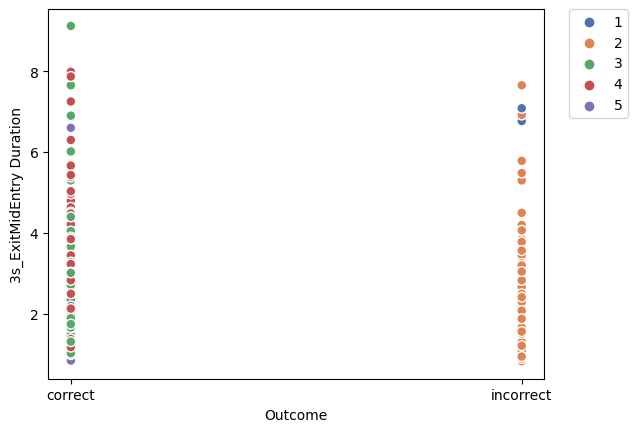

In [3516]:
sns.scatterplot(data=exitmidentry_duration_3s, x = 'Outcome', y = '3s_ExitMidEntry Duration', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

,mouse,3s_ExitMidEntry Duration,Outcome,Choice Output,New Class
0,sa199m2e,0.541667,correct,4,sa199m2e
1,sa199m2e,0.520833,correct,3,0
2,sa199m2e,0.472222,correct,3,1
3,sa199m2e,0.458333,correct,3,1
4,sa199m2e,0.472222,correct,4,2
...,...,...,...,...,...
555,sa499m3,0.220588,correct,3,2
556,sa499m3,0.565126,correct,4,2
557,sa499m3,0.554622,correct,3,0
558,sa499m3,0.268908,correct,4,2


In [4116]:
exitmidentry_duration_3s[exitmidentry_duration_3s['Outcome']=='correct']['3s_ExitMidEntry Duration'].to_csv('exitmidentry_duration_3s_cor.csv', index=False, sep = '\t')

In [3517]:
mean_exitmidentry_duration_3s = get_mean_performances(exitmidentry_duration_3s)

   mouse  3s_ExitMidEntry Duration         %   Outcome
sa199m2e                  1.180620 81.132075   correct
sa199m2e                  1.216667 81.132075 incorrect
  sa78m5                  2.711728 93.103448   correct
  sa78m5                  3.783333 93.103448 incorrect
 sa325m1                  3.047778 68.181818   correct
 sa325m1                  3.007143 68.181818 incorrect
sa196m1e                  2.481818 91.666667   correct
sa196m1e                  2.900000 91.666667 incorrect
sa199m1e                  1.589103 83.870968   correct
sa199m1e                  2.136667 83.870968 incorrect
 sa325m2                  3.986275 77.272727   correct
 sa325m2                  3.506667 77.272727 incorrect
sa196m3e                  1.948529 79.069767   correct
sa196m3e                  1.950000 79.069767 incorrect
 sa498m2                  2.431746 70.000000   correct
 sa498m2                  3.637037 70.000000 incorrect
 sa325m4                  3.464444 75.000000   correct
 sa325m4  

In [3518]:
mean_exitmidentry_duration_3s

,mouse,3s_ExitMidEntry Duration,%,Outcome
0,sa199m2e,1.180620,81.132075,correct
1,sa199m2e,1.216667,81.132075,incorrect
2,sa78m5,2.711728,93.103448,correct
3,sa78m5,3.783333,93.103448,incorrect
4,sa325m1,3.047778,68.181818,correct
5,sa325m1,3.007143,68.181818,incorrect
6,sa196m1e,2.481818,91.666667,correct
7,sa196m1e,2.900000,91.666667,incorrect
8,sa199m1e,1.589103,83.870968,correct
9,sa199m1e,2.136667,83.870968,incorrect


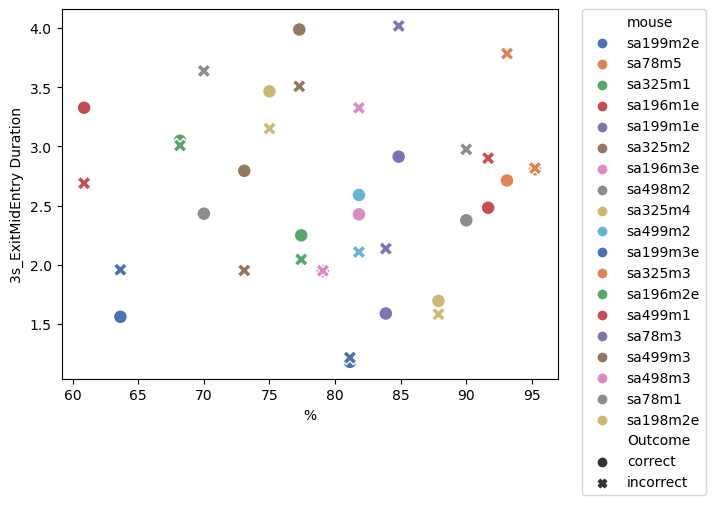

In [3519]:
sns.scatterplot(data=mean_exitmidentry_duration_3s, x = '%', y = '3s_ExitMidEntry Duration', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3520]:
middle_tortuosity_3s = get_performance(df_grouped_unscaled_ri, 'Middle Tortuosity', 3)

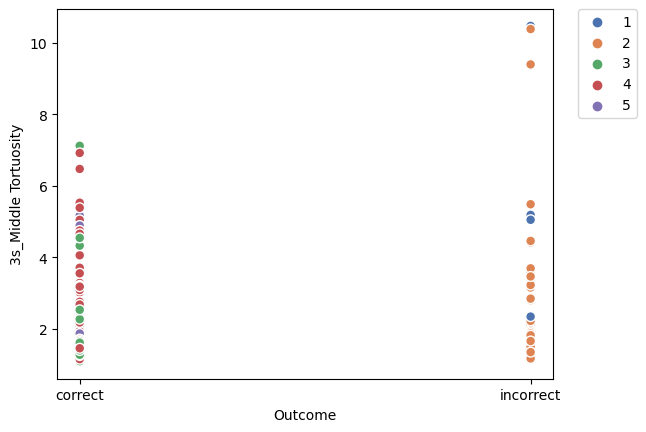

In [3521]:
sns.scatterplot(data=middle_tortuosity_3s, x = 'Outcome', y = '3s_Middle Tortuosity', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3522]:
mean_middle_tortuosity_3s = get_mean_performances(middle_tortuosity_3s)

   mouse  3s_Middle Tortuosity         %   Outcome
sa199m2e              1.475302 81.132075   correct
sa199m2e              1.416519 81.132075 incorrect
  sa78m5              2.284255 93.103448   correct
  sa78m5              5.397888 93.103448 incorrect
 sa325m1              2.606237 68.181818   correct
 sa325m1              2.382567 68.181818 incorrect
sa196m1e              1.742590 91.666667   correct
sa196m1e              2.789545 91.666667 incorrect
sa199m1e              1.413735 83.870968   correct
sa199m1e              1.818083 83.870968 incorrect
 sa325m2              1.947734 77.272727   correct
 sa325m2              2.157650 77.272727 incorrect
sa196m3e              1.635873 79.069767   correct
sa196m3e              2.751496 79.069767 incorrect
 sa498m2              1.757145 70.000000   correct
 sa498m2              3.683867 70.000000 incorrect
 sa325m4              2.817045 75.000000   correct
 sa325m4              2.113429 75.000000 incorrect
 sa499m2              1.636429 

In [3523]:
mean_middle_tortuosity_3s

,mouse,3s_Middle Tortuosity,%,Outcome
0,sa199m2e,1.475302,81.132075,correct
1,sa199m2e,1.416519,81.132075,incorrect
2,sa78m5,2.284255,93.103448,correct
3,sa78m5,5.397888,93.103448,incorrect
4,sa325m1,2.606237,68.181818,correct
5,sa325m1,2.382567,68.181818,incorrect
6,sa196m1e,1.742590,91.666667,correct
7,sa196m1e,2.789545,91.666667,incorrect
8,sa199m1e,1.413735,83.870968,correct
9,sa199m1e,1.818083,83.870968,incorrect


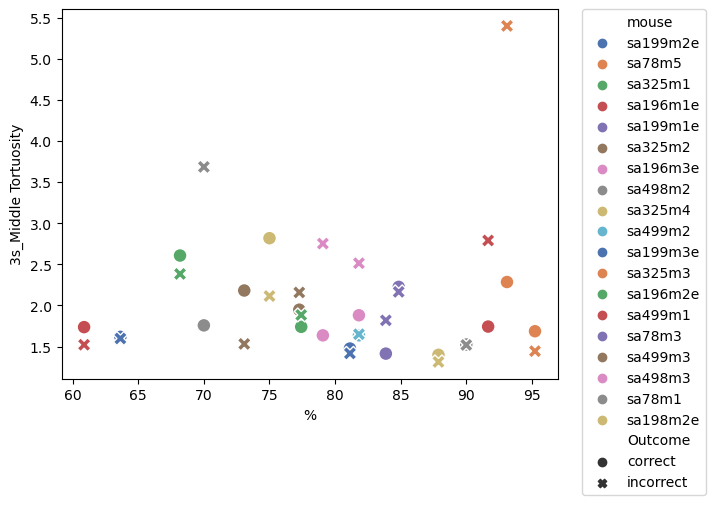

In [3524]:
sns.scatterplot(data=mean_middle_tortuosity_3s, x = '%', y = '3s_Middle Tortuosity', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3525]:
new_cur_coeff_time_prop_3s = get_performance(df_grouped_unscaled_ri, 'New Current Coeff Time Proportional', 3)

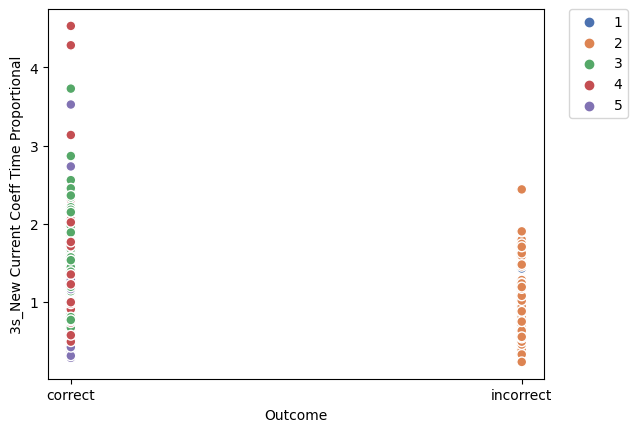

In [3526]:
sns.scatterplot(data=new_cur_coeff_time_prop_3s, x = 'Outcome', y = '3s_New Current Coeff Time Proportional', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3527]:
mean_new_cur_coeff_time_prop_3s = get_mean_performances(new_cur_coeff_time_prop_3s)

   mouse  3s_New Current Coeff Time Proportional         %   Outcome
sa199m2e                                0.646429 81.132075   correct
sa199m2e                                0.737501 81.132075 incorrect
  sa78m5                                1.134043 93.103448   correct
  sa78m5                                1.232338 93.103448 incorrect
 sa325m1                                0.920086 68.181818   correct
 sa325m1                                0.875265 68.181818 incorrect
sa196m1e                                1.133382 91.666667   correct
sa196m1e                                0.455987 91.666667 incorrect
sa199m1e                                0.834874 83.870968   correct
sa199m1e                                1.007988 83.870968 incorrect
 sa325m2                                1.667612 77.272727   correct
 sa325m2                                1.228981 77.272727 incorrect
sa196m3e                                0.860233 79.069767   correct
sa196m3e                          

In [3528]:
mean_new_cur_coeff_time_prop_3s

,mouse,3s_New Current Coeff Time Proportional,%,Outcome
0,sa199m2e,0.646429,81.132075,correct
1,sa199m2e,0.737501,81.132075,incorrect
2,sa78m5,1.134043,93.103448,correct
3,sa78m5,1.232338,93.103448,incorrect
4,sa325m1,0.920086,68.181818,correct
5,sa325m1,0.875265,68.181818,incorrect
6,sa196m1e,1.133382,91.666667,correct
7,sa196m1e,0.455987,91.666667,incorrect
8,sa199m1e,0.834874,83.870968,correct
9,sa199m1e,1.007988,83.870968,incorrect


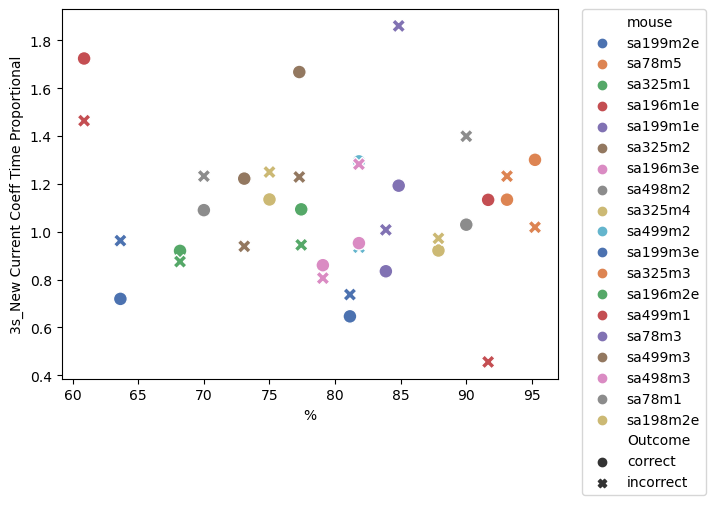

In [3529]:
sns.scatterplot(data=mean_new_cur_coeff_time_prop_3s, x = '%', y = '3s_New Current Coeff Time Proportional', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3530]:
new_current_coeff_3s = get_performance(df_grouped_unscaled_ri, 'New Current Coeff', 3)

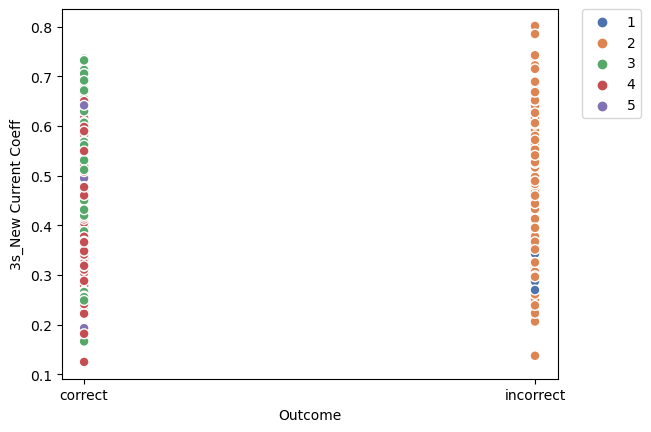

In [3531]:
sns.scatterplot(data=new_current_coeff_3s, x = 'Outcome', y = '3s_New Current Coeff', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3532]:
mean_new_current_coeff_3s = get_mean_performances(new_current_coeff_3s)

   mouse  3s_New Current Coeff         %   Outcome
sa199m2e              0.556251 81.132075   correct
sa199m2e              0.634030 81.132075 incorrect
  sa78m5              0.468107 93.103448   correct
  sa78m5              0.413757 93.103448 incorrect
 sa325m1              0.393565 68.181818   correct
 sa325m1              0.322446 68.181818 incorrect
sa196m1e              0.479965 91.666667   correct
sa196m1e              0.186034 91.666667 incorrect
sa199m1e              0.531966 83.870968   correct
sa199m1e              0.539376 83.870968 incorrect
 sa325m2              0.427346 77.272727   correct
 sa325m2              0.424496 77.272727 incorrect
sa196m3e              0.456980 79.069767   correct
sa196m3e              0.420244 79.069767 incorrect
 sa498m2              0.477955 70.000000   correct
 sa498m2              0.430600 70.000000 incorrect
 sa325m4              0.387767 75.000000   correct
 sa325m4              0.410339 75.000000 incorrect
 sa499m2              0.478496 

In [3533]:
mean_new_current_coeff_3s

,mouse,3s_New Current Coeff,%,Outcome
0,sa199m2e,0.556251,81.132075,correct
1,sa199m2e,0.634030,81.132075,incorrect
2,sa78m5,0.468107,93.103448,correct
3,sa78m5,0.413757,93.103448,incorrect
4,sa325m1,0.393565,68.181818,correct
5,sa325m1,0.322446,68.181818,incorrect
6,sa196m1e,0.479965,91.666667,correct
7,sa196m1e,0.186034,91.666667,incorrect
8,sa199m1e,0.531966,83.870968,correct
9,sa199m1e,0.539376,83.870968,incorrect


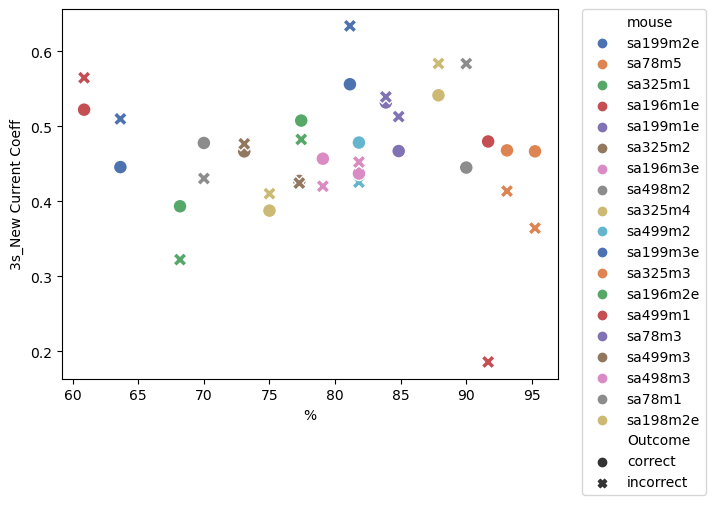

In [3534]:
sns.scatterplot(data=mean_new_current_coeff_3s, x = '%', y = '3s_New Current Coeff', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3535]:
current_coeff_3s = get_performance(df_grouped_unscaled_ri, 'Current Coeff', 3)

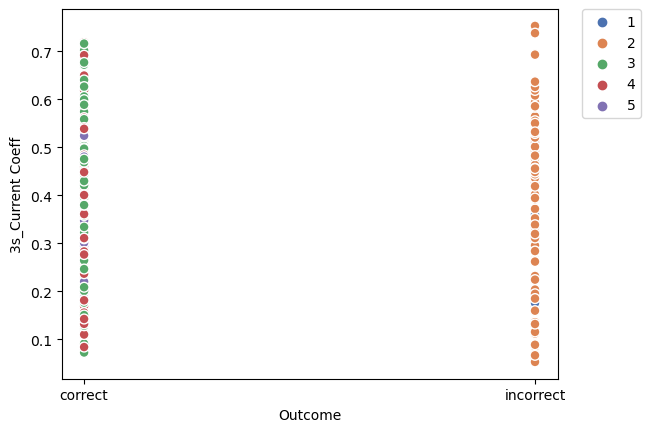

In [3536]:
sns.scatterplot(data=current_coeff_3s, x = 'Outcome', y = '3s_Current Coeff', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3537]:
mean_current_coeff_3s = get_mean_performances(current_coeff_3s)

   mouse  3s_Current Coeff         %   Outcome
sa199m2e          0.453121 81.132075   correct
sa199m2e          0.545580 81.132075 incorrect
  sa78m5          0.360798 93.103448   correct
  sa78m5          0.365317 93.103448 incorrect
 sa325m1          0.332366 68.181818   correct
 sa325m1          0.261313 68.181818 incorrect
sa196m1e          0.377655 91.666667   correct
sa196m1e          0.068226 91.666667 incorrect
sa199m1e          0.395934 83.870968   correct
sa199m1e          0.421722 83.870968 incorrect
 sa325m2          0.346862 77.272727   correct
 sa325m2          0.337370 77.272727 incorrect
sa196m3e          0.357353 79.069767   correct
sa196m3e          0.307357 79.069767 incorrect
 sa498m2          0.384266 70.000000   correct
 sa498m2          0.342221 70.000000 incorrect
 sa325m4          0.297611 75.000000   correct
 sa325m4          0.340208 75.000000 incorrect
 sa499m2          0.376607 81.818182   correct
 sa499m2          0.303704 81.818182 incorrect
sa199m3e     

In [3538]:
mean_current_coeff_3s

,mouse,3s_Current Coeff,%,Outcome
0,sa199m2e,0.453121,81.132075,correct
1,sa199m2e,0.545580,81.132075,incorrect
2,sa78m5,0.360798,93.103448,correct
3,sa78m5,0.365317,93.103448,incorrect
4,sa325m1,0.332366,68.181818,correct
5,sa325m1,0.261313,68.181818,incorrect
6,sa196m1e,0.377655,91.666667,correct
7,sa196m1e,0.068226,91.666667,incorrect
8,sa199m1e,0.395934,83.870968,correct
9,sa199m1e,0.421722,83.870968,incorrect


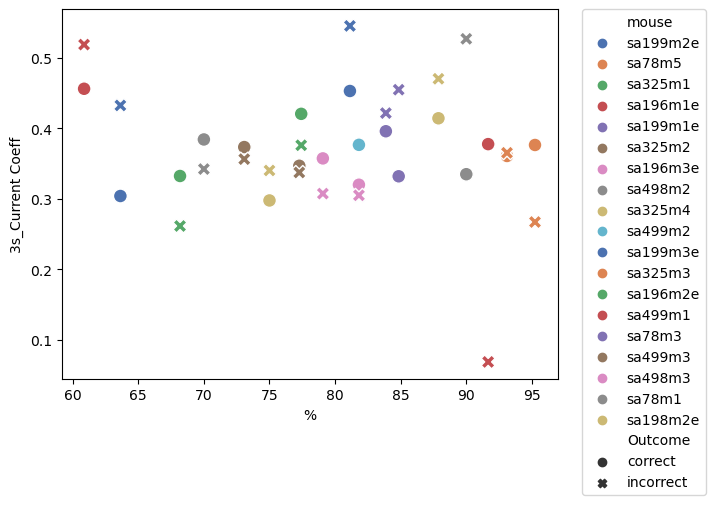

In [3539]:
sns.scatterplot(data=mean_current_coeff_3s, x = '%', y = '3s_Current Coeff', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3540]:
cur_coeff_time_prop_3s = get_performance(df_grouped_unscaled_ri, 'Current Coeff Time Proportional', 3)

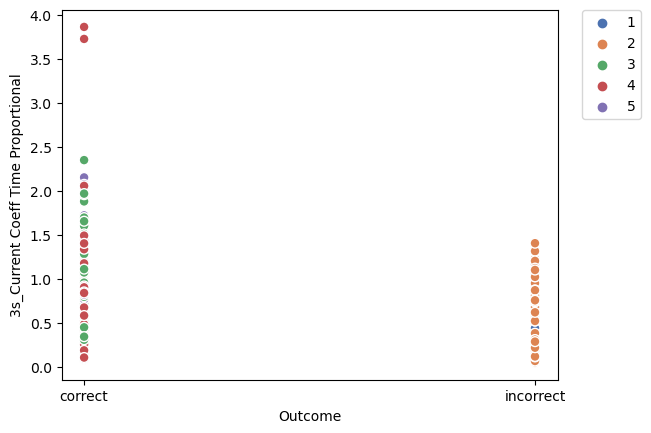

In [3541]:
sns.scatterplot(data=cur_coeff_time_prop_3s, x = 'Outcome', y = '3s_Current Coeff Time Proportional', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3542]:
mean_cur_coeff_time_prop_3s = get_mean_performances(cur_coeff_time_prop_3s)

   mouse  3s_Current Coeff Time Proportional         %   Outcome
sa199m2e                            0.313503 81.132075   correct
sa199m2e                            0.437315 81.132075 incorrect
  sa78m5                            0.691062 93.103448   correct
  sa78m5                            0.926536 93.103448 incorrect
 sa325m1                            0.578380 68.181818   correct
 sa325m1                            0.561640 68.181818 incorrect
sa196m1e                            0.604021 91.666667   correct
sa196m1e                            0.136760 91.666667 incorrect
sa199m1e                            0.412139 83.870968   correct
sa199m1e                            0.500096 83.870968 incorrect
 sa325m2                            1.015406 77.272727   correct
 sa325m2                            0.766168 77.272727 incorrect
sa196m3e                            0.495470 79.069767   correct
sa196m3e                            0.464023 79.069767 incorrect
 sa498m2                 

In [3543]:
mean_cur_coeff_time_prop_3s

,mouse,3s_Current Coeff Time Proportional,%,Outcome
0,sa199m2e,0.313503,81.132075,correct
1,sa199m2e,0.437315,81.132075,incorrect
2,sa78m5,0.691062,93.103448,correct
3,sa78m5,0.926536,93.103448,incorrect
4,sa325m1,0.578380,68.181818,correct
5,sa325m1,0.561640,68.181818,incorrect
6,sa196m1e,0.604021,91.666667,correct
7,sa196m1e,0.136760,91.666667,incorrect
8,sa199m1e,0.412139,83.870968,correct
9,sa199m1e,0.500096,83.870968,incorrect


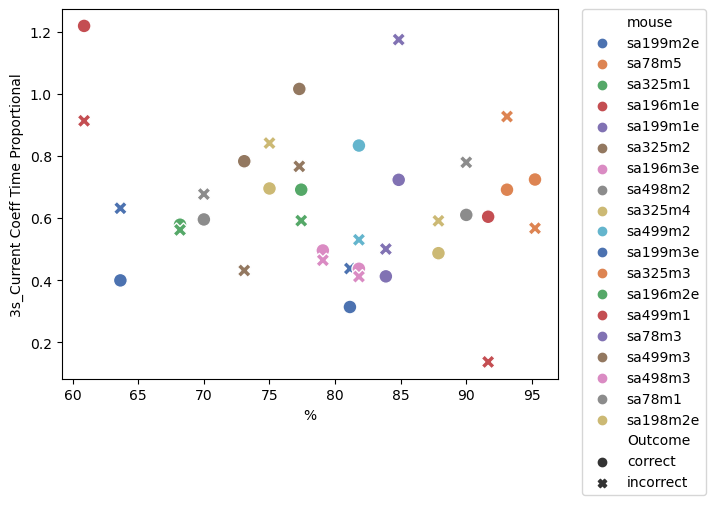

In [3544]:
sns.scatterplot(data=mean_cur_coeff_time_prop_3s, x = '%', y = '3s_Current Coeff Time Proportional', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3545]:
lagged_1_duration_3s = get_performance(df_grouped_unscaled_ri, 'lagged_1_duration', 3)

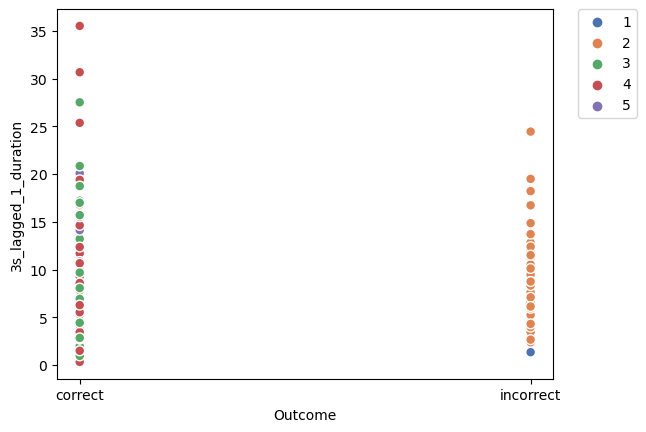

In [3546]:
sns.scatterplot(data=lagged_1_duration_3s, x = 'Outcome', y = '3s_lagged_1_duration', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3547]:
mean_lagged_1_duration_3s = get_mean_performances(lagged_1_duration_3s)

   mouse  3s_lagged_1_duration         %   Outcome
sa199m2e              4.312016 81.132075   correct
sa199m2e              4.395000 81.132075 incorrect
  sa78m5              7.131481 93.103448   correct
  sa78m5              5.466667 93.103448 incorrect
 sa325m1              9.551111 68.181818   correct
 sa325m1             10.530952 68.181818 incorrect
sa196m1e              9.387121 91.666667   correct
sa196m1e              7.916667 91.666667 incorrect
sa199m1e              7.389744 83.870968   correct
sa199m1e              7.280000 83.870968 incorrect
 sa325m2              8.705882 77.272727   correct
 sa325m2              9.053333 77.272727 incorrect
sa196m3e              5.073039 79.069767   correct
sa196m3e              4.140741 79.069767 incorrect
 sa498m2              7.552381 70.000000   correct
 sa498m2              6.431481 70.000000 incorrect
 sa325m4             11.005556 75.000000   correct
 sa325m4             10.613333 75.000000 incorrect
 sa499m2             10.375926 

In [3548]:
mean_lagged_1_duration_3s
#mean_lagged_1_duration_3s.to_csv('mean_arm_dur_past_2.csv', sep='\t', index=False)


,mouse,3s_lagged_1_duration,%,Outcome
0,sa199m2e,4.312016,81.132075,correct
1,sa199m2e,4.395000,81.132075,incorrect
2,sa78m5,7.131481,93.103448,correct
3,sa78m5,5.466667,93.103448,incorrect
4,sa325m1,9.551111,68.181818,correct
5,sa325m1,10.530952,68.181818,incorrect
6,sa196m1e,9.387121,91.666667,correct
7,sa196m1e,7.916667,91.666667,incorrect
8,sa199m1e,7.389744,83.870968,correct
9,sa199m1e,7.280000,83.870968,incorrect


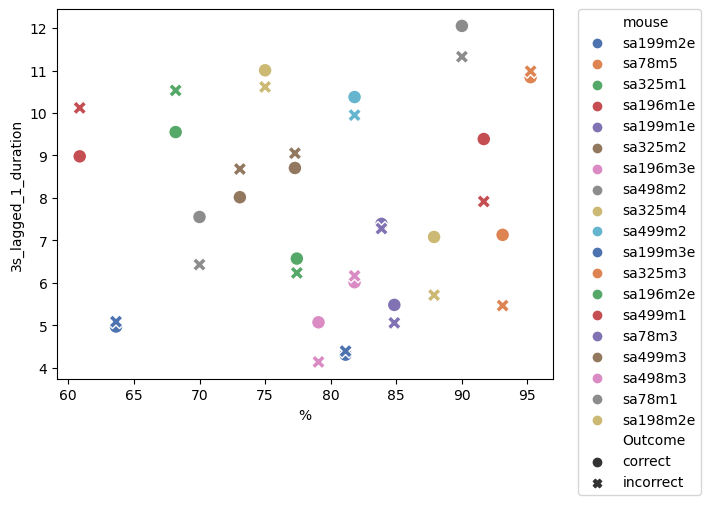

In [3549]:
sns.scatterplot(data=mean_lagged_1_duration_3s, x = '%', y = '3s_lagged_1_duration', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3550]:
lagged_1_nose_time_to_max_dist_3s = get_performance(df_grouped_unscaled_ri, 'lagged_1_nose_time_to_max_dist', 3)

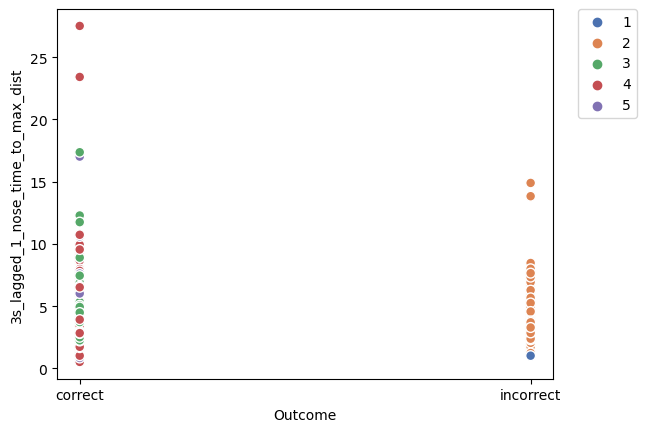

In [3551]:
sns.scatterplot(data=lagged_1_nose_time_to_max_dist_3s, x = 'Outcome', y = '3s_lagged_1_nose_time_to_max_dist', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3552]:
mean_lagged_1_nose_time_to_max_dist_3s = get_mean_performances(lagged_1_nose_time_to_max_dist_3s)

   mouse  3s_lagged_1_nose_time_to_max_dist         %   Outcome
sa199m2e                           2.643023 81.132075   correct
sa199m2e                           2.711667 81.132075 incorrect
  sa78m5                           3.930864 93.103448   correct
  sa78m5                           3.375000 93.103448 incorrect
 sa325m1                           5.040000 68.181818   correct
 sa325m1                           6.197619 68.181818 incorrect
sa196m1e                           4.748485 91.666667   correct
sa196m1e                           4.191667 91.666667 incorrect
sa199m1e                           4.202564 83.870968   correct
sa199m1e                           3.456667 83.870968 incorrect
 sa325m2                           5.697059 77.272727   correct
 sa325m2                           4.493333 77.272727 incorrect
sa196m3e                           2.900000 79.069767   correct
sa196m3e                           2.633333 79.069767 incorrect
 sa498m2                           3.476

In [3553]:
mean_lagged_1_nose_time_to_max_dist_3s

#mean_lagged_1_nose_time_to_max_dist_3s.to_csv('mean_time_to_max_past_2.csv', sep='\t', index=False)

,mouse,3s_lagged_1_nose_time_to_max_dist,%,Outcome
0,sa199m2e,2.643023,81.132075,correct
1,sa199m2e,2.711667,81.132075,incorrect
2,sa78m5,3.930864,93.103448,correct
3,sa78m5,3.375000,93.103448,incorrect
4,sa325m1,5.040000,68.181818,correct
5,sa325m1,6.197619,68.181818,incorrect
6,sa196m1e,4.748485,91.666667,correct
7,sa196m1e,4.191667,91.666667,incorrect
8,sa199m1e,4.202564,83.870968,correct
9,sa199m1e,3.456667,83.870968,incorrect


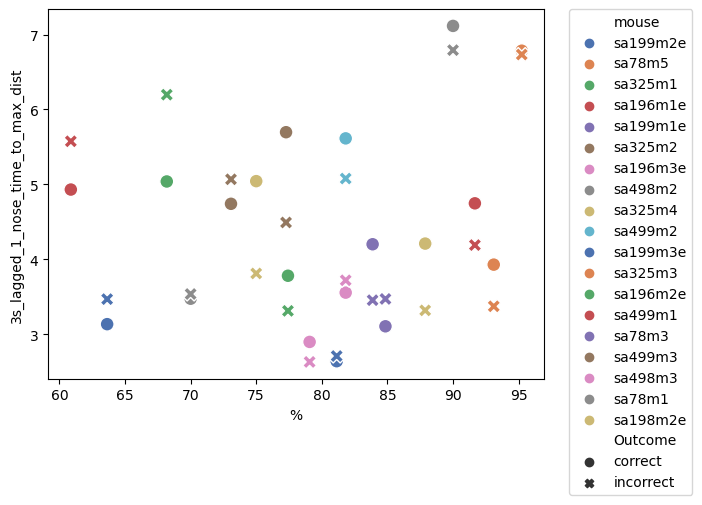

In [3554]:
sns.scatterplot(data=mean_lagged_1_nose_time_to_max_dist_3s, x = '%', y = '3s_lagged_1_nose_time_to_max_dist', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3555]:
lagged_1_arm_nose_mov_3s = get_performance(df_grouped_unscaled_ri, 'lagged_1_arm_nose_mov', 3)

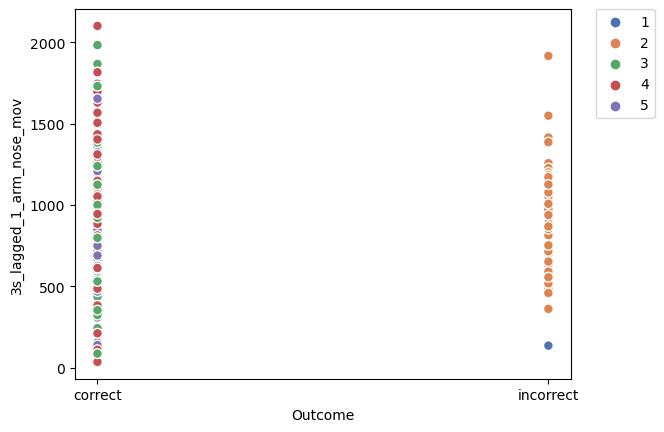

In [3556]:
sns.scatterplot(data=lagged_1_arm_nose_mov_3s, x = 'Outcome', y = '3s_lagged_1_arm_nose_mov', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3557]:
mean_lagged_1_arm_nose_mov_3s = get_mean_performances(lagged_1_arm_nose_mov_3s)

   mouse  3s_lagged_1_arm_nose_mov         %   Outcome
sa199m2e                865.618261 81.132075   correct
sa199m2e                930.166661 81.132075 incorrect
  sa78m5                975.413444 93.103448   correct
  sa78m5                943.154812 93.103448 incorrect
 sa325m1               1074.342172 68.181818   correct
 sa325m1               1126.800828 68.181818 incorrect
sa196m1e                998.726577 91.666667   correct
sa196m1e               1056.588648 91.666667 incorrect
sa199m1e               1016.273600 83.870968   correct
sa199m1e               1005.324330 83.870968 incorrect
 sa325m2                883.811513 77.272727   correct
 sa325m2                925.860141 77.272727 incorrect
sa196m3e                809.849138 79.069767   correct
sa196m3e                735.046632 79.069767 incorrect
 sa498m2                786.729154 70.000000   correct
 sa498m2                738.054483 70.000000 incorrect
 sa325m4               1117.306673 75.000000   correct
 sa325m4  

In [3558]:
mean_lagged_1_arm_nose_mov_3s

#mean_lagged_1_arm_nose_mov_3s.to_csv('dist_in_arm_past_2_nose.csv', sep='\t', index=False)

,mouse,3s_lagged_1_arm_nose_mov,%,Outcome
0,sa199m2e,865.618261,81.132075,correct
1,sa199m2e,930.166661,81.132075,incorrect
2,sa78m5,975.413444,93.103448,correct
3,sa78m5,943.154812,93.103448,incorrect
4,sa325m1,1074.342172,68.181818,correct
5,sa325m1,1126.800828,68.181818,incorrect
6,sa196m1e,998.726577,91.666667,correct
7,sa196m1e,1056.588648,91.666667,incorrect
8,sa199m1e,1016.273600,83.870968,correct
9,sa199m1e,1005.324330,83.870968,incorrect


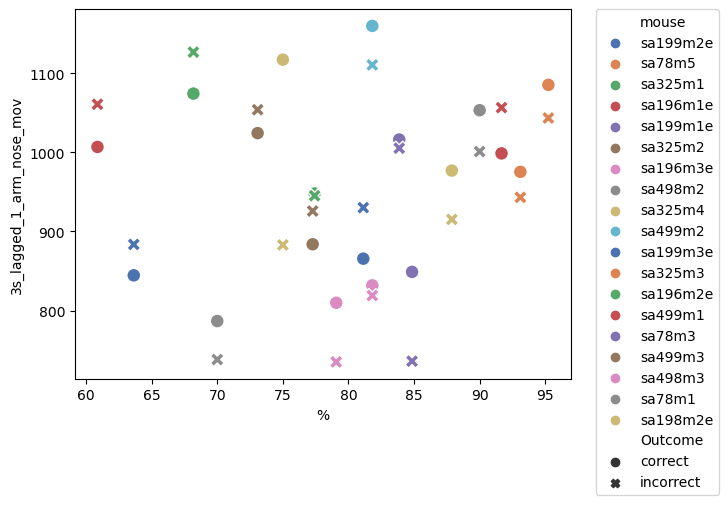

In [3559]:
sns.scatterplot(data=mean_lagged_1_arm_nose_mov_3s, x = '%', y = '3s_lagged_1_arm_nose_mov', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3560]:
lagged_1_arm_nose_vel_3s = get_performance(df_grouped_unscaled_ri, 'lagged_1_arm_nose_vel', 3)

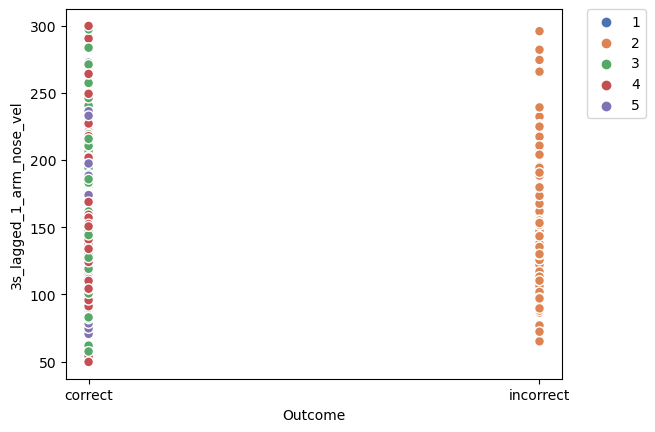

In [3561]:
sns.scatterplot(data=lagged_1_arm_nose_vel_3s, x = 'Outcome', y = '3s_lagged_1_arm_nose_vel', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3562]:
mean_lagged_1_arm_nose_vel_3s = get_mean_performances(lagged_1_arm_nose_vel_3s)

   mouse  3s_lagged_1_arm_nose_vel         %   Outcome
sa199m2e                216.604225 81.132075   correct
sa199m2e                232.823951 81.132075 incorrect
  sa78m5                146.245323 93.103448   correct
  sa78m5                172.969715 93.103448 incorrect
 sa325m1                121.078804 68.181818   correct
 sa325m1                126.926438 68.181818 incorrect
sa196m1e                122.254952 91.666667   correct
sa196m1e                139.339538 91.666667 incorrect
sa199m1e                143.147641 83.870968   correct
sa199m1e                145.738636 83.870968 incorrect
 sa325m2                103.741536 77.272727   correct
 sa325m2                 99.905320 77.272727 incorrect
sa196m3e                166.456504 79.069767   correct
sa196m3e                179.129466 79.069767 incorrect
 sa498m2                 98.338905 70.000000   correct
 sa498m2                134.731440 70.000000 incorrect
 sa325m4                113.359897 75.000000   correct
 sa325m4  

In [3563]:
mean_lagged_1_arm_nose_vel_3s
#mean_lagged_1_arm_nose_vel_3s.to_csv('mean_vel_past_2_nose.csv', sep='\t', index=False)

,mouse,3s_lagged_1_arm_nose_vel,%,Outcome
0,sa199m2e,216.604225,81.132075,correct
1,sa199m2e,232.823951,81.132075,incorrect
2,sa78m5,146.245323,93.103448,correct
3,sa78m5,172.969715,93.103448,incorrect
4,sa325m1,121.078804,68.181818,correct
5,sa325m1,126.926438,68.181818,incorrect
6,sa196m1e,122.254952,91.666667,correct
7,sa196m1e,139.339538,91.666667,incorrect
8,sa199m1e,143.147641,83.870968,correct
9,sa199m1e,145.738636,83.870968,incorrect


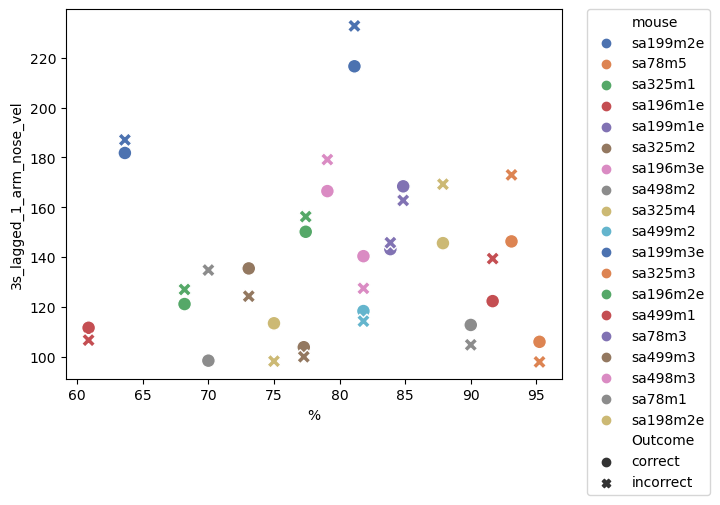

In [3564]:
sns.scatterplot(data=mean_lagged_1_arm_nose_vel_3s, x = '%', y = '3s_lagged_1_arm_nose_vel', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3565]:
lagged_1_arm_tail_mov_3s = get_performance(df_grouped_unscaled_ri, 'lagged_1_arm_tail_mov', 3)

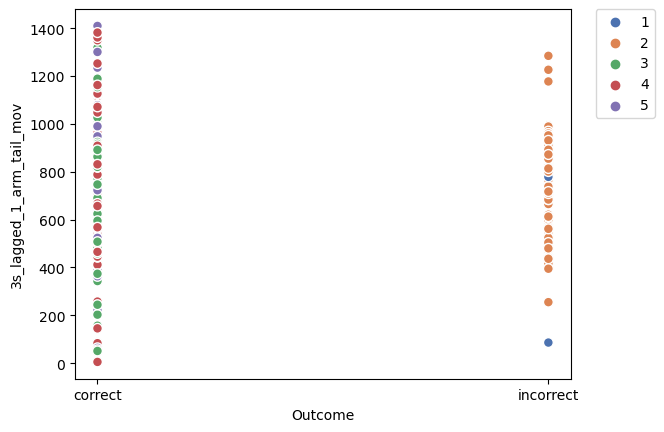

In [3566]:
sns.scatterplot(data=lagged_1_arm_tail_mov_3s, x = 'Outcome', y = '3s_lagged_1_arm_tail_mov', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3567]:
mean_lagged_1_arm_tail_mov_3s = get_mean_performances(lagged_1_arm_tail_mov_3s)

   mouse  3s_lagged_1_arm_tail_mov         %   Outcome
sa199m2e                712.719397 81.132075   correct
sa199m2e                749.340617 81.132075 incorrect
  sa78m5                773.628208 93.103448   correct
  sa78m5                813.566777 93.103448 incorrect
 sa325m1                861.239457 68.181818   correct
 sa325m1                912.248266 68.181818 incorrect
sa196m1e                734.779217 91.666667   correct
sa196m1e                785.337147 91.666667 incorrect
sa199m1e                818.999978 83.870968   correct
sa199m1e                809.370584 83.870968 incorrect
 sa325m2                704.932502 77.272727   correct
 sa325m2                710.063743 77.272727 incorrect
sa196m3e                639.898625 79.069767   correct
sa196m3e                584.926659 79.069767 incorrect
 sa498m2                608.377522 70.000000   correct
 sa498m2                576.930898 70.000000 incorrect
 sa325m4                901.558789 75.000000   correct
 sa325m4  

In [3568]:
mean_lagged_1_arm_tail_mov_3s
#mean_lagged_1_arm_tail_mov_3s.to_csv('dist_in_arm_past_2_tail.csv', sep='\t', index=False)

,mouse,3s_lagged_1_arm_tail_mov,%,Outcome
0,sa199m2e,712.719397,81.132075,correct
1,sa199m2e,749.340617,81.132075,incorrect
2,sa78m5,773.628208,93.103448,correct
3,sa78m5,813.566777,93.103448,incorrect
4,sa325m1,861.239457,68.181818,correct
5,sa325m1,912.248266,68.181818,incorrect
6,sa196m1e,734.779217,91.666667,correct
7,sa196m1e,785.337147,91.666667,incorrect
8,sa199m1e,818.999978,83.870968,correct
9,sa199m1e,809.370584,83.870968,incorrect


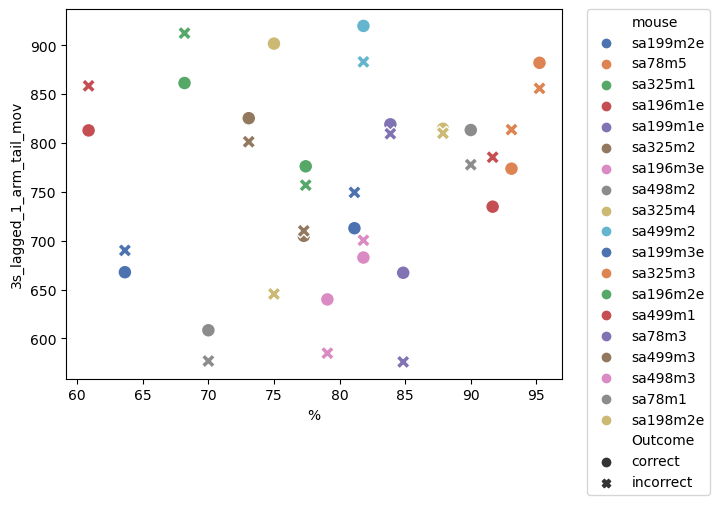

In [3569]:
sns.scatterplot(data=mean_lagged_1_arm_tail_mov_3s, x = '%', y = '3s_lagged_1_arm_tail_mov', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3570]:
lagged_1_arm_tail_vel_3s = get_performance(df_grouped_unscaled_ri, 'lagged_1_arm_tail_vel', 3)

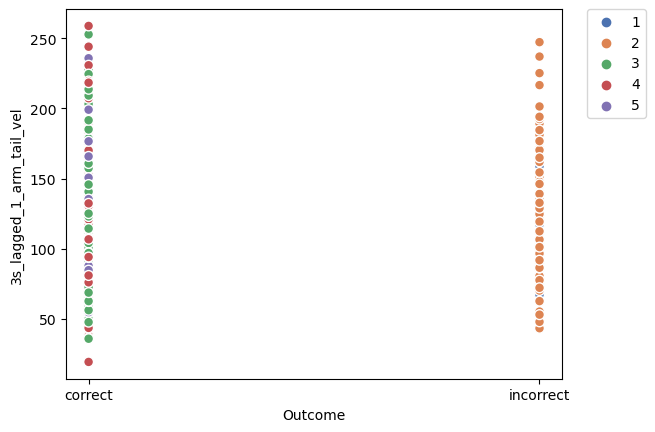

In [3571]:
sns.scatterplot(data=lagged_1_arm_tail_vel_3s, x = 'Outcome', y = '3s_lagged_1_arm_tail_vel', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3572]:
mean_lagged_1_arm_tail_vel_3s = get_mean_performances(lagged_1_arm_tail_vel_3s)

   mouse  3s_lagged_1_arm_tail_vel         %   Outcome
sa199m2e                177.101516 81.132075   correct
sa199m2e                190.599311 81.132075 incorrect
  sa78m5                112.862236 93.103448   correct
  sa78m5                149.171926 93.103448 incorrect
 sa325m1                 96.198994 68.181818   correct
 sa325m1                103.670092 68.181818 incorrect
sa196m1e                 87.370089 91.666667   correct
sa196m1e                105.033415 91.666667 incorrect
sa199m1e                116.542035 83.870968   correct
sa199m1e                119.540588 83.870968 incorrect
 sa325m2                 82.500105 77.272727   correct
 sa325m2                 76.405486 77.272727 incorrect
sa196m3e                124.385201 79.069767   correct
sa196m3e                140.104328 79.069767 incorrect
 sa498m2                 72.792853 70.000000   correct
 sa498m2                 86.585605 70.000000 incorrect
 sa325m4                 94.308694 75.000000   correct
 sa325m4  

In [3573]:
mean_lagged_1_arm_tail_vel_3s
#mean_lagged_1_arm_tail_vel_3s.to_csv('mean_vel_past_2_tail.csv', sep='\t', index=False)

,mouse,3s_lagged_1_arm_tail_vel,%,Outcome
0,sa199m2e,177.101516,81.132075,correct
1,sa199m2e,190.599311,81.132075,incorrect
2,sa78m5,112.862236,93.103448,correct
3,sa78m5,149.171926,93.103448,incorrect
4,sa325m1,96.198994,68.181818,correct
5,sa325m1,103.670092,68.181818,incorrect
6,sa196m1e,87.370089,91.666667,correct
7,sa196m1e,105.033415,91.666667,incorrect
8,sa199m1e,116.542035,83.870968,correct
9,sa199m1e,119.540588,83.870968,incorrect


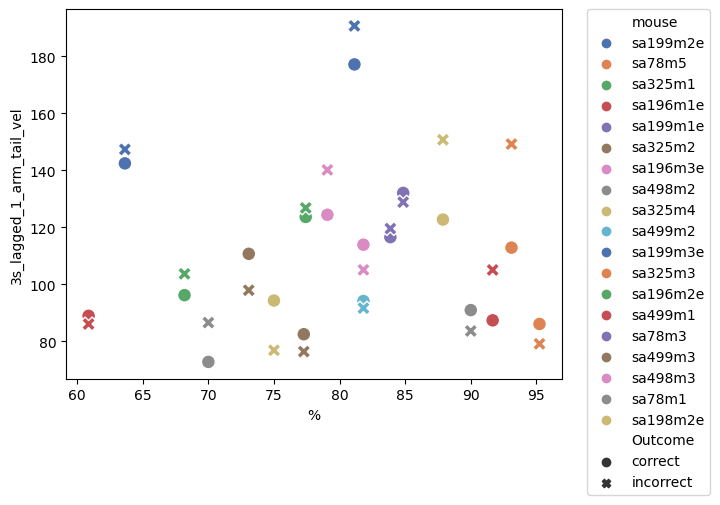

In [3574]:
sns.scatterplot(data=mean_lagged_1_arm_tail_vel_3s, x = '%', y = '3s_lagged_1_arm_tail_vel', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3575]:
lagged_1_entry_tortuosity_3s = get_performance(df_grouped_unscaled_ri, 'lagged_1_entry_tortuosity', 3)

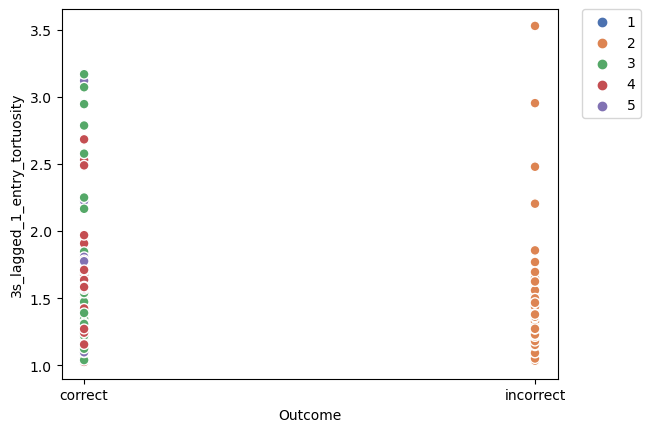

In [3576]:
sns.scatterplot(data=lagged_1_entry_tortuosity_3s, x = 'Outcome', y = '3s_lagged_1_entry_tortuosity', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3577]:
mean_lagged_1_entry_tortuosity_3s = get_mean_performances(lagged_1_entry_tortuosity_3s)

   mouse  3s_lagged_1_entry_tortuosity         %   Outcome
sa199m2e                      1.246134 81.132075   correct
sa199m2e                      1.276678 81.132075 incorrect
  sa78m5                      1.354919 93.103448   correct
  sa78m5                      1.243592 93.103448 incorrect
 sa325m1                      1.448156 68.181818   correct
 sa325m1                      1.521491 68.181818 incorrect
sa196m1e                      1.478661 91.666667   correct
sa196m1e                      1.405064 91.666667 incorrect
sa199m1e                      1.281673 83.870968   correct
sa199m1e                      1.207332 83.870968 incorrect
 sa325m2                      1.520594 77.272727   correct
 sa325m2                      1.431836 77.272727 incorrect
sa196m3e                      1.266745 79.069767   correct
sa196m3e                      1.260318 79.069767 incorrect
 sa498m2                      1.542415 70.000000   correct
 sa498m2                      1.498806 70.000000 incorre

In [3578]:
mean_lagged_1_entry_tortuosity_3s

,mouse,3s_lagged_1_entry_tortuosity,%,Outcome
0,sa199m2e,1.246134,81.132075,correct
1,sa199m2e,1.276678,81.132075,incorrect
2,sa78m5,1.354919,93.103448,correct
3,sa78m5,1.243592,93.103448,incorrect
4,sa325m1,1.448156,68.181818,correct
5,sa325m1,1.521491,68.181818,incorrect
6,sa196m1e,1.478661,91.666667,correct
7,sa196m1e,1.405064,91.666667,incorrect
8,sa199m1e,1.281673,83.870968,correct
9,sa199m1e,1.207332,83.870968,incorrect


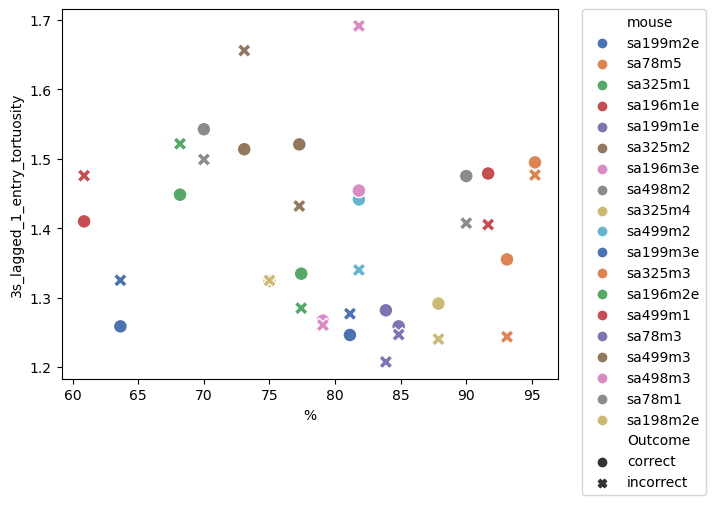

In [3579]:
sns.scatterplot(data=mean_lagged_1_entry_tortuosity_3s, x = '%', y = '3s_lagged_1_entry_tortuosity', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3580]:
lagged_1_exit_tortuosity_3s = get_performance(df_grouped_unscaled_ri, 'lagged_1_exit_tortuosity', 3)

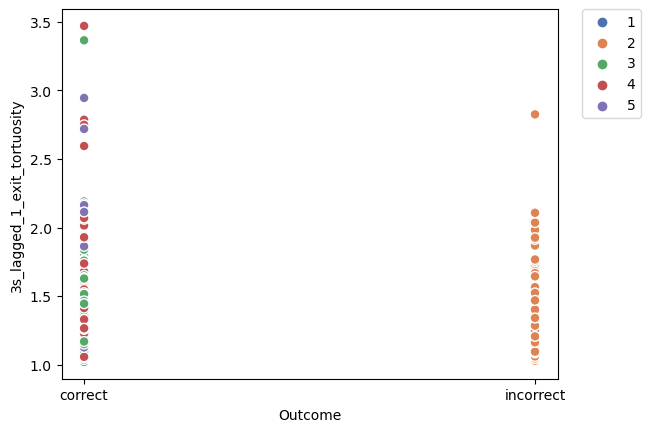

In [3581]:
sns.scatterplot(data=lagged_1_exit_tortuosity_3s, x = 'Outcome', y = '3s_lagged_1_exit_tortuosity', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [4123]:
lagged_1_exit_tortuosity_3s.to_csv('exit_tortuosity_3s_all.csv', index=False, sep='\t')

In [4122]:
sum(lagged_1_exit_tortuosity_3s['Outcome']=='incorrect')

115

In [4118]:
lagged_1_exit_tortuosity_3s[lagged_1_exit_tortuosity_3s['Outcome']=='incorrect']['3s_lagged_1_exit_tortuosity'].to_csv('lagged_1_exit_tortuosity_3s_inc.csv', index=False, sep = '\t')

In [3582]:
mean_lagged_1_exit_tortuosity_3s = get_mean_performances(lagged_1_exit_tortuosity_3s)

   mouse  3s_lagged_1_exit_tortuosity         %   Outcome
sa199m2e                     1.184268 81.132075   correct
sa199m2e                     1.185817 81.132075 incorrect
  sa78m5                     1.371360 93.103448   correct
  sa78m5                     1.105522 93.103448 incorrect
 sa325m1                     1.535499 68.181818   correct
 sa325m1                     1.436592 68.181818 incorrect
sa196m1e                     1.493753 91.666667   correct
sa196m1e                     1.363068 91.666667 incorrect
sa199m1e                     1.252070 83.870968   correct
sa199m1e                     1.340091 83.870968 incorrect
 sa325m2                     1.406519 77.272727   correct
 sa325m2                     1.684449 77.272727 incorrect
sa196m3e                     1.276959 79.069767   correct
sa196m3e                     1.137982 79.069767 incorrect
 sa498m2                     1.530854 70.000000   correct
 sa498m2                     1.376029 70.000000 incorrect
 sa325m4      

In [3583]:
mean_lagged_1_exit_tortuosity_3s

#mean_lagged_1_exit_tortuosity_3s.to_csv('mean_exit_tortuosity_past_2.csv', sep='\t', index=False)

,mouse,3s_lagged_1_exit_tortuosity,%,Outcome
0,sa199m2e,1.184268,81.132075,correct
1,sa199m2e,1.185817,81.132075,incorrect
2,sa78m5,1.371360,93.103448,correct
3,sa78m5,1.105522,93.103448,incorrect
4,sa325m1,1.535499,68.181818,correct
5,sa325m1,1.436592,68.181818,incorrect
6,sa196m1e,1.493753,91.666667,correct
7,sa196m1e,1.363068,91.666667,incorrect
8,sa199m1e,1.252070,83.870968,correct
9,sa199m1e,1.340091,83.870968,incorrect


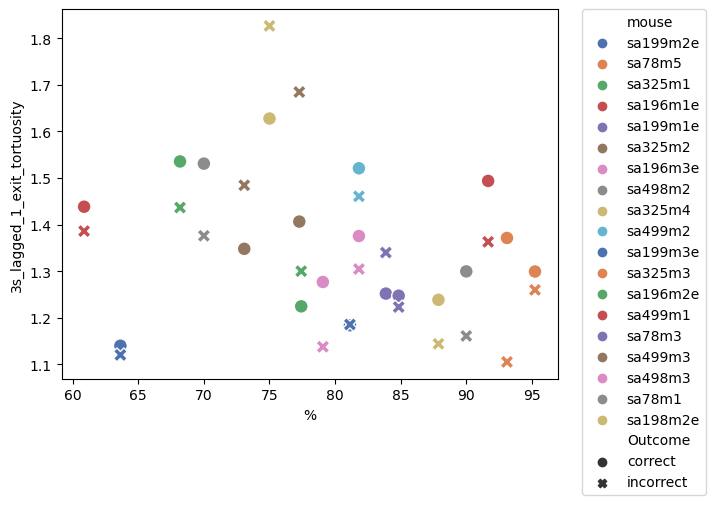

In [3584]:
sns.scatterplot(data=mean_lagged_1_exit_tortuosity_3s, x = '%', y = '3s_lagged_1_exit_tortuosity', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [4128]:
lagged_1_other_tortuosity_3s = get_performance(df_grouped_unscaled_ri, 'lagged_1_other_tortuosity', 3)

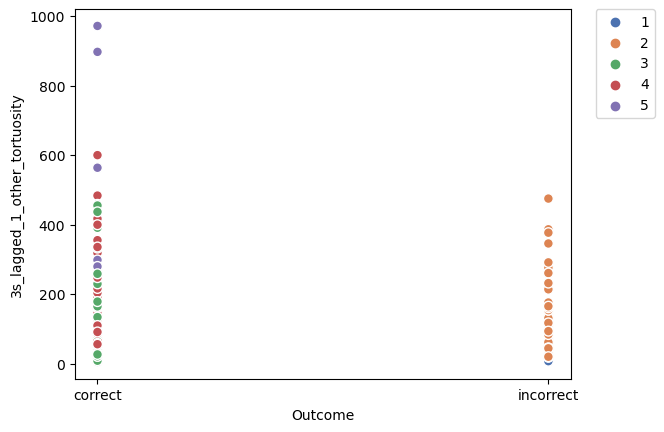

In [4129]:
sns.scatterplot(data=lagged_1_other_tortuosity_3s, x = 'Outcome', y = '3s_lagged_1_other_tortuosity', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [4130]:
mean_lagged_1_other_tortuosity_3s = get_mean_performances(lagged_1_other_tortuosity_3s)

   mouse  3s_lagged_1_other_tortuosity         %   Outcome
sa199m2e                     62.198025 81.132075   correct
sa199m2e                    116.039170 81.132075 incorrect
  sa78m5                    103.735609 93.103448   correct
  sa78m5                    264.657075 93.103448 incorrect
 sa325m1                     90.258111 68.181818   correct
 sa325m1                     95.027683 68.181818 incorrect
sa196m1e                    115.589054 91.666667   correct
sa196m1e                    137.147933 91.666667 incorrect
sa199m1e                     94.803655 83.870968   correct
sa199m1e                     92.525074 83.870968 incorrect
 sa325m2                     64.289434 77.272727   correct
 sa325m2                     81.565288 77.272727 incorrect
sa196m3e                     65.811700 79.069767   correct
sa196m3e                     46.600189 79.069767 incorrect
 sa498m2                     84.347390 70.000000   correct
 sa498m2                     77.729113 70.000000 incorre

In [4131]:
mean_lagged_1_other_tortuosity_3s


,mouse,3s_lagged_1_other_tortuosity,%,Outcome
0,sa199m2e,62.198025,81.132075,correct
1,sa199m2e,116.039170,81.132075,incorrect
2,sa78m5,103.735609,93.103448,correct
3,sa78m5,264.657075,93.103448,incorrect
4,sa325m1,90.258111,68.181818,correct
5,sa325m1,95.027683,68.181818,incorrect
6,sa196m1e,115.589054,91.666667,correct
7,sa196m1e,137.147933,91.666667,incorrect
8,sa199m1e,94.803655,83.870968,correct
9,sa199m1e,92.525074,83.870968,incorrect


In [4132]:
mean_lagged_1_other_tortuosity_3s[mean_lagged_1_other_tortuosity_3s['Outcome']=='correct']

,mouse,3s_lagged_1_other_tortuosity,%,Outcome
0,sa199m2e,62.198025,81.132075,correct
2,sa78m5,103.735609,93.103448,correct
4,sa325m1,90.258111,68.181818,correct
6,sa196m1e,115.589054,91.666667,correct
8,sa199m1e,94.803655,83.870968,correct
10,sa325m2,64.289434,77.272727,correct
12,sa196m3e,65.811700,79.069767,correct
14,sa498m2,84.347390,70.000000,correct
16,sa325m4,87.202220,75.000000,correct
18,sa499m2,71.750224,81.818182,correct


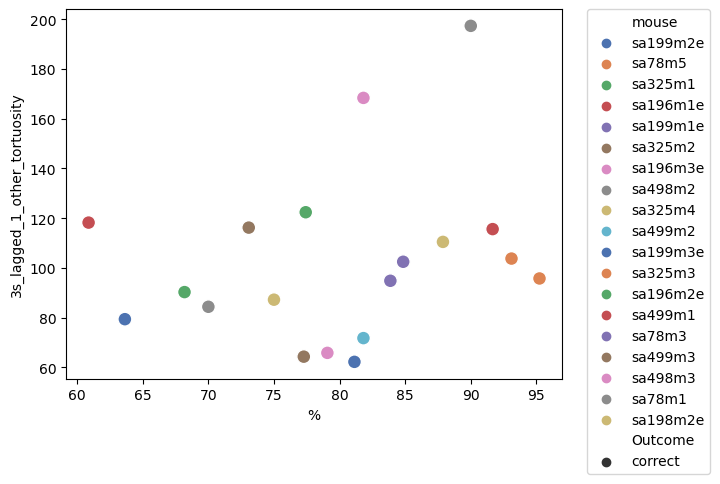

In [4133]:
sns.scatterplot(data=mean_lagged_1_other_tortuosity_3s[mean_lagged_1_other_tortuosity_3s['Outcome']=='correct'], x = '%', y = '3s_lagged_1_other_tortuosity', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3590]:
entry_latency_3s = get_performance(df_grouped_unscaled_ri, 'Entry Latency', 3)

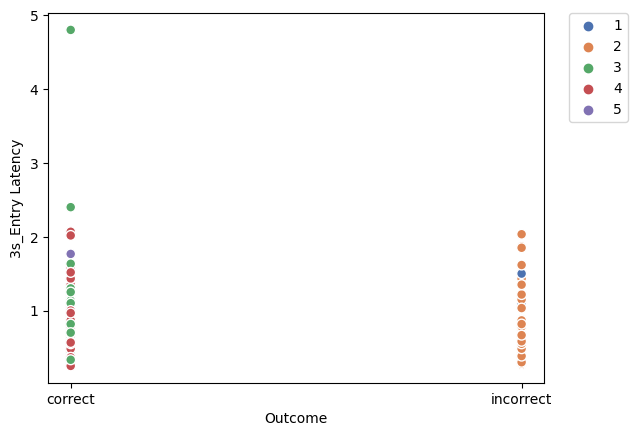

In [3591]:
sns.scatterplot(data=entry_latency_3s, x = 'Outcome', y = '3s_Entry Latency', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3592]:
mean_entry_latency_3s = get_mean_performances(entry_latency_3s)

   mouse  3s_Entry Latency         %   Outcome
sa199m2e          0.469767 81.132075   correct
sa199m2e          0.400000 81.132075 incorrect
  sa78m5          0.611111 93.103448   correct
  sa78m5          0.425000 93.103448 incorrect
 sa325m1          0.553333 68.181818   correct
 sa325m1          0.566667 68.181818 incorrect
sa196m1e          0.743939 91.666667   correct
sa196m1e          0.525000 91.666667 incorrect
sa199m1e          0.568590 83.870968   correct
sa199m1e          0.703333 83.870968 incorrect
 sa325m2          1.087255 77.272727   correct
 sa325m2          0.683333 77.272727 incorrect
sa196m3e          0.581373 79.069767   correct
sa196m3e          0.546296 79.069767 incorrect
 sa498m2          0.784921 70.000000   correct
 sa498m2          0.937037 70.000000 incorrect
 sa325m4          0.771111 75.000000   correct
 sa325m4          0.620000 75.000000 incorrect
 sa499m2          0.742593 81.818182   correct
 sa499m2          0.641667 81.818182 incorrect
sa199m3e     

In [3593]:
mean_entry_latency_3s

,mouse,3s_Entry Latency,%,Outcome
0,sa199m2e,0.469767,81.132075,correct
1,sa199m2e,0.400000,81.132075,incorrect
2,sa78m5,0.611111,93.103448,correct
3,sa78m5,0.425000,93.103448,incorrect
4,sa325m1,0.553333,68.181818,correct
5,sa325m1,0.566667,68.181818,incorrect
6,sa196m1e,0.743939,91.666667,correct
7,sa196m1e,0.525000,91.666667,incorrect
8,sa199m1e,0.568590,83.870968,correct
9,sa199m1e,0.703333,83.870968,incorrect


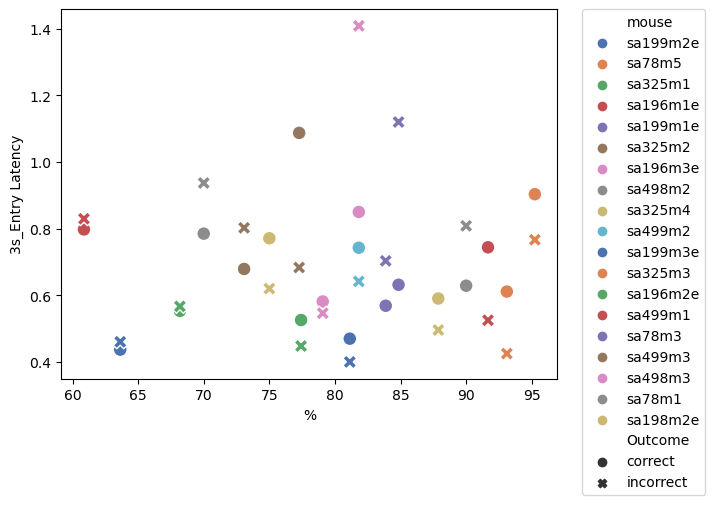

In [3594]:
sns.scatterplot(data=mean_entry_latency_3s, x = '%', y = '3s_Entry Latency', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3595]:
lagged_1_new_cur_coeff_3s = get_performance(df_grouped_unscaled_ri, 'New Lagged 1 Cur Coeff', 3)

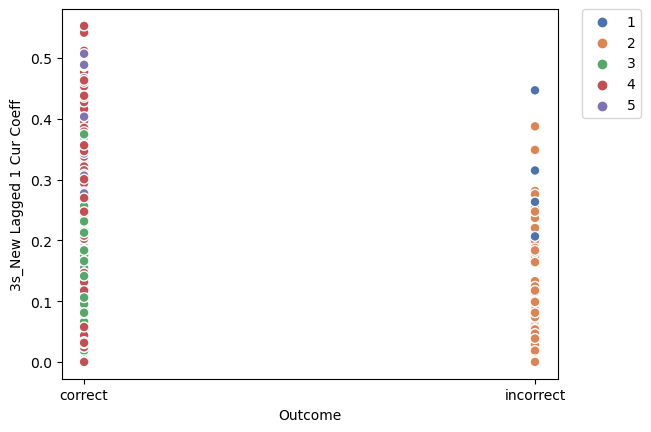

In [3596]:
sns.scatterplot(data=lagged_1_new_cur_coeff_3s, x = 'Outcome', y = '3s_New Lagged 1 Cur Coeff', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3597]:
mean_lagged_1_new_cur_coeff_3s = get_mean_performances(lagged_1_new_cur_coeff_3s)

   mouse  3s_New Lagged 1 Cur Coeff         %   Outcome
sa199m2e                   0.122168 81.132075   correct
sa199m2e                   0.032990 81.132075 incorrect
  sa78m5                   0.175741 93.103448   correct
  sa78m5                   0.106658 93.103448 incorrect
 sa325m1                   0.226964 68.181818   correct
 sa325m1                   0.173318 68.181818 incorrect
sa196m1e                   0.212544 91.666667   correct
sa196m1e                   0.066327 91.666667 incorrect
sa199m1e                   0.182364 83.870968   correct
sa199m1e                   0.061139 83.870968 incorrect
 sa325m2                   0.165457 77.272727   correct
 sa325m2                   0.095546 77.272727 incorrect
sa196m3e                   0.143542 79.069767   correct
sa196m3e                   0.165559 79.069767 incorrect
 sa498m2                   0.163242 70.000000   correct
 sa498m2                   0.141965 70.000000 incorrect
 sa325m4                   0.245369 75.000000   

In [3598]:
mean_lagged_1_new_cur_coeff_3s

,mouse,3s_New Lagged 1 Cur Coeff,%,Outcome
0,sa199m2e,0.122168,81.132075,correct
1,sa199m2e,0.032990,81.132075,incorrect
2,sa78m5,0.175741,93.103448,correct
3,sa78m5,0.106658,93.103448,incorrect
4,sa325m1,0.226964,68.181818,correct
5,sa325m1,0.173318,68.181818,incorrect
6,sa196m1e,0.212544,91.666667,correct
7,sa196m1e,0.066327,91.666667,incorrect
8,sa199m1e,0.182364,83.870968,correct
9,sa199m1e,0.061139,83.870968,incorrect


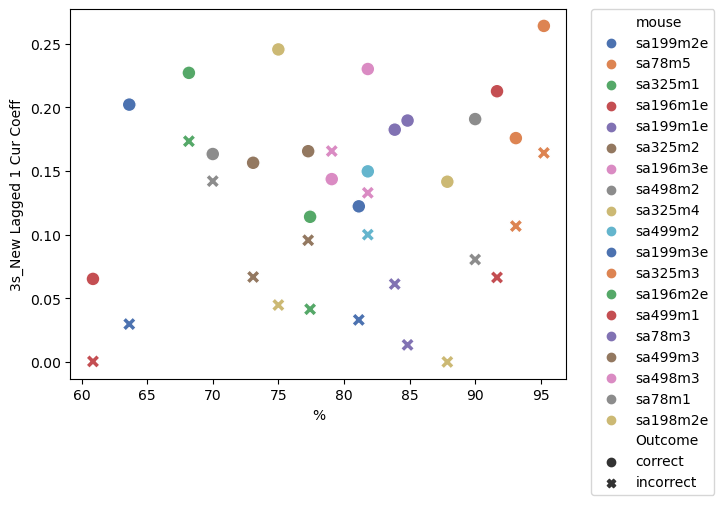

In [3599]:
sns.scatterplot(data=mean_lagged_1_new_cur_coeff_3s, x = '%', y = '3s_New Lagged 1 Cur Coeff', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3600]:
middle_duration_3s = get_performance(df_grouped_unscaled_ri, 'Middle Duration', 3)

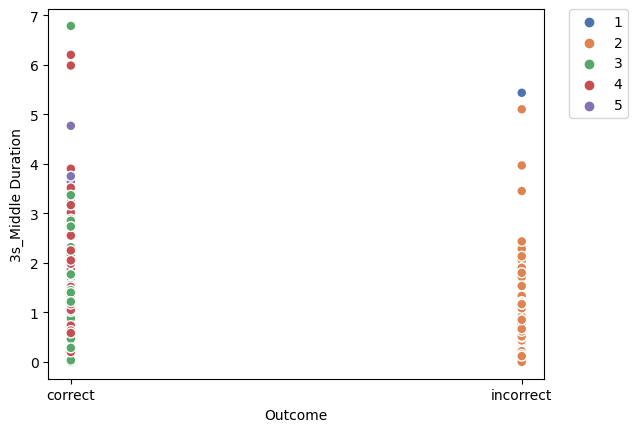

In [3601]:
sns.scatterplot(data=middle_duration_3s, x = 'Outcome', y = '3s_Middle Duration', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3602]:
mean_middle_duration_3s = get_mean_performances(middle_duration_3s)

   mouse  3s_Middle Duration         %   Outcome
sa199m2e            0.400775 81.132075   correct
sa199m2e            0.508333 81.132075 incorrect
  sa78m5            1.214198 93.103448   correct
  sa78m5            2.091667 93.103448 incorrect
 sa325m1            0.351111 68.181818   correct
 sa325m1            0.433333 68.181818 incorrect
sa196m1e            0.658333 91.666667   correct
sa196m1e            0.608333 91.666667 incorrect
sa199m1e            0.533974 83.870968   correct
sa199m1e            0.950000 83.870968 incorrect
 sa325m2            1.227451 77.272727   correct
 sa325m2            1.310000 77.272727 incorrect
sa196m3e            0.862255 79.069767   correct
sa196m3e            0.761111 79.069767 incorrect
 sa498m2            0.652381 70.000000   correct
 sa498m2            1.870370 70.000000 incorrect
 sa325m4            0.721111 75.000000   correct
 sa325m4            0.633333 75.000000 incorrect
 sa499m2            1.287037 81.818182   correct
 sa499m2            

In [3603]:
mean_middle_duration_3s

,mouse,3s_Middle Duration,%,Outcome
0,sa199m2e,0.400775,81.132075,correct
1,sa199m2e,0.508333,81.132075,incorrect
2,sa78m5,1.214198,93.103448,correct
3,sa78m5,2.091667,93.103448,incorrect
4,sa325m1,0.351111,68.181818,correct
5,sa325m1,0.433333,68.181818,incorrect
6,sa196m1e,0.658333,91.666667,correct
7,sa196m1e,0.608333,91.666667,incorrect
8,sa199m1e,0.533974,83.870968,correct
9,sa199m1e,0.950000,83.870968,incorrect


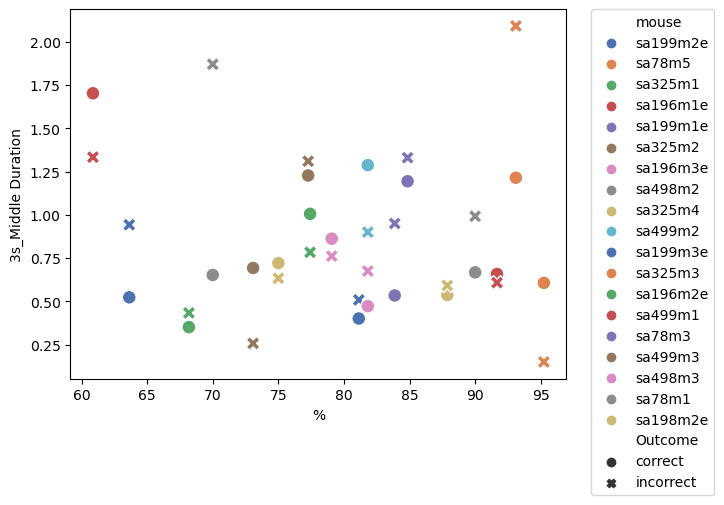

In [3604]:
sns.scatterplot(data=mean_middle_duration_3s, x = '%', y = '3s_Middle Duration', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3605]:
lagged_1_duration_4s = get_performance(df_grouped_unscaled_ri, 'lagged_1_duration', 4)

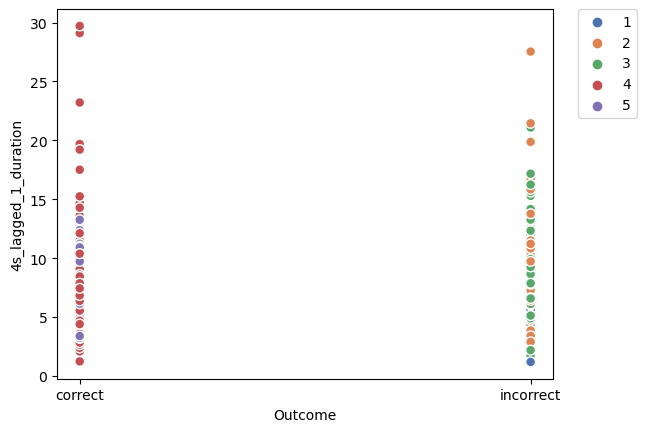

In [3606]:
sns.scatterplot(data=lagged_1_duration_4s, x = 'Outcome', y = '4s_lagged_1_duration', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3607]:
mean_lagged_1_duration_4s = get_mean_performances(lagged_1_duration_4s)

   mouse  4s_lagged_1_duration         %   Outcome
sa199m2e              4.452222 38.461538   correct
sa199m2e              4.276736 38.461538 incorrect
  sa78m5              7.208466 75.000000   correct
  sa78m5              6.773016 75.000000 incorrect
 sa325m1              9.872222 28.571429   correct
 sa325m1              9.692593 28.571429 incorrect
sa196m1e              8.682906 56.521739   correct
sa196m1e             10.161111 56.521739 incorrect
sa199m1e              7.198148 40.000000   correct
sa199m1e              7.470988 40.000000 incorrect
 sa325m2              6.958730 33.333333   correct
 sa325m2              9.370635 33.333333 incorrect
sa196m3e              5.230159 33.333333   correct
sa196m3e              4.698413 33.333333 incorrect
 sa498m2              8.643519 41.379310   correct
 sa498m2              6.390850 41.379310 incorrect
 sa325m4             11.645455 57.894737   correct
 sa325m4             10.526389 57.894737 incorrect
 sa499m2             10.459259 

In [3608]:
mean_lagged_1_duration_4s

,mouse,4s_lagged_1_duration,%,Outcome
0,sa199m2e,4.452222,38.461538,correct
1,sa199m2e,4.276736,38.461538,incorrect
2,sa78m5,7.208466,75.000000,correct
3,sa78m5,6.773016,75.000000,incorrect
4,sa325m1,9.872222,28.571429,correct
5,sa325m1,9.692593,28.571429,incorrect
6,sa196m1e,8.682906,56.521739,correct
7,sa196m1e,10.161111,56.521739,incorrect
8,sa199m1e,7.198148,40.000000,correct
9,sa199m1e,7.470988,40.000000,incorrect


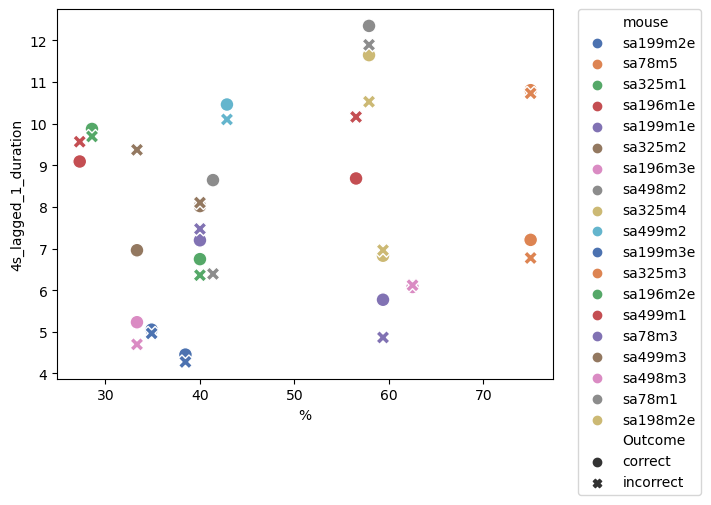

In [3609]:
sns.scatterplot(data=mean_lagged_1_duration_4s, x = '%', y = '4s_lagged_1_duration', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3610]:
lagged_1_duration_5s = get_performance(df_grouped_unscaled_ri, 'lagged_1_duration', 5)

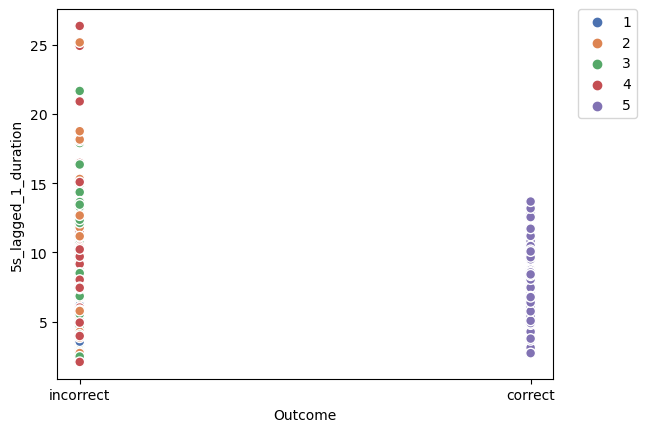

In [3611]:
sns.scatterplot(data=lagged_1_duration_5s, x = 'Outcome', y = '5s_lagged_1_duration', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3612]:
mean_lagged_1_duration_5s = get_mean_performances(lagged_1_duration_5s)

   mouse  5s_lagged_1_duration         %   Outcome
sa199m2e              4.025000  3.921569   correct
sa199m2e              4.370918  3.921569 incorrect
  sa78m5              7.312500 37.037037   correct
  sa78m5              7.154412 37.037037 incorrect
 sa325m1             12.758333  5.000000   correct
 sa325m1              9.525439  5.000000 incorrect
sa196m1e              9.966667  9.090909   correct
sa196m1e              9.413333  9.090909 incorrect
sa199m1e              7.045833  6.896552   correct
sa199m1e              7.398148  6.896552 incorrect
 sa325m2              7.312500 10.000000   correct
 sa325m2              8.659722 10.000000 incorrect
sa196m3e              6.358333  7.317073   correct
sa196m3e              4.771930  7.317073 incorrect
 sa498m2              9.925000 14.285714   correct
 sa498m2              7.007986 14.285714 incorrect
 sa325m4              6.825000  5.555556   correct
 sa325m4             11.136275  5.555556 incorrect
 sa499m2             10.602083 

C:\Users\Josue Regalado\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\Josue Regalado\anaconda3\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


In [3613]:
mean_lagged_1_duration_5s

,mouse,5s_lagged_1_duration,%,Outcome
0,sa199m2e,4.025000,3.921569,correct
1,sa199m2e,4.370918,3.921569,incorrect
2,sa78m5,7.312500,37.037037,correct
3,sa78m5,7.154412,37.037037,incorrect
4,sa325m1,12.758333,5.000000,correct
5,sa325m1,9.525439,5.000000,incorrect
6,sa196m1e,9.966667,9.090909,correct
7,sa196m1e,9.413333,9.090909,incorrect
8,sa199m1e,7.045833,6.896552,correct
9,sa199m1e,7.398148,6.896552,incorrect


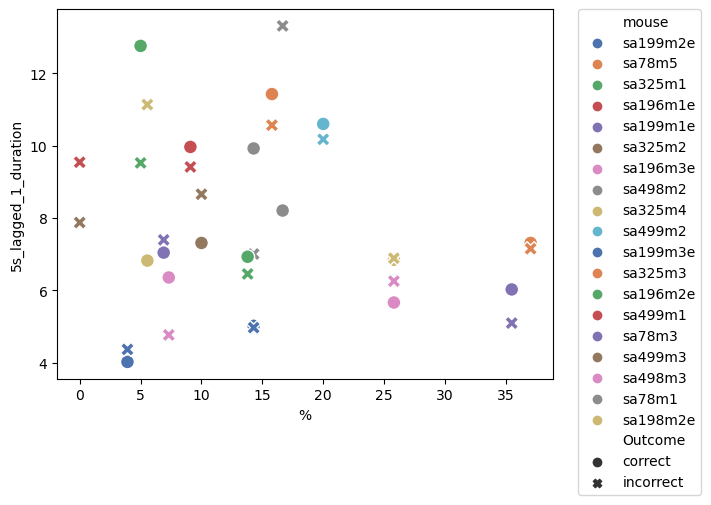

In [3614]:
sns.scatterplot(data=mean_lagged_1_duration_5s, x = '%', y = '5s_lagged_1_duration', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3615]:
# 4s

In [3616]:
exitmidentry_duration_4s = get_performance(df_grouped_unscaled_ri, 'ExitMidEntry Duration', 4)

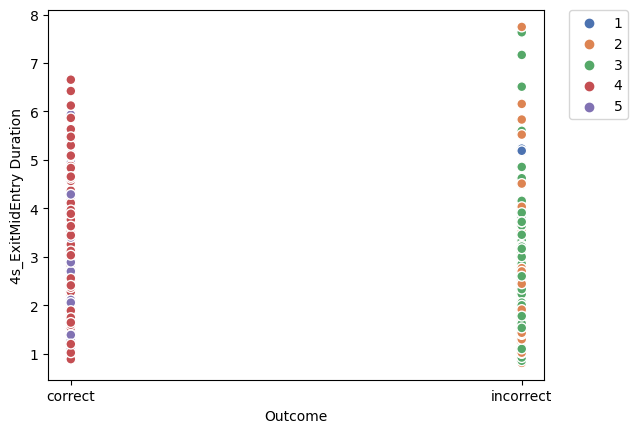

In [3617]:
sns.scatterplot(data=exitmidentry_duration_4s, x = 'Outcome', y = '4s_ExitMidEntry Duration', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3618]:
mean_exitmidentry_duration_4s = get_mean_performances(exitmidentry_duration_4s)

   mouse  4s_ExitMidEntry Duration         %   Outcome
sa199m2e                  1.143333 38.461538   correct
sa199m2e                  1.209375 38.461538 incorrect
  sa78m5                  2.766667 75.000000   correct
  sa78m5                  2.692063 75.000000 incorrect
 sa325m1                  2.494444 28.571429   correct
 sa325m1                  3.106667 28.571429 incorrect
sa196m1e                  2.424786 56.521739   correct
sa196m1e                  2.513333 56.521739 incorrect
sa199m1e                  1.698148 40.000000   correct
sa199m1e                  1.591975 40.000000 incorrect
 sa325m2                  3.771429 33.333333   correct
 sa325m2                  3.954762 33.333333 incorrect
sa196m3e                  1.967460 33.333333   correct
sa196m3e                  1.928571 33.333333 incorrect
 sa498m2                  2.477778 41.379310   correct
 sa498m2                  3.032680 41.379310 incorrect
 sa325m4                  3.886869 57.894737   correct
 sa325m4  

In [3619]:
mean_exitmidentry_duration_4s

,mouse,4s_ExitMidEntry Duration,%,Outcome
0,sa199m2e,1.143333,38.461538,correct
1,sa199m2e,1.209375,38.461538,incorrect
2,sa78m5,2.766667,75.000000,correct
3,sa78m5,2.692063,75.000000,incorrect
4,sa325m1,2.494444,28.571429,correct
5,sa325m1,3.106667,28.571429,incorrect
6,sa196m1e,2.424786,56.521739,correct
7,sa196m1e,2.513333,56.521739,incorrect
8,sa199m1e,1.698148,40.000000,correct
9,sa199m1e,1.591975,40.000000,incorrect


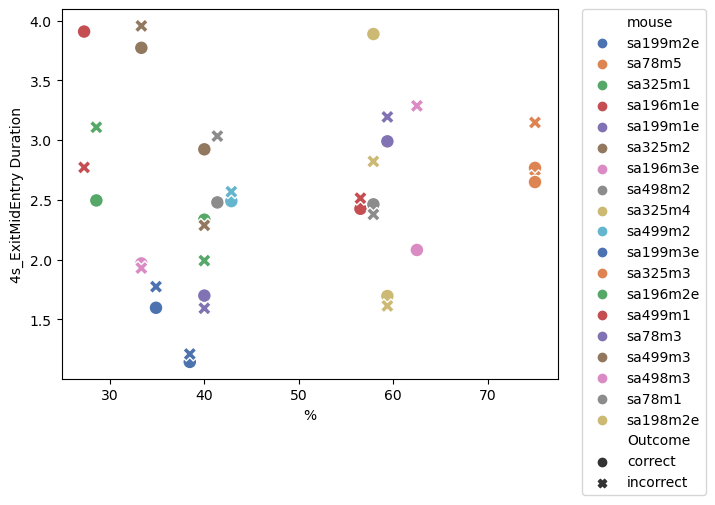

In [3620]:
sns.scatterplot(data=mean_exitmidentry_duration_4s, x = '%', y = '4s_ExitMidEntry Duration', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3621]:
middle_tortuosity_4s = get_performance(df_grouped_unscaled_ri, 'Middle Tortuosity', 4)

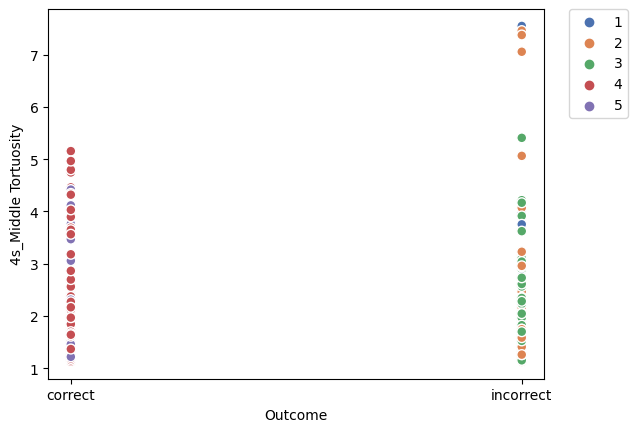

In [3622]:
sns.scatterplot(data=middle_tortuosity_4s, x = 'Outcome', y = '4s_Middle Tortuosity', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3623]:
mean_middle_tortuosity_4s = get_mean_performances(middle_tortuosity_4s)

   mouse  4s_Middle Tortuosity         %   Outcome
sa199m2e              1.424834 38.461538   correct
sa199m2e              1.489511 38.461538 incorrect
  sa78m5              2.378917 75.000000   correct
  sa78m5              2.505169 75.000000 incorrect
 sa325m1              2.231723 28.571429   correct
 sa325m1              2.471586 28.571429 incorrect
sa196m1e              1.696052 56.521739   correct
sa196m1e              1.916303 56.521739 incorrect
sa199m1e              1.450717 40.000000   correct
sa199m1e              1.462289 40.000000 incorrect
 sa325m2              1.903261 33.333333   correct
 sa325m2              2.062604 33.333333 incorrect
sa196m3e              1.592236 33.333333   correct
sa196m3e              2.006346 33.333333 incorrect
 sa498m2              1.863082 41.379310   correct
 sa498m2              2.698068 41.379310 incorrect
 sa325m4              3.210157 57.894737   correct
 sa325m4              1.987302 57.894737 incorrect
 sa499m2              1.589616 

In [3624]:
mean_middle_tortuosity_4s

,mouse,4s_Middle Tortuosity,%,Outcome
0,sa199m2e,1.424834,38.461538,correct
1,sa199m2e,1.489511,38.461538,incorrect
2,sa78m5,2.378917,75.000000,correct
3,sa78m5,2.505169,75.000000,incorrect
4,sa325m1,2.231723,28.571429,correct
5,sa325m1,2.471586,28.571429,incorrect
6,sa196m1e,1.696052,56.521739,correct
7,sa196m1e,1.916303,56.521739,incorrect
8,sa199m1e,1.450717,40.000000,correct
9,sa199m1e,1.462289,40.000000,incorrect


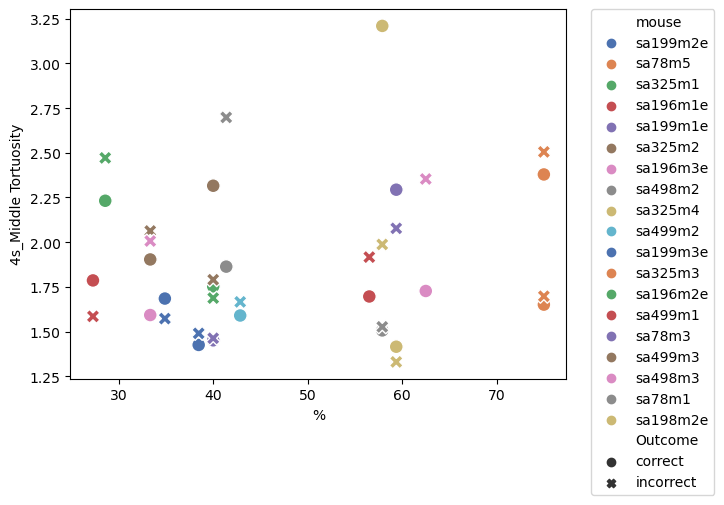

In [3625]:
sns.scatterplot(data=mean_middle_tortuosity_4s, x = '%', y = '4s_Middle Tortuosity', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3626]:
new_cur_coeff_time_prop_4s = get_performance(df_grouped_unscaled_ri, 'New Current Coeff Time Proportional', 4)

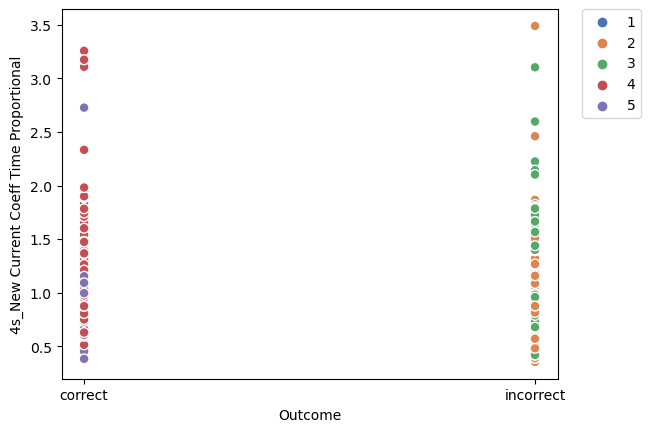

In [3627]:
sns.scatterplot(data=new_cur_coeff_time_prop_4s, x = 'Outcome', y = '4s_New Current Coeff Time Proportional', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3628]:
mean_new_cur_coeff_time_prop_4s = get_mean_performances(new_cur_coeff_time_prop_4s)

   mouse  4s_New Current Coeff Time Proportional         %   Outcome
sa199m2e                                0.619223 38.461538   correct
sa199m2e                                0.688131 38.461538 incorrect
  sa78m5                                1.176609 75.000000   correct
  sa78m5                                1.017194 75.000000 incorrect
 sa325m1                                0.768293 28.571429   correct
 sa325m1                                0.980193 28.571429 incorrect
sa196m1e                                1.139878 56.521739   correct
sa196m1e                                0.988175 56.521739 incorrect
sa199m1e                                0.847725 40.000000   correct
sa199m1e                                0.850147 40.000000 incorrect
 sa325m2                                1.577294 33.333333   correct
 sa325m2                                1.567860 33.333333 incorrect
sa196m3e                                0.867030 33.333333   correct
sa196m3e                          

In [3629]:
mean_new_cur_coeff_time_prop_4s

,mouse,4s_New Current Coeff Time Proportional,%,Outcome
0,sa199m2e,0.619223,38.461538,correct
1,sa199m2e,0.688131,38.461538,incorrect
2,sa78m5,1.176609,75.000000,correct
3,sa78m5,1.017194,75.000000,incorrect
4,sa325m1,0.768293,28.571429,correct
5,sa325m1,0.980193,28.571429,incorrect
6,sa196m1e,1.139878,56.521739,correct
7,sa196m1e,0.988175,56.521739,incorrect
8,sa199m1e,0.847725,40.000000,correct
9,sa199m1e,0.850147,40.000000,incorrect


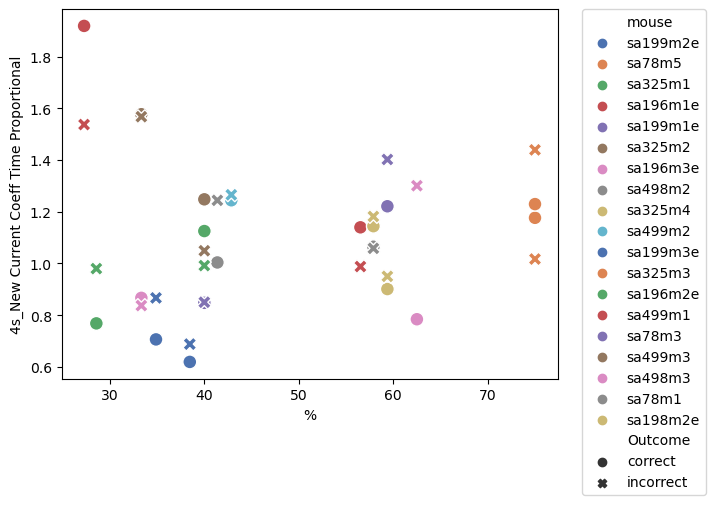

In [3630]:
sns.scatterplot(data=mean_new_cur_coeff_time_prop_4s, x = '%', y = '4s_New Current Coeff Time Proportional', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3631]:
new_current_coeff_4s = get_performance(df_grouped_unscaled_ri, 'New Current Coeff', 4)

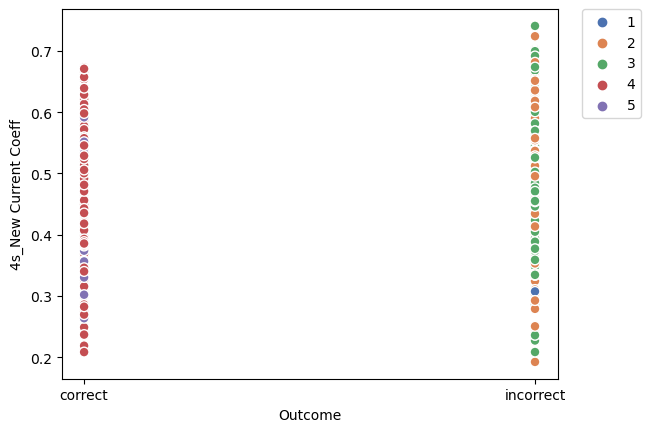

In [3632]:
sns.scatterplot(data=new_current_coeff_4s, x = 'Outcome', y = '4s_New Current Coeff', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3633]:
mean_new_current_coeff_4s = get_mean_performances(new_current_coeff_4s)

   mouse  4s_New Current Coeff         %   Outcome
sa199m2e              0.555239 38.461538   correct
sa199m2e              0.581101 38.461538 incorrect
  sa78m5              0.475733 75.000000   correct
  sa78m5              0.440384 75.000000 incorrect
 sa325m1              0.377887 28.571429   correct
 sa325m1              0.377824 28.571429 incorrect
sa196m1e              0.492710 56.521739   correct
sa196m1e              0.422787 56.521739 incorrect
sa199m1e              0.506942 40.000000   correct
sa199m1e              0.556033 40.000000 incorrect
 sa325m2              0.423086 33.333333   correct
 sa325m2              0.433056 33.333333 incorrect
sa196m3e              0.461489 33.333333   correct
sa196m3e              0.444311 33.333333 incorrect
 sa498m2              0.445485 41.379310   correct
 sa498m2              0.485358 41.379310 incorrect
 sa325m4              0.349856 57.894737   correct
 sa325m4              0.440601 57.894737 incorrect
 sa499m2              0.491177 

In [3634]:
mean_new_current_coeff_4s

,mouse,4s_New Current Coeff,%,Outcome
0,sa199m2e,0.555239,38.461538,correct
1,sa199m2e,0.581101,38.461538,incorrect
2,sa78m5,0.475733,75.000000,correct
3,sa78m5,0.440384,75.000000,incorrect
4,sa325m1,0.377887,28.571429,correct
5,sa325m1,0.377824,28.571429,incorrect
6,sa196m1e,0.492710,56.521739,correct
7,sa196m1e,0.422787,56.521739,incorrect
8,sa199m1e,0.506942,40.000000,correct
9,sa199m1e,0.556033,40.000000,incorrect


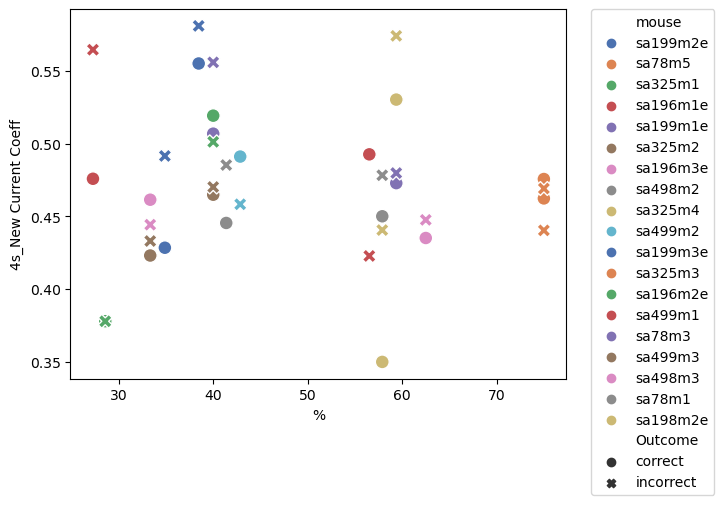

In [3635]:
sns.scatterplot(data=mean_new_current_coeff_4s, x = '%', y = '4s_New Current Coeff', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3636]:
current_coeff_4s = get_performance(df_grouped_unscaled_ri, 'Current Coeff', 4)

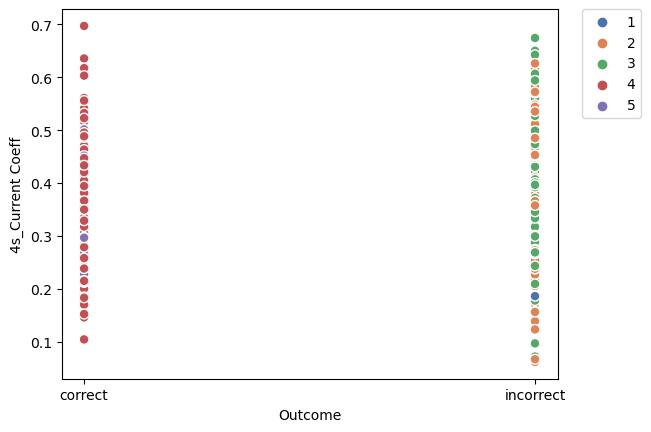

In [3637]:
sns.scatterplot(data=current_coeff_4s, x = 'Outcome', y = '4s_Current Coeff', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3638]:
mean_current_coeff_4s = get_mean_performances(current_coeff_4s)

   mouse  4s_Current Coeff         %   Outcome
sa199m2e          0.466948 38.461538   correct
sa199m2e          0.474983 38.461538 incorrect
  sa78m5          0.364478 75.000000   correct
  sa78m5          0.353826 75.000000 incorrect
 sa325m1          0.310218 28.571429   correct
 sa325m1          0.319810 28.571429 incorrect
sa196m1e          0.377853 56.521739   correct
sa196m1e          0.333885 56.521739 incorrect
sa199m1e          0.364335 40.000000   correct
sa199m1e          0.429580 40.000000 incorrect
 sa325m2          0.348208 33.333333   correct
 sa325m2          0.348215 33.333333 incorrect
sa196m3e          0.369748 33.333333   correct
sa196m3e          0.335970 33.333333 incorrect
 sa498m2          0.350716 41.379310   correct
 sa498m2          0.397612 41.379310 incorrect
 sa325m4          0.261426 57.894737   correct
 sa325m4          0.359374 57.894737 incorrect
 sa499m2          0.396730 42.857143   correct
 sa499m2          0.347296 42.857143 incorrect
sa199m3e     

In [3639]:
mean_current_coeff_4s

,mouse,4s_Current Coeff,%,Outcome
0,sa199m2e,0.466948,38.461538,correct
1,sa199m2e,0.474983,38.461538,incorrect
2,sa78m5,0.364478,75.000000,correct
3,sa78m5,0.353826,75.000000,incorrect
4,sa325m1,0.310218,28.571429,correct
5,sa325m1,0.319810,28.571429,incorrect
6,sa196m1e,0.377853,56.521739,correct
7,sa196m1e,0.333885,56.521739,incorrect
8,sa199m1e,0.364335,40.000000,correct
9,sa199m1e,0.429580,40.000000,incorrect


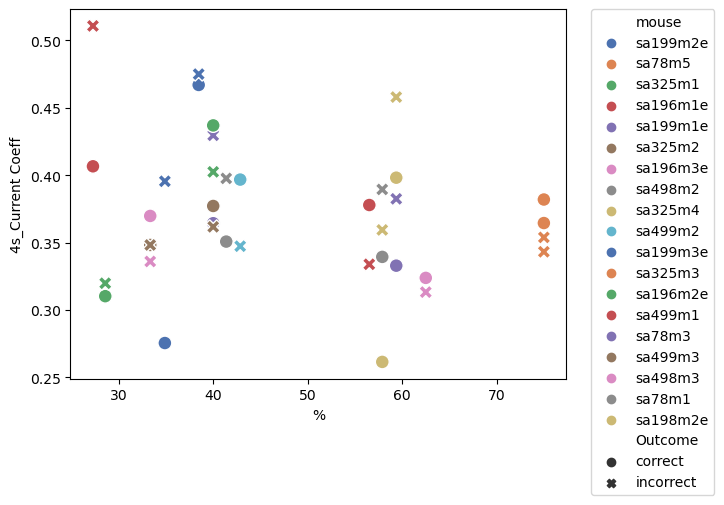

In [3640]:
sns.scatterplot(data=mean_current_coeff_4s, x = '%', y = '4s_Current Coeff', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3641]:
cur_coeff_time_prop_4s = get_performance(df_grouped_unscaled_ri, 'Current Coeff Time Proportional', 4)

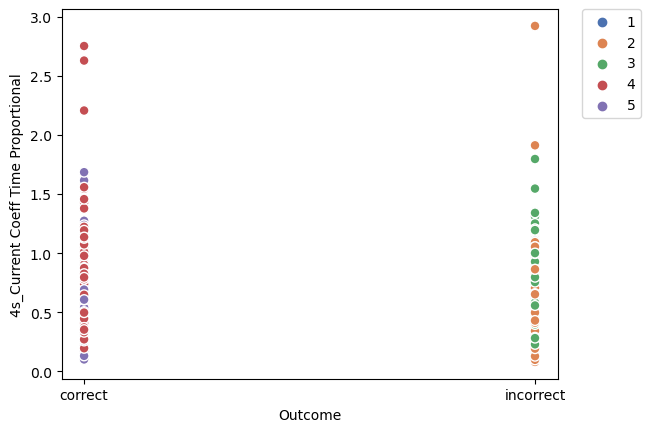

In [3642]:
sns.scatterplot(data=cur_coeff_time_prop_4s, x = 'Outcome', y = '4s_Current Coeff Time Proportional', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3643]:
mean_cur_coeff_time_prop_4s = get_mean_performances(cur_coeff_time_prop_4s)

   mouse  4s_Current Coeff Time Proportional         %   Outcome
sa199m2e                            0.296385 38.461538   correct
sa199m2e                            0.362688 38.461538 incorrect
  sa78m5                            0.718173 75.000000   correct
  sa78m5                            0.651509 75.000000 incorrect
 sa325m1                            0.477254 28.571429   correct
 sa325m1                            0.623780 28.571429 incorrect
sa196m1e                            0.593549 56.521739   correct
sa196m1e                            0.536636 56.521739 incorrect
sa199m1e                            0.417846 40.000000   correct
sa199m1e                            0.421939 40.000000 incorrect
 sa325m2                            0.977985 33.333333   correct
 sa325m2                            0.950620 33.333333 incorrect
sa196m3e                            0.489526 33.333333   correct
sa196m3e                            0.485986 33.333333 incorrect
 sa498m2                 

In [3644]:
mean_cur_coeff_time_prop_4s

,mouse,4s_Current Coeff Time Proportional,%,Outcome
0,sa199m2e,0.296385,38.461538,correct
1,sa199m2e,0.362688,38.461538,incorrect
2,sa78m5,0.718173,75.000000,correct
3,sa78m5,0.651509,75.000000,incorrect
4,sa325m1,0.477254,28.571429,correct
5,sa325m1,0.623780,28.571429,incorrect
6,sa196m1e,0.593549,56.521739,correct
7,sa196m1e,0.536636,56.521739,incorrect
8,sa199m1e,0.417846,40.000000,correct
9,sa199m1e,0.421939,40.000000,incorrect


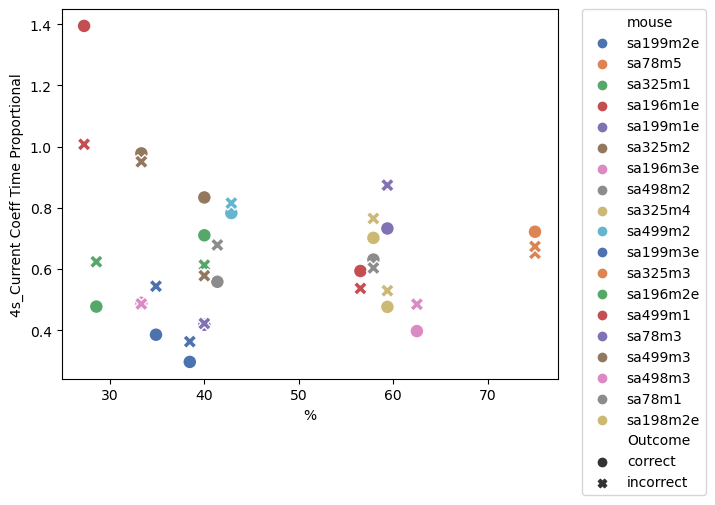

In [3645]:
sns.scatterplot(data=mean_cur_coeff_time_prop_4s, x = '%', y = '4s_Current Coeff Time Proportional', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3646]:
lagged_1_duration_4s = get_performance(df_grouped_unscaled_ri, 'lagged_1_duration', 4)

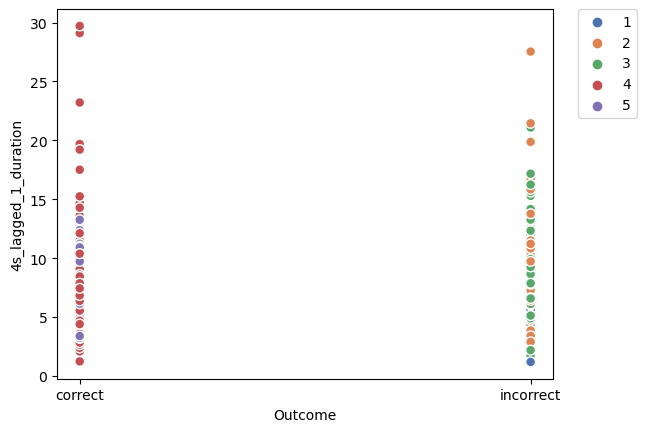

In [3647]:
sns.scatterplot(data=lagged_1_duration_4s, x = 'Outcome', y = '4s_lagged_1_duration', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3648]:
mean_lagged_1_duration_4s = get_mean_performances(lagged_1_duration_4s)

   mouse  4s_lagged_1_duration         %   Outcome
sa199m2e              4.452222 38.461538   correct
sa199m2e              4.276736 38.461538 incorrect
  sa78m5              7.208466 75.000000   correct
  sa78m5              6.773016 75.000000 incorrect
 sa325m1              9.872222 28.571429   correct
 sa325m1              9.692593 28.571429 incorrect
sa196m1e              8.682906 56.521739   correct
sa196m1e             10.161111 56.521739 incorrect
sa199m1e              7.198148 40.000000   correct
sa199m1e              7.470988 40.000000 incorrect
 sa325m2              6.958730 33.333333   correct
 sa325m2              9.370635 33.333333 incorrect
sa196m3e              5.230159 33.333333   correct
sa196m3e              4.698413 33.333333 incorrect
 sa498m2              8.643519 41.379310   correct
 sa498m2              6.390850 41.379310 incorrect
 sa325m4             11.645455 57.894737   correct
 sa325m4             10.526389 57.894737 incorrect
 sa499m2             10.459259 

In [3649]:
mean_lagged_1_duration_4s
#mean_lagged_1_duration_4s.to_csv('mean_arm_dur_past_2.csv', sep='\t', index=False)


,mouse,4s_lagged_1_duration,%,Outcome
0,sa199m2e,4.452222,38.461538,correct
1,sa199m2e,4.276736,38.461538,incorrect
2,sa78m5,7.208466,75.000000,correct
3,sa78m5,6.773016,75.000000,incorrect
4,sa325m1,9.872222,28.571429,correct
5,sa325m1,9.692593,28.571429,incorrect
6,sa196m1e,8.682906,56.521739,correct
7,sa196m1e,10.161111,56.521739,incorrect
8,sa199m1e,7.198148,40.000000,correct
9,sa199m1e,7.470988,40.000000,incorrect


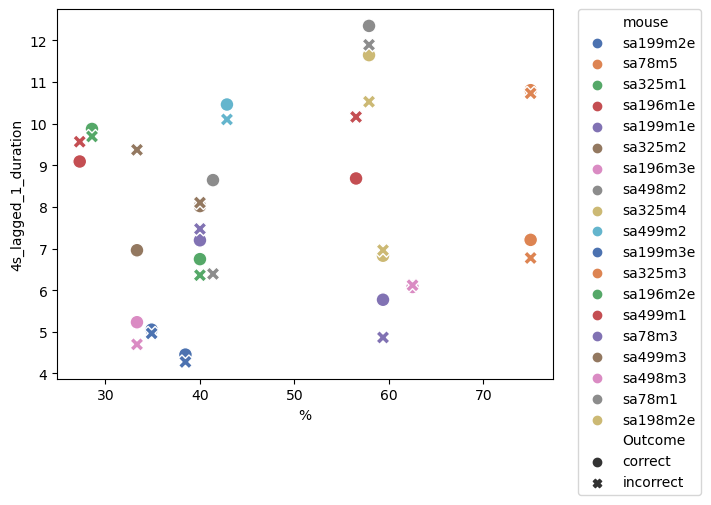

In [3650]:
sns.scatterplot(data=mean_lagged_1_duration_4s, x = '%', y = '4s_lagged_1_duration', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3651]:
lagged_1_nose_time_to_max_dist_4s = get_performance(df_grouped_unscaled_ri, 'lagged_1_nose_time_to_max_dist', 4)

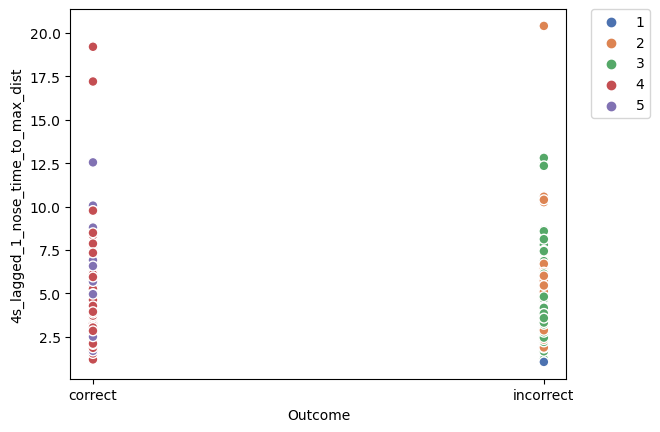

In [3652]:
sns.scatterplot(data=lagged_1_nose_time_to_max_dist_4s, x = 'Outcome', y = '4s_lagged_1_nose_time_to_max_dist', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3653]:
mean_lagged_1_nose_time_to_max_dist_4s = get_mean_performances(lagged_1_nose_time_to_max_dist_4s)

   mouse  4s_lagged_1_nose_time_to_max_dist         %   Outcome
sa199m2e                           2.795556 38.461538   correct
sa199m2e                           2.587847 38.461538 incorrect
  sa78m5                           3.893122 75.000000   correct
  sa78m5                           4.022222 75.000000 incorrect
 sa325m1                           5.014815 28.571429   correct
 sa325m1                           5.542222 28.571429 incorrect
sa196m1e                           4.075214 56.521739   correct
sa196m1e                           5.482222 56.521739 incorrect
sa199m1e                           4.054630 40.000000   correct
sa199m1e                           4.072840 40.000000 incorrect
 sa325m2                           5.012698 33.333333   correct
 sa325m2                           5.405556 33.333333 incorrect
sa196m3e                           3.134921 33.333333   correct
sa196m3e                           2.711905 33.333333 incorrect
 sa498m2                           3.682

In [3654]:
mean_lagged_1_nose_time_to_max_dist_4s

#mean_lagged_1_nose_time_to_max_dist_4s.to_csv('mean_time_to_max_past_2.csv', sep='\t', index=False)

,mouse,4s_lagged_1_nose_time_to_max_dist,%,Outcome
0,sa199m2e,2.795556,38.461538,correct
1,sa199m2e,2.587847,38.461538,incorrect
2,sa78m5,3.893122,75.000000,correct
3,sa78m5,4.022222,75.000000,incorrect
4,sa325m1,5.014815,28.571429,correct
5,sa325m1,5.542222,28.571429,incorrect
6,sa196m1e,4.075214,56.521739,correct
7,sa196m1e,5.482222,56.521739,incorrect
8,sa199m1e,4.054630,40.000000,correct
9,sa199m1e,4.072840,40.000000,incorrect


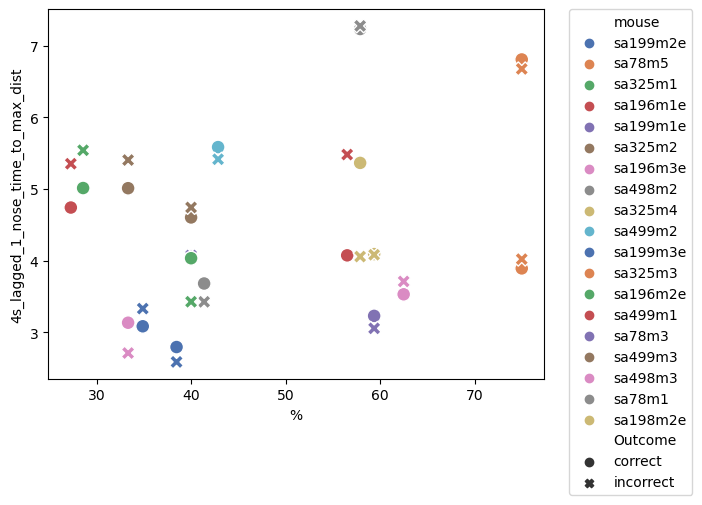

In [3655]:
sns.scatterplot(data=mean_lagged_1_nose_time_to_max_dist_4s, x = '%', y = '4s_lagged_1_nose_time_to_max_dist', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3656]:
lagged_1_arm_nose_mov_4s = get_performance(df_grouped_unscaled_ri, 'lagged_1_arm_nose_mov', 4)

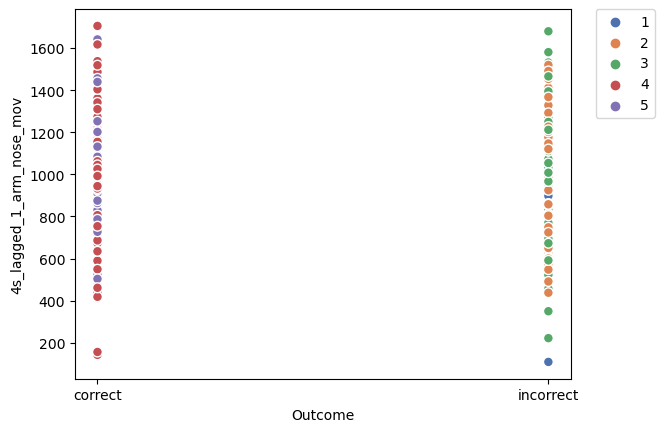

In [3657]:
sns.scatterplot(data=lagged_1_arm_nose_mov_4s, x = 'Outcome', y = '4s_lagged_1_arm_nose_mov', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3658]:
mean_lagged_1_arm_nose_mov_4s = get_mean_performances(lagged_1_arm_nose_mov_4s)

   mouse  4s_lagged_1_arm_nose_mov         %   Outcome
sa199m2e                861.304155 38.461538   correct
sa199m2e                895.502492 38.461538 incorrect
  sa78m5                978.142991 75.000000   correct
  sa78m5                975.331707 75.000000 incorrect
 sa325m1               1110.343983 28.571429   correct
 sa325m1               1078.304159 28.571429 incorrect
sa196m1e                916.550186 56.521739   correct
sa196m1e               1114.124940 56.521739 incorrect
sa199m1e               1007.531686 40.000000   correct
sa199m1e               1019.651254 40.000000 incorrect
 sa325m2                816.226659 33.333333   correct
 sa325m2                907.424689 33.333333 incorrect
sa196m3e                793.195298 33.333333   correct
sa196m3e                790.442090 33.333333 incorrect
 sa498m2                890.794264 41.379310   correct
 sa498m2                704.651322 41.379310 incorrect
 sa325m4               1141.273318 57.894737   correct
 sa325m4  

In [3659]:
mean_lagged_1_arm_nose_mov_4s

#mean_lagged_1_arm_nose_mov_4s.to_csv('dist_in_arm_past_2_nose.csv', sep='\t', index=False)

,mouse,4s_lagged_1_arm_nose_mov,%,Outcome
0,sa199m2e,861.304155,38.461538,correct
1,sa199m2e,895.502492,38.461538,incorrect
2,sa78m5,978.142991,75.000000,correct
3,sa78m5,975.331707,75.000000,incorrect
4,sa325m1,1110.343983,28.571429,correct
5,sa325m1,1078.304159,28.571429,incorrect
6,sa196m1e,916.550186,56.521739,correct
7,sa196m1e,1114.124940,56.521739,incorrect
8,sa199m1e,1007.531686,40.000000,correct
9,sa199m1e,1019.651254,40.000000,incorrect


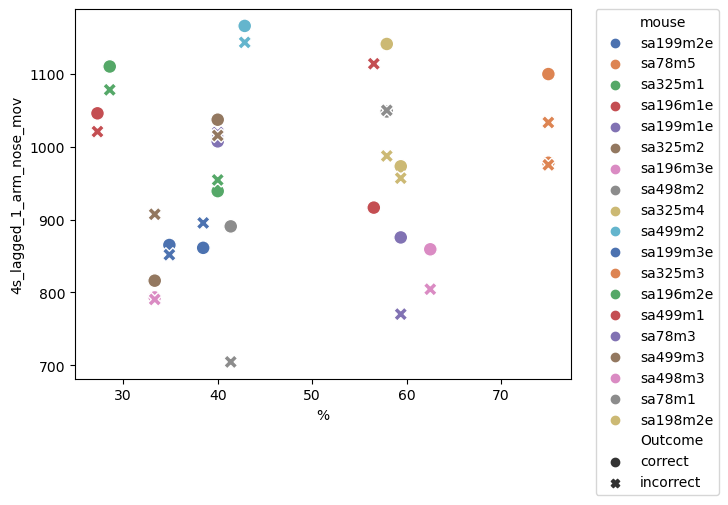

In [3660]:
sns.scatterplot(data=mean_lagged_1_arm_nose_mov_4s, x = '%', y = '4s_lagged_1_arm_nose_mov', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3661]:
lagged_1_arm_nose_vel_4s = get_performance(df_grouped_unscaled_ri, 'lagged_1_arm_nose_vel', 4)

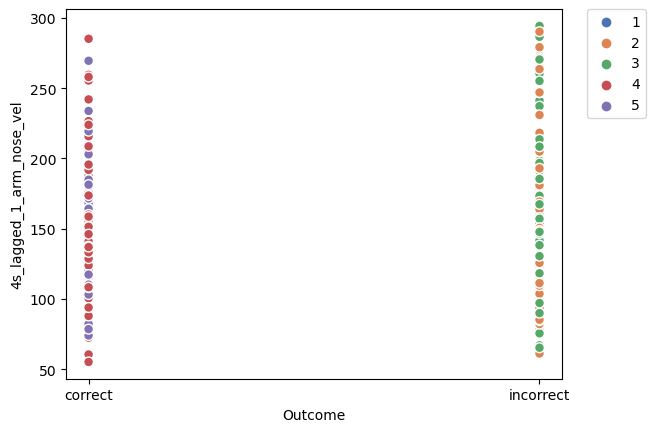

In [3662]:
sns.scatterplot(data=lagged_1_arm_nose_vel_4s, x = 'Outcome', y = '4s_lagged_1_arm_nose_vel', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3663]:
mean_lagged_1_arm_nose_vel_4s = get_mean_performances(lagged_1_arm_nose_vel_4s)

   mouse  4s_lagged_1_arm_nose_vel         %   Outcome
sa199m2e                208.801923 38.461538   correct
sa199m2e                228.088566 38.461538 incorrect
  sa78m5                145.713827 75.000000   correct
  sa78m5                150.081137 75.000000 incorrect
 sa325m1                122.289809 28.571429   correct
 sa325m1                124.809833 28.571429 incorrect
sa196m1e                119.829462 56.521739   correct
sa196m1e                127.411586 56.521739 incorrect
sa199m1e                144.386599 40.000000   correct
sa199m1e                143.599020 40.000000 incorrect
 sa325m2                112.975274 33.333333   correct
 sa325m2                 97.064905 33.333333 incorrect
sa196m3e                157.942397 33.333333   correct
sa196m3e                174.022096 33.333333 incorrect
 sa498m2                 99.916188 41.379310   correct
 sa498m2                115.541495 41.379310 incorrect
 sa325m4                107.483771 57.894737   correct
 sa325m4  

In [3664]:
mean_lagged_1_arm_nose_vel_4s
#mean_lagged_1_arm_nose_vel_4s.to_csv('mean_vel_past_2_nose.csv', sep='\t', index=False)

,mouse,4s_lagged_1_arm_nose_vel,%,Outcome
0,sa199m2e,208.801923,38.461538,correct
1,sa199m2e,228.088566,38.461538,incorrect
2,sa78m5,145.713827,75.000000,correct
3,sa78m5,150.081137,75.000000,incorrect
4,sa325m1,122.289809,28.571429,correct
5,sa325m1,124.809833,28.571429,incorrect
6,sa196m1e,119.829462,56.521739,correct
7,sa196m1e,127.411586,56.521739,incorrect
8,sa199m1e,144.386599,40.000000,correct
9,sa199m1e,143.599020,40.000000,incorrect


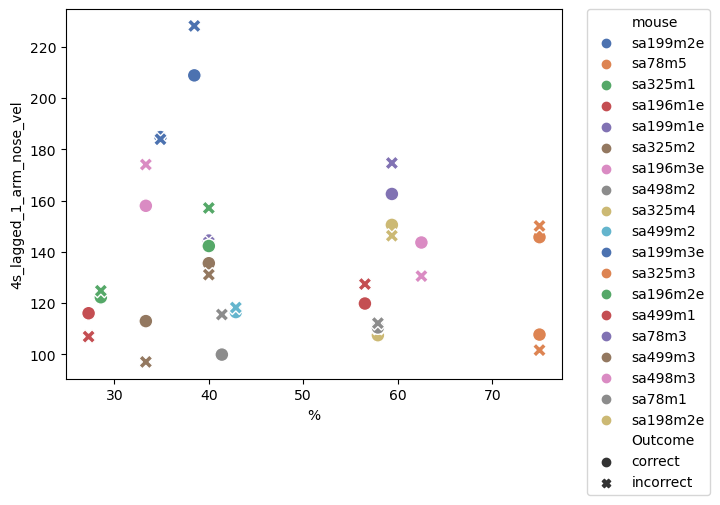

In [3665]:
sns.scatterplot(data=mean_lagged_1_arm_nose_vel_4s, x = '%', y = '4s_lagged_1_arm_nose_vel', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3666]:
lagged_1_arm_tail_mov_4s = get_performance(df_grouped_unscaled_ri, 'lagged_1_arm_tail_mov', 4)

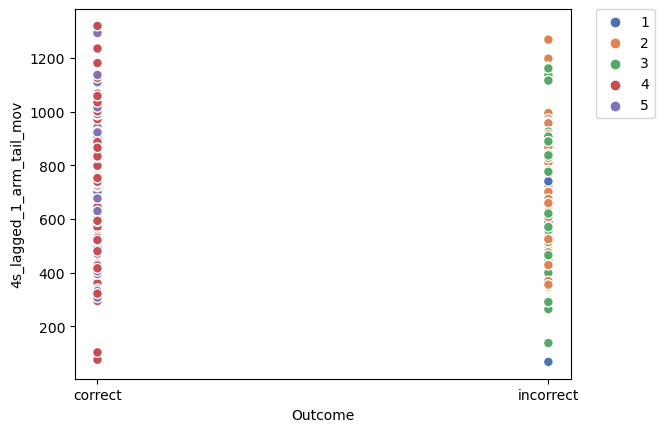

In [3667]:
sns.scatterplot(data=lagged_1_arm_tail_mov_4s, x = 'Outcome', y = '4s_lagged_1_arm_tail_mov', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3668]:
mean_lagged_1_arm_tail_mov_4s = get_mean_performances(lagged_1_arm_tail_mov_4s)

   mouse  4s_lagged_1_arm_tail_mov         %   Outcome
sa199m2e                707.125550 38.461538   correct
sa199m2e                733.836594 38.461538 incorrect
  sa78m5                774.453732 75.000000   correct
  sa78m5                788.299597 75.000000 incorrect
 sa325m1                899.037082 28.571429   correct
 sa325m1                864.680002 28.571429 incorrect
sa196m1e                670.348123 56.521739   correct
sa196m1e                819.184330 56.521739 incorrect
sa199m1e                798.776291 40.000000   correct
sa199m1e                830.613286 40.000000 incorrect
 sa325m2                679.818719 33.333333   correct
 sa325m2                702.676359 33.333333 incorrect
sa196m3e                628.587154 33.333333   correct
sa196m3e                624.751316 33.333333 incorrect
 sa498m2                697.403067 41.379310   correct
 sa498m2                541.541357 41.379310 incorrect
 sa325m4                919.076616 57.894737   correct
 sa325m4  

In [3669]:
mean_lagged_1_arm_tail_mov_4s
#mean_lagged_1_arm_tail_mov_4s.to_csv('dist_in_arm_past_2_tail.csv', sep='\t', index=False)

,mouse,4s_lagged_1_arm_tail_mov,%,Outcome
0,sa199m2e,707.125550,38.461538,correct
1,sa199m2e,733.836594,38.461538,incorrect
2,sa78m5,774.453732,75.000000,correct
3,sa78m5,788.299597,75.000000,incorrect
4,sa325m1,899.037082,28.571429,correct
5,sa325m1,864.680002,28.571429,incorrect
6,sa196m1e,670.348123,56.521739,correct
7,sa196m1e,819.184330,56.521739,incorrect
8,sa199m1e,798.776291,40.000000,correct
9,sa199m1e,830.613286,40.000000,incorrect


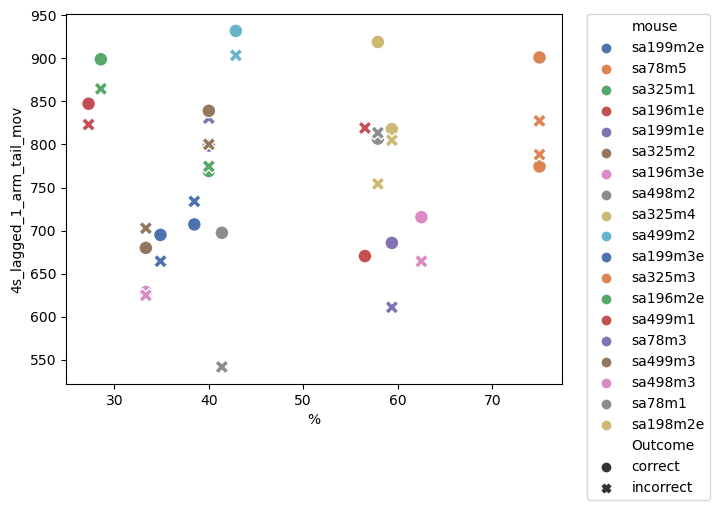

In [3670]:
sns.scatterplot(data=mean_lagged_1_arm_tail_mov_4s, x = '%', y = '4s_lagged_1_arm_tail_mov', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3671]:
lagged_1_arm_tail_vel_4s = get_performance(df_grouped_unscaled_ri, 'lagged_1_arm_tail_vel', 4)

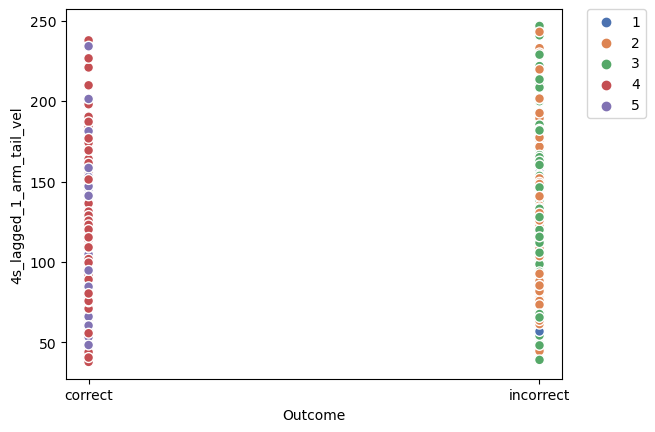

In [3672]:
sns.scatterplot(data=lagged_1_arm_tail_vel_4s, x = 'Outcome', y = '4s_lagged_1_arm_tail_vel', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3673]:
mean_lagged_1_arm_tail_vel_4s = get_mean_performances(lagged_1_arm_tail_vel_4s)

   mouse  4s_lagged_1_arm_tail_vel         %   Outcome
sa199m2e                169.991026 38.461538   correct
sa199m2e                187.563381 38.461538 incorrect
  sa78m5                111.854176 75.000000   correct
  sa78m5                119.815677 75.000000 incorrect
 sa325m1                 98.131925 28.571429   correct
 sa325m1                100.086843 28.571429 incorrect
sa196m1e                 83.632982 56.521739   correct
sa196m1e                 93.372623 56.521739 incorrect
sa199m1e                115.670327 40.000000   correct
sa199m1e                118.532557 40.000000 incorrect
 sa325m2                 92.631269 33.333333   correct
 sa325m2                 74.717149 33.333333 incorrect
sa196m3e                117.109821 33.333333   correct
sa196m3e                132.167614 33.333333 incorrect
 sa498m2                 75.659149 41.379310   correct
 sa498m2                 77.410174 41.379310 incorrect
 sa325m4                 89.028883 57.894737   correct
 sa325m4  

In [3674]:
mean_lagged_1_arm_tail_vel_4s
#mean_lagged_1_arm_tail_vel_4s.to_csv('mean_vel_past_2_tail.csv', sep='\t', index=False)

,mouse,4s_lagged_1_arm_tail_vel,%,Outcome
0,sa199m2e,169.991026,38.461538,correct
1,sa199m2e,187.563381,38.461538,incorrect
2,sa78m5,111.854176,75.000000,correct
3,sa78m5,119.815677,75.000000,incorrect
4,sa325m1,98.131925,28.571429,correct
5,sa325m1,100.086843,28.571429,incorrect
6,sa196m1e,83.632982,56.521739,correct
7,sa196m1e,93.372623,56.521739,incorrect
8,sa199m1e,115.670327,40.000000,correct
9,sa199m1e,118.532557,40.000000,incorrect


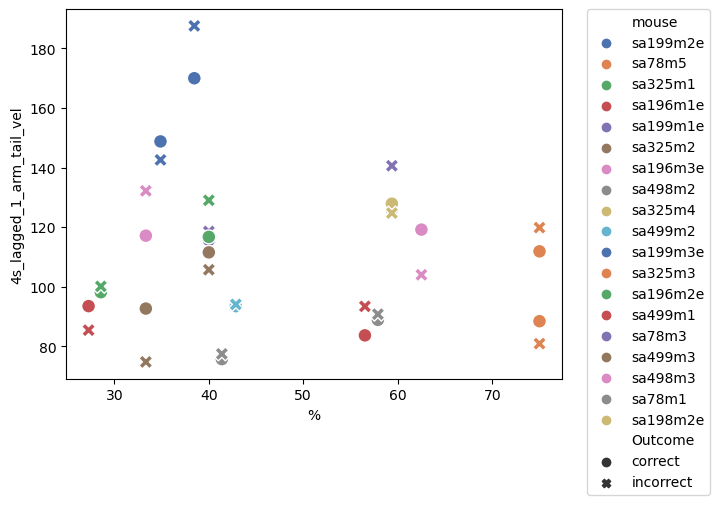

In [3675]:
sns.scatterplot(data=mean_lagged_1_arm_tail_vel_4s, x = '%', y = '4s_lagged_1_arm_tail_vel', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3676]:
lagged_1_entry_tortuosity_4s = get_performance(df_grouped_unscaled_ri, 'lagged_1_entry_tortuosity', 4)

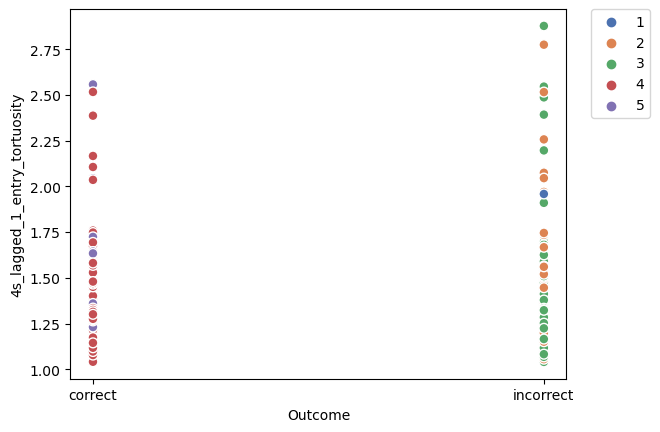

In [3677]:
sns.scatterplot(data=lagged_1_entry_tortuosity_4s, x = 'Outcome', y = '4s_lagged_1_entry_tortuosity', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3678]:
mean_lagged_1_entry_tortuosity_4s = get_mean_performances(lagged_1_entry_tortuosity_4s)

   mouse  4s_lagged_1_entry_tortuosity         %   Outcome
sa199m2e                      1.274592 38.461538   correct
sa199m2e                      1.238568 38.461538 incorrect
  sa78m5                      1.352193 75.000000   correct
  sa78m5                      1.351788 75.000000 incorrect
 sa325m1                      1.485717 28.571429   correct
 sa325m1                      1.456419 28.571429 incorrect
sa196m1e                      1.403966 56.521739   correct
sa196m1e                      1.566195 56.521739 incorrect
sa199m1e                      1.265679 40.000000   correct
sa199m1e                      1.269998 40.000000 incorrect
 sa325m2                      1.479488 33.333333   correct
 sa325m2                      1.493121 33.333333 incorrect
sa196m3e                      1.309475 33.333333   correct
sa196m3e                      1.247597 33.333333 incorrect
 sa498m2                      1.361484 41.379310   correct
 sa498m2                      1.663128 41.379310 incorre

In [3679]:
mean_lagged_1_entry_tortuosity_4s

,mouse,4s_lagged_1_entry_tortuosity,%,Outcome
0,sa199m2e,1.274592,38.461538,correct
1,sa199m2e,1.238568,38.461538,incorrect
2,sa78m5,1.352193,75.000000,correct
3,sa78m5,1.351788,75.000000,incorrect
4,sa325m1,1.485717,28.571429,correct
5,sa325m1,1.456419,28.571429,incorrect
6,sa196m1e,1.403966,56.521739,correct
7,sa196m1e,1.566195,56.521739,incorrect
8,sa199m1e,1.265679,40.000000,correct
9,sa199m1e,1.269998,40.000000,incorrect


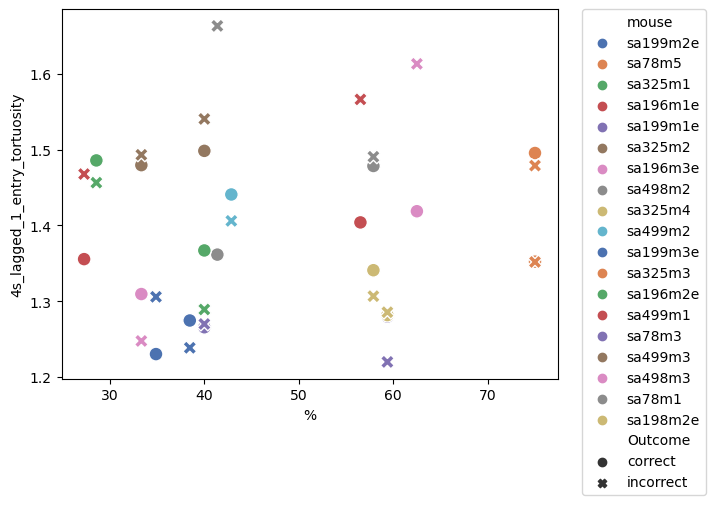

In [3680]:
sns.scatterplot(data=mean_lagged_1_entry_tortuosity_4s, x = '%', y = '4s_lagged_1_entry_tortuosity', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3681]:
lagged_1_exit_tortuosity_4s = get_performance(df_grouped_unscaled_ri, 'lagged_1_exit_tortuosity', 4)

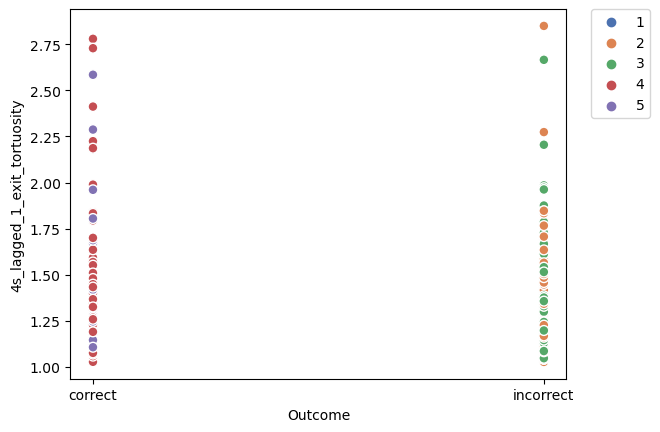

In [3682]:
sns.scatterplot(data=lagged_1_exit_tortuosity_4s, x = 'Outcome', y = '4s_lagged_1_exit_tortuosity', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3683]:
mean_lagged_1_exit_tortuosity_4s = get_mean_performances(lagged_1_exit_tortuosity_4s)

   mouse  4s_lagged_1_exit_tortuosity         %   Outcome
sa199m2e                     1.178303 38.461538   correct
sa199m2e                     1.189557 38.461538 incorrect
  sa78m5                     1.399047 75.000000   correct
  sa78m5                     1.257700 75.000000 incorrect
 sa325m1                     1.556410 28.571429   correct
 sa325m1                     1.476019 28.571429 incorrect
sa196m1e                     1.492743 56.521739   correct
sa196m1e                     1.496645 56.521739 incorrect
sa199m1e                     1.271326 40.000000   correct
sa199m1e                     1.263802 40.000000 incorrect
 sa325m2                     1.261535 33.333333   correct
 sa325m2                     1.575414 33.333333 incorrect
sa196m3e                     1.254668 33.333333   correct
sa196m3e                     1.243173 33.333333 incorrect
 sa498m2                     1.594358 41.379310   correct
 sa498m2                     1.420188 41.379310 incorrect
 sa325m4      

In [3684]:
mean_lagged_1_exit_tortuosity_4s

#mean_lagged_1_exit_tortuosity_4s.to_csv('mean_exit_tortuosity_past_2.csv', sep='\t', index=False)

,mouse,4s_lagged_1_exit_tortuosity,%,Outcome
0,sa199m2e,1.178303,38.461538,correct
1,sa199m2e,1.189557,38.461538,incorrect
2,sa78m5,1.399047,75.000000,correct
3,sa78m5,1.257700,75.000000,incorrect
4,sa325m1,1.556410,28.571429,correct
5,sa325m1,1.476019,28.571429,incorrect
6,sa196m1e,1.492743,56.521739,correct
7,sa196m1e,1.496645,56.521739,incorrect
8,sa199m1e,1.271326,40.000000,correct
9,sa199m1e,1.263802,40.000000,incorrect


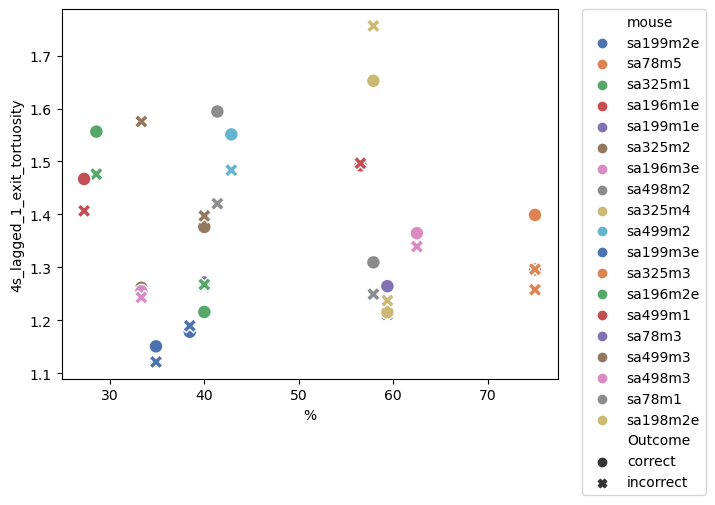

In [3685]:
sns.scatterplot(data=mean_lagged_1_exit_tortuosity_4s, x = '%', y = '4s_lagged_1_exit_tortuosity', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3686]:
lagged_1_other_tortuosity_4s = get_performance(df_grouped_unscaled_ri, 'lagged_1_other_tortuosity', 4)

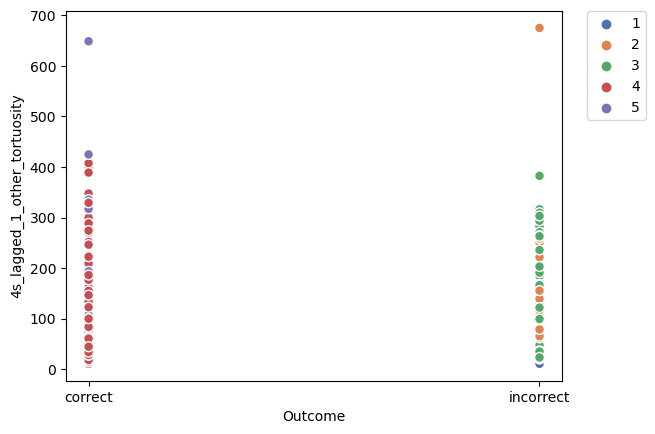

In [3687]:
sns.scatterplot(data=lagged_1_other_tortuosity_4s, x = 'Outcome', y = '4s_lagged_1_other_tortuosity', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3688]:
mean_lagged_1_other_tortuosity_4s = get_mean_performances(lagged_1_other_tortuosity_4s)

   mouse  4s_lagged_1_other_tortuosity         %   Outcome
sa199m2e                     60.261128 38.461538   correct
sa199m2e                     81.349624 38.461538 incorrect
  sa78m5                    101.555571 75.000000   correct
  sa78m5                    128.834455 75.000000 incorrect
 sa325m1                     98.229217 28.571429   correct
 sa325m1                     88.896300 28.571429 incorrect
sa196m1e                    108.532062 56.521739   correct
sa196m1e                    135.129653 56.521739 incorrect
sa199m1e                     83.495280 40.000000   correct
sa199m1e                    104.838219 40.000000 incorrect
 sa325m2                     60.049278 33.333333   correct
 sa325m2                     69.943902 33.333333 incorrect
sa196m3e                     80.498127 33.333333   correct
sa196m3e                     53.610437 33.333333 incorrect
 sa498m2                     94.657070 41.379310   correct
 sa498m2                     77.701186 41.379310 incorre

In [3689]:
mean_lagged_1_other_tortuosity_4s


,mouse,4s_lagged_1_other_tortuosity,%,Outcome
0,sa199m2e,60.261128,38.461538,correct
1,sa199m2e,81.349624,38.461538,incorrect
2,sa78m5,101.555571,75.000000,correct
3,sa78m5,128.834455,75.000000,incorrect
4,sa325m1,98.229217,28.571429,correct
5,sa325m1,88.896300,28.571429,incorrect
6,sa196m1e,108.532062,56.521739,correct
7,sa196m1e,135.129653,56.521739,incorrect
8,sa199m1e,83.495280,40.000000,correct
9,sa199m1e,104.838219,40.000000,incorrect


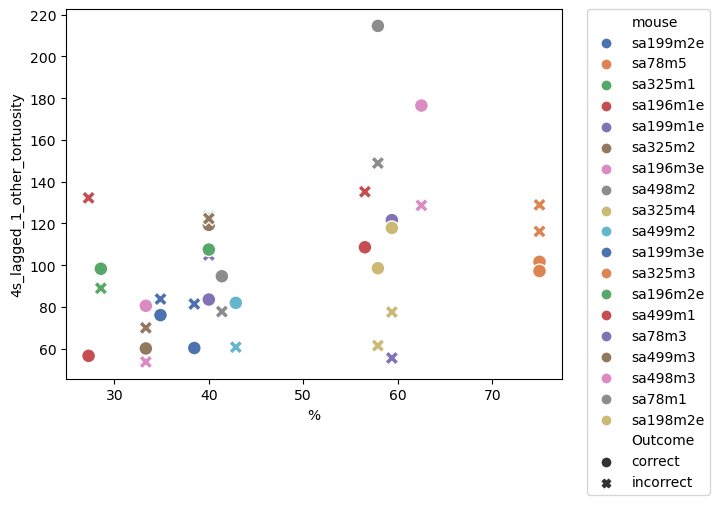

In [3690]:
sns.scatterplot(data=mean_lagged_1_other_tortuosity_4s, x = '%', y = '4s_lagged_1_other_tortuosity', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3691]:
entry_latency_4s = get_performance(df_grouped_unscaled_ri, 'Entry Latency', 4)

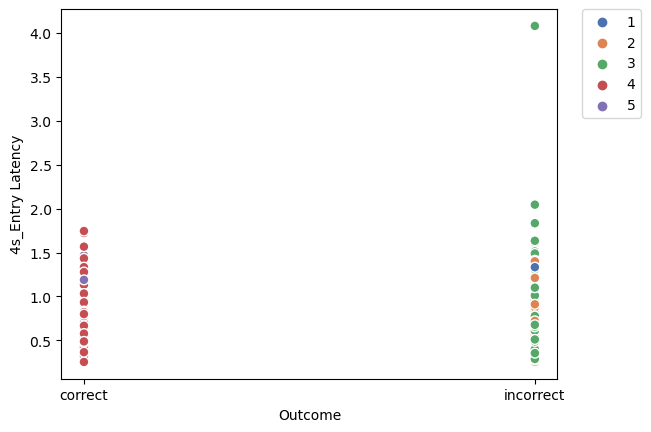

In [3692]:
sns.scatterplot(data=entry_latency_4s, x = 'Outcome', y = '4s_Entry Latency', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3693]:
mean_entry_latency_4s = get_mean_performances(entry_latency_4s)

   mouse  4s_Entry Latency         %   Outcome
sa199m2e          0.464444 38.461538   correct
sa199m2e          0.447569 38.461538 incorrect
  sa78m5          0.636508 75.000000   correct
  sa78m5          0.492063 75.000000 incorrect
 sa325m1          0.450000 28.571429   correct
 sa325m1          0.611852 28.571429 incorrect
sa196m1e          0.752991 56.521739   correct
sa196m1e          0.658889 56.521739 incorrect
sa199m1e          0.572222 40.000000   correct
sa199m1e          0.583951 40.000000 incorrect
 sa325m2          1.007937 33.333333   correct
 sa325m2          0.988095 33.333333 incorrect
sa196m3e          0.619048 33.333333   correct
sa196m3e          0.554365 33.333333 incorrect
 sa498m2          0.733333 41.379310   correct
 sa498m2          0.896732 41.379310 incorrect
 sa325m4          0.825253 57.894737   correct
 sa325m4          0.620833 57.894737 incorrect
 sa499m2          0.738272 42.857143   correct
 sa499m2          0.728704 42.857143 incorrect
sa199m3e     

In [3694]:
mean_entry_latency_4s

,mouse,4s_Entry Latency,%,Outcome
0,sa199m2e,0.464444,38.461538,correct
1,sa199m2e,0.447569,38.461538,incorrect
2,sa78m5,0.636508,75.000000,correct
3,sa78m5,0.492063,75.000000,incorrect
4,sa325m1,0.450000,28.571429,correct
5,sa325m1,0.611852,28.571429,incorrect
6,sa196m1e,0.752991,56.521739,correct
7,sa196m1e,0.658889,56.521739,incorrect
8,sa199m1e,0.572222,40.000000,correct
9,sa199m1e,0.583951,40.000000,incorrect


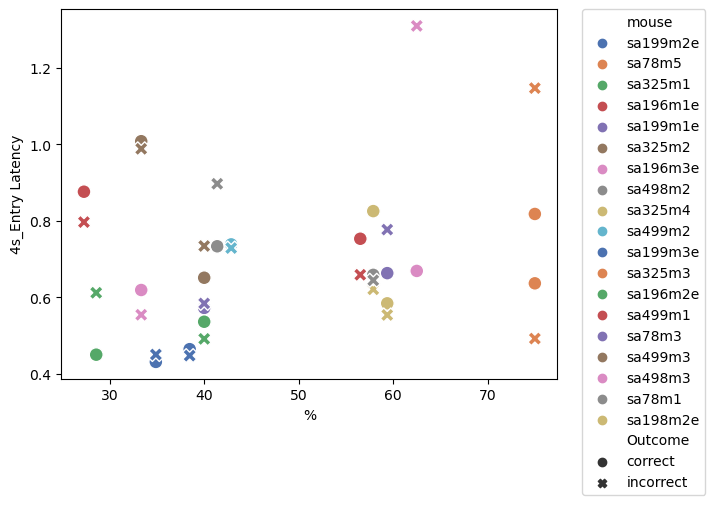

In [3695]:
sns.scatterplot(data=mean_entry_latency_4s, x = '%', y = '4s_Entry Latency', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3696]:
lagged_1_new_cur_coeff_4s = get_performance(df_grouped_unscaled_ri, 'New Lagged 1 Cur Coeff', 4)

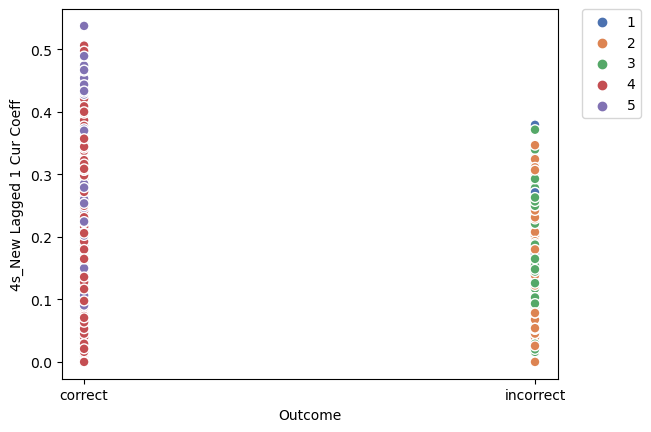

In [3697]:
sns.scatterplot(data=lagged_1_new_cur_coeff_4s, x = 'Outcome', y = '4s_New Lagged 1 Cur Coeff', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3698]:
mean_lagged_1_new_cur_coeff_4s = get_mean_performances(lagged_1_new_cur_coeff_4s)

   mouse  4s_New Lagged 1 Cur Coeff         %   Outcome
sa199m2e                   0.089709 38.461538   correct
sa199m2e                   0.108437 38.461538 incorrect
  sa78m5                   0.176789 75.000000   correct
  sa78m5                   0.162114 75.000000 incorrect
 sa325m1                   0.237335 28.571429   correct
 sa325m1                   0.194144 28.571429 incorrect
sa196m1e                   0.216482 56.521739   correct
sa196m1e                   0.192725 56.521739 incorrect
sa199m1e                   0.195614 40.000000   correct
sa199m1e                   0.148665 40.000000 incorrect
 sa325m2                   0.208101 33.333333   correct
 sa325m2                   0.118355 33.333333 incorrect
sa196m3e                   0.121710 33.333333   correct
sa196m3e                   0.158764 33.333333 incorrect
 sa498m2                   0.175991 41.379310   correct
 sa498m2                   0.148401 41.379310 incorrect
 sa325m4                   0.265643 57.894737   

In [3699]:
mean_lagged_1_new_cur_coeff_4s

,mouse,4s_New Lagged 1 Cur Coeff,%,Outcome
0,sa199m2e,0.089709,38.461538,correct
1,sa199m2e,0.108437,38.461538,incorrect
2,sa78m5,0.176789,75.000000,correct
3,sa78m5,0.162114,75.000000,incorrect
4,sa325m1,0.237335,28.571429,correct
5,sa325m1,0.194144,28.571429,incorrect
6,sa196m1e,0.216482,56.521739,correct
7,sa196m1e,0.192725,56.521739,incorrect
8,sa199m1e,0.195614,40.000000,correct
9,sa199m1e,0.148665,40.000000,incorrect


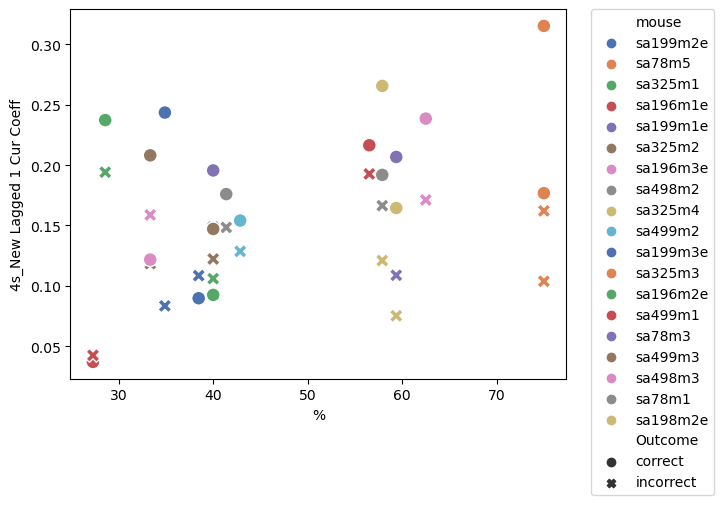

In [3700]:
sns.scatterplot(data=mean_lagged_1_new_cur_coeff_4s, x = '%', y = '4s_New Lagged 1 Cur Coeff', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3701]:
middle_duration_4s = get_performance(df_grouped_unscaled_ri, 'Middle Duration', 4)

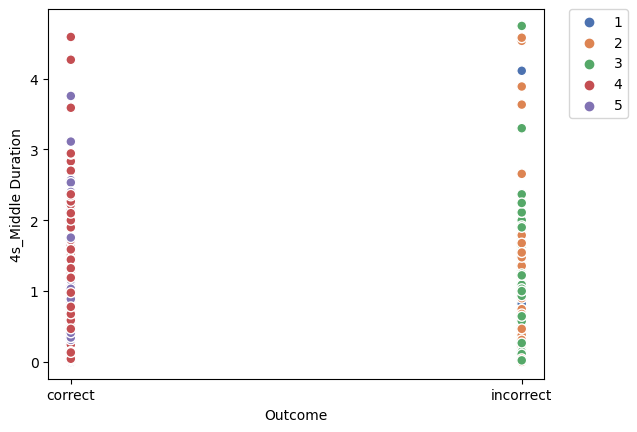

In [3702]:
sns.scatterplot(data=middle_duration_4s, x = 'Outcome', y = '4s_Middle Duration', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3703]:
mean_middle_duration_4s = get_mean_performances(middle_duration_4s)

   mouse  4s_Middle Duration         %   Outcome
sa199m2e            0.370000 38.461538   correct
sa199m2e            0.455903 38.461538 incorrect
  sa78m5            1.225397 75.000000   correct
  sa78m5            1.380952 75.000000 incorrect
 sa325m1            0.359259 28.571429   correct
 sa325m1            0.408148 28.571429 incorrect
sa196m1e            0.638462 56.521739   correct
sa196m1e            0.620000 56.521739 incorrect
sa199m1e            0.600926 40.000000   correct
sa199m1e            0.558642 40.000000 incorrect
 sa325m2            0.958730 33.333333   correct
 sa325m2            1.423810 33.333333 incorrect
sa196m3e            0.849206 33.333333   correct
sa196m3e            0.839286 33.333333 incorrect
 sa498m2            0.578704 41.379310   correct
 sa498m2            1.354248 41.379310 incorrect
 sa325m4            0.815152 57.894737   correct
 sa325m4            0.586111 57.894737 incorrect
 sa499m2            1.213580 42.857143   correct
 sa499m2            

In [3704]:
mean_middle_duration_4s

,mouse,4s_Middle Duration,%,Outcome
0,sa199m2e,0.370000,38.461538,correct
1,sa199m2e,0.455903,38.461538,incorrect
2,sa78m5,1.225397,75.000000,correct
3,sa78m5,1.380952,75.000000,incorrect
4,sa325m1,0.359259,28.571429,correct
5,sa325m1,0.408148,28.571429,incorrect
6,sa196m1e,0.638462,56.521739,correct
7,sa196m1e,0.620000,56.521739,incorrect
8,sa199m1e,0.600926,40.000000,correct
9,sa199m1e,0.558642,40.000000,incorrect


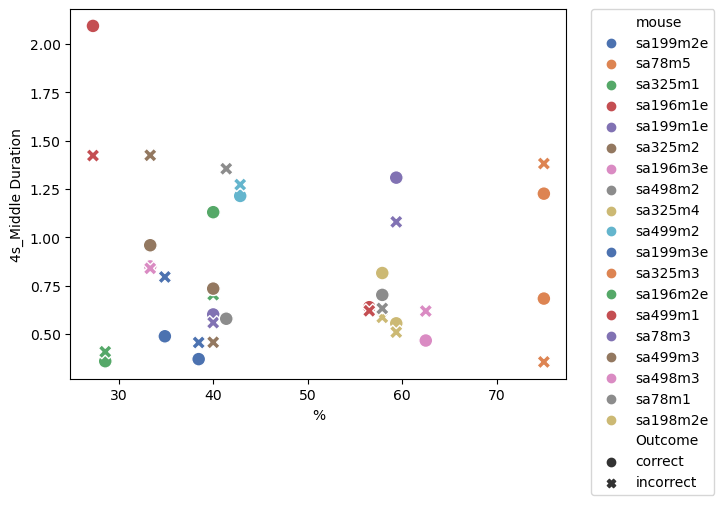

In [3705]:
sns.scatterplot(data=mean_middle_duration_4s, x = '%', y = '4s_Middle Duration', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3706]:
# 5s

In [3707]:
exitmidentry_duration_5s = get_performance(df_grouped_unscaled_ri, 'ExitMidEntry Duration', 5)

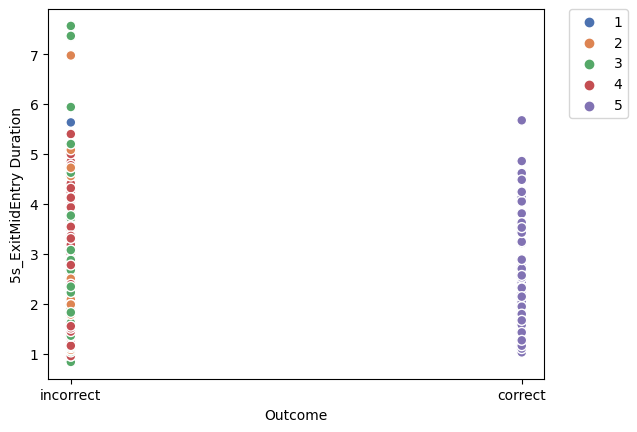

In [3708]:
sns.scatterplot(data=exitmidentry_duration_5s, x = 'Outcome', y = '5s_ExitMidEntry Duration', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3709]:
mean_exitmidentry_duration_5s = get_mean_performances(exitmidentry_duration_5s)

   mouse  5s_ExitMidEntry Duration         %   Outcome
sa199m2e                  1.054167  3.921569   correct
sa199m2e                  1.188265  3.921569 incorrect
  sa78m5                  3.142500 37.037037   correct
  sa78m5                  2.489706 37.037037 incorrect
 sa325m1                  1.591667  5.000000   correct
 sa325m1                  2.959211  5.000000 incorrect
sa196m1e                  2.445833  9.090909   correct
sa196m1e                  2.458333  9.090909 incorrect
sa199m1e                  1.775000  6.896552   correct
sa199m1e                  1.602160  6.896552 incorrect
 sa325m2                  3.525000 10.000000   correct
 sa325m2                  3.957407 10.000000 incorrect
sa196m3e                  2.027778  7.317073   correct
sa196m3e                  1.922368  7.317073 incorrect
 sa498m2                  2.000000 14.285714   correct
 sa498m2                  2.969792 14.285714 incorrect
 sa325m4                  1.741667  5.555556   correct
 sa325m4  

C:\Users\Josue Regalado\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\Josue Regalado\anaconda3\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


In [3710]:
mean_exitmidentry_duration_5s

,mouse,5s_ExitMidEntry Duration,%,Outcome
0,sa199m2e,1.054167,3.921569,correct
1,sa199m2e,1.188265,3.921569,incorrect
2,sa78m5,3.142500,37.037037,correct
3,sa78m5,2.489706,37.037037,incorrect
4,sa325m1,1.591667,5.000000,correct
5,sa325m1,2.959211,5.000000,incorrect
6,sa196m1e,2.445833,9.090909,correct
7,sa196m1e,2.458333,9.090909,incorrect
8,sa199m1e,1.775000,6.896552,correct
9,sa199m1e,1.602160,6.896552,incorrect


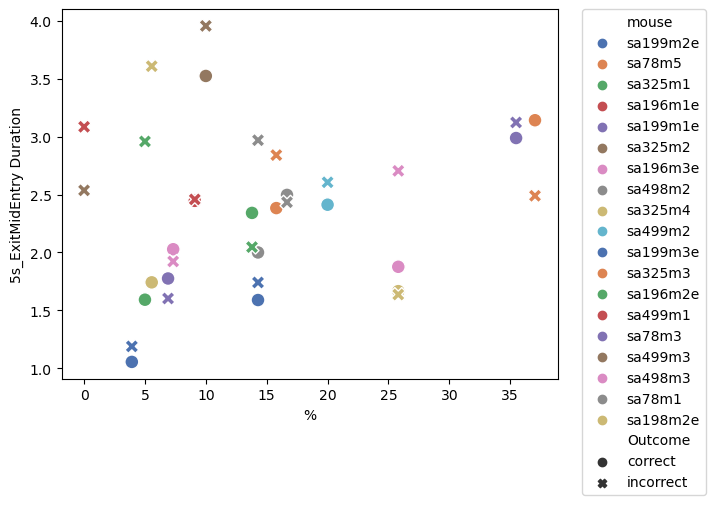

In [3711]:
sns.scatterplot(data=mean_exitmidentry_duration_5s, x = '%', y = '5s_ExitMidEntry Duration', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3712]:
middle_tortuosity_5s = get_performance(df_grouped_unscaled_ri, 'Middle Tortuosity', 5)

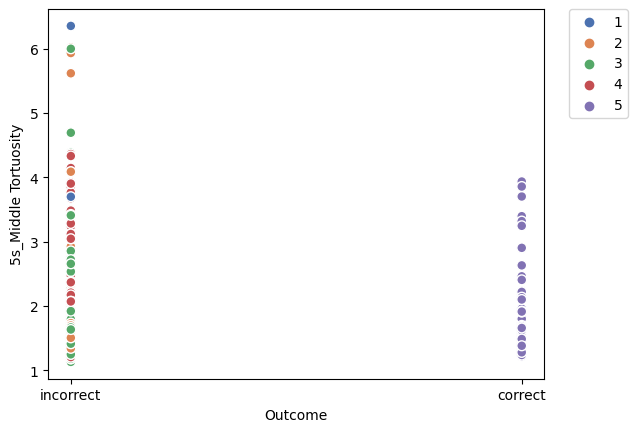

In [3713]:
sns.scatterplot(data=middle_tortuosity_5s, x = 'Outcome', y = '5s_Middle Tortuosity', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3714]:
mean_middle_tortuosity_5s = get_mean_performances(middle_tortuosity_5s)

   mouse  5s_Middle Tortuosity         %   Outcome
sa199m2e              1.334630  3.921569   correct
sa199m2e              1.470394  3.921569 incorrect
  sa78m5              2.683579 37.037037   correct
  sa78m5              2.187077 37.037037 incorrect
 sa325m1              1.452657  5.000000   correct
 sa325m1              2.397115  5.000000 incorrect
sa196m1e              1.622778  9.090909   correct
sa196m1e              1.795241  9.090909 incorrect
sa199m1e              1.419731  6.896552   correct
sa199m1e              1.450379  6.896552 incorrect
 sa325m2              1.821037 10.000000   correct
 sa325m2              2.041861 10.000000 incorrect
sa196m3e              1.575765  7.317073   correct
sa196m3e              1.890530  7.317073 incorrect
 sa498m2              1.838476 14.285714   correct
 sa498m2              2.474319 14.285714 incorrect
 sa325m4              1.638639  5.555556   correct
 sa325m4              2.811931  5.555556 incorrect
 sa499m2              1.513337 

C:\Users\Josue Regalado\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\Josue Regalado\anaconda3\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


In [3715]:
mean_middle_tortuosity_5s

,mouse,5s_Middle Tortuosity,%,Outcome
0,sa199m2e,1.334630,3.921569,correct
1,sa199m2e,1.470394,3.921569,incorrect
2,sa78m5,2.683579,37.037037,correct
3,sa78m5,2.187077,37.037037,incorrect
4,sa325m1,1.452657,5.000000,correct
5,sa325m1,2.397115,5.000000,incorrect
6,sa196m1e,1.622778,9.090909,correct
7,sa196m1e,1.795241,9.090909,incorrect
8,sa199m1e,1.419731,6.896552,correct
9,sa199m1e,1.450379,6.896552,incorrect


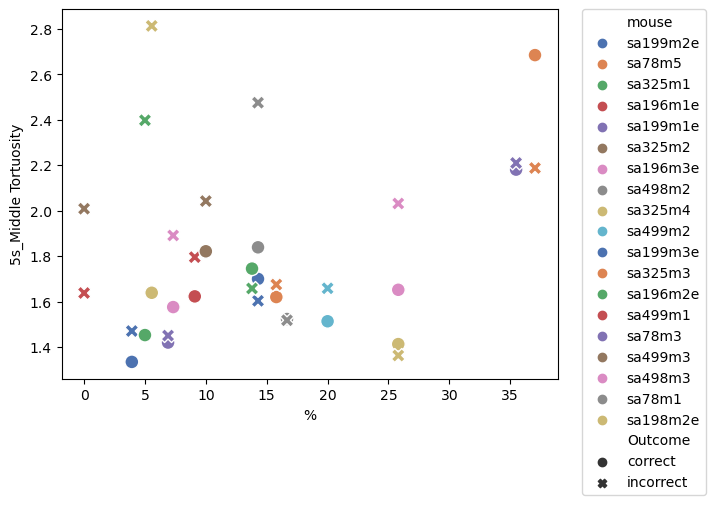

In [3716]:
sns.scatterplot(data=mean_middle_tortuosity_5s, x = '%', y = '5s_Middle Tortuosity', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3717]:
new_cur_coeff_time_prop_5s = get_performance(df_grouped_unscaled_ri, 'New Current Coeff Time Proportional', 5)

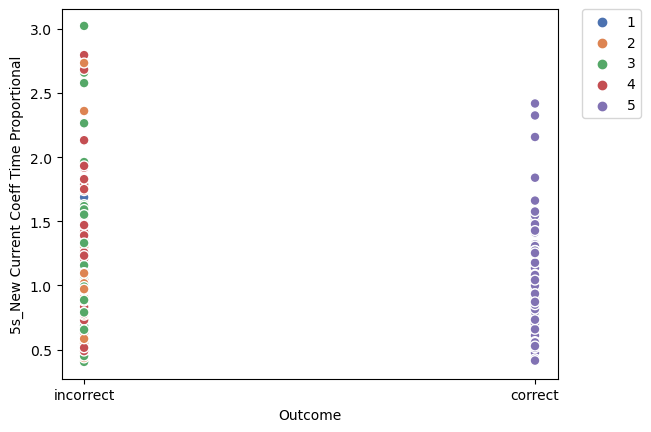

In [3718]:
sns.scatterplot(data=new_cur_coeff_time_prop_5s, x = 'Outcome', y = '5s_New Current Coeff Time Proportional', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3719]:
mean_new_cur_coeff_time_prop_5s = get_mean_performances(new_cur_coeff_time_prop_5s)

   mouse  5s_New Current Coeff Time Proportional         %   Outcome
sa199m2e                                0.556790  3.921569   correct
sa199m2e                                0.665383  3.921569 incorrect
  sa78m5                                1.355829 37.037037   correct
  sa78m5                                1.007141 37.037037 incorrect
 sa325m1                                0.815417  5.000000   correct
 sa325m1                                0.936010  5.000000 incorrect
sa196m1e                                1.227979  9.090909   correct
sa196m1e                                1.065427  9.090909 incorrect
sa199m1e                                0.907705  6.896552   correct
sa199m1e                                0.839353  6.896552 incorrect
 sa325m2                                1.271918 10.000000   correct
 sa325m2                                1.614431 10.000000 incorrect
sa196m3e                                0.950888  7.317073   correct
sa196m3e                          

C:\Users\Josue Regalado\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\Josue Regalado\anaconda3\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


In [3720]:
mean_new_cur_coeff_time_prop_5s

,mouse,5s_New Current Coeff Time Proportional,%,Outcome
0,sa199m2e,0.556790,3.921569,correct
1,sa199m2e,0.665383,3.921569,incorrect
2,sa78m5,1.355829,37.037037,correct
3,sa78m5,1.007141,37.037037,incorrect
4,sa325m1,0.815417,5.000000,correct
5,sa325m1,0.936010,5.000000,incorrect
6,sa196m1e,1.227979,9.090909,correct
7,sa196m1e,1.065427,9.090909,incorrect
8,sa199m1e,0.907705,6.896552,correct
9,sa199m1e,0.839353,6.896552,incorrect


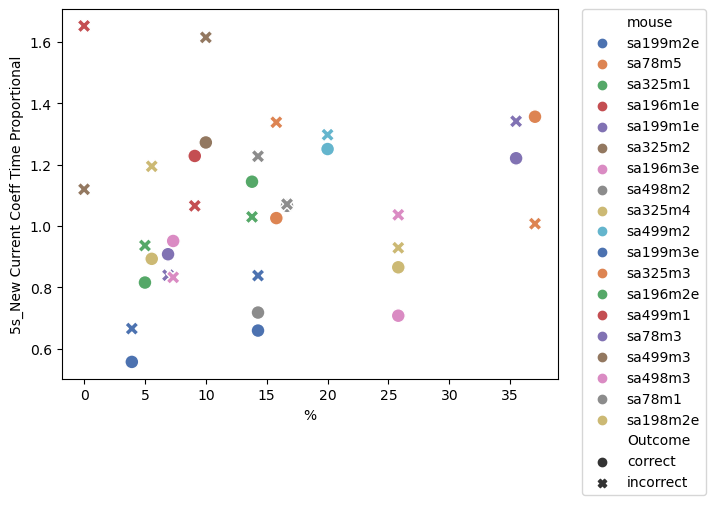

In [3721]:
sns.scatterplot(data=mean_new_cur_coeff_time_prop_5s, x = '%', y = '5s_New Current Coeff Time Proportional', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3722]:
new_current_coeff_5s = get_performance(df_grouped_unscaled_ri, 'New Current Coeff', 5)

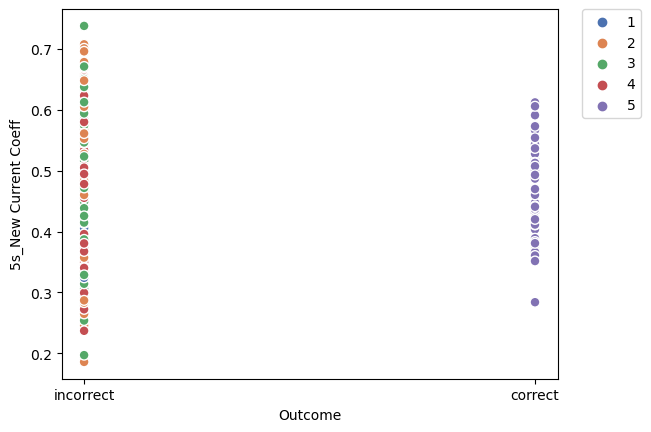

In [3723]:
sns.scatterplot(data=new_current_coeff_5s, x = 'Outcome', y = '5s_New Current Coeff', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3724]:
mean_new_current_coeff_5s = get_mean_performances(new_current_coeff_5s)

   mouse  5s_New Current Coeff         %   Outcome
sa199m2e              0.534523  3.921569   correct
sa199m2e              0.572993  3.921569 incorrect
  sa78m5              0.473607 37.037037   correct
  sa78m5              0.465777 37.037037 incorrect
 sa325m1              0.497787  5.000000   correct
 sa325m1              0.375755  5.000000 incorrect
sa196m1e              0.516162  9.090909   correct
sa196m1e              0.460435  9.090909 incorrect
sa199m1e              0.518590  6.896552   correct
sa199m1e              0.540341  6.896552 incorrect
 sa325m2              0.395150 10.000000   correct
 sa325m2              0.436127 10.000000 incorrect
sa196m3e              0.463516  7.317073   correct
sa196m3e              0.448973  7.317073 incorrect
 sa498m2              0.393671 14.285714   correct
 sa498m2              0.481124 14.285714 incorrect
 sa325m4              0.500570  5.555556   correct
 sa325m4              0.382557  5.555556 incorrect
 sa499m2              0.511598 

C:\Users\Josue Regalado\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\Josue Regalado\anaconda3\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


In [3725]:
mean_new_current_coeff_5s

,mouse,5s_New Current Coeff,%,Outcome
0,sa199m2e,0.534523,3.921569,correct
1,sa199m2e,0.572993,3.921569,incorrect
2,sa78m5,0.473607,37.037037,correct
3,sa78m5,0.465777,37.037037,incorrect
4,sa325m1,0.497787,5.000000,correct
5,sa325m1,0.375755,5.000000,incorrect
6,sa196m1e,0.516162,9.090909,correct
7,sa196m1e,0.460435,9.090909,incorrect
8,sa199m1e,0.518590,6.896552,correct
9,sa199m1e,0.540341,6.896552,incorrect


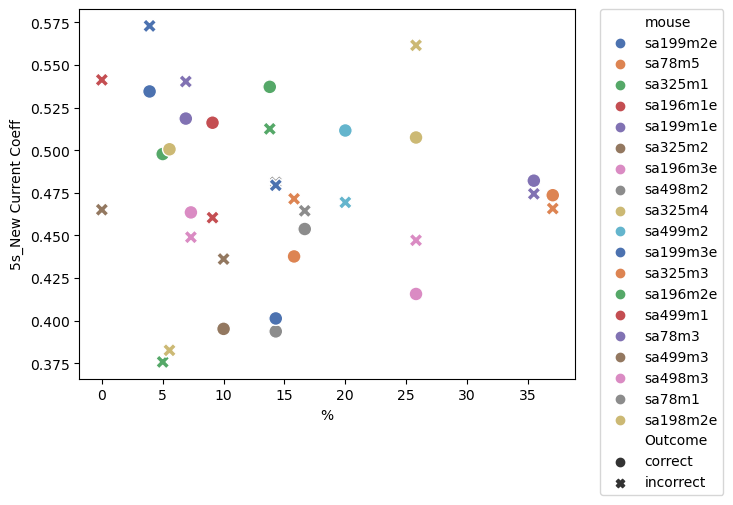

In [3726]:
sns.scatterplot(data=mean_new_current_coeff_5s, x = '%', y = '5s_New Current Coeff', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3727]:
current_coeff_5s = get_performance(df_grouped_unscaled_ri, 'Current Coeff', 5)

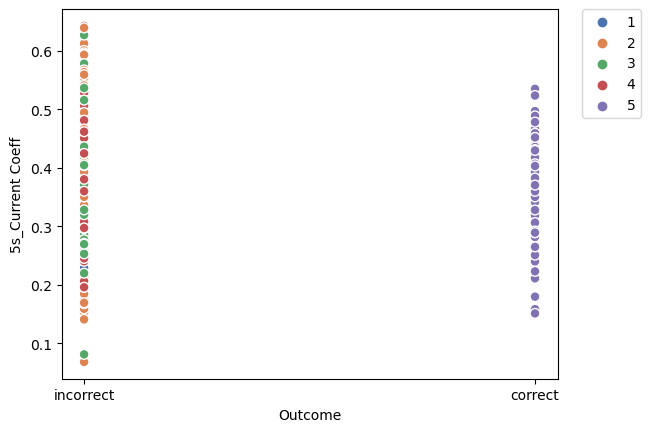

In [3728]:
sns.scatterplot(data=current_coeff_5s, x = 'Outcome', y = '5s_Current Coeff', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3729]:
mean_current_coeff_5s = get_mean_performances(current_coeff_5s)

   mouse  5s_Current Coeff         %   Outcome
sa199m2e          0.444695  3.921569   correct
sa199m2e          0.474569  3.921569 incorrect
  sa78m5          0.350218 37.037037   correct
  sa78m5          0.369323 37.037037 incorrect
 sa325m1          0.451892  5.000000   correct
 sa325m1          0.314634  5.000000 incorrect
sa196m1e          0.444363  9.090909   correct
sa196m1e          0.359791  9.090909 incorrect
sa199m1e          0.390848  6.896552   correct
sa199m1e          0.409642  6.896552 incorrect
 sa325m2          0.314708 10.000000   correct
 sa325m2          0.354351 10.000000 incorrect
sa196m3e          0.384044  7.317073   correct
sa196m3e          0.343722  7.317073 incorrect
 sa498m2          0.299727 14.285714   correct
 sa498m2          0.391916 14.285714 incorrect
 sa325m4          0.366510  5.555556   correct
 sa325m4          0.300545  5.555556 incorrect
 sa499m2          0.419953 20.000000   correct
 sa499m2          0.364191 20.000000 incorrect
sa199m3e     

C:\Users\Josue Regalado\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\Josue Regalado\anaconda3\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


In [3730]:
mean_current_coeff_5s

,mouse,5s_Current Coeff,%,Outcome
0,sa199m2e,0.444695,3.921569,correct
1,sa199m2e,0.474569,3.921569,incorrect
2,sa78m5,0.350218,37.037037,correct
3,sa78m5,0.369323,37.037037,incorrect
4,sa325m1,0.451892,5.000000,correct
5,sa325m1,0.314634,5.000000,incorrect
6,sa196m1e,0.444363,9.090909,correct
7,sa196m1e,0.359791,9.090909,incorrect
8,sa199m1e,0.390848,6.896552,correct
9,sa199m1e,0.409642,6.896552,incorrect


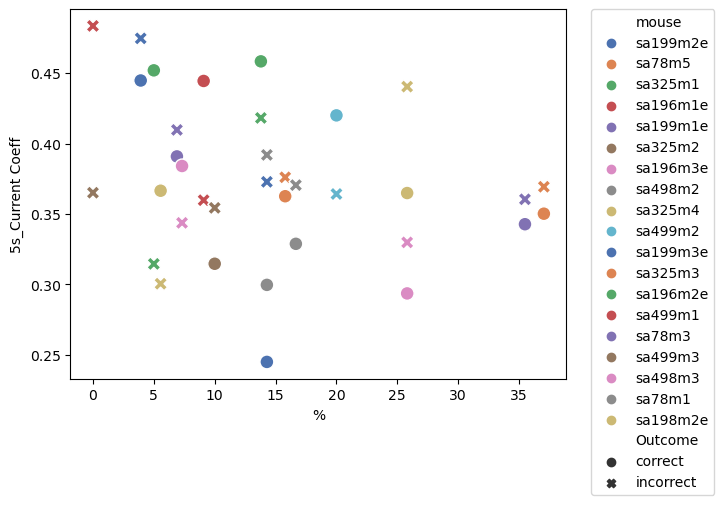

In [3731]:
sns.scatterplot(data=mean_current_coeff_5s, x = '%', y = '5s_Current Coeff', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3732]:
cur_coeff_time_prop_5s = get_performance(df_grouped_unscaled_ri, 'Current Coeff Time Proportional', 5)

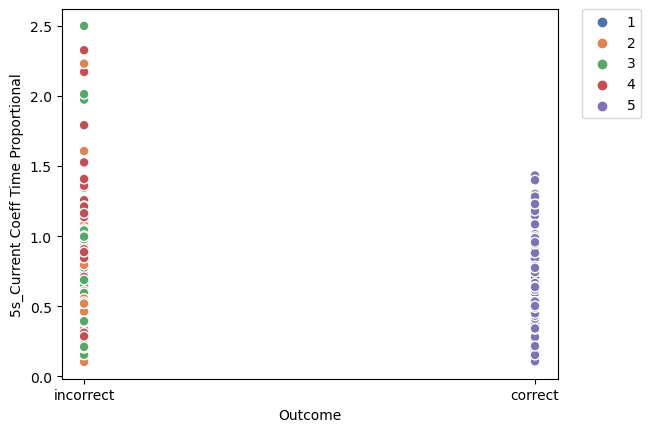

In [3733]:
sns.scatterplot(data=cur_coeff_time_prop_5s, x = 'Outcome', y = '5s_Current Coeff Time Proportional', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3734]:
mean_cur_coeff_time_prop_5s = get_mean_performances(cur_coeff_time_prop_5s)

   mouse  5s_Current Coeff Time Proportional         %   Outcome
sa199m2e                            0.235333  3.921569   correct
sa199m2e                            0.342454  3.921569 incorrect
  sa78m5                            0.816895 37.037037   correct
  sa78m5                            0.630615 37.037037 incorrect
 sa325m1                            0.595697  5.000000   correct
 sa325m1                            0.586959  5.000000 incorrect
sa196m1e                            0.768103  9.090909   correct
sa196m1e                            0.563035  9.090909 incorrect
sa199m1e                            0.453169  6.896552   correct
sa199m1e                            0.419256  6.896552 incorrect
 sa325m2                            0.704206 10.000000   correct
 sa325m2                            0.992693 10.000000 incorrect
sa196m3e                            0.558683  7.317073   correct
sa196m3e                            0.475210  7.317073 incorrect
 sa498m2                 

C:\Users\Josue Regalado\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\Josue Regalado\anaconda3\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


In [3735]:
mean_cur_coeff_time_prop_5s

,mouse,5s_Current Coeff Time Proportional,%,Outcome
0,sa199m2e,0.235333,3.921569,correct
1,sa199m2e,0.342454,3.921569,incorrect
2,sa78m5,0.816895,37.037037,correct
3,sa78m5,0.630615,37.037037,incorrect
4,sa325m1,0.595697,5.000000,correct
5,sa325m1,0.586959,5.000000,incorrect
6,sa196m1e,0.768103,9.090909,correct
7,sa196m1e,0.563035,9.090909,incorrect
8,sa199m1e,0.453169,6.896552,correct
9,sa199m1e,0.419256,6.896552,incorrect


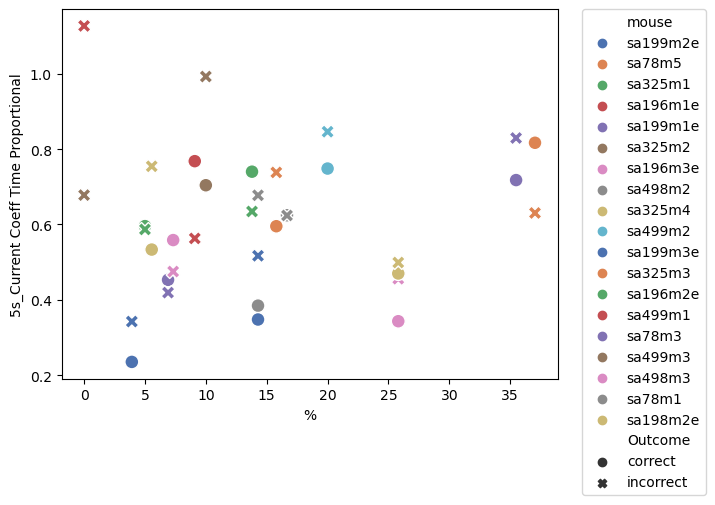

In [3736]:
sns.scatterplot(data=mean_cur_coeff_time_prop_5s, x = '%', y = '5s_Current Coeff Time Proportional', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3737]:
lagged_1_duration_5s = get_performance(df_grouped_unscaled_ri, 'lagged_1_duration', 5)

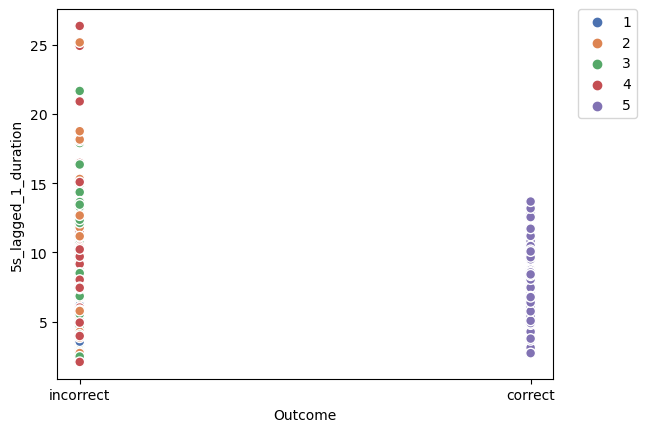

In [3738]:
sns.scatterplot(data=lagged_1_duration_5s, x = 'Outcome', y = '5s_lagged_1_duration', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3739]:
mean_lagged_1_duration_5s = get_mean_performances(lagged_1_duration_5s)

   mouse  5s_lagged_1_duration         %   Outcome
sa199m2e              4.025000  3.921569   correct
sa199m2e              4.370918  3.921569 incorrect
  sa78m5              7.312500 37.037037   correct
  sa78m5              7.154412 37.037037 incorrect
 sa325m1             12.758333  5.000000   correct
 sa325m1              9.525439  5.000000 incorrect
sa196m1e              9.966667  9.090909   correct
sa196m1e              9.413333  9.090909 incorrect
sa199m1e              7.045833  6.896552   correct
sa199m1e              7.398148  6.896552 incorrect
 sa325m2              7.312500 10.000000   correct
 sa325m2              8.659722 10.000000 incorrect
sa196m3e              6.358333  7.317073   correct
sa196m3e              4.771930  7.317073 incorrect
 sa498m2              9.925000 14.285714   correct
 sa498m2              7.007986 14.285714 incorrect
 sa325m4              6.825000  5.555556   correct
 sa325m4             11.136275  5.555556 incorrect
 sa499m2             10.602083 

C:\Users\Josue Regalado\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\Josue Regalado\anaconda3\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


In [3740]:
mean_lagged_1_duration_5s
#mean_lagged_1_duration_5s.to_csv('mean_arm_dur_past_2.csv', sep='\t', index=False)


,mouse,5s_lagged_1_duration,%,Outcome
0,sa199m2e,4.025000,3.921569,correct
1,sa199m2e,4.370918,3.921569,incorrect
2,sa78m5,7.312500,37.037037,correct
3,sa78m5,7.154412,37.037037,incorrect
4,sa325m1,12.758333,5.000000,correct
5,sa325m1,9.525439,5.000000,incorrect
6,sa196m1e,9.966667,9.090909,correct
7,sa196m1e,9.413333,9.090909,incorrect
8,sa199m1e,7.045833,6.896552,correct
9,sa199m1e,7.398148,6.896552,incorrect


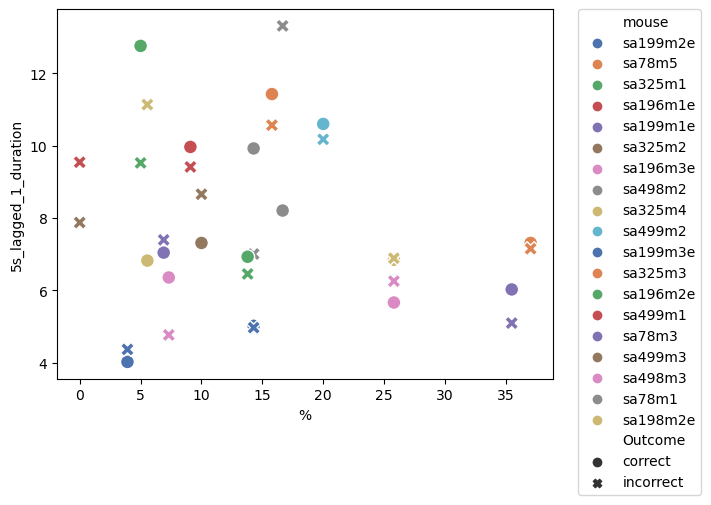

In [3741]:
sns.scatterplot(data=mean_lagged_1_duration_5s, x = '%', y = '5s_lagged_1_duration', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3742]:
lagged_1_nose_time_to_max_dist_5s = get_performance(df_grouped_unscaled_ri, 'lagged_1_nose_time_to_max_dist', 5)

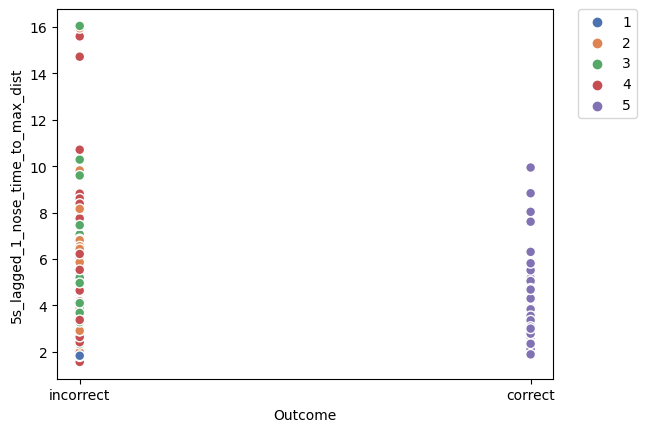

In [3743]:
sns.scatterplot(data=lagged_1_nose_time_to_max_dist_5s, x = 'Outcome', y = '5s_lagged_1_nose_time_to_max_dist', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3744]:
mean_lagged_1_nose_time_to_max_dist_5s = get_mean_performances(lagged_1_nose_time_to_max_dist_5s)

   mouse  5s_lagged_1_nose_time_to_max_dist         %   Outcome
sa199m2e                           2.354167  3.921569   correct
sa199m2e                           2.689286  3.921569 incorrect
  sa78m5                           4.303333 37.037037   correct
  sa78m5                           3.760294 37.037037 incorrect
 sa325m1                           8.033333  5.000000   correct
 sa325m1                           5.304825  5.000000 incorrect
sa196m1e                           7.245833  9.090909   correct
sa196m1e                           4.481667  9.090909 incorrect
sa199m1e                           3.741667  6.896552   correct
sa199m1e                           4.066667  6.896552 incorrect
 sa325m2                           5.000000 10.000000   correct
 sa325m2                           5.276852 10.000000 incorrect
sa196m3e                           3.658333  7.317073   correct
sa196m3e                           2.806798  7.317073 incorrect
 sa498m2                           3.610

C:\Users\Josue Regalado\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\Josue Regalado\anaconda3\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


In [3745]:
mean_lagged_1_nose_time_to_max_dist_5s

#mean_lagged_1_nose_time_to_max_dist_5s.to_csv('mean_time_to_max_past_2.csv', sep='\t', index=False)

,mouse,5s_lagged_1_nose_time_to_max_dist,%,Outcome
0,sa199m2e,2.354167,3.921569,correct
1,sa199m2e,2.689286,3.921569,incorrect
2,sa78m5,4.303333,37.037037,correct
3,sa78m5,3.760294,37.037037,incorrect
4,sa325m1,8.033333,5.000000,correct
5,sa325m1,5.304825,5.000000,incorrect
6,sa196m1e,7.245833,9.090909,correct
7,sa196m1e,4.481667,9.090909,incorrect
8,sa199m1e,3.741667,6.896552,correct
9,sa199m1e,4.066667,6.896552,incorrect


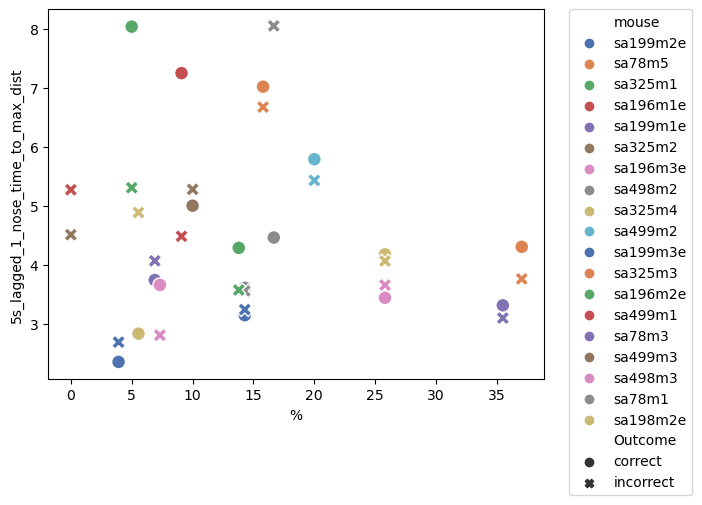

In [3746]:
sns.scatterplot(data=mean_lagged_1_nose_time_to_max_dist_5s, x = '%', y = '5s_lagged_1_nose_time_to_max_dist', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3747]:
lagged_1_arm_nose_mov_5s = get_performance(df_grouped_unscaled_ri, 'lagged_1_arm_nose_mov', 5)

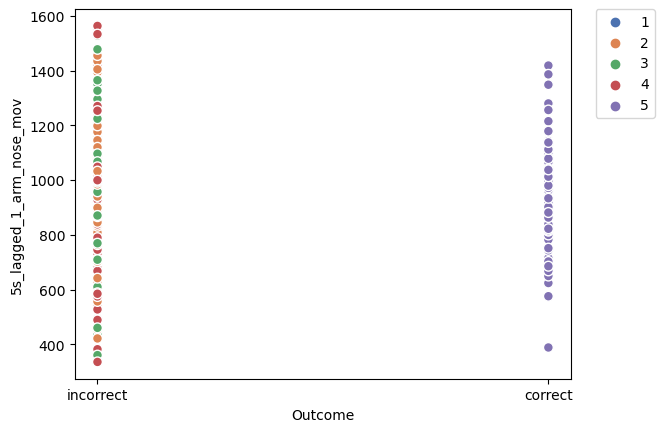

In [3748]:
sns.scatterplot(data=lagged_1_arm_nose_mov_5s, x = 'Outcome', y = '5s_lagged_1_arm_nose_mov', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3749]:
mean_lagged_1_arm_nose_mov_5s = get_mean_performances(lagged_1_arm_nose_mov_5s)

   mouse  5s_lagged_1_arm_nose_mov         %   Outcome
sa199m2e                788.973901  3.921569   correct
sa199m2e                888.655253  3.921569 incorrect
  sa78m5               1021.785028 37.037037   correct
  sa78m5                967.494285 37.037037 incorrect
 sa325m1               1386.402790  5.000000   correct
 sa325m1               1067.665882  5.000000 incorrect
sa196m1e               1129.521863  9.090909   correct
sa196m1e                998.353003  9.090909 incorrect
sa199m1e                998.527879  6.896552   correct
sa199m1e               1017.697916  6.896552 incorrect
 sa325m2                863.049492 10.000000   correct
 sa325m2                874.463488 10.000000 incorrect
sa196m3e                877.219550  7.317073   correct
sa196m3e                785.065973  7.317073 incorrect
 sa498m2                946.877246 14.285714   correct
 sa498m2                764.642024 14.285714 incorrect
 sa325m4                863.227439  5.555556   correct
 sa325m4  

C:\Users\Josue Regalado\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\Josue Regalado\anaconda3\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


In [3750]:
mean_lagged_1_arm_nose_mov_5s

#mean_lagged_1_arm_nose_mov_5s.to_csv('dist_in_arm_past_2_nose.csv', sep='\t', index=False)

,mouse,5s_lagged_1_arm_nose_mov,%,Outcome
0,sa199m2e,788.973901,3.921569,correct
1,sa199m2e,888.655253,3.921569,incorrect
2,sa78m5,1021.785028,37.037037,correct
3,sa78m5,967.494285,37.037037,incorrect
4,sa325m1,1386.402790,5.000000,correct
5,sa325m1,1067.665882,5.000000,incorrect
6,sa196m1e,1129.521863,9.090909,correct
7,sa196m1e,998.353003,9.090909,incorrect
8,sa199m1e,998.527879,6.896552,correct
9,sa199m1e,1017.697916,6.896552,incorrect


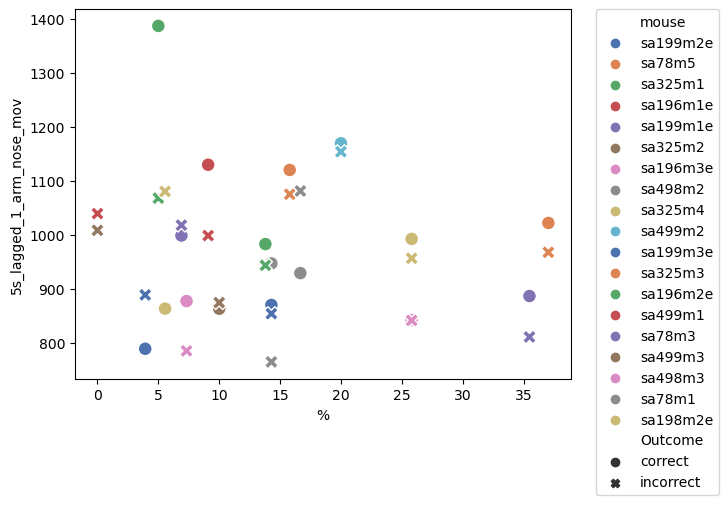

In [3751]:
sns.scatterplot(data=mean_lagged_1_arm_nose_mov_5s, x = '%', y = '5s_lagged_1_arm_nose_mov', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3752]:
lagged_1_arm_nose_vel_5s = get_performance(df_grouped_unscaled_ri, 'lagged_1_arm_nose_vel', 5)

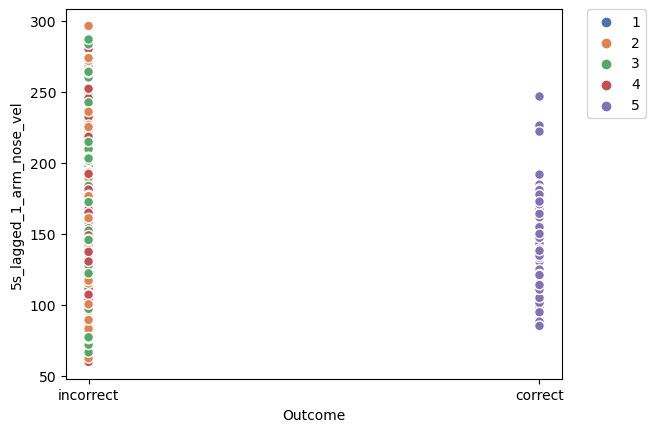

In [3753]:
sns.scatterplot(data=lagged_1_arm_nose_vel_5s, x = 'Outcome', y = '5s_lagged_1_arm_nose_vel', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3754]:
mean_lagged_1_arm_nose_vel_5s = get_mean_performances(lagged_1_arm_nose_vel_5s)

   mouse  5s_lagged_1_arm_nose_vel         %   Outcome
sa199m2e                212.144645  3.921569   correct
sa199m2e                221.449275  3.921569 incorrect
  sa78m5                149.058641 37.037037   correct
  sa78m5                144.545207 37.037037 incorrect
 sa325m1                109.380215  5.000000   correct
 sa325m1                125.158759  5.000000 incorrect
sa196m1e                134.559005  9.090909   correct
sa196m1e                121.782989  9.090909 incorrect
sa199m1e                147.178732  6.896552   correct
sa199m1e                143.729191  6.896552 incorrect
 sa325m2                110.624120 10.000000   correct
 sa325m2                100.653541 10.000000 incorrect
sa196m3e                144.414101  7.317073   correct
sa196m3e                170.458795  7.317073 incorrect
 sa498m2                 88.986745 14.285714   correct
 sa498m2                112.662483 14.285714 incorrect
 sa325m4                124.937768  5.555556   correct
 sa325m4  

C:\Users\Josue Regalado\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\Josue Regalado\anaconda3\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


In [3755]:
mean_lagged_1_arm_nose_vel_5s
#mean_lagged_1_arm_nose_vel_5s.to_csv('mean_vel_past_2_nose.csv', sep='\t', index=False)

,mouse,5s_lagged_1_arm_nose_vel,%,Outcome
0,sa199m2e,212.144645,3.921569,correct
1,sa199m2e,221.449275,3.921569,incorrect
2,sa78m5,149.058641,37.037037,correct
3,sa78m5,144.545207,37.037037,incorrect
4,sa325m1,109.380215,5.000000,correct
5,sa325m1,125.158759,5.000000,incorrect
6,sa196m1e,134.559005,9.090909,correct
7,sa196m1e,121.782989,9.090909,incorrect
8,sa199m1e,147.178732,6.896552,correct
9,sa199m1e,143.729191,6.896552,incorrect


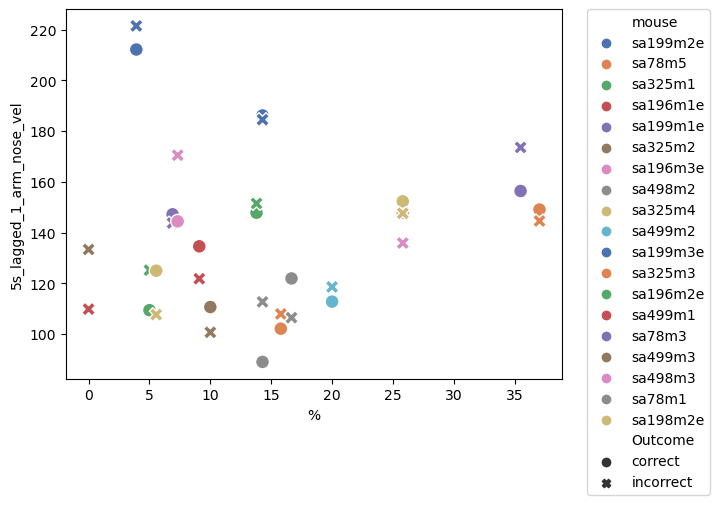

In [3756]:
sns.scatterplot(data=mean_lagged_1_arm_nose_vel_5s, x = '%', y = '5s_lagged_1_arm_nose_vel', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3757]:
lagged_1_arm_tail_mov_5s = get_performance(df_grouped_unscaled_ri, 'lagged_1_arm_tail_mov', 5)

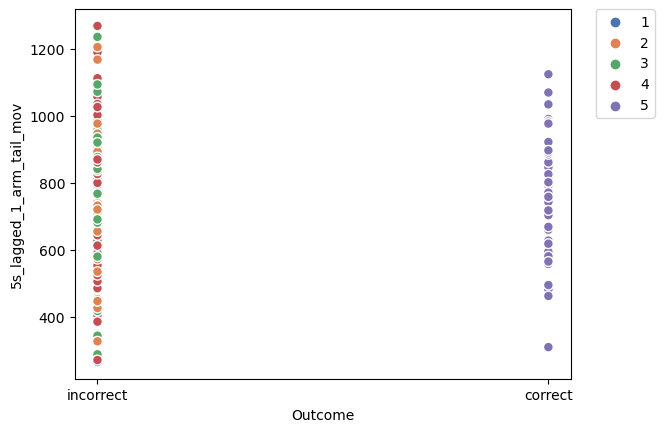

In [3758]:
sns.scatterplot(data=lagged_1_arm_tail_mov_5s, x = 'Outcome', y = '5s_lagged_1_arm_tail_mov', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3759]:
mean_lagged_1_arm_tail_mov_5s = get_mean_performances(lagged_1_arm_tail_mov_5s)

   mouse  5s_lagged_1_arm_tail_mov         %   Outcome
sa199m2e                667.952267  3.921569   correct
sa199m2e                727.709518  3.921569 incorrect
  sa78m5                813.628382 37.037037   correct
  sa78m5                769.037824 37.037037 incorrect
 sa325m1               1124.714043  5.000000   correct
 sa325m1                856.662242  5.000000 incorrect
sa196m1e                831.007736  9.090909   correct
sa196m1e                730.098036  9.090909 incorrect
sa199m1e                766.314276  6.896552   correct
sa199m1e                822.768459  6.896552 incorrect
 sa325m2                705.636444 10.000000   correct
 sa325m2                690.701181 10.000000 incorrect
sa196m3e                689.644095  7.317073   correct
sa196m3e                621.546260  7.317073 incorrect
 sa498m2                757.276751 14.285714   correct
 sa498m2                589.132564 14.285714 incorrect
 sa325m4                712.525418  5.555556   correct
 sa325m4  

C:\Users\Josue Regalado\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\Josue Regalado\anaconda3\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


In [3760]:
mean_lagged_1_arm_tail_mov_5s
#mean_lagged_1_arm_tail_mov_5s.to_csv('dist_in_arm_past_2_tail.csv', sep='\t', index=False)

,mouse,5s_lagged_1_arm_tail_mov,%,Outcome
0,sa199m2e,667.952267,3.921569,correct
1,sa199m2e,727.709518,3.921569,incorrect
2,sa78m5,813.628382,37.037037,correct
3,sa78m5,769.037824,37.037037,incorrect
4,sa325m1,1124.714043,5.000000,correct
5,sa325m1,856.662242,5.000000,incorrect
6,sa196m1e,831.007736,9.090909,correct
7,sa196m1e,730.098036,9.090909,incorrect
8,sa199m1e,766.314276,6.896552,correct
9,sa199m1e,822.768459,6.896552,incorrect


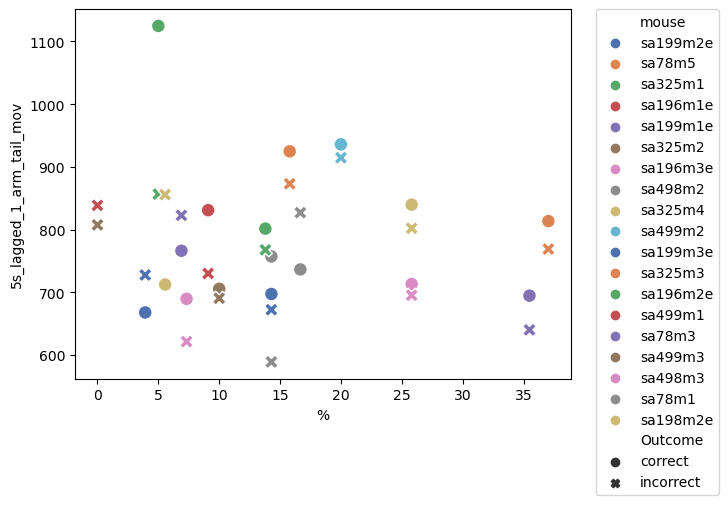

In [3761]:
sns.scatterplot(data=mean_lagged_1_arm_tail_mov_5s, x = '%', y = '5s_lagged_1_arm_tail_mov', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3762]:
lagged_1_arm_tail_vel_5s = get_performance(df_grouped_unscaled_ri, 'lagged_1_arm_tail_vel', 5)

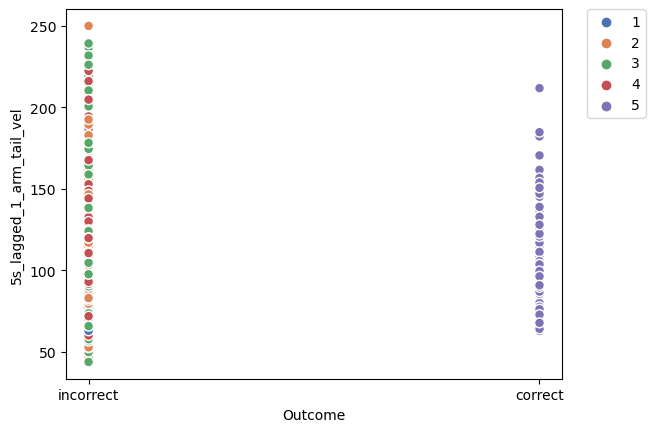

In [3763]:
sns.scatterplot(data=lagged_1_arm_tail_vel_5s, x = 'Outcome', y = '5s_lagged_1_arm_tail_vel', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3764]:
mean_lagged_1_arm_tail_vel_5s = get_mean_performances(lagged_1_arm_tail_vel_5s)

   mouse  5s_lagged_1_arm_tail_vel         %   Outcome
sa199m2e                174.960099  3.921569   correct
sa199m2e                181.508989  3.921569 incorrect
  sa78m5                117.798771 37.037037   correct
  sa78m5                110.756594 37.037037 incorrect
 sa325m1                 88.482980  5.000000   correct
 sa325m1                100.188860  5.000000 incorrect
sa196m1e                 96.992373  9.090909   correct
sa196m1e                 86.751930  9.090909 incorrect
sa199m1e                115.020250  6.896552   correct
sa199m1e                117.624570  6.896552 incorrect
 sa325m2                 89.094790 10.000000   correct
 sa325m2                 78.897161 10.000000 incorrect
sa196m3e                110.328692  7.317073   correct
sa196m3e                128.290612  7.317073 incorrect
 sa498m2                 70.054562 14.285714   correct
 sa498m2                 77.897691 14.285714 incorrect
 sa325m4                102.173473  5.555556   correct
 sa325m4  

C:\Users\Josue Regalado\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\Josue Regalado\anaconda3\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


In [3765]:
mean_lagged_1_arm_tail_vel_5s
#mean_lagged_1_arm_tail_vel_5s.to_csv('mean_vel_past_2_tail.csv', sep='\t', index=False)

,mouse,5s_lagged_1_arm_tail_vel,%,Outcome
0,sa199m2e,174.960099,3.921569,correct
1,sa199m2e,181.508989,3.921569,incorrect
2,sa78m5,117.798771,37.037037,correct
3,sa78m5,110.756594,37.037037,incorrect
4,sa325m1,88.482980,5.000000,correct
5,sa325m1,100.188860,5.000000,incorrect
6,sa196m1e,96.992373,9.090909,correct
7,sa196m1e,86.751930,9.090909,incorrect
8,sa199m1e,115.020250,6.896552,correct
9,sa199m1e,117.624570,6.896552,incorrect


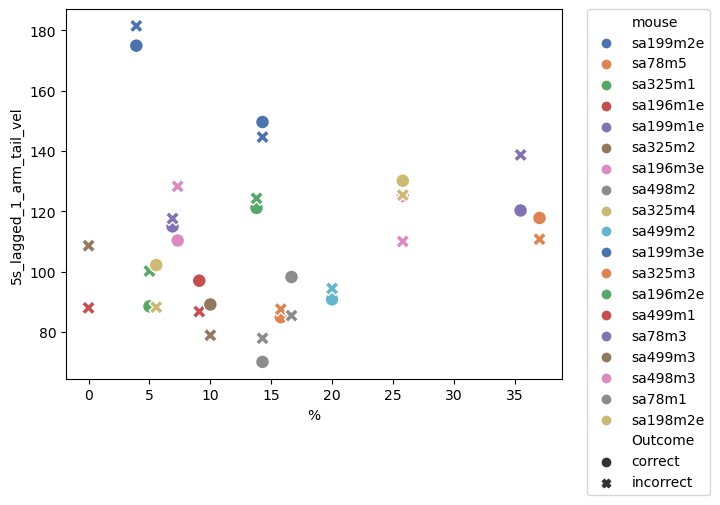

In [3766]:
sns.scatterplot(data=mean_lagged_1_arm_tail_vel_5s, x = '%', y = '5s_lagged_1_arm_tail_vel', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3767]:
lagged_1_entry_tortuosity_5s = get_performance(df_grouped_unscaled_ri, 'lagged_1_entry_tortuosity', 5)

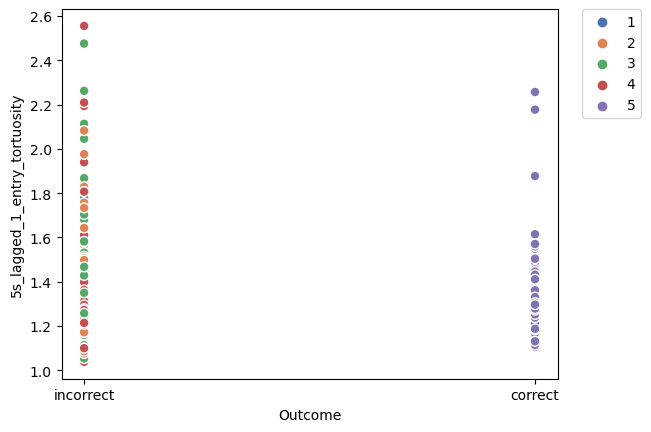

In [3768]:
sns.scatterplot(data=lagged_1_entry_tortuosity_5s, x = 'Outcome', y = '5s_lagged_1_entry_tortuosity', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3769]:
mean_lagged_1_entry_tortuosity_5s = get_mean_performances(lagged_1_entry_tortuosity_5s)

   mouse  5s_lagged_1_entry_tortuosity         %   Outcome
sa199m2e                      1.201692  3.921569   correct
sa199m2e                      1.256337  3.921569 incorrect
  sa78m5                      1.373767 37.037037   correct
  sa78m5                      1.331247 37.037037 incorrect
 sa325m1                      1.877236  5.000000   correct
 sa325m1                      1.447160  5.000000 incorrect
sa196m1e                      1.798146  9.090909   correct
sa196m1e                      1.449431  9.090909 incorrect
sa199m1e                      1.226986  6.896552   correct
sa199m1e                      1.270752  6.896552 incorrect
 sa325m2                      1.479283 10.000000   correct
 sa325m2                      1.489077 10.000000 incorrect
sa196m3e                      1.364410  7.317073   correct
sa196m3e                      1.264189  7.317073 incorrect
 sa498m2                      1.318985 14.285714   correct
 sa498m2                      1.583726 14.285714 incorre

C:\Users\Josue Regalado\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\Josue Regalado\anaconda3\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


In [3770]:
mean_lagged_1_entry_tortuosity_5s

,mouse,5s_lagged_1_entry_tortuosity,%,Outcome
0,sa199m2e,1.201692,3.921569,correct
1,sa199m2e,1.256337,3.921569,incorrect
2,sa78m5,1.373767,37.037037,correct
3,sa78m5,1.331247,37.037037,incorrect
4,sa325m1,1.877236,5.000000,correct
5,sa325m1,1.447160,5.000000,incorrect
6,sa196m1e,1.798146,9.090909,correct
7,sa196m1e,1.449431,9.090909,incorrect
8,sa199m1e,1.226986,6.896552,correct
9,sa199m1e,1.270752,6.896552,incorrect


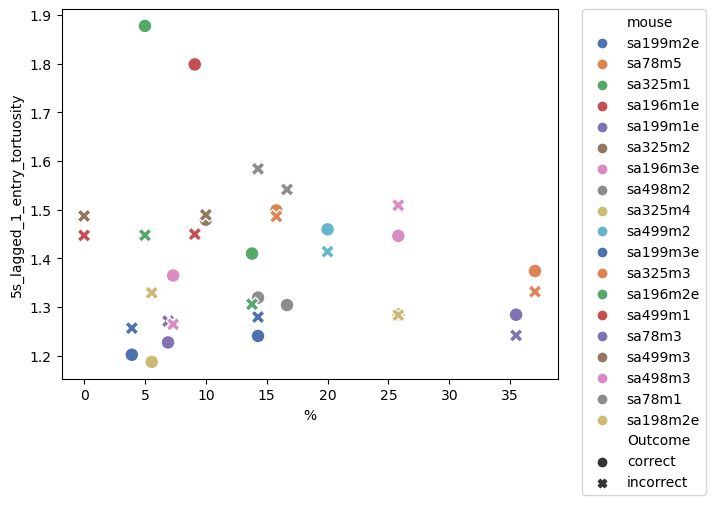

In [3771]:
sns.scatterplot(data=mean_lagged_1_entry_tortuosity_5s, x = '%', y = '5s_lagged_1_entry_tortuosity', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3772]:
lagged_1_exit_tortuosity_5s = get_performance(df_grouped_unscaled_ri, 'lagged_1_exit_tortuosity', 5)

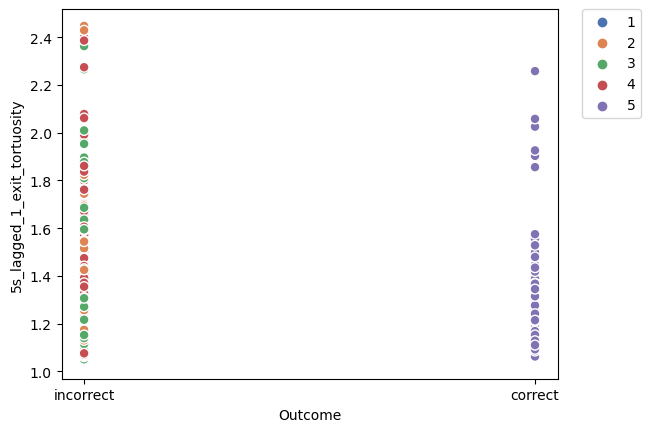

In [3773]:
sns.scatterplot(data=lagged_1_exit_tortuosity_5s, x = 'Outcome', y = '5s_lagged_1_exit_tortuosity', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3774]:
mean_lagged_1_exit_tortuosity_5s = get_mean_performances(lagged_1_exit_tortuosity_5s)

   mouse  5s_lagged_1_exit_tortuosity         %   Outcome
sa199m2e                     1.125823  3.921569   correct
sa199m2e                     1.187512  3.921569 incorrect
  sa78m5                     1.380699 37.037037   correct
  sa78m5                     1.370622 37.037037 incorrect
 sa325m1                     1.498232  5.000000   correct
 sa325m1                     1.488457  5.000000 incorrect
sa196m1e                     1.309645  9.090909   correct
sa196m1e                     1.521646  9.090909 incorrect
sa199m1e                     1.356803  6.896552   correct
sa199m1e                     1.261533  6.896552 incorrect
 sa325m2                     1.364949 10.000000   correct
 sa325m2                     1.489925 10.000000 incorrect
sa196m3e                     1.264486  7.317073   correct
sa196m3e                     1.245517  7.317073 incorrect
 sa498m2                     1.770676 14.285714   correct
 sa498m2                     1.454794 14.285714 incorrect
 sa325m4      

C:\Users\Josue Regalado\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\Josue Regalado\anaconda3\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


In [3775]:
mean_lagged_1_exit_tortuosity_5s

#mean_lagged_1_exit_tortuosity_5s.to_csv('mean_exit_tortuosity_past_2.csv', sep='\t', index=False)

,mouse,5s_lagged_1_exit_tortuosity,%,Outcome
0,sa199m2e,1.125823,3.921569,correct
1,sa199m2e,1.187512,3.921569,incorrect
2,sa78m5,1.380699,37.037037,correct
3,sa78m5,1.370622,37.037037,incorrect
4,sa325m1,1.498232,5.000000,correct
5,sa325m1,1.488457,5.000000,incorrect
6,sa196m1e,1.309645,9.090909,correct
7,sa196m1e,1.521646,9.090909,incorrect
8,sa199m1e,1.356803,6.896552,correct
9,sa199m1e,1.261533,6.896552,incorrect


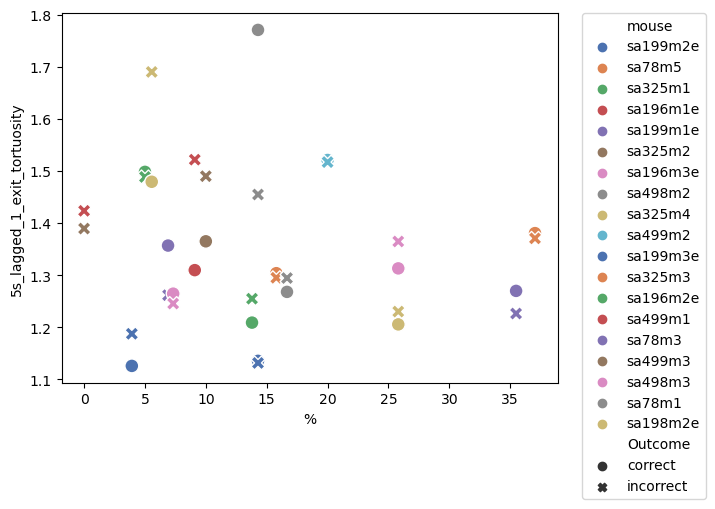

In [3776]:
sns.scatterplot(data=mean_lagged_1_exit_tortuosity_5s, x = '%', y = '5s_lagged_1_exit_tortuosity', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3777]:
lagged_1_other_tortuosity_5s = get_performance(df_grouped_unscaled_ri, 'lagged_1_other_tortuosity', 5)

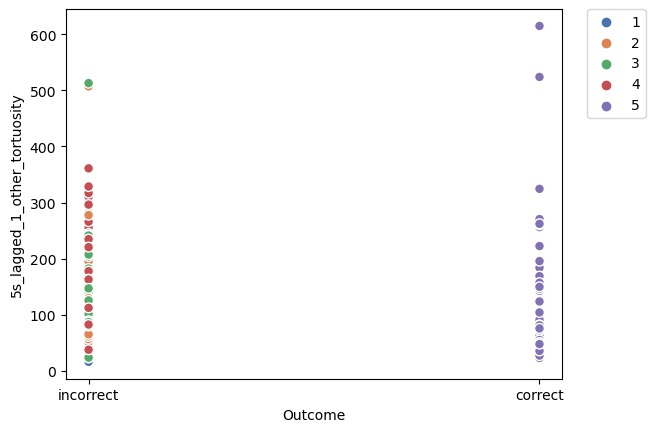

In [3778]:
sns.scatterplot(data=lagged_1_other_tortuosity_5s, x = 'Outcome', y = '5s_lagged_1_other_tortuosity', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3779]:
mean_lagged_1_other_tortuosity_5s = get_mean_performances(lagged_1_other_tortuosity_5s)

   mouse  5s_lagged_1_other_tortuosity         %   Outcome
sa199m2e                     54.195807  3.921569   correct
sa199m2e                     74.649389  3.921569 incorrect
  sa78m5                     91.076507 37.037037   correct
  sa78m5                    114.907912 37.037037 incorrect
 sa325m1                     90.834863  5.000000   correct
 sa325m1                     87.971632  5.000000 incorrect
sa196m1e                    178.099727  9.090909   correct
sa196m1e                    114.665778  9.090909 incorrect
sa199m1e                     66.589584  6.896552   correct
sa199m1e                     99.015391  6.896552 incorrect
 sa325m2                     37.652757 10.000000   correct
 sa325m2                     68.594511 10.000000 incorrect
sa196m3e                     77.771336  7.317073   correct
sa196m3e                     62.319074  7.317073 incorrect
 sa498m2                     89.896648 14.285714   correct
 sa498m2                     86.598609 14.285714 incorre

C:\Users\Josue Regalado\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\Josue Regalado\anaconda3\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


In [3780]:
mean_lagged_1_other_tortuosity_5s


,mouse,5s_lagged_1_other_tortuosity,%,Outcome
0,sa199m2e,54.195807,3.921569,correct
1,sa199m2e,74.649389,3.921569,incorrect
2,sa78m5,91.076507,37.037037,correct
3,sa78m5,114.907912,37.037037,incorrect
4,sa325m1,90.834863,5.000000,correct
5,sa325m1,87.971632,5.000000,incorrect
6,sa196m1e,178.099727,9.090909,correct
7,sa196m1e,114.665778,9.090909,incorrect
8,sa199m1e,66.589584,6.896552,correct
9,sa199m1e,99.015391,6.896552,incorrect


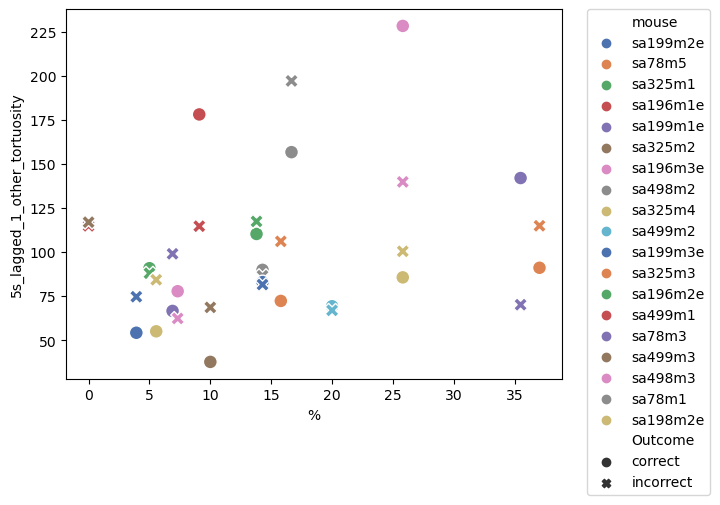

In [3781]:
sns.scatterplot(data=mean_lagged_1_other_tortuosity_5s, x = '%', y = '5s_lagged_1_other_tortuosity', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3782]:
entry_latency_5s = get_performance(df_grouped_unscaled_ri, 'Entry Latency', 5)

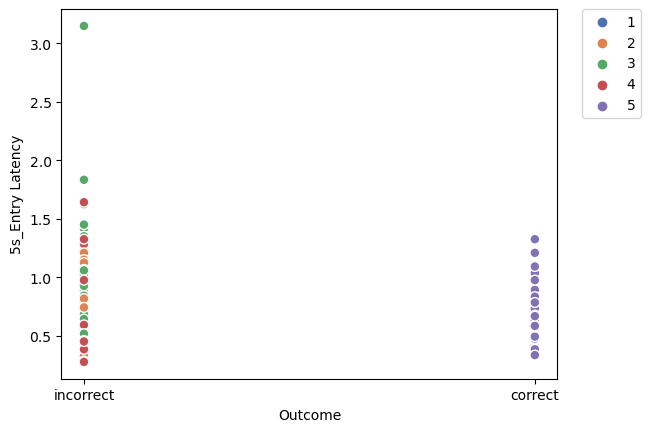

In [3783]:
sns.scatterplot(data=entry_latency_5s, x = 'Outcome', y = '5s_Entry Latency', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3784]:
mean_entry_latency_5s = get_mean_performances(entry_latency_5s)

   mouse  5s_Entry Latency         %   Outcome
sa199m2e          0.466667  3.921569   correct
sa199m2e          0.451531  3.921569 incorrect
  sa78m5          0.722500 37.037037   correct
  sa78m5          0.531863 37.037037 incorrect
 sa325m1          0.333333  5.000000   correct
 sa325m1          0.587281  5.000000 incorrect
sa196m1e          0.633333  9.090909   correct
sa196m1e          0.710000  9.090909 incorrect
sa199m1e          0.604167  6.896552   correct
sa199m1e          0.567593  6.896552 incorrect
 sa325m2          0.962500 10.000000   correct
 sa325m2          1.005093 10.000000 incorrect
sa196m3e          0.627778  7.317073   correct
sa196m3e          0.574342  7.317073 incorrect
 sa498m2          0.593750 14.285714   correct
 sa498m2          0.872569 14.285714 incorrect
 sa325m4          0.508333  5.555556   correct
 sa325m4          0.762745  5.555556 incorrect
 sa499m2          0.829167 20.000000   correct
 sa499m2          0.721354 20.000000 incorrect
sa199m3e     

C:\Users\Josue Regalado\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\Josue Regalado\anaconda3\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


In [3785]:
mean_entry_latency_5s

,mouse,5s_Entry Latency,%,Outcome
0,sa199m2e,0.466667,3.921569,correct
1,sa199m2e,0.451531,3.921569,incorrect
2,sa78m5,0.722500,37.037037,correct
3,sa78m5,0.531863,37.037037,incorrect
4,sa325m1,0.333333,5.000000,correct
5,sa325m1,0.587281,5.000000,incorrect
6,sa196m1e,0.633333,9.090909,correct
7,sa196m1e,0.710000,9.090909,incorrect
8,sa199m1e,0.604167,6.896552,correct
9,sa199m1e,0.567593,6.896552,incorrect


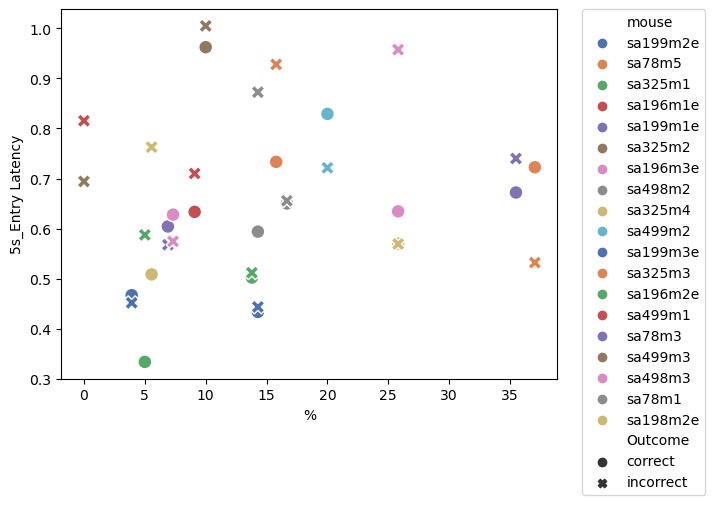

In [3786]:
sns.scatterplot(data=mean_entry_latency_5s, x = '%', y = '5s_Entry Latency', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3787]:
lagged_1_new_cur_coeff_5s = get_performance(df_grouped_unscaled_ri, 'New Lagged 1 Cur Coeff', 5)

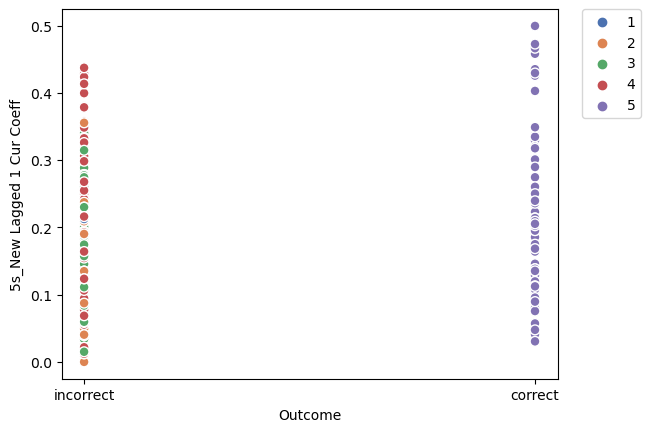

In [3788]:
sns.scatterplot(data=lagged_1_new_cur_coeff_5s, x = 'Outcome', y = '5s_New Lagged 1 Cur Coeff', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3789]:
mean_lagged_1_new_cur_coeff_5s = get_mean_performances(lagged_1_new_cur_coeff_5s)

   mouse  5s_New Lagged 1 Cur Coeff         %   Outcome
sa199m2e                   0.089450  3.921569   correct
sa199m2e                   0.098738  3.921569 incorrect
  sa78m5                   0.194532 37.037037   correct
  sa78m5                   0.162369 37.037037 incorrect
 sa325m1                   0.274541  5.000000   correct
 sa325m1                   0.200123  5.000000 incorrect
sa196m1e                   0.131739  9.090909   correct
sa196m1e                   0.214456  9.090909 incorrect
sa199m1e                   0.177716  6.896552   correct
sa199m1e                   0.165192  6.896552 incorrect
 sa325m2                   0.227195 10.000000   correct
 sa325m2                   0.136170 10.000000 incorrect
sa196m3e                   0.077042  7.317073   correct
sa196m3e                   0.152464  7.317073 incorrect
 sa498m2                   0.332560 14.285714   correct
 sa498m2                   0.135116 14.285714 incorrect
 sa325m4                   0.095618  5.555556   

C:\Users\Josue Regalado\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\Josue Regalado\anaconda3\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


In [3790]:
mean_lagged_1_new_cur_coeff_5s

,mouse,5s_New Lagged 1 Cur Coeff,%,Outcome
0,sa199m2e,0.089450,3.921569,correct
1,sa199m2e,0.098738,3.921569,incorrect
2,sa78m5,0.194532,37.037037,correct
3,sa78m5,0.162369,37.037037,incorrect
4,sa325m1,0.274541,5.000000,correct
5,sa325m1,0.200123,5.000000,incorrect
6,sa196m1e,0.131739,9.090909,correct
7,sa196m1e,0.214456,9.090909,incorrect
8,sa199m1e,0.177716,6.896552,correct
9,sa199m1e,0.165192,6.896552,incorrect


C:\Users\Josue Regalado\anaconda3\Lib\site-packages\IPython\core\displayhook.py:281: UserWarning: Output cache limit (currently 1000 entries) hit.
Flushing oldest 200 entries.
  warn('Output cache limit (currently {sz} entries) hit.\n'


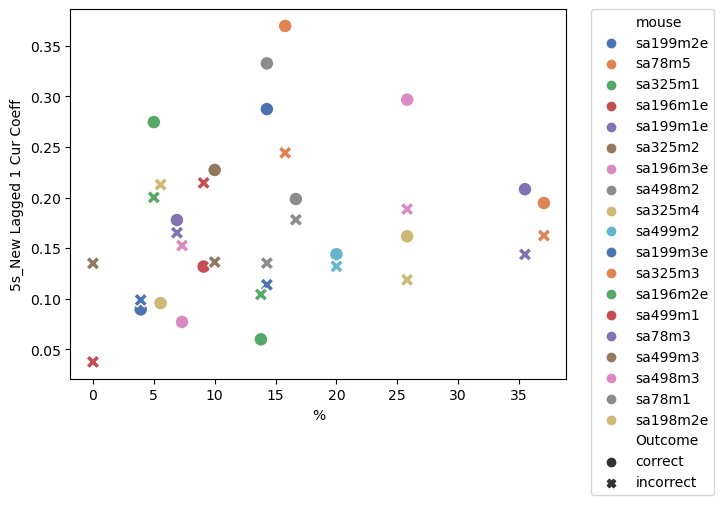

In [3791]:
sns.scatterplot(data=mean_lagged_1_new_cur_coeff_5s, x = '%', y = '5s_New Lagged 1 Cur Coeff', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3792]:
middle_duration_5s = get_performance(df_grouped_unscaled_ri, 'Middle Duration', 5)

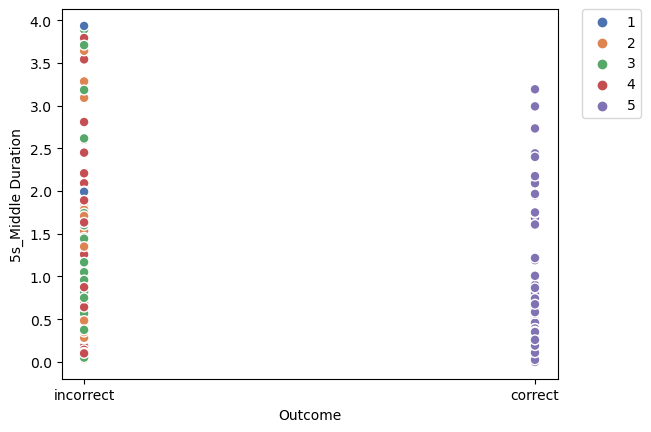

In [3793]:
sns.scatterplot(data=middle_duration_5s, x = 'Outcome', y = '5s_Middle Duration', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3794]:
mean_middle_duration_5s = get_mean_performances(middle_duration_5s)

   mouse  5s_Middle Duration         %   Outcome
sa199m2e            0.279167  3.921569   correct
sa199m2e            0.431973  3.921569 incorrect
  sa78m5            1.464167 37.037037   correct
  sa78m5            1.145098 37.037037 incorrect
 sa325m1            0.458333  5.000000   correct
 sa325m1            0.399561  5.000000 incorrect
sa196m1e            0.754167  9.090909   correct
sa196m1e            0.615417  9.090909 incorrect
sa199m1e            0.633333  6.896552   correct
sa199m1e            0.563580  6.896552 incorrect
 sa325m2            0.937500 10.000000   correct
 sa325m2            1.349537 10.000000 incorrect
sa196m3e            0.886111  7.317073   correct
sa196m3e            0.830044  7.317073 incorrect
 sa498m2            0.335417 14.285714   correct
 sa498m2            1.167361 14.285714 incorrect
 sa325m4            0.325000  5.555556   correct
 sa325m4            0.764706  5.555556 incorrect
 sa499m2            1.100000 20.000000   correct
 sa499m2            

C:\Users\Josue Regalado\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\Josue Regalado\anaconda3\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


In [3795]:
mean_middle_duration_5s

,mouse,5s_Middle Duration,%,Outcome
0,sa199m2e,0.279167,3.921569,correct
1,sa199m2e,0.431973,3.921569,incorrect
2,sa78m5,1.464167,37.037037,correct
3,sa78m5,1.145098,37.037037,incorrect
4,sa325m1,0.458333,5.000000,correct
5,sa325m1,0.399561,5.000000,incorrect
6,sa196m1e,0.754167,9.090909,correct
7,sa196m1e,0.615417,9.090909,incorrect
8,sa199m1e,0.633333,6.896552,correct
9,sa199m1e,0.563580,6.896552,incorrect


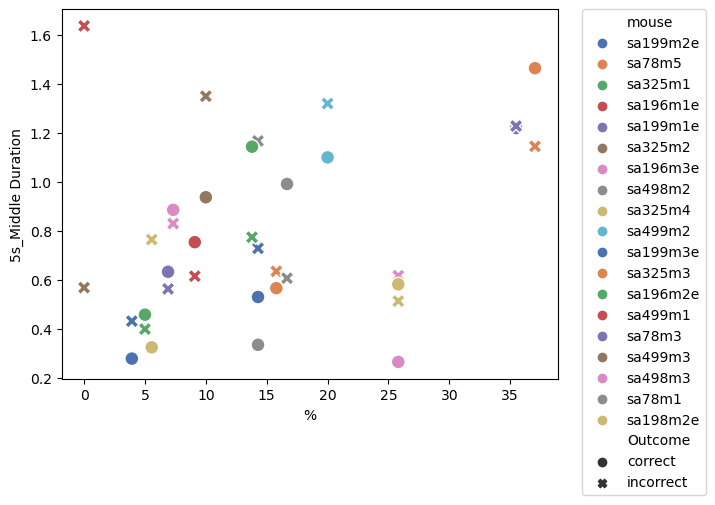

In [3796]:
sns.scatterplot(data=mean_middle_duration_5s, x = '%', y = '5s_Middle Duration', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

# Same as above but with scaled data

In [3797]:
df_lagged_added_stats_sa199m2e = pd.read_csv('sa199m2e_new_newest_lagged_added_stats.csv')
df_lagged_added_stats_sa196m2e = pd.read_csv('sa196m2e_new_newest_lagged_added_stats.csv')
df_lagged_added_stats_sa196m1e = pd.read_csv('sa196m1e_new_newest_lagged_added_stats.csv')
df_lagged_added_stats_sa198m2e = pd.read_csv('sa198m2e_new_newest_lagged_added_stats.csv')
df_lagged_added_stats_sa196m3e = pd.read_csv('sa196m3e_new_newest_lagged_added_stats.csv')
df_lagged_added_stats_sa199m3e = pd.read_csv('sa199m3e_new_newest_lagged_added_stats.csv')
df_lagged_added_stats_sa199m1e = pd.read_csv('sa199m1e_new_newest_lagged_added_stats.csv')
df_lagged_added_stats_sa78m1 = pd.read_csv('sa78m1_new_newest_lagged_added_stats.csv')
df_lagged_added_stats_sa78m3 = pd.read_csv('sa78m3_new_newest_lagged_added_stats.csv')
df_lagged_added_stats_sa78m5 = pd.read_csv('sa78m5_new_newest_lagged_added_stats.csv')

df_lagged_added_stats_sa325m1 = pd.read_csv('sa325m1_new_newest_lagged_added_stats.csv')
df_lagged_added_stats_sa325m2 = pd.read_csv('sa325m2_new_newest_lagged_added_stats.csv')
df_lagged_added_stats_sa325m3 = pd.read_csv('sa325m3_new_newest_lagged_added_stats.csv')
df_lagged_added_stats_sa325m4 = pd.read_csv('sa325m4_new_newest_lagged_added_stats.csv')
df_lagged_added_stats_sa498m2 = pd.read_csv('sa498m2_new_newest_lagged_added_stats.csv')
df_lagged_added_stats_sa498m3 = pd.read_csv('sa498m3_new_newest_lagged_added_stats.csv')
df_lagged_added_stats_sa499m1 = pd.read_csv('sa499m1_new_newest_lagged_added_stats.csv')
df_lagged_added_stats_sa499m2 = pd.read_csv('sa499m2_new_newest_lagged_added_stats.csv')
df_lagged_added_stats_sa499m3 = pd.read_csv('sa499m3_new_newest_lagged_added_stats.csv')



In [3798]:
df_lagged_added_new_class_sa199m2e = set_new_class_individual(df_lagged_added_stats_sa199m2e)
df_lagged_added_new_class_sa196m2e = set_new_class_individual(df_lagged_added_stats_sa196m2e)
df_lagged_added_new_class_sa196m1e = set_new_class_individual(df_lagged_added_stats_sa196m1e)
df_lagged_added_new_class_sa198m2e = set_new_class_individual(df_lagged_added_stats_sa198m2e)
df_lagged_added_new_class_sa196m3e = set_new_class_individual(df_lagged_added_stats_sa196m3e)
df_lagged_added_new_class_sa199m3e = set_new_class_individual(df_lagged_added_stats_sa199m3e)
df_lagged_added_new_class_sa199m1e = set_new_class_individual(df_lagged_added_stats_sa199m1e)
df_lagged_added_new_class_sa78m1 = set_new_class_individual(df_lagged_added_stats_sa78m1)
df_lagged_added_new_class_sa78m3 = set_new_class_individual(df_lagged_added_stats_sa78m3)
df_lagged_added_new_class_sa78m5 = set_new_class_individual(df_lagged_added_stats_sa78m5)

df_lagged_added_new_class_sa325m1 = set_new_class_individual(df_lagged_added_stats_sa325m1)
df_lagged_added_new_class_sa325m2 = set_new_class_individual(df_lagged_added_stats_sa325m2)
df_lagged_added_new_class_sa325m3 = set_new_class_individual(df_lagged_added_stats_sa325m3)
df_lagged_added_new_class_sa325m4 = set_new_class_individual(df_lagged_added_stats_sa325m4)
df_lagged_added_new_class_sa498m2 = set_new_class_individual(df_lagged_added_stats_sa498m2)
df_lagged_added_new_class_sa498m3 = set_new_class_individual(df_lagged_added_stats_sa498m3)
df_lagged_added_new_class_sa499m1 = set_new_class_individual(df_lagged_added_stats_sa499m1)
df_lagged_added_new_class_sa499m2 = set_new_class_individual(df_lagged_added_stats_sa499m2)
df_lagged_added_new_class_sa499m3 = set_new_class_individual(df_lagged_added_stats_sa499m3)


In [3799]:
df_lagged_added_new_class_sa199m2e['mouse'] = 'sa199m2e'
df_lagged_added_new_class_sa196m2e['mouse'] = 'sa196m2e'
df_lagged_added_new_class_sa196m1e['mouse'] = 'sa196m1e'
df_lagged_added_new_class_sa198m2e['mouse'] = 'sa198m2e' 
df_lagged_added_new_class_sa196m3e['mouse'] = 'sa196m3e'
df_lagged_added_new_class_sa199m3e['mouse'] = 'sa199m3e'
df_lagged_added_new_class_sa199m1e['mouse'] = 'sa199m1e'
df_lagged_added_new_class_sa78m1['mouse'] = 'sa78m1'
df_lagged_added_new_class_sa78m3['mouse'] = 'sa78m3'
df_lagged_added_new_class_sa78m5['mouse'] = 'sa78m5'


df_lagged_added_new_class_sa325m1['mouse'] = 'sa325m1'
df_lagged_added_new_class_sa325m2['mouse'] = 'sa325m2'
df_lagged_added_new_class_sa325m3['mouse'] = 'sa325m3'
df_lagged_added_new_class_sa325m4['mouse'] = 'sa325m4'
df_lagged_added_new_class_sa498m2['mouse'] = 'sa498m2'
df_lagged_added_new_class_sa498m3['mouse'] = 'sa498m3'
df_lagged_added_new_class_sa499m1['mouse'] = 'sa499m1'
df_lagged_added_new_class_sa499m2['mouse'] = 'sa499m2'
df_lagged_added_new_class_sa499m3['mouse'] = 'sa499m3'

In [3800]:
df_grouped_scaled = pd.concat([df_lagged_added_new_class_sa199m2e, df_lagged_added_new_class_sa196m2e, df_lagged_added_new_class_sa196m1e, 
                               df_lagged_added_new_class_sa198m2e, df_lagged_added_new_class_sa196m3e,df_lagged_added_new_class_sa199m3e, 
                               df_lagged_added_new_class_sa199m1e, df_lagged_added_new_class_sa78m1, df_lagged_added_new_class_sa78m3, 
                               df_lagged_added_new_class_sa78m5,
                                df_lagged_added_new_class_sa325m1, df_lagged_added_new_class_sa325m2,
                               df_lagged_added_new_class_sa325m3, df_lagged_added_new_class_sa325m4, df_lagged_added_new_class_sa498m2,
                               df_lagged_added_new_class_sa498m3, df_lagged_added_new_class_sa499m1, df_lagged_added_new_class_sa499m2,
                               df_lagged_added_new_class_sa499m3])

In [3801]:
'''df_grouped_scaled = pd.concat([df_lagged_added_new_class_sa325m1, df_lagged_added_new_class_sa325m2,
                               df_lagged_added_new_class_sa325m3, df_lagged_added_new_class_sa325m4, df_lagged_added_new_class_sa498m2,
                               df_lagged_added_new_class_sa498m3, df_lagged_added_new_class_sa499m1, df_lagged_added_new_class_sa499m2,
                               df_lagged_added_new_class_sa499m3])'''

'df_grouped_scaled = pd.concat([df_lagged_added_new_class_sa325m1, df_lagged_added_new_class_sa325m2,\n                               df_lagged_added_new_class_sa325m3, df_lagged_added_new_class_sa325m4, df_lagged_added_new_class_sa498m2,\n                               df_lagged_added_new_class_sa498m3, df_lagged_added_new_class_sa499m1, df_lagged_added_new_class_sa499m2,\n                               df_lagged_added_new_class_sa499m3])'

In [3802]:
df_grouped_scaled_ri = df_grouped_scaled.reset_index(drop=True)

In [3803]:
exitmidentry_duration_3s = get_performance(df_grouped_scaled_ri, 'ExitMidEntry Duration', 3)

In [4125]:
exitmidentry_duration_3s.to_csv('timecenter_all.csv', index=False, sep='\t')

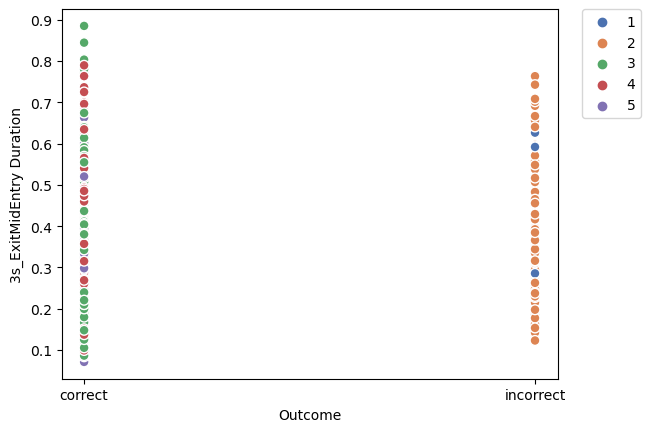

In [3804]:
sns.scatterplot(data=exitmidentry_duration_3s, x = 'Outcome', y = '3s_ExitMidEntry Duration', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3805]:
mean_exitmidentry_duration_3s = get_mean_performances(exitmidentry_duration_3s)

   mouse  3s_ExitMidEntry Duration         %   Outcome
sa199m2e                  0.491925 81.132075   correct
sa199m2e                  0.506944 81.132075 incorrect
  sa78m5                  0.261582 93.103448   correct
  sa78m5                  0.364952 93.103448 incorrect
 sa325m1                  0.260494 68.181818   correct
 sa325m1                  0.257021 68.181818 incorrect
sa196m1e                  0.496364 91.666667   correct
sa196m1e                  0.580000 91.666667 incorrect
sa199m1e                  0.317821 83.870968   correct
sa199m1e                  0.427333 83.870968 incorrect
 sa325m2                  0.387017 77.272727   correct
 sa325m2                  0.340453 77.272727 incorrect
sa196m3e                  0.403144 79.069767   correct
sa196m3e                  0.403448 79.069767 incorrect
 sa498m2                  0.225162 70.000000   correct
 sa498m2                  0.336763 70.000000 incorrect
 sa325m4                  0.346444 75.000000   correct
 sa325m4  

In [3806]:
mean_exitmidentry_duration_3s

,mouse,3s_ExitMidEntry Duration,%,Outcome
0,sa199m2e,0.491925,81.132075,correct
1,sa199m2e,0.506944,81.132075,incorrect
2,sa78m5,0.261582,93.103448,correct
3,sa78m5,0.364952,93.103448,incorrect
4,sa325m1,0.260494,68.181818,correct
5,sa325m1,0.257021,68.181818,incorrect
6,sa196m1e,0.496364,91.666667,correct
7,sa196m1e,0.580000,91.666667,incorrect
8,sa199m1e,0.317821,83.870968,correct
9,sa199m1e,0.427333,83.870968,incorrect


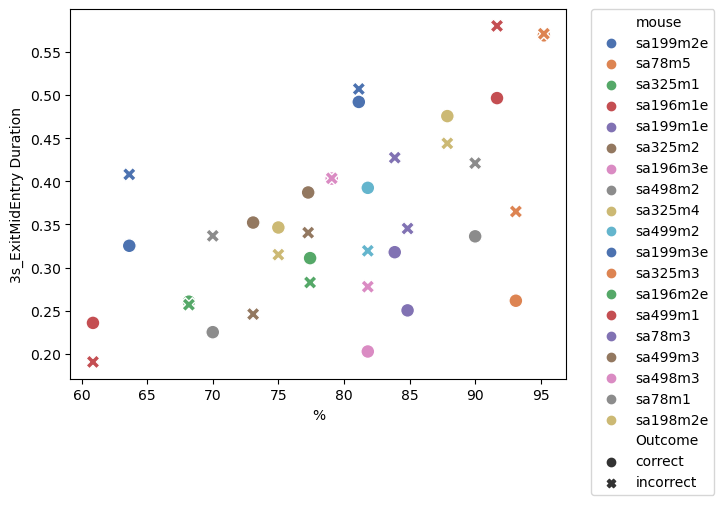

In [3807]:
sns.scatterplot(data=mean_exitmidentry_duration_3s, x = '%', y = '3s_ExitMidEntry Duration', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3808]:
middle_tortuosity_3s = get_performance(df_grouped_scaled_ri, 'Middle Tortuosity', 3)

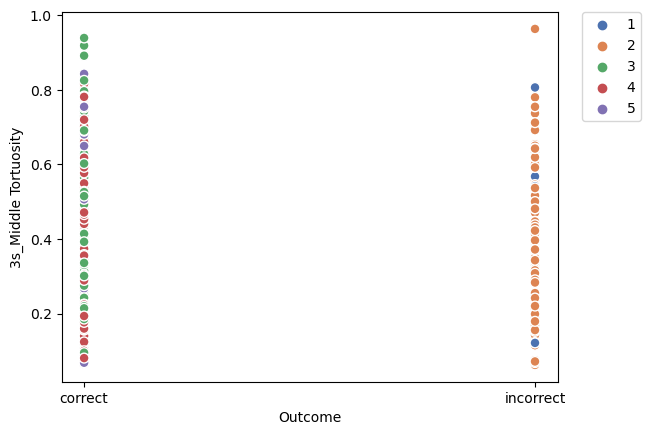

In [3809]:
sns.scatterplot(data=middle_tortuosity_3s, x = 'Outcome', y = '3s_Middle Tortuosity', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3810]:
mean_middle_tortuosity_3s = get_mean_performances(middle_tortuosity_3s)

   mouse  3s_Middle Tortuosity         %   Outcome
sa199m2e              0.572512 81.132075   correct
sa199m2e              0.549700 81.132075 incorrect
  sa78m5              0.189517 93.103448   correct
  sa78m5              0.447845 93.103448 incorrect
 sa325m1              0.206403 68.181818   correct
 sa325m1              0.188689 68.181818 incorrect
sa196m1e              0.463268 91.666667   correct
sa196m1e              0.741602 91.666667 incorrect
sa199m1e              0.348768 83.870968   correct
sa199m1e              0.448520 83.870968 incorrect
 sa325m2              0.388457 77.272727   correct
 sa325m2              0.430322 77.272727 incorrect
sa196m3e              0.178955 79.069767   correct
sa196m3e              0.300998 79.069767 incorrect
 sa498m2              0.090775 70.000000   correct
 sa498m2              0.190310 70.000000 incorrect
 sa325m4              0.301666 75.000000   correct
 sa325m4              0.226319 75.000000 incorrect
 sa499m2              0.659610 

In [3811]:
mean_middle_tortuosity_3s

,mouse,3s_Middle Tortuosity,%,Outcome
0,sa199m2e,0.572512,81.132075,correct
1,sa199m2e,0.549700,81.132075,incorrect
2,sa78m5,0.189517,93.103448,correct
3,sa78m5,0.447845,93.103448,incorrect
4,sa325m1,0.206403,68.181818,correct
5,sa325m1,0.188689,68.181818,incorrect
6,sa196m1e,0.463268,91.666667,correct
7,sa196m1e,0.741602,91.666667,incorrect
8,sa199m1e,0.348768,83.870968,correct
9,sa199m1e,0.448520,83.870968,incorrect


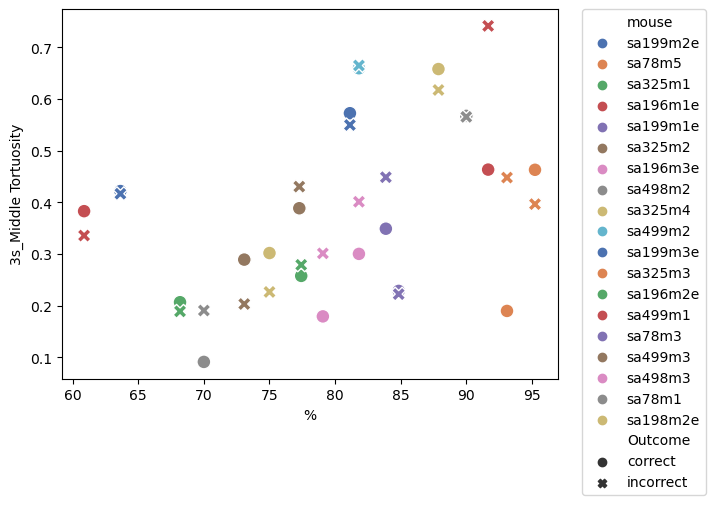

In [3812]:
sns.scatterplot(data=mean_middle_tortuosity_3s, x = '%', y = '3s_Middle Tortuosity', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3813]:
new_cur_coeff_time_prop_3s = get_performance(df_grouped_scaled_ri, 'New Current Coeff Time Proportional', 3)

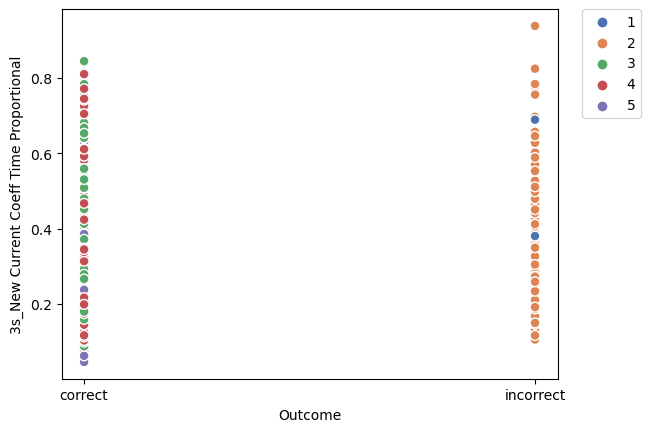

In [3814]:
sns.scatterplot(data=new_cur_coeff_time_prop_3s, x = 'Outcome', y = '3s_New Current Coeff Time Proportional', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3815]:
mean_new_cur_coeff_time_prop_3s = get_mean_performances(new_cur_coeff_time_prop_3s)

   mouse  3s_New Current Coeff Time Proportional         %   Outcome
sa199m2e                                0.427435 81.132075   correct
sa199m2e                                0.487654 81.132075 incorrect
  sa78m5                                0.261800 93.103448   correct
  sa78m5                                0.284492 93.103448 incorrect
 sa325m1                                0.438059 68.181818   correct
 sa325m1                                0.416720 68.181818 incorrect
sa196m1e                                0.453353 91.666667   correct
sa196m1e                                0.182395 91.666667 incorrect
sa199m1e                                0.434378 83.870968   correct
sa199m1e                                0.524447 83.870968 incorrect
 sa325m2                                0.396116 77.272727   correct
 sa325m2                                0.291926 77.272727 incorrect
sa196m3e                                0.461423 79.069767   correct
sa196m3e                          

In [3816]:
mean_new_cur_coeff_time_prop_3s

,mouse,3s_New Current Coeff Time Proportional,%,Outcome
0,sa199m2e,0.427435,81.132075,correct
1,sa199m2e,0.487654,81.132075,incorrect
2,sa78m5,0.261800,93.103448,correct
3,sa78m5,0.284492,93.103448,incorrect
4,sa325m1,0.438059,68.181818,correct
5,sa325m1,0.416720,68.181818,incorrect
6,sa196m1e,0.453353,91.666667,correct
7,sa196m1e,0.182395,91.666667,incorrect
8,sa199m1e,0.434378,83.870968,correct
9,sa199m1e,0.524447,83.870968,incorrect


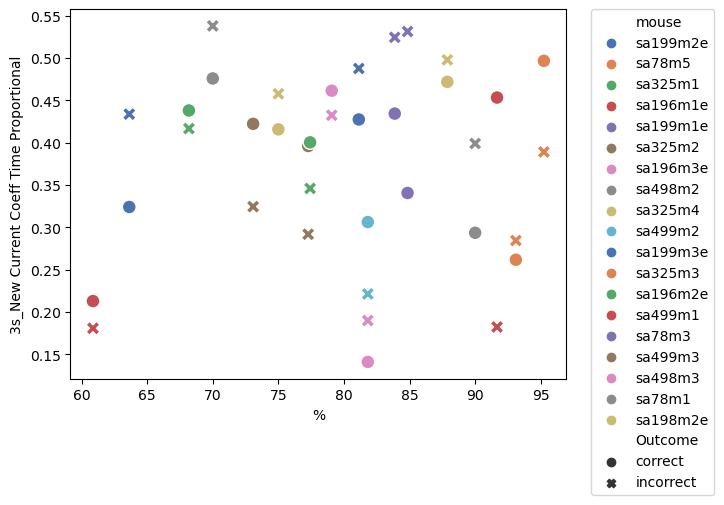

In [3817]:
sns.scatterplot(data=mean_new_cur_coeff_time_prop_3s, x = '%', y = '3s_New Current Coeff Time Proportional', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3818]:
new_current_coeff_3s = get_performance(df_grouped_scaled_ri, 'New Current Coeff', 3)

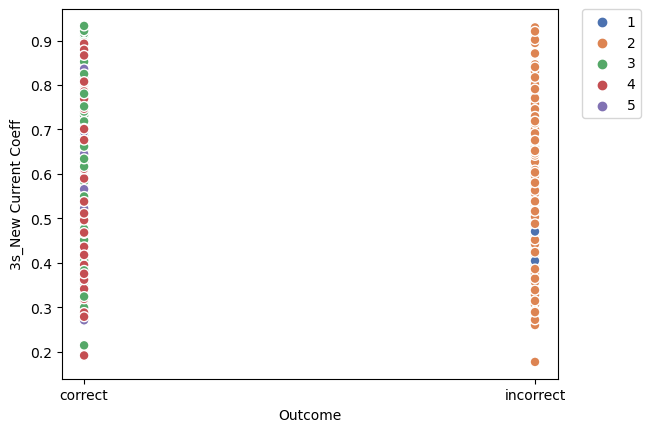

In [3819]:
sns.scatterplot(data=new_current_coeff_3s, x = 'Outcome', y = '3s_New Current Coeff', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3820]:
mean_new_current_coeff_3s = get_mean_performances(new_current_coeff_3s)

   mouse  3s_New Current Coeff         %   Outcome
sa199m2e              0.600751 81.132075   correct
sa199m2e              0.684752 81.132075 incorrect
  sa78m5              0.657342 93.103448   correct
  sa78m5              0.581020 93.103448 incorrect
 sa325m1              0.510944 68.181818   correct
 sa325m1              0.418614 68.181818 incorrect
sa196m1e              0.619591 91.666667   correct
sa196m1e              0.240154 91.666667 incorrect
sa199m1e              0.689138 83.870968   correct
sa199m1e              0.698737 83.870968 incorrect
 sa325m2              0.652675 77.272727   correct
 sa325m2              0.648321 77.272727 incorrect
sa196m3e              0.602824 79.069767   correct
sa196m3e              0.554364 79.069767 incorrect
 sa498m2              0.656017 70.000000   correct
 sa498m2              0.591020 70.000000 incorrect
 sa325m4              0.595500 75.000000   correct
 sa325m4              0.630164 75.000000 incorrect
 sa499m2              0.623658 

In [3821]:
mean_new_current_coeff_3s

,mouse,3s_New Current Coeff,%,Outcome
0,sa199m2e,0.600751,81.132075,correct
1,sa199m2e,0.684752,81.132075,incorrect
2,sa78m5,0.657342,93.103448,correct
3,sa78m5,0.581020,93.103448,incorrect
4,sa325m1,0.510944,68.181818,correct
5,sa325m1,0.418614,68.181818,incorrect
6,sa196m1e,0.619591,91.666667,correct
7,sa196m1e,0.240154,91.666667,incorrect
8,sa199m1e,0.689138,83.870968,correct
9,sa199m1e,0.698737,83.870968,incorrect


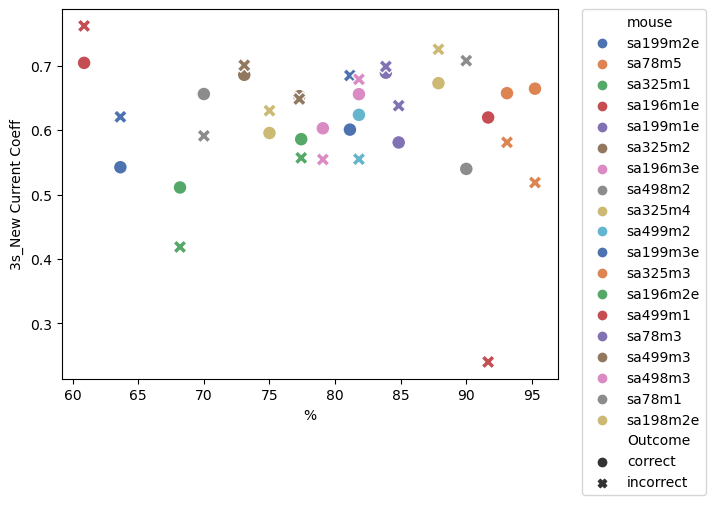

In [3822]:
sns.scatterplot(data=mean_new_current_coeff_3s, x = '%', y = '3s_New Current Coeff', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3823]:
current_coeff_3s = get_performance(df_grouped_scaled_ri, 'Current Coeff', 3)

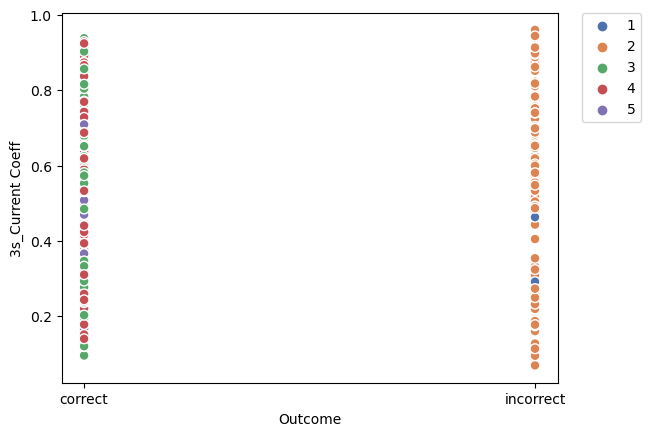

In [3824]:
sns.scatterplot(data=current_coeff_3s, x = 'Outcome', y = '3s_Current Coeff', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3825]:
mean_current_coeff_3s = get_mean_performances(current_coeff_3s)

   mouse  3s_Current Coeff         %   Outcome
sa199m2e          0.495272 81.132075   correct
sa199m2e          0.596331 81.132075 incorrect
  sa78m5          0.546072 93.103448   correct
  sa78m5          0.552912 93.103448 incorrect
 sa325m1          0.460780 68.181818   correct
 sa325m1          0.362275 68.181818 incorrect
sa196m1e          0.503540 91.666667   correct
sa196m1e          0.090968 91.666667 incorrect
sa199m1e          0.539910 83.870968   correct
sa199m1e          0.575075 83.870968 incorrect
 sa325m2          0.578103 77.272727   correct
 sa325m2          0.562283 77.272727 incorrect
sa196m3e          0.515009 79.069767   correct
sa196m3e          0.442956 79.069767 incorrect
 sa498m2          0.584752 70.000000   correct
 sa498m2          0.520771 70.000000 incorrect
 sa325m4          0.500528 75.000000   correct
 sa325m4          0.572168 75.000000 incorrect
 sa499m2          0.509868 81.818182   correct
 sa499m2          0.411168 81.818182 incorrect
sa199m3e     

In [3826]:
mean_current_coeff_3s

,mouse,3s_Current Coeff,%,Outcome
0,sa199m2e,0.495272,81.132075,correct
1,sa199m2e,0.596331,81.132075,incorrect
2,sa78m5,0.546072,93.103448,correct
3,sa78m5,0.552912,93.103448,incorrect
4,sa325m1,0.460780,68.181818,correct
5,sa325m1,0.362275,68.181818,incorrect
6,sa196m1e,0.503540,91.666667,correct
7,sa196m1e,0.090968,91.666667,incorrect
8,sa199m1e,0.539910,83.870968,correct
9,sa199m1e,0.575075,83.870968,incorrect


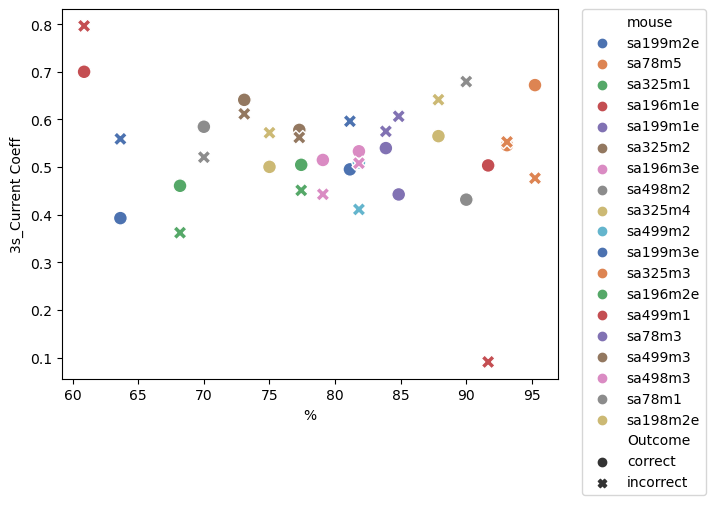

In [3827]:
sns.scatterplot(data=mean_current_coeff_3s, x = '%', y = '3s_Current Coeff', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3828]:
cur_coeff_time_prop_3s = get_performance(df_grouped_scaled_ri, 'Current Coeff Time Proportional', 3)

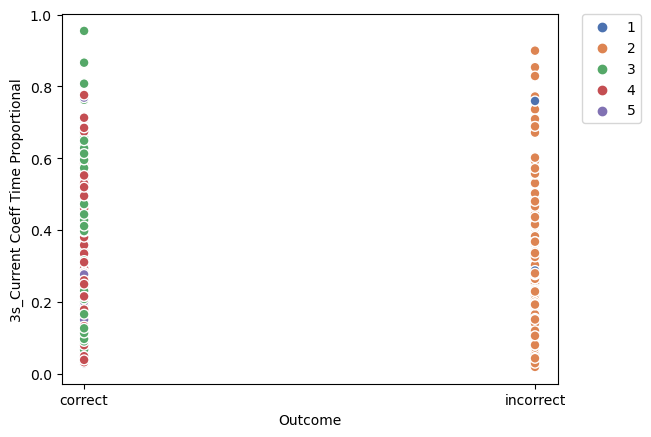

In [3829]:
sns.scatterplot(data=cur_coeff_time_prop_3s, x = 'Outcome', y = '3s_Current Coeff Time Proportional', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3830]:
mean_cur_coeff_time_prop_3s = get_mean_performances(cur_coeff_time_prop_3s)

   mouse  3s_Current Coeff Time Proportional         %   Outcome
sa199m2e                            0.244762 81.132075   correct
sa199m2e                            0.341425 81.132075 incorrect
  sa78m5                            0.203710 93.103448   correct
  sa78m5                            0.273123 93.103448 incorrect
 sa325m1                            0.508274 68.181818   correct
 sa325m1                            0.493563 68.181818 incorrect
sa196m1e                            0.326859 91.666667   correct
sa196m1e                            0.074006 91.666667 incorrect
sa199m1e                            0.378800 83.870968   correct
sa199m1e                            0.459642 83.870968 incorrect
 sa325m2                            0.297192 77.272727   correct
 sa325m2                            0.224244 77.272727 incorrect
sa196m3e                            0.377695 79.069767   correct
sa196m3e                            0.353722 79.069767 incorrect
 sa498m2                 

In [3831]:
mean_cur_coeff_time_prop_3s

,mouse,3s_Current Coeff Time Proportional,%,Outcome
0,sa199m2e,0.244762,81.132075,correct
1,sa199m2e,0.341425,81.132075,incorrect
2,sa78m5,0.203710,93.103448,correct
3,sa78m5,0.273123,93.103448,incorrect
4,sa325m1,0.508274,68.181818,correct
5,sa325m1,0.493563,68.181818,incorrect
6,sa196m1e,0.326859,91.666667,correct
7,sa196m1e,0.074006,91.666667,incorrect
8,sa199m1e,0.378800,83.870968,correct
9,sa199m1e,0.459642,83.870968,incorrect


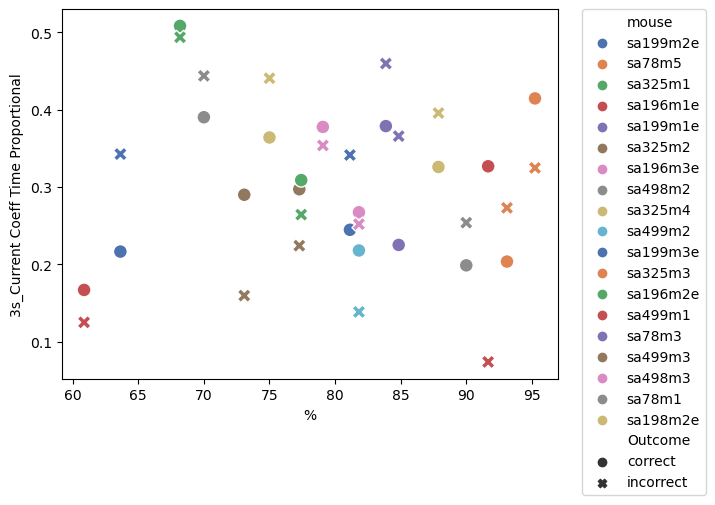

In [3832]:
sns.scatterplot(data=mean_cur_coeff_time_prop_3s, x = '%', y = '3s_Current Coeff Time Proportional', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3833]:
lagged_1_duration_3s = get_performance(df_grouped_scaled_ri, 'lagged_1_duration', 3)

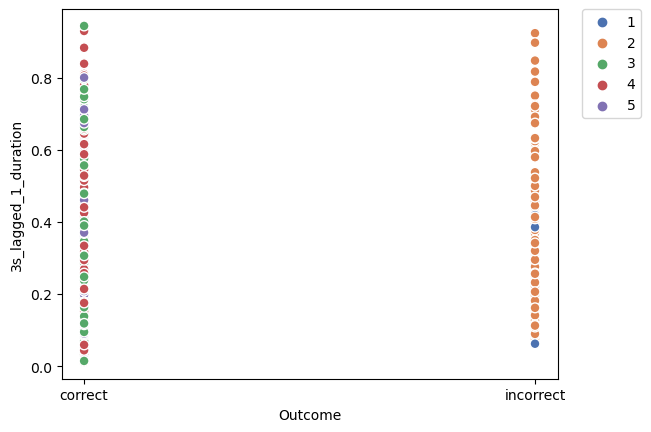

In [3834]:
sns.scatterplot(data=lagged_1_duration_3s, x = 'Outcome', y = '3s_lagged_1_duration', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3835]:
mean_lagged_1_duration_3s = get_mean_performances(lagged_1_duration_3s)

   mouse  3s_lagged_1_duration         %   Outcome
sa199m2e              0.303103 81.132075   correct
sa199m2e              0.309759 81.132075 incorrect
  sa78m5              0.322596 93.103448   correct
  sa78m5              0.238655 93.103448 incorrect
 sa325m1              0.342529 68.181818   correct
 sa325m1              0.388603 68.181818 incorrect
sa196m1e              0.212223 91.666667   correct
sa196m1e              0.177240 91.666667 incorrect
sa199m1e              0.284046 83.870968   correct
sa199m1e              0.271852 83.870968 incorrect
 sa325m2              0.224750 77.272727   correct
 sa325m2              0.235247 77.272727 incorrect
sa196m3e              0.355534 79.069767   correct
sa196m3e              0.287976 79.069767 incorrect
 sa498m2              0.420330 70.000000   correct
 sa498m2              0.355662 70.000000 incorrect
 sa325m4              0.186610 75.000000   correct
 sa325m4              0.177467 75.000000 incorrect
 sa499m2              0.339693 

In [3836]:
mean_lagged_1_duration_3s
#mean_lagged_1_duration_3s.to_csv('mean_arm_dur_past_2.csv', sep='\t', index=False)


,mouse,3s_lagged_1_duration,%,Outcome
0,sa199m2e,0.303103,81.132075,correct
1,sa199m2e,0.309759,81.132075,incorrect
2,sa78m5,0.322596,93.103448,correct
3,sa78m5,0.238655,93.103448,incorrect
4,sa325m1,0.342529,68.181818,correct
5,sa325m1,0.388603,68.181818,incorrect
6,sa196m1e,0.212223,91.666667,correct
7,sa196m1e,0.177240,91.666667,incorrect
8,sa199m1e,0.284046,83.870968,correct
9,sa199m1e,0.271852,83.870968,incorrect


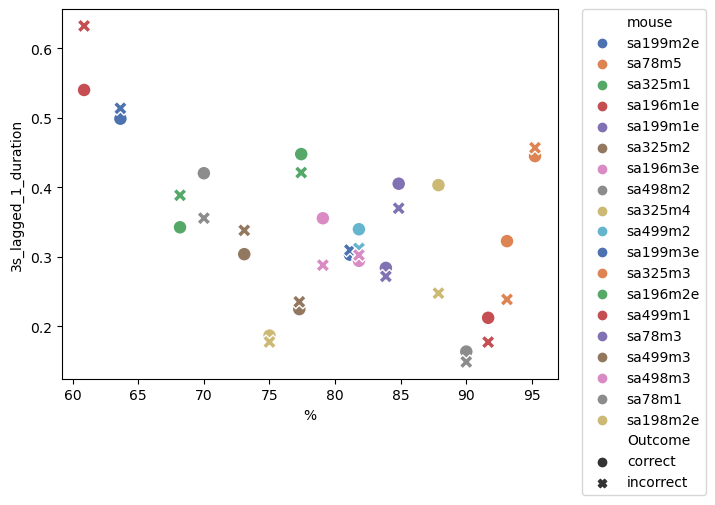

In [3837]:
sns.scatterplot(data=mean_lagged_1_duration_3s, x = '%', y = '3s_lagged_1_duration', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3838]:
lagged_1_nose_time_to_max_dist_3s = get_performance(df_grouped_scaled_ri, 'lagged_1_nose_time_to_max_dist', 3)

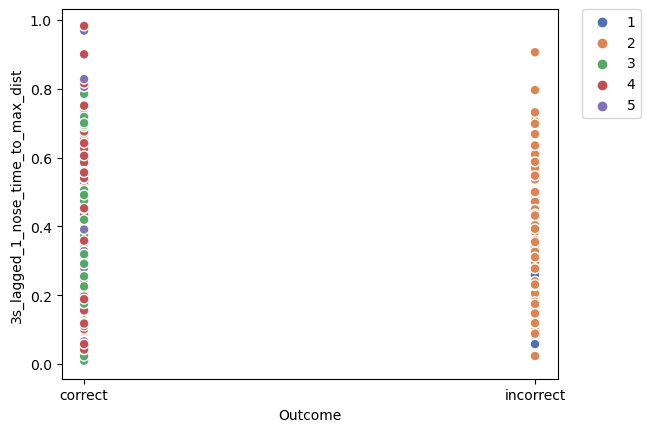

In [3839]:
sns.scatterplot(data=lagged_1_nose_time_to_max_dist_3s, x = 'Outcome', y = '3s_lagged_1_nose_time_to_max_dist', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3840]:
mean_lagged_1_nose_time_to_max_dist_3s = get_mean_performances(lagged_1_nose_time_to_max_dist_3s)

   mouse  3s_lagged_1_nose_time_to_max_dist         %   Outcome
sa199m2e                           0.251101 81.132075   correct
sa199m2e                           0.258902 81.132075 incorrect
  sa78m5                           0.481139 93.103448   correct
  sa78m5                           0.403935 93.103448 incorrect
 sa325m1                           0.253498 68.181818   correct
 sa325m1                           0.324956 68.181818 incorrect
sa196m1e                           0.134190 91.666667   correct
sa196m1e                           0.116033 91.666667 incorrect
sa199m1e                           0.455621 83.870968   correct
sa199m1e                           0.312179 83.870968 incorrect
 sa325m2                           0.303798 77.272727   correct
 sa325m2                           0.228092 77.272727 incorrect
sa196m3e                           0.284091 79.069767   correct
sa196m3e                           0.253788 79.069767 incorrect
 sa498m2                           0.316

In [3841]:
mean_lagged_1_nose_time_to_max_dist_3s

#mean_lagged_1_nose_time_to_max_dist_3s.to_csv('mean_time_to_max_past_2.csv', sep='\t', index=False)

,mouse,3s_lagged_1_nose_time_to_max_dist,%,Outcome
0,sa199m2e,0.251101,81.132075,correct
1,sa199m2e,0.258902,81.132075,incorrect
2,sa78m5,0.481139,93.103448,correct
3,sa78m5,0.403935,93.103448,incorrect
4,sa325m1,0.253498,68.181818,correct
5,sa325m1,0.324956,68.181818,incorrect
6,sa196m1e,0.134190,91.666667,correct
7,sa196m1e,0.116033,91.666667,incorrect
8,sa199m1e,0.455621,83.870968,correct
9,sa199m1e,0.312179,83.870968,incorrect


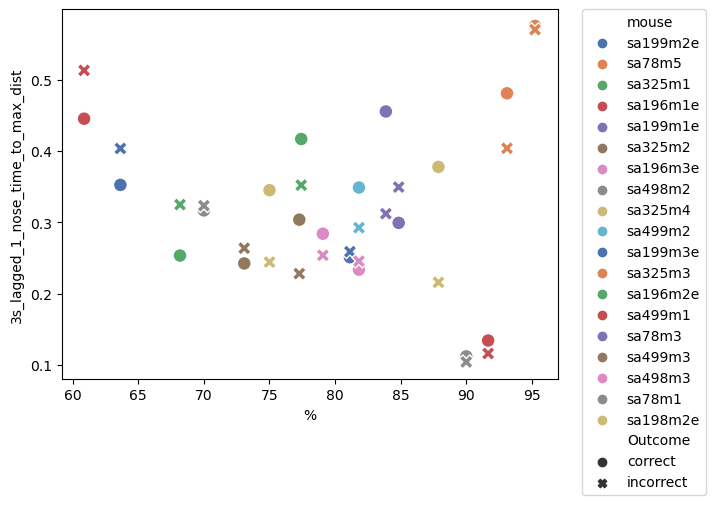

In [3842]:
sns.scatterplot(data=mean_lagged_1_nose_time_to_max_dist_3s, x = '%', y = '3s_lagged_1_nose_time_to_max_dist', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3843]:
lagged_1_arm_nose_mov_3s = get_performance(df_grouped_scaled_ri, 'lagged_1_arm_nose_mov', 3)

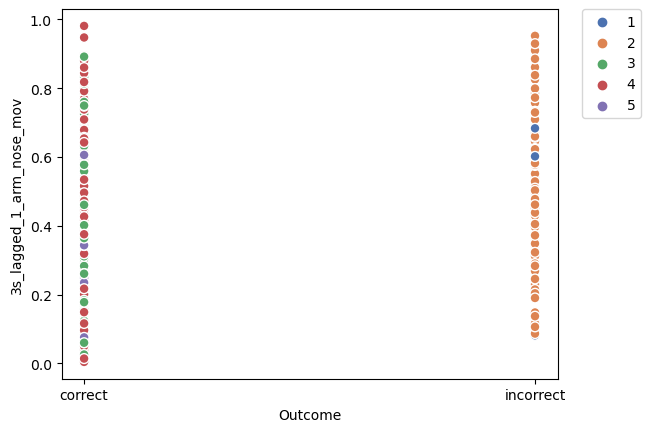

In [3844]:
sns.scatterplot(data=lagged_1_arm_nose_mov_3s, x = 'Outcome', y = '3s_lagged_1_arm_nose_mov', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3845]:
mean_lagged_1_arm_nose_mov_3s = get_mean_performances(lagged_1_arm_nose_mov_3s)

   mouse  3s_lagged_1_arm_nose_mov         %   Outcome
sa199m2e                  0.551432 81.132075   correct
sa199m2e                  0.595417 81.132075 incorrect
  sa78m5                  0.382166 93.103448   correct
  sa78m5                  0.368348 93.103448 incorrect
 sa325m1                  0.474009 68.181818   correct
 sa325m1                  0.502566 68.181818 incorrect
sa196m1e                  0.351292 91.666667   correct
sa196m1e                  0.372651 91.666667 incorrect
sa199m1e                  0.306630 83.870968   correct
sa199m1e                  0.286387 83.870968 incorrect
 sa325m2                  0.393955 77.272727   correct
 sa325m2                  0.414617 77.272727 incorrect
sa196m3e                  0.593226 79.069767   correct
sa196m3e                  0.536319 79.069767 incorrect
 sa498m2                  0.526145 70.000000   correct
 sa498m2                  0.492904 70.000000 incorrect
 sa325m4                  0.391077 75.000000   correct
 sa325m4  

In [3846]:
mean_lagged_1_arm_nose_mov_3s

#mean_lagged_1_arm_nose_mov_3s.to_csv('dist_in_arm_past_2_nose.csv', sep='\t', index=False)

,mouse,3s_lagged_1_arm_nose_mov,%,Outcome
0,sa199m2e,0.551432,81.132075,correct
1,sa199m2e,0.595417,81.132075,incorrect
2,sa78m5,0.382166,93.103448,correct
3,sa78m5,0.368348,93.103448,incorrect
4,sa325m1,0.474009,68.181818,correct
5,sa325m1,0.502566,68.181818,incorrect
6,sa196m1e,0.351292,91.666667,correct
7,sa196m1e,0.372651,91.666667,incorrect
8,sa199m1e,0.306630,83.870968,correct
9,sa199m1e,0.286387,83.870968,incorrect


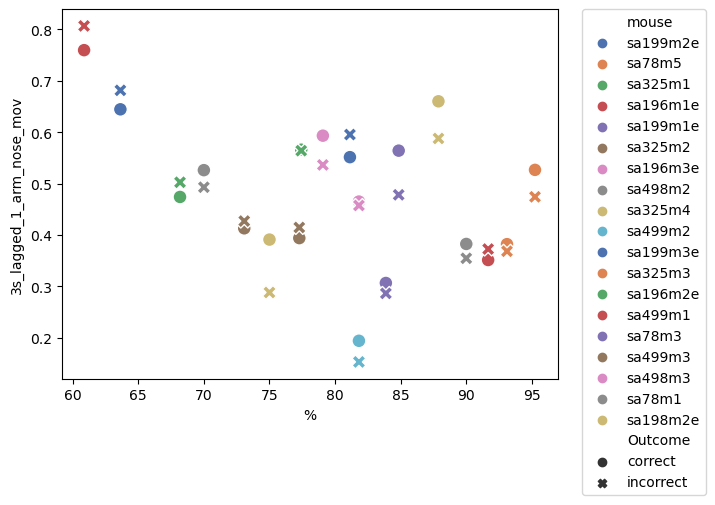

In [3847]:
sns.scatterplot(data=mean_lagged_1_arm_nose_mov_3s, x = '%', y = '3s_lagged_1_arm_nose_mov', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3848]:
lagged_1_arm_nose_vel_3s = get_performance(df_grouped_scaled_ri, 'lagged_1_arm_nose_vel', 3)

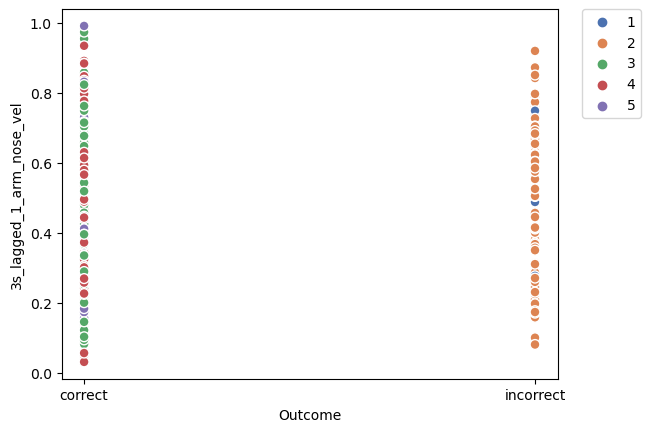

In [3849]:
sns.scatterplot(data=lagged_1_arm_nose_vel_3s, x = 'Outcome', y = '3s_lagged_1_arm_nose_vel', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3850]:
mean_lagged_1_arm_nose_vel_3s = get_mean_performances(lagged_1_arm_nose_vel_3s)

   mouse  3s_lagged_1_arm_nose_vel         %   Outcome
sa199m2e                  0.532398 81.132075   correct
sa199m2e                  0.595872 81.132075 incorrect
  sa78m5                  0.412105 93.103448   correct
  sa78m5                  0.589216 93.103448 incorrect
 sa325m1                  0.441112 68.181818   correct
 sa325m1                  0.488975 68.181818 incorrect
sa196m1e                  0.480774 91.666667   correct
sa196m1e                  0.586279 91.666667 incorrect
sa199m1e                  0.428421 83.870968   correct
sa199m1e                  0.454496 83.870968 incorrect
 sa325m2                  0.571455 77.272727   correct
 sa325m2                  0.537690 77.272727 incorrect
sa196m3e                  0.553796 79.069767   correct
sa196m3e                  0.619796 79.069767 incorrect
 sa498m2                  0.269989 70.000000   correct
 sa498m2                  0.419477 70.000000 incorrect
 sa325m4                  0.491008 75.000000   correct
 sa325m4  

In [3851]:
mean_lagged_1_arm_nose_vel_3s
#mean_lagged_1_arm_nose_vel_3s.to_csv('mean_vel_past_2_nose.csv', sep='\t', index=False)

,mouse,3s_lagged_1_arm_nose_vel,%,Outcome
0,sa199m2e,0.532398,81.132075,correct
1,sa199m2e,0.595872,81.132075,incorrect
2,sa78m5,0.412105,93.103448,correct
3,sa78m5,0.589216,93.103448,incorrect
4,sa325m1,0.441112,68.181818,correct
5,sa325m1,0.488975,68.181818,incorrect
6,sa196m1e,0.480774,91.666667,correct
7,sa196m1e,0.586279,91.666667,incorrect
8,sa199m1e,0.428421,83.870968,correct
9,sa199m1e,0.454496,83.870968,incorrect


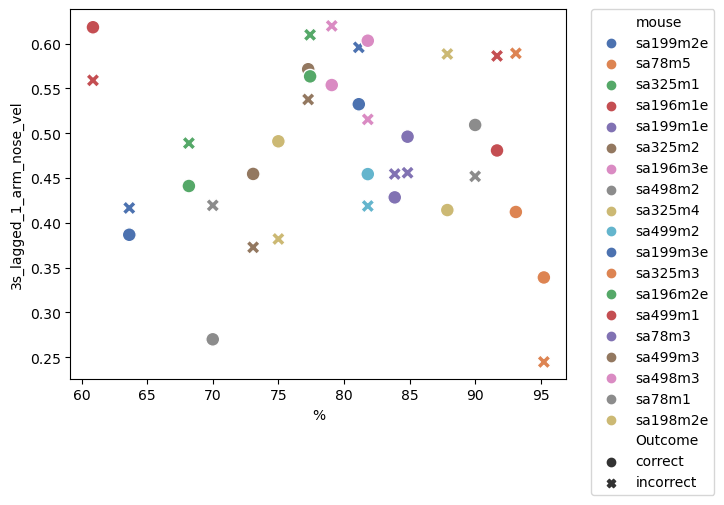

In [3852]:
sns.scatterplot(data=mean_lagged_1_arm_nose_vel_3s, x = '%', y = '3s_lagged_1_arm_nose_vel', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3853]:
lagged_1_arm_tail_mov_3s = get_performance(df_grouped_scaled_ri, 'lagged_1_arm_tail_mov', 3)

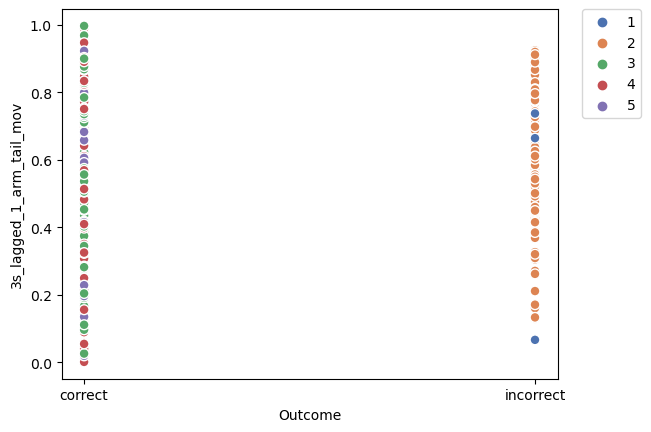

In [3854]:
sns.scatterplot(data=lagged_1_arm_tail_mov_3s, x = 'Outcome', y = '3s_lagged_1_arm_tail_mov', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3855]:
mean_lagged_1_arm_tail_mov_3s = get_mean_performances(lagged_1_arm_tail_mov_3s)

   mouse  3s_lagged_1_arm_tail_mov         %   Outcome
sa199m2e                  0.599987 81.132075   correct
sa199m2e                  0.631494 81.132075 incorrect
  sa78m5                  0.417039 93.103448   correct
  sa78m5                  0.439425 93.103448 incorrect
 sa325m1                  0.511875 68.181818   correct
 sa325m1                  0.546568 68.181818 incorrect
sa196m1e                  0.383139 91.666667   correct
sa196m1e                  0.409985 91.666667 incorrect
sa199m1e                  0.447170 83.870968   correct
sa199m1e                  0.411516 83.870968 incorrect
 sa325m2                  0.490087 77.272727   correct
 sa325m2                  0.493844 77.272727 incorrect
sa196m3e                  0.643994 79.069767   correct
sa196m3e                  0.588312 79.069767 incorrect
 sa498m2                  0.517175 70.000000   correct
 sa498m2                  0.490041 70.000000 incorrect
 sa325m4                  0.561961 75.000000   correct
 sa325m4  

In [3856]:
mean_lagged_1_arm_tail_mov_3s
#mean_lagged_1_arm_tail_mov_3s.to_csv('dist_in_arm_past_2_tail.csv', sep='\t', index=False)

,mouse,3s_lagged_1_arm_tail_mov,%,Outcome
0,sa199m2e,0.599987,81.132075,correct
1,sa199m2e,0.631494,81.132075,incorrect
2,sa78m5,0.417039,93.103448,correct
3,sa78m5,0.439425,93.103448,incorrect
4,sa325m1,0.511875,68.181818,correct
5,sa325m1,0.546568,68.181818,incorrect
6,sa196m1e,0.383139,91.666667,correct
7,sa196m1e,0.409985,91.666667,incorrect
8,sa199m1e,0.447170,83.870968,correct
9,sa199m1e,0.411516,83.870968,incorrect


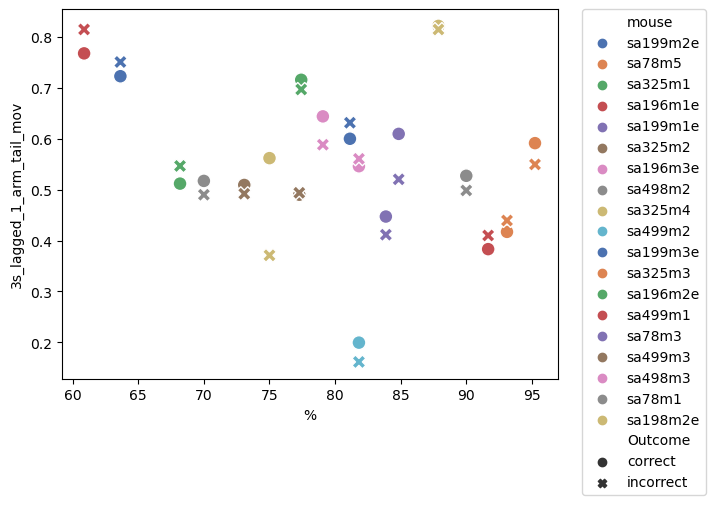

In [3857]:
sns.scatterplot(data=mean_lagged_1_arm_tail_mov_3s, x = '%', y = '3s_lagged_1_arm_tail_mov', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3858]:
lagged_1_arm_tail_vel_3s = get_performance(df_grouped_scaled_ri, 'lagged_1_arm_tail_vel', 3)

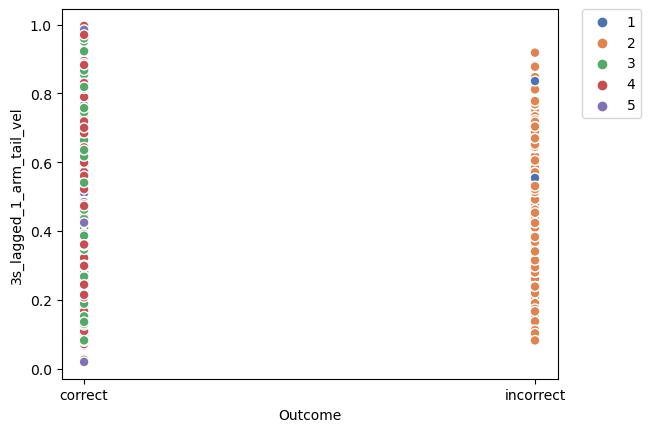

In [3859]:
sns.scatterplot(data=lagged_1_arm_tail_vel_3s, x = 'Outcome', y = '3s_lagged_1_arm_tail_vel', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3860]:
mean_lagged_1_arm_tail_vel_3s = get_mean_performances(lagged_1_arm_tail_vel_3s)

   mouse  3s_lagged_1_arm_tail_vel         %   Outcome
sa199m2e                  0.585540 81.132075   correct
sa199m2e                  0.636474 81.132075 incorrect
  sa78m5                  0.465866 93.103448   correct
  sa78m5                  0.665853 93.103448 incorrect
 sa325m1                  0.416465 68.181818   correct
 sa325m1                  0.480923 68.181818 incorrect
sa196m1e                  0.423382 91.666667   correct
sa196m1e                  0.540994 91.666667 incorrect
sa199m1e                  0.466679 83.870968   correct
sa199m1e                  0.496289 83.870968 incorrect
 sa325m2                  0.592325 77.272727   correct
 sa325m2                  0.537422 77.272727 incorrect
sa196m3e                  0.514186 79.069767   correct
sa196m3e                  0.587201 79.069767 incorrect
 sa498m2                  0.461846 70.000000   correct
 sa498m2                  0.578162 70.000000 incorrect
 sa325m4                  0.478130 75.000000   correct
 sa325m4  

In [3861]:
mean_lagged_1_arm_tail_vel_3s
#mean_lagged_1_arm_tail_vel_3s.to_csv('mean_vel_past_2_tail.csv', sep='\t', index=False)

,mouse,3s_lagged_1_arm_tail_vel,%,Outcome
0,sa199m2e,0.585540,81.132075,correct
1,sa199m2e,0.636474,81.132075,incorrect
2,sa78m5,0.465866,93.103448,correct
3,sa78m5,0.665853,93.103448,incorrect
4,sa325m1,0.416465,68.181818,correct
5,sa325m1,0.480923,68.181818,incorrect
6,sa196m1e,0.423382,91.666667,correct
7,sa196m1e,0.540994,91.666667,incorrect
8,sa199m1e,0.466679,83.870968,correct
9,sa199m1e,0.496289,83.870968,incorrect


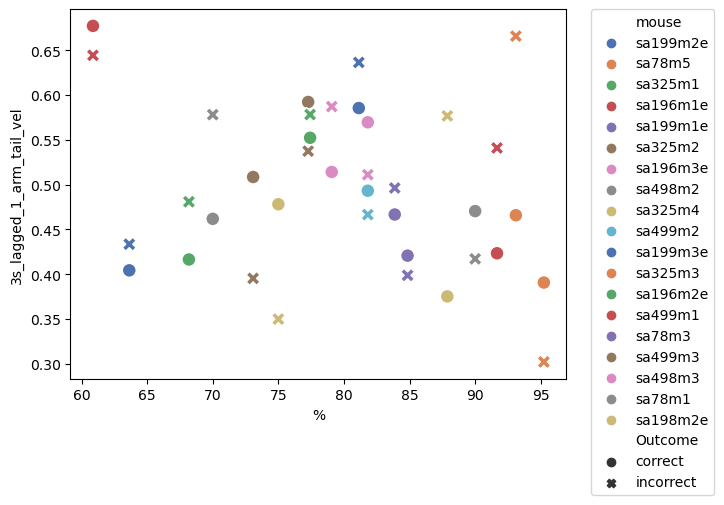

In [3862]:
sns.scatterplot(data=mean_lagged_1_arm_tail_vel_3s, x = '%', y = '3s_lagged_1_arm_tail_vel', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3863]:
lagged_1_entry_tortuosity_3s = get_performance(df_grouped_scaled_ri, 'lagged_1_entry_tortuosity', 3)

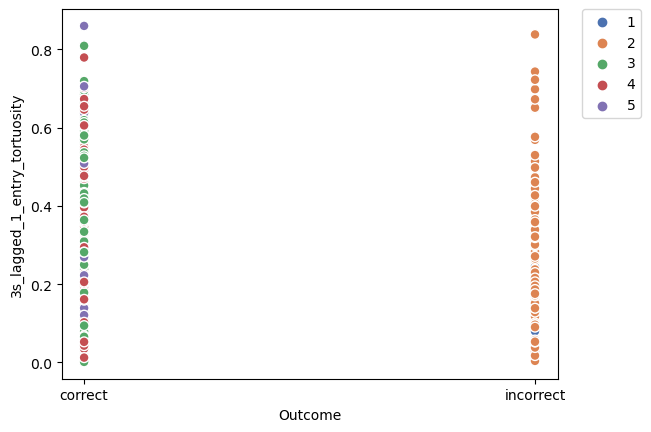

In [3864]:
sns.scatterplot(data=lagged_1_entry_tortuosity_3s, x = 'Outcome', y = '3s_lagged_1_entry_tortuosity', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3865]:
mean_lagged_1_entry_tortuosity_3s = get_mean_performances(lagged_1_entry_tortuosity_3s)

   mouse  3s_lagged_1_entry_tortuosity         %   Outcome
sa199m2e                      0.160779 81.132075   correct
sa199m2e                      0.183228 81.132075 incorrect
  sa78m5                      0.241807 93.103448   correct
  sa78m5                      0.149250 93.103448 incorrect
 sa325m1                      0.181784 68.181818   correct
 sa325m1                      0.216334 68.181818 incorrect
sa196m1e                      0.109633 91.666667   correct
sa196m1e                      0.091420 91.666667 incorrect
sa199m1e                      0.335293 83.870968   correct
sa199m1e                      0.235535 83.870968 incorrect
 sa325m2                      0.332748 77.272727   correct
 sa325m2                      0.256414 77.272727 incorrect
sa196m3e                      0.280171 79.069767   correct
sa196m3e                      0.272488 79.069767 incorrect
 sa498m2                      0.155280 70.000000   correct
 sa498m2                      0.139210 70.000000 incorre

In [3866]:
mean_lagged_1_entry_tortuosity_3s

,mouse,3s_lagged_1_entry_tortuosity,%,Outcome
0,sa199m2e,0.160779,81.132075,correct
1,sa199m2e,0.183228,81.132075,incorrect
2,sa78m5,0.241807,93.103448,correct
3,sa78m5,0.149250,93.103448,incorrect
4,sa325m1,0.181784,68.181818,correct
5,sa325m1,0.216334,68.181818,incorrect
6,sa196m1e,0.109633,91.666667,correct
7,sa196m1e,0.091420,91.666667,incorrect
8,sa199m1e,0.335293,83.870968,correct
9,sa199m1e,0.235535,83.870968,incorrect


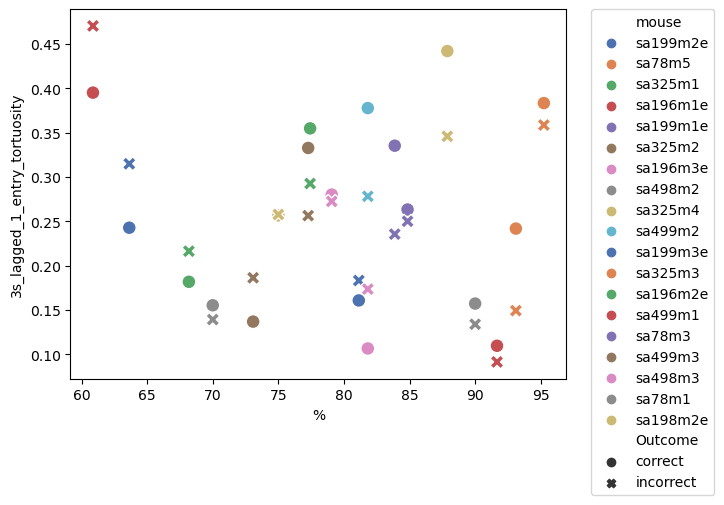

In [3867]:
sns.scatterplot(data=mean_lagged_1_entry_tortuosity_3s, x = '%', y = '3s_lagged_1_entry_tortuosity', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3868]:
lagged_1_exit_tortuosity_3s = get_performance(df_grouped_scaled_ri, 'lagged_1_exit_tortuosity', 3)

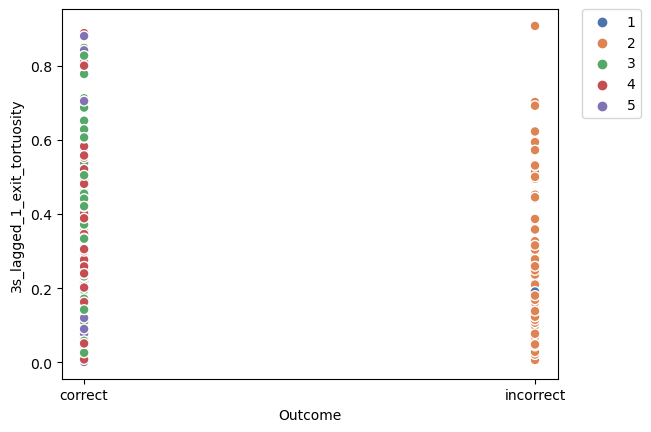

In [3869]:
sns.scatterplot(data=lagged_1_exit_tortuosity_3s, x = 'Outcome', y = '3s_lagged_1_exit_tortuosity', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3870]:
mean_lagged_1_exit_tortuosity_3s = get_mean_performances(lagged_1_exit_tortuosity_3s)

   mouse  3s_lagged_1_exit_tortuosity         %   Outcome
sa199m2e                     0.137539 81.132075   correct
sa199m2e                     0.138776 81.132075 incorrect
  sa78m5                     0.112720 93.103448   correct
  sa78m5                     0.027908 93.103448 incorrect
 sa325m1                     0.355561 68.181818   correct
 sa325m1                     0.281292 68.181818 incorrect
sa196m1e                     0.139282 91.666667   correct
sa196m1e                     0.099315 91.666667 incorrect
sa199m1e                     0.188743 83.870968   correct
sa199m1e                     0.261954 83.870968 incorrect
 sa325m2                     0.132425 77.272727   correct
 sa325m2                     0.233239 77.272727 incorrect
sa196m3e                     0.204870 79.069767   correct
sa196m3e                     0.096048 79.069767 incorrect
 sa498m2                     0.389181 70.000000   correct
 sa498m2                     0.269107 70.000000 incorrect
 sa325m4      

In [3871]:
mean_lagged_1_exit_tortuosity_3s

#mean_lagged_1_exit_tortuosity_3s.to_csv('mean_exit_tortuosity_past_2.csv', sep='\t', index=False)

,mouse,3s_lagged_1_exit_tortuosity,%,Outcome
0,sa199m2e,0.137539,81.132075,correct
1,sa199m2e,0.138776,81.132075,incorrect
2,sa78m5,0.112720,93.103448,correct
3,sa78m5,0.027908,93.103448,incorrect
4,sa325m1,0.355561,68.181818,correct
5,sa325m1,0.281292,68.181818,incorrect
6,sa196m1e,0.139282,91.666667,correct
7,sa196m1e,0.099315,91.666667,incorrect
8,sa199m1e,0.188743,83.870968,correct
9,sa199m1e,0.261954,83.870968,incorrect


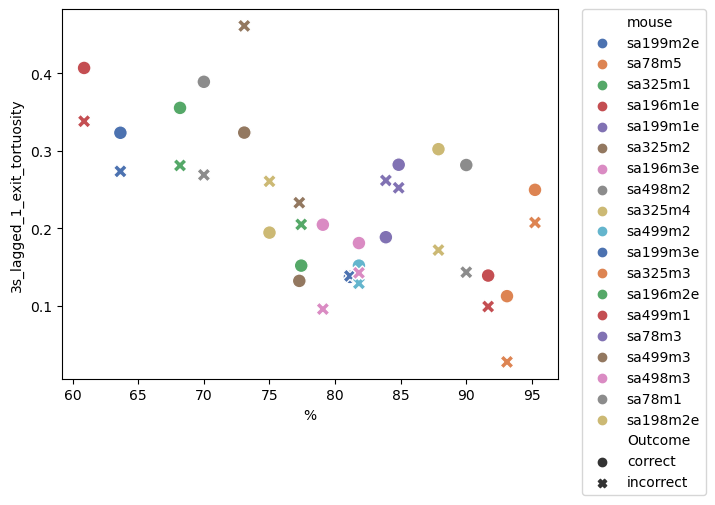

In [3872]:
sns.scatterplot(data=mean_lagged_1_exit_tortuosity_3s, x = '%', y = '3s_lagged_1_exit_tortuosity', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3873]:
lagged_1_other_tortuosity_3s = get_performance(df_grouped_scaled_ri, 'lagged_1_other_tortuosity', 3)

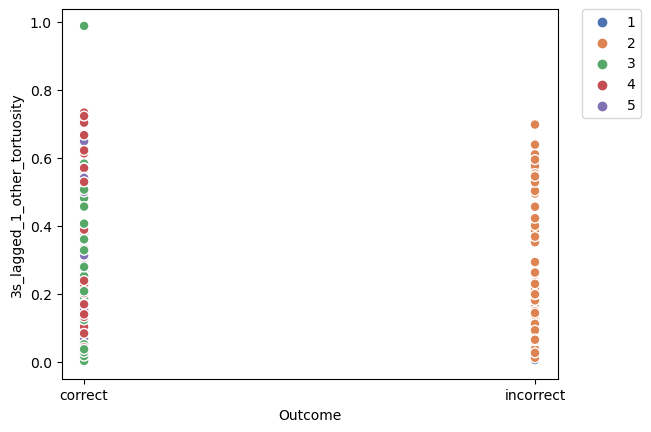

In [3874]:
sns.scatterplot(data=lagged_1_other_tortuosity_3s, x = 'Outcome', y = '3s_lagged_1_other_tortuosity', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3875]:
mean_lagged_1_other_tortuosity_3s = get_mean_performances(lagged_1_other_tortuosity_3s)

   mouse  3s_lagged_1_other_tortuosity         %   Outcome
sa199m2e                      0.125801 81.132075   correct
sa199m2e                      0.239337 81.132075 incorrect
  sa78m5                      0.116976 93.103448   correct
  sa78m5                      0.306603 93.103448 incorrect
 sa325m1                      0.280253 68.181818   correct
 sa325m1                      0.295868 68.181818 incorrect
sa196m1e                      0.158449 91.666667   correct
sa196m1e                      0.188632 91.666667 incorrect
sa199m1e                      0.257521 83.870968   correct
sa199m1e                      0.250576 83.870968 incorrect
 sa325m2                      0.260499 77.272727   correct
 sa325m2                      0.333829 77.272727 incorrect
sa196m3e                      0.155573 79.069767   correct
sa196m3e                      0.108094 79.069767 incorrect
 sa498m2                      0.125466 70.000000   correct
 sa498m2                      0.115247 70.000000 incorre

In [3876]:
mean_lagged_1_other_tortuosity_3s


,mouse,3s_lagged_1_other_tortuosity,%,Outcome
0,sa199m2e,0.125801,81.132075,correct
1,sa199m2e,0.239337,81.132075,incorrect
2,sa78m5,0.116976,93.103448,correct
3,sa78m5,0.306603,93.103448,incorrect
4,sa325m1,0.280253,68.181818,correct
5,sa325m1,0.295868,68.181818,incorrect
6,sa196m1e,0.158449,91.666667,correct
7,sa196m1e,0.188632,91.666667,incorrect
8,sa199m1e,0.257521,83.870968,correct
9,sa199m1e,0.250576,83.870968,incorrect


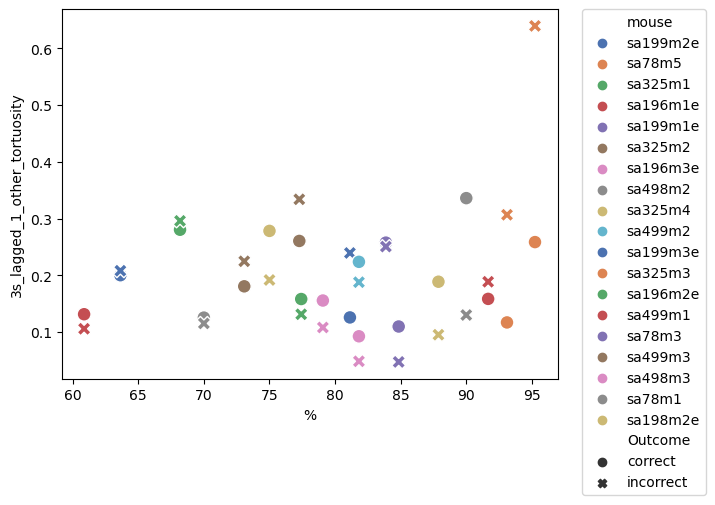

In [3877]:
sns.scatterplot(data=mean_lagged_1_other_tortuosity_3s, x = '%', y = '3s_lagged_1_other_tortuosity', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3878]:
entry_latency_3s = get_performance(df_grouped_scaled_ri, 'Entry Latency', 3)

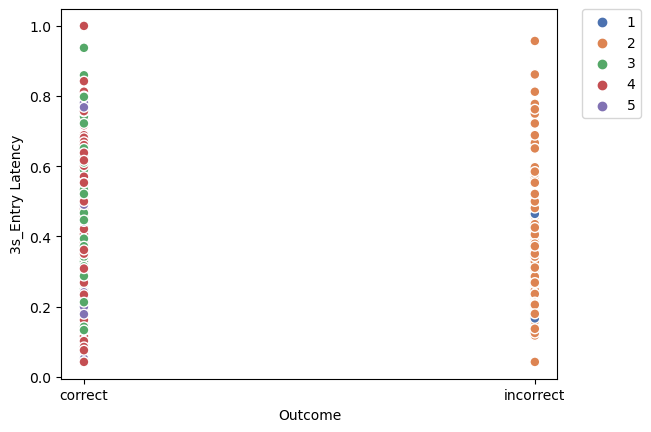

In [3879]:
sns.scatterplot(data=entry_latency_3s, x = 'Outcome', y = '3s_Entry Latency', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3880]:
mean_entry_latency_3s = get_mean_performances(entry_latency_3s)

   mouse  3s_Entry Latency         %   Outcome
sa199m2e          0.440407 81.132075   correct
sa199m2e          0.375000 81.132075 incorrect
  sa78m5          0.265700 93.103448   correct
  sa78m5          0.184783 93.103448 incorrect
 sa325m1          0.230556 68.181818   correct
 sa325m1          0.236111 68.181818 incorrect
sa196m1e          0.359971 91.666667   correct
sa196m1e          0.254032 91.666667 incorrect
sa199m1e          0.379060 83.870968   correct
sa199m1e          0.468889 83.870968 incorrect
 sa325m2          0.358436 77.272727   correct
 sa325m2          0.225275 77.272727 incorrect
sa196m3e          0.272518 79.069767   correct
sa196m3e          0.256076 79.069767 incorrect
 sa498m2          0.336395 70.000000   correct
 sa498m2          0.401587 70.000000 incorrect
 sa325m4          0.361458 75.000000   correct
 sa325m4          0.290625 75.000000 incorrect
 sa499m2          0.412551 81.818182   correct
 sa499m2          0.356481 81.818182 incorrect
sa199m3e     

In [3881]:
mean_entry_latency_3s

,mouse,3s_Entry Latency,%,Outcome
0,sa199m2e,0.440407,81.132075,correct
1,sa199m2e,0.375000,81.132075,incorrect
2,sa78m5,0.265700,93.103448,correct
3,sa78m5,0.184783,93.103448,incorrect
4,sa325m1,0.230556,68.181818,correct
5,sa325m1,0.236111,68.181818,incorrect
6,sa196m1e,0.359971,91.666667,correct
7,sa196m1e,0.254032,91.666667,incorrect
8,sa199m1e,0.379060,83.870968,correct
9,sa199m1e,0.468889,83.870968,incorrect


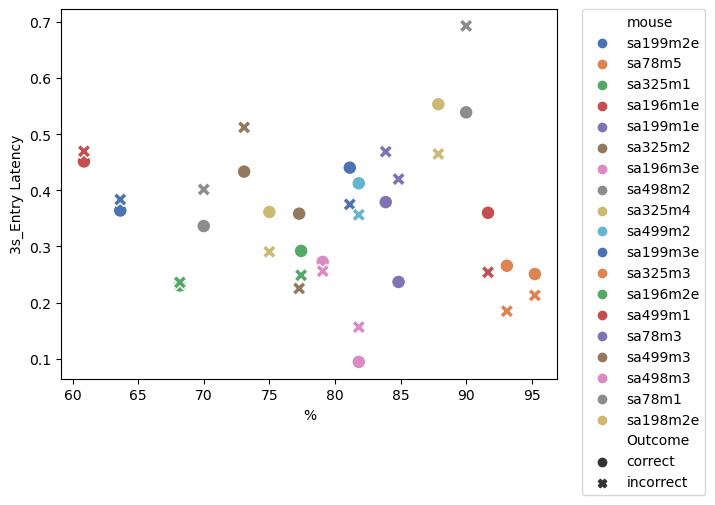

In [3882]:
sns.scatterplot(data=mean_entry_latency_3s, x = '%', y = '3s_Entry Latency', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3883]:
lagged_1_new_cur_coeff_3s = get_performance(df_grouped_scaled_ri, 'New Lagged 1 Cur Coeff', 3)

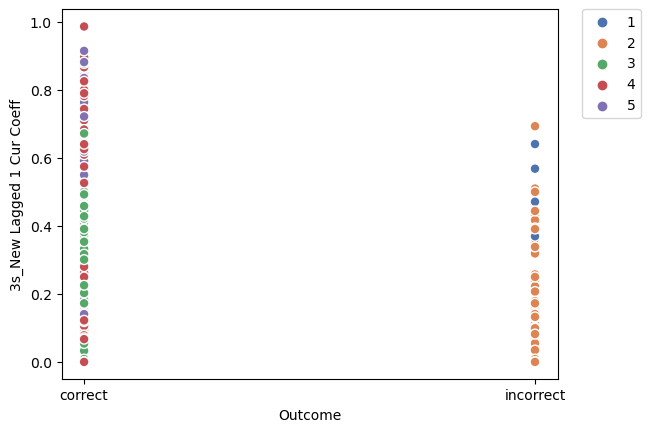

In [3884]:
sns.scatterplot(data=lagged_1_new_cur_coeff_3s, x = 'Outcome', y = '3s_New Lagged 1 Cur Coeff', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3885]:
mean_lagged_1_new_cur_coeff_3s = get_mean_performances(lagged_1_new_cur_coeff_3s)

   mouse  3s_New Lagged 1 Cur Coeff         %   Outcome
sa199m2e                   0.226010 81.132075   correct
sa199m2e                   0.061032 81.132075 incorrect
  sa78m5                   0.332311 93.103448   correct
  sa78m5                   0.201680 93.103448 incorrect
 sa325m1                   0.411373 68.181818   correct
 sa325m1                   0.314140 68.181818 incorrect
sa196m1e                   0.343340 91.666667   correct
sa196m1e                   0.107143 91.666667 incorrect
sa199m1e                   0.334333 83.870968   correct
sa199m1e                   0.112089 83.870968 incorrect
 sa325m2                   0.311926 77.272727   correct
 sa325m2                   0.180128 77.272727 incorrect
sa196m3e                   0.205743 79.069767   correct
sa196m3e                   0.237301 79.069767 incorrect
 sa498m2                   0.291952 70.000000   correct
 sa498m2                   0.253899 70.000000 incorrect
 sa325m4                   0.509612 75.000000   

In [3886]:
mean_lagged_1_new_cur_coeff_3s

,mouse,3s_New Lagged 1 Cur Coeff,%,Outcome
0,sa199m2e,0.226010,81.132075,correct
1,sa199m2e,0.061032,81.132075,incorrect
2,sa78m5,0.332311,93.103448,correct
3,sa78m5,0.201680,93.103448,incorrect
4,sa325m1,0.411373,68.181818,correct
5,sa325m1,0.314140,68.181818,incorrect
6,sa196m1e,0.343340,91.666667,correct
7,sa196m1e,0.107143,91.666667,incorrect
8,sa199m1e,0.334333,83.870968,correct
9,sa199m1e,0.112089,83.870968,incorrect


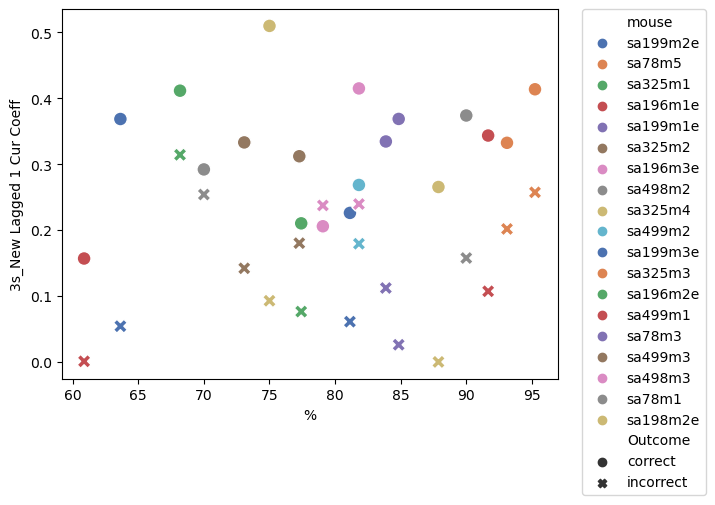

In [3887]:
sns.scatterplot(data=mean_lagged_1_new_cur_coeff_3s, x = '%', y = '3s_New Lagged 1 Cur Coeff', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3888]:
middle_duration_3s = get_performance(df_grouped_scaled_ri, 'Middle Duration', 3)

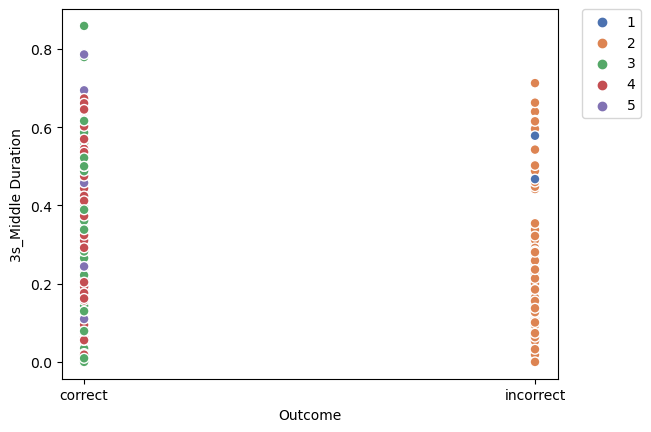

In [3889]:
sns.scatterplot(data=middle_duration_3s, x = 'Outcome', y = '3s_Middle Duration', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3890]:
mean_middle_duration_3s = get_mean_performances(middle_duration_3s)

   mouse  3s_Middle Duration         %   Outcome
sa199m2e            0.279611 81.132075   correct
sa199m2e            0.354651 81.132075 incorrect
  sa78m5            0.171820 93.103448   correct
  sa78m5            0.295991 93.103448 incorrect
 sa325m1            0.263333 68.181818   correct
 sa325m1            0.325000 68.181818 incorrect
sa196m1e            0.274306 91.666667   correct
sa196m1e            0.253472 91.666667 incorrect
sa199m1e            0.184129 83.870968   correct
sa199m1e            0.327586 83.870968 incorrect
 sa325m2            0.155374 77.272727   correct
 sa325m2            0.165823 77.272727 incorrect
sa196m3e            0.256115 79.069767   correct
sa196m3e            0.226073 79.069767 incorrect
 sa498m2            0.069402 70.000000   correct
 sa498m2            0.198976 70.000000 incorrect
 sa325m4            0.141394 75.000000   correct
 sa325m4            0.124183 75.000000 incorrect
 sa499m2            0.235434 81.818182   correct
 sa499m2            

In [3891]:
mean_middle_duration_3s

,mouse,3s_Middle Duration,%,Outcome
0,sa199m2e,0.279611,81.132075,correct
1,sa199m2e,0.354651,81.132075,incorrect
2,sa78m5,0.171820,93.103448,correct
3,sa78m5,0.295991,93.103448,incorrect
4,sa325m1,0.263333,68.181818,correct
5,sa325m1,0.325000,68.181818,incorrect
6,sa196m1e,0.274306,91.666667,correct
7,sa196m1e,0.253472,91.666667,incorrect
8,sa199m1e,0.184129,83.870968,correct
9,sa199m1e,0.327586,83.870968,incorrect


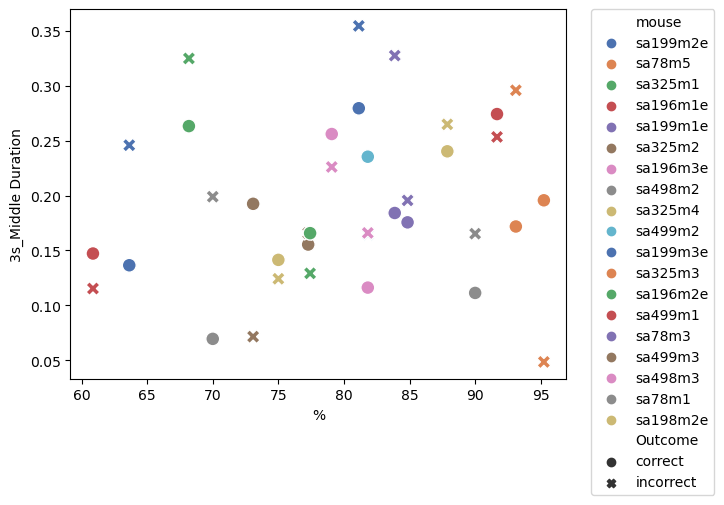

In [3892]:
sns.scatterplot(data=mean_middle_duration_3s, x = '%', y = '3s_Middle Duration', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3893]:
lagged_1_duration_4s = get_performance(df_grouped_scaled_ri, 'lagged_1_duration', 4)

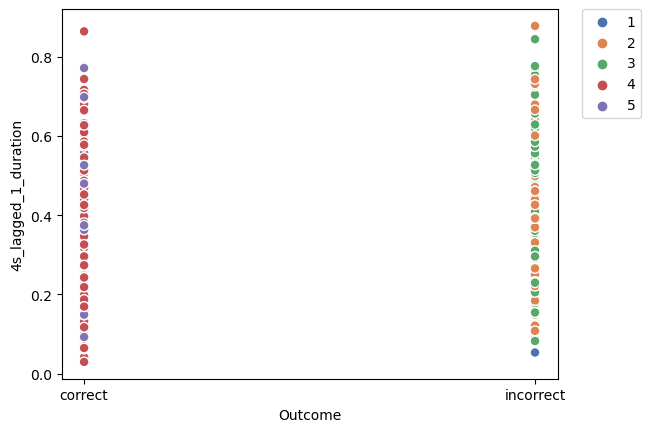

In [3894]:
sns.scatterplot(data=lagged_1_duration_4s, x = 'Outcome', y = '4s_lagged_1_duration', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3895]:
mean_lagged_1_duration_4s = get_mean_performances(lagged_1_duration_4s)

   mouse  4s_lagged_1_duration         %   Outcome
sa199m2e              0.314349 38.461538   correct
sa199m2e              0.300273 38.461538 incorrect
  sa78m5              0.326477 75.000000   correct
  sa78m5              0.304522 75.000000 incorrect
 sa325m1              0.357628 28.571429   correct
 sa325m1              0.349181 28.571429 incorrect
sa196m1e              0.195470 56.521739   correct
sa196m1e              0.230637 56.521739 incorrect
sa199m1e              0.262757 40.000000   correct
sa199m1e              0.293073 40.000000 incorrect
 sa325m2              0.171966 33.333333   correct
 sa325m2              0.244833 33.333333 incorrect
sa196m3e              0.366920 33.333333   correct
sa196m3e              0.328387 33.333333 incorrect
 sa498m2              0.483280 41.379310   correct
 sa498m2              0.353318 41.379310 incorrect
 sa325m4              0.201526 57.894737   correct
 sa325m4              0.175440 57.894737 incorrect
 sa499m2              0.345092 

In [3896]:
mean_lagged_1_duration_4s

,mouse,4s_lagged_1_duration,%,Outcome
0,sa199m2e,0.314349,38.461538,correct
1,sa199m2e,0.300273,38.461538,incorrect
2,sa78m5,0.326477,75.000000,correct
3,sa78m5,0.304522,75.000000,incorrect
4,sa325m1,0.357628,28.571429,correct
5,sa325m1,0.349181,28.571429,incorrect
6,sa196m1e,0.195470,56.521739,correct
7,sa196m1e,0.230637,56.521739,incorrect
8,sa199m1e,0.262757,40.000000,correct
9,sa199m1e,0.293073,40.000000,incorrect


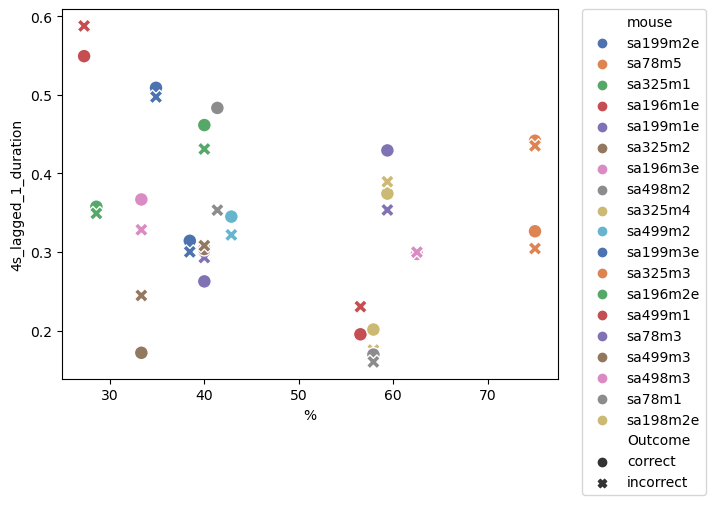

In [3897]:
sns.scatterplot(data=mean_lagged_1_duration_4s, x = '%', y = '4s_lagged_1_duration', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3898]:
lagged_1_duration_5s = get_performance(df_grouped_scaled_ri, 'lagged_1_duration', 5)

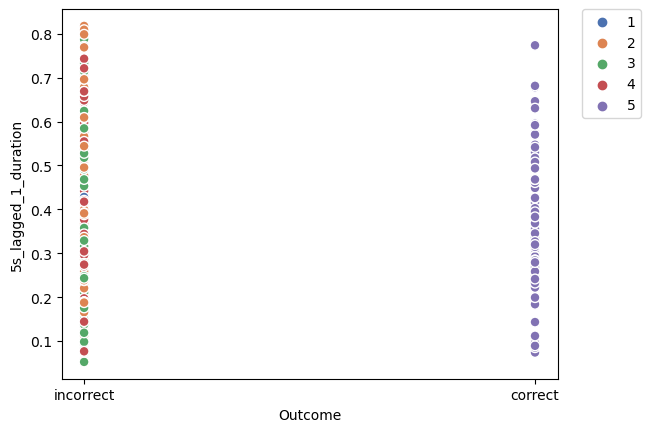

In [3899]:
sns.scatterplot(data=lagged_1_duration_5s, x = 'Outcome', y = '5s_lagged_1_duration', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3900]:
mean_lagged_1_duration_5s = get_mean_performances(lagged_1_duration_5s)

   mouse  5s_lagged_1_duration         %   Outcome
sa199m2e              0.280080  3.921569   correct
sa199m2e              0.307828  3.921569 incorrect
  sa78m5              0.331723 37.037037   correct
  sa78m5              0.323752 37.037037 incorrect
 sa325m1              0.493339  5.000000   correct
 sa325m1              0.341322  5.000000 incorrect
sa196m1e              0.226011  9.090909   correct
sa196m1e              0.212847  9.090909 incorrect
sa199m1e              0.245833  6.896552   correct
sa199m1e              0.284979  6.896552 incorrect
 sa325m2              0.182654 10.000000   correct
 sa325m2              0.223355 10.000000 incorrect
sa196m3e              0.448671  7.317073   correct
sa196m3e              0.333715  7.317073 incorrect
 sa498m2              0.557212 14.285714   correct
 sa498m2              0.388922 14.285714 incorrect
 sa325m4              0.089161  5.555556   correct
 sa325m4              0.189657  5.555556 incorrect
 sa499m2              0.354347 

C:\Users\Josue Regalado\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\Josue Regalado\anaconda3\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


In [3901]:
mean_lagged_1_duration_5s

,mouse,5s_lagged_1_duration,%,Outcome
0,sa199m2e,0.280080,3.921569,correct
1,sa199m2e,0.307828,3.921569,incorrect
2,sa78m5,0.331723,37.037037,correct
3,sa78m5,0.323752,37.037037,incorrect
4,sa325m1,0.493339,5.000000,correct
5,sa325m1,0.341322,5.000000,incorrect
6,sa196m1e,0.226011,9.090909,correct
7,sa196m1e,0.212847,9.090909,incorrect
8,sa199m1e,0.245833,6.896552,correct
9,sa199m1e,0.284979,6.896552,incorrect


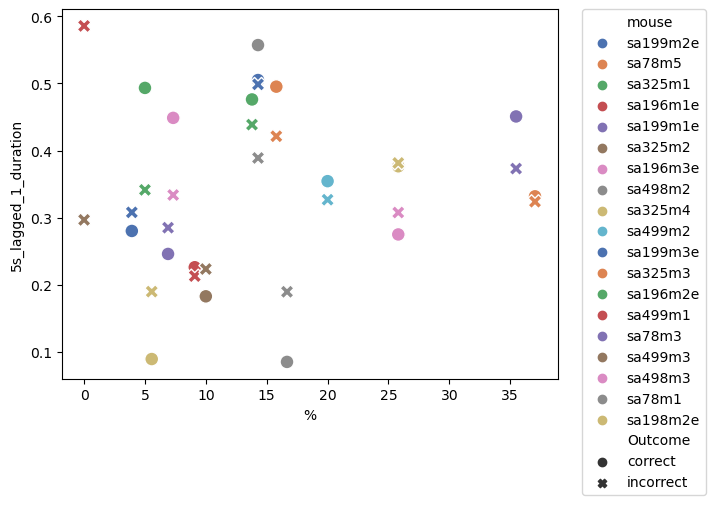

In [3902]:
sns.scatterplot(data=mean_lagged_1_duration_5s, x = '%', y = '5s_lagged_1_duration', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3903]:
# 4s

In [3904]:
exitmidentry_duration_4s = get_performance(df_grouped_scaled_ri, 'ExitMidEntry Duration', 4)

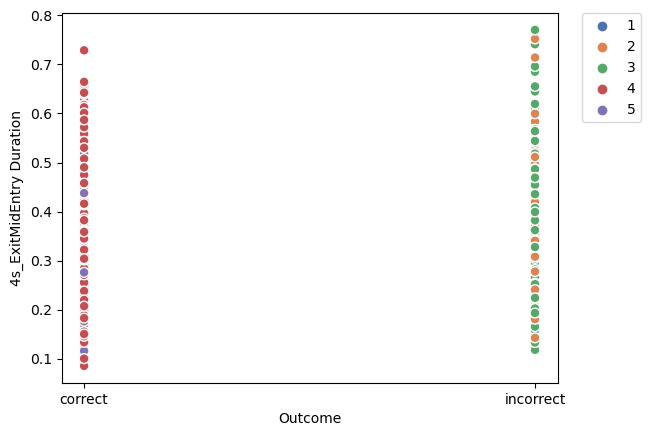

In [3905]:
sns.scatterplot(data=exitmidentry_duration_4s, x = 'Outcome', y = '4s_ExitMidEntry Duration', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3906]:
mean_exitmidentry_duration_4s = get_mean_performances(exitmidentry_duration_4s)

   mouse  4s_ExitMidEntry Duration         %   Outcome
sa199m2e                  0.476389 38.461538   correct
sa199m2e                  0.503906 38.461538 incorrect
  sa78m5                  0.266881 75.000000   correct
  sa78m5                  0.259685 75.000000 incorrect
 sa325m1                  0.213200 28.571429   correct
 sa325m1                  0.265527 28.571429 incorrect
sa196m1e                  0.484957 56.521739   correct
sa196m1e                  0.502667 56.521739 incorrect
sa199m1e                  0.339630 40.000000   correct
sa199m1e                  0.318395 40.000000 incorrect
 sa325m2                  0.366158 33.333333   correct
 sa325m2                  0.383957 33.333333 incorrect
sa196m3e                  0.407061 33.333333   correct
sa196m3e                  0.399015 33.333333 incorrect
 sa498m2                  0.229424 41.379310   correct
 sa498m2                  0.280804 41.379310 incorrect
 sa325m4                  0.388687 57.894737   correct
 sa325m4  

In [3907]:
mean_exitmidentry_duration_4s

,mouse,4s_ExitMidEntry Duration,%,Outcome
0,sa199m2e,0.476389,38.461538,correct
1,sa199m2e,0.503906,38.461538,incorrect
2,sa78m5,0.266881,75.000000,correct
3,sa78m5,0.259685,75.000000,incorrect
4,sa325m1,0.213200,28.571429,correct
5,sa325m1,0.265527,28.571429,incorrect
6,sa196m1e,0.484957,56.521739,correct
7,sa196m1e,0.502667,56.521739,incorrect
8,sa199m1e,0.339630,40.000000,correct
9,sa199m1e,0.318395,40.000000,incorrect


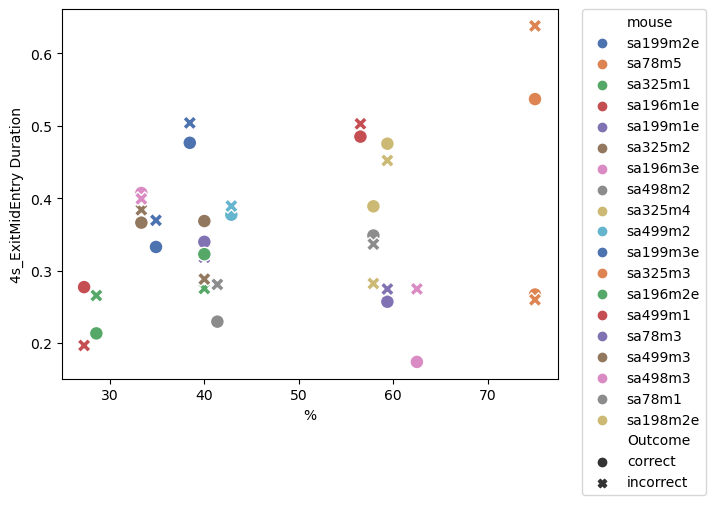

In [3908]:
sns.scatterplot(data=mean_exitmidentry_duration_4s, x = '%', y = '4s_ExitMidEntry Duration', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3909]:
middle_tortuosity_4s = get_performance(df_grouped_scaled_ri, 'Middle Tortuosity', 4)

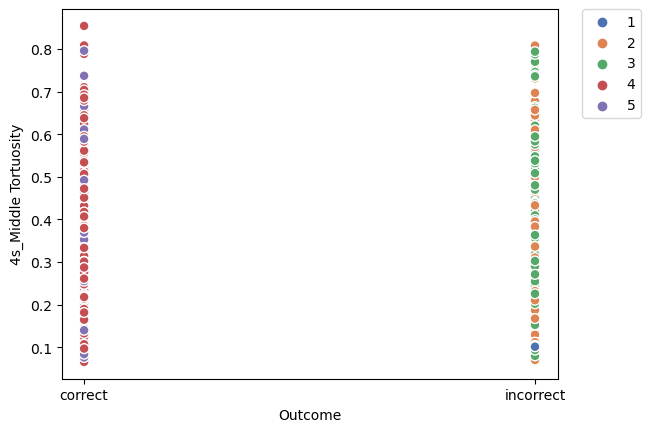

In [3910]:
sns.scatterplot(data=middle_tortuosity_4s, x = 'Outcome', y = '4s_Middle Tortuosity', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3911]:
mean_middle_tortuosity_4s = get_mean_performances(middle_tortuosity_4s)

   mouse  4s_Middle Tortuosity         %   Outcome
sa199m2e              0.552927 38.461538   correct
sa199m2e              0.578026 38.461538 incorrect
  sa78m5              0.197371 75.000000   correct
  sa78m5              0.207846 75.000000 incorrect
 sa325m1              0.176743 28.571429   correct
 sa325m1              0.195739 28.571429 incorrect
sa196m1e              0.450896 56.521739   correct
sa196m1e              0.509450 56.521739 incorrect
sa199m1e              0.357891 40.000000   correct
sa199m1e              0.360746 40.000000 incorrect
 sa325m2              0.379587 33.333333   correct
 sa325m2              0.411366 33.333333 incorrect
sa196m3e              0.174182 33.333333   correct
sa196m3e              0.219483 33.333333 incorrect
 sa498m2              0.096247 41.379310   correct
 sa498m2              0.139383 41.379310 incorrect
 sa325m4              0.343763 57.894737   correct
 sa325m4              0.212812 57.894737 incorrect
 sa499m2              0.640741 

In [3912]:
mean_middle_tortuosity_4s

,mouse,4s_Middle Tortuosity,%,Outcome
0,sa199m2e,0.552927,38.461538,correct
1,sa199m2e,0.578026,38.461538,incorrect
2,sa78m5,0.197371,75.000000,correct
3,sa78m5,0.207846,75.000000,incorrect
4,sa325m1,0.176743,28.571429,correct
5,sa325m1,0.195739,28.571429,incorrect
6,sa196m1e,0.450896,56.521739,correct
7,sa196m1e,0.509450,56.521739,incorrect
8,sa199m1e,0.357891,40.000000,correct
9,sa199m1e,0.360746,40.000000,incorrect


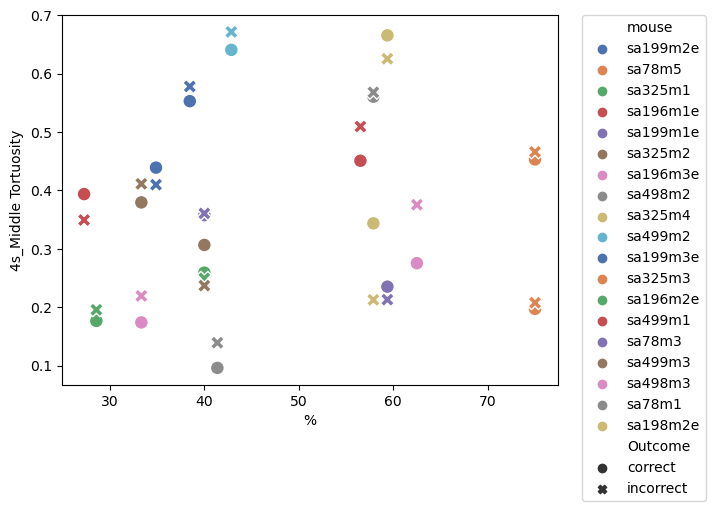

In [3913]:
sns.scatterplot(data=mean_middle_tortuosity_4s, x = '%', y = '4s_Middle Tortuosity', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3914]:
new_cur_coeff_time_prop_4s = get_performance(df_grouped_scaled_ri, 'New Current Coeff Time Proportional', 4)

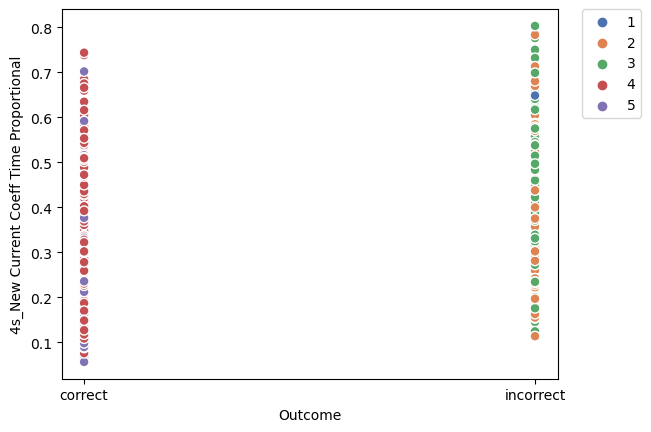

In [3915]:
sns.scatterplot(data=new_cur_coeff_time_prop_4s, x = 'Outcome', y = '4s_New Current Coeff Time Proportional', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3916]:
mean_new_cur_coeff_time_prop_4s = get_mean_performances(new_cur_coeff_time_prop_4s)

   mouse  4s_New Current Coeff Time Proportional         %   Outcome
sa199m2e                                0.409446 38.461538   correct
sa199m2e                                0.455009 38.461538 incorrect
  sa78m5                                0.271627 75.000000   correct
  sa78m5                                0.234825 75.000000 incorrect
 sa325m1                                0.365789 28.571429   correct
 sa325m1                                0.466676 28.571429 incorrect
sa196m1e                                0.455951 56.521739   correct
sa196m1e                                0.395270 56.521739 incorrect
sa199m1e                                0.441064 40.000000   correct
sa199m1e                                0.442324 40.000000 incorrect
 sa325m2                                0.374663 33.333333   correct
 sa325m2                                0.372422 33.333333 incorrect
sa196m3e                                0.465069 33.333333   correct
sa196m3e                          

In [3917]:
mean_new_cur_coeff_time_prop_4s

,mouse,4s_New Current Coeff Time Proportional,%,Outcome
0,sa199m2e,0.409446,38.461538,correct
1,sa199m2e,0.455009,38.461538,incorrect
2,sa78m5,0.271627,75.000000,correct
3,sa78m5,0.234825,75.000000,incorrect
4,sa325m1,0.365789,28.571429,correct
5,sa325m1,0.466676,28.571429,incorrect
6,sa196m1e,0.455951,56.521739,correct
7,sa196m1e,0.395270,56.521739,incorrect
8,sa199m1e,0.441064,40.000000,correct
9,sa199m1e,0.442324,40.000000,incorrect


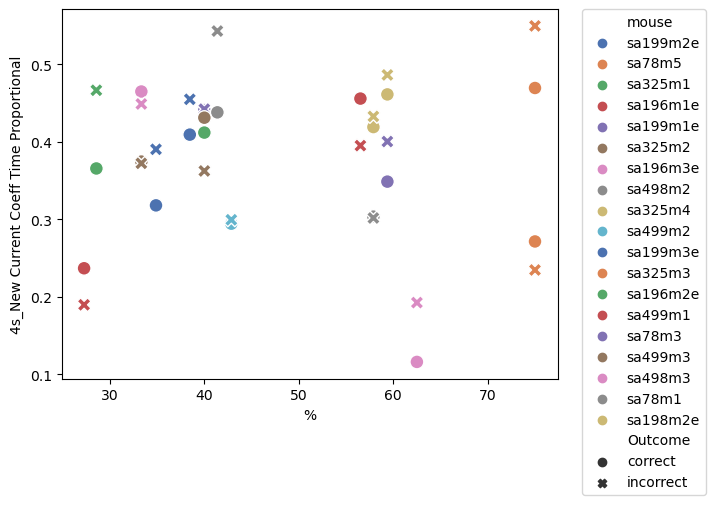

In [3918]:
sns.scatterplot(data=mean_new_cur_coeff_time_prop_4s, x = '%', y = '4s_New Current Coeff Time Proportional', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3919]:
new_current_coeff_4s = get_performance(df_grouped_scaled_ri, 'New Current Coeff', 4)

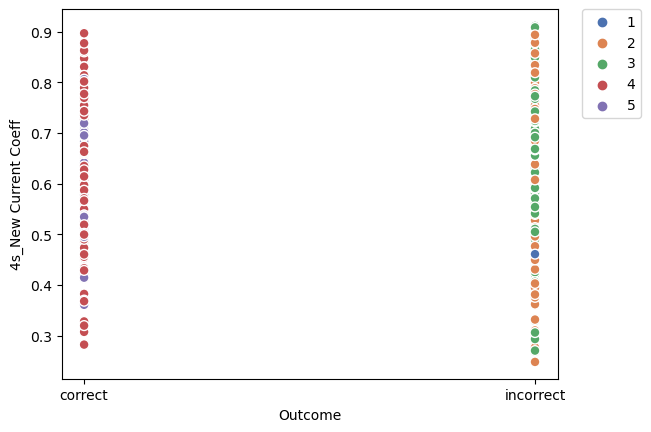

In [3920]:
sns.scatterplot(data=new_current_coeff_4s, x = 'Outcome', y = '4s_New Current Coeff', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3921]:
mean_new_current_coeff_4s = get_mean_performances(new_current_coeff_4s)

   mouse  4s_New Current Coeff         %   Outcome
sa199m2e              0.599658 38.461538   correct
sa199m2e              0.627589 38.461538 incorrect
  sa78m5              0.668050 75.000000   correct
  sa78m5              0.618412 75.000000 incorrect
 sa325m1              0.490590 28.571429   correct
 sa325m1              0.490508 28.571429 incorrect
sa196m1e              0.636044 56.521739   correct
sa196m1e              0.545779 56.521739 incorrect
sa199m1e              0.656721 40.000000   correct
sa199m1e              0.720315 40.000000 incorrect
 sa325m2              0.646167 33.333333   correct
 sa325m2              0.661395 33.333333 incorrect
sa196m3e              0.608773 33.333333   correct
sa196m3e              0.586113 33.333333 incorrect
 sa498m2              0.611451 41.379310   correct
 sa498m2              0.666177 41.379310 incorrect
 sa325m4              0.537278 57.894737   correct
 sa325m4              0.676638 57.894737 incorrect
 sa499m2              0.640186 

In [3922]:
mean_new_current_coeff_4s

,mouse,4s_New Current Coeff,%,Outcome
0,sa199m2e,0.599658,38.461538,correct
1,sa199m2e,0.627589,38.461538,incorrect
2,sa78m5,0.668050,75.000000,correct
3,sa78m5,0.618412,75.000000,incorrect
4,sa325m1,0.490590,28.571429,correct
5,sa325m1,0.490508,28.571429,incorrect
6,sa196m1e,0.636044,56.521739,correct
7,sa196m1e,0.545779,56.521739,incorrect
8,sa199m1e,0.656721,40.000000,correct
9,sa199m1e,0.720315,40.000000,incorrect


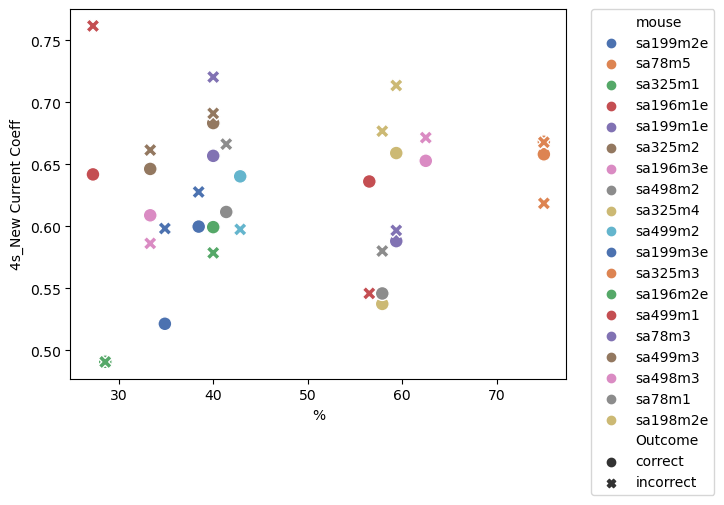

In [3923]:
sns.scatterplot(data=mean_new_current_coeff_4s, x = '%', y = '4s_New Current Coeff', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3924]:
current_coeff_4s = get_performance(df_grouped_scaled_ri, 'Current Coeff', 4)

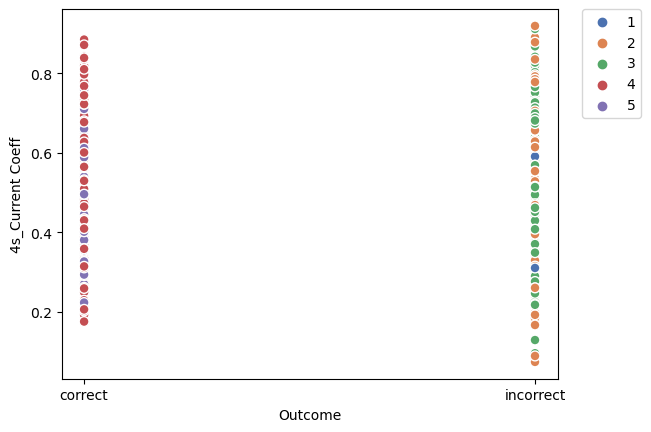

In [3925]:
sns.scatterplot(data=current_coeff_4s, x = 'Outcome', y = '4s_Current Coeff', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3926]:
mean_current_coeff_4s = get_mean_performances(current_coeff_4s)

   mouse  4s_Current Coeff         %   Outcome
sa199m2e          0.510385 38.461538   correct
sa199m2e          0.519167 38.461538 incorrect
  sa78m5          0.551642 75.000000   correct
  sa78m5          0.535521 75.000000 incorrect
 sa325m1          0.430075 28.571429   correct
 sa325m1          0.443373 28.571429 incorrect
sa196m1e          0.503804 56.521739   correct
sa196m1e          0.445180 56.521739 incorrect
sa199m1e          0.496821 40.000000   correct
sa199m1e          0.585791 40.000000 incorrect
 sa325m2          0.580347 33.333333   correct
 sa325m2          0.580358 33.333333 incorrect
sa196m3e          0.532872 33.333333   correct
sa196m3e          0.484193 33.333333 incorrect
 sa498m2          0.533699 41.379310   correct
 sa498m2          0.605062 41.379310 incorrect
 sa325m4          0.439671 57.894737   correct
 sa325m4          0.604402 57.894737 incorrect
 sa499m2          0.537111 42.857143   correct
 sa499m2          0.470186 42.857143 incorrect
sa199m3e     

In [3927]:
mean_current_coeff_4s

,mouse,4s_Current Coeff,%,Outcome
0,sa199m2e,0.510385,38.461538,correct
1,sa199m2e,0.519167,38.461538,incorrect
2,sa78m5,0.551642,75.000000,correct
3,sa78m5,0.535521,75.000000,incorrect
4,sa325m1,0.430075,28.571429,correct
5,sa325m1,0.443373,28.571429,incorrect
6,sa196m1e,0.503804,56.521739,correct
7,sa196m1e,0.445180,56.521739,incorrect
8,sa199m1e,0.496821,40.000000,correct
9,sa199m1e,0.585791,40.000000,incorrect


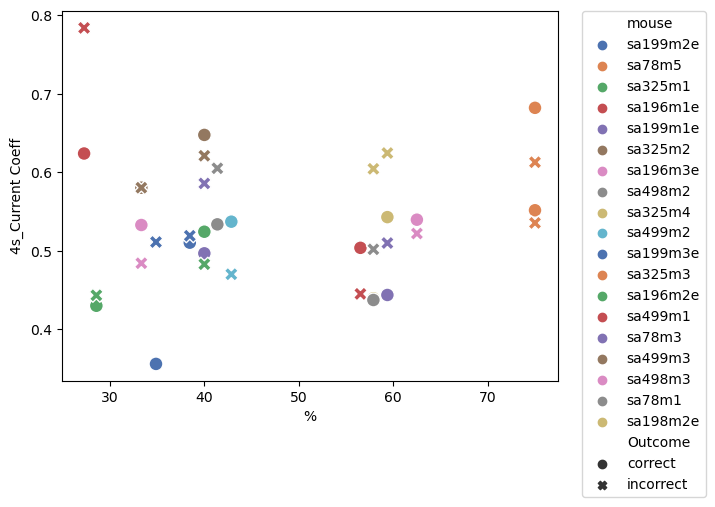

In [3928]:
sns.scatterplot(data=mean_current_coeff_4s, x = '%', y = '4s_Current Coeff', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3929]:
cur_coeff_time_prop_4s = get_performance(df_grouped_scaled_ri, 'Current Coeff Time Proportional', 4)

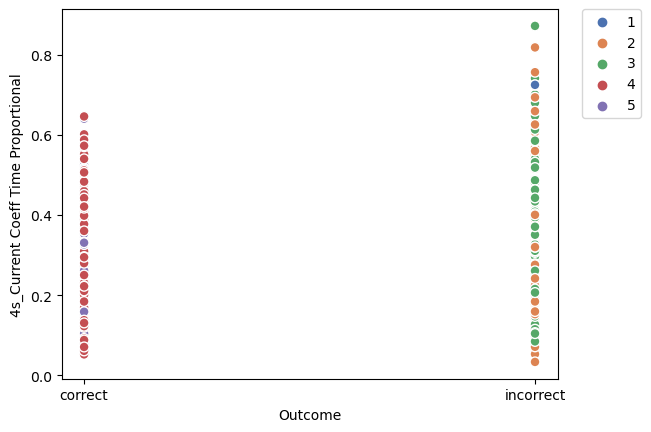

In [3930]:
sns.scatterplot(data=cur_coeff_time_prop_4s, x = 'Outcome', y = '4s_Current Coeff Time Proportional', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3931]:
mean_cur_coeff_time_prop_4s = get_mean_performances(cur_coeff_time_prop_4s)

   mouse  4s_Current Coeff Time Proportional         %   Outcome
sa199m2e                            0.231397 38.461538   correct
sa199m2e                            0.283162 38.461538 incorrect
  sa78m5                            0.211702 75.000000   correct
  sa78m5                            0.192051 75.000000 incorrect
 sa325m1                            0.419405 28.571429   correct
 sa325m1                            0.548170 28.571429 incorrect
sa196m1e                            0.321192 56.521739   correct
sa196m1e                            0.290395 56.521739 incorrect
sa199m1e                            0.384046 40.000000   correct
sa199m1e                            0.387807 40.000000 incorrect
 sa325m2                            0.286240 33.333333   correct
 sa325m2                            0.278230 33.333333 incorrect
sa196m3e                            0.373163 33.333333   correct
sa196m3e                            0.370465 33.333333 incorrect
 sa498m2                 

In [3932]:
mean_cur_coeff_time_prop_4s

,mouse,4s_Current Coeff Time Proportional,%,Outcome
0,sa199m2e,0.231397,38.461538,correct
1,sa199m2e,0.283162,38.461538,incorrect
2,sa78m5,0.211702,75.000000,correct
3,sa78m5,0.192051,75.000000,incorrect
4,sa325m1,0.419405,28.571429,correct
5,sa325m1,0.548170,28.571429,incorrect
6,sa196m1e,0.321192,56.521739,correct
7,sa196m1e,0.290395,56.521739,incorrect
8,sa199m1e,0.384046,40.000000,correct
9,sa199m1e,0.387807,40.000000,incorrect


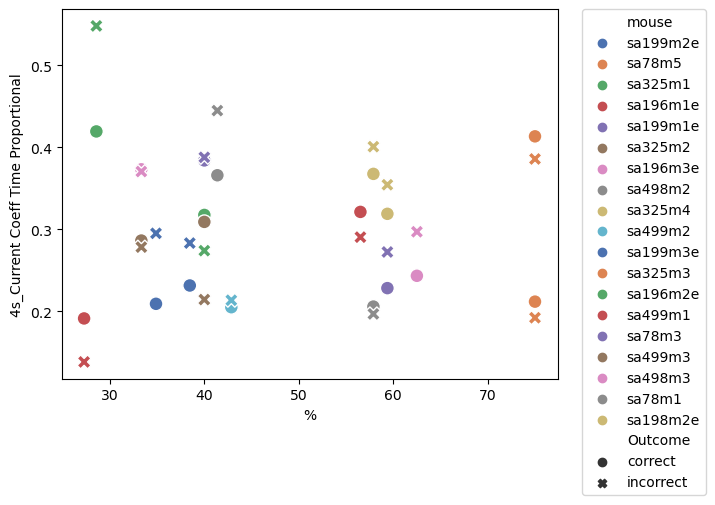

In [3933]:
sns.scatterplot(data=mean_cur_coeff_time_prop_4s, x = '%', y = '4s_Current Coeff Time Proportional', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3934]:
lagged_1_duration_4s = get_performance(df_grouped_scaled_ri, 'lagged_1_duration', 4)

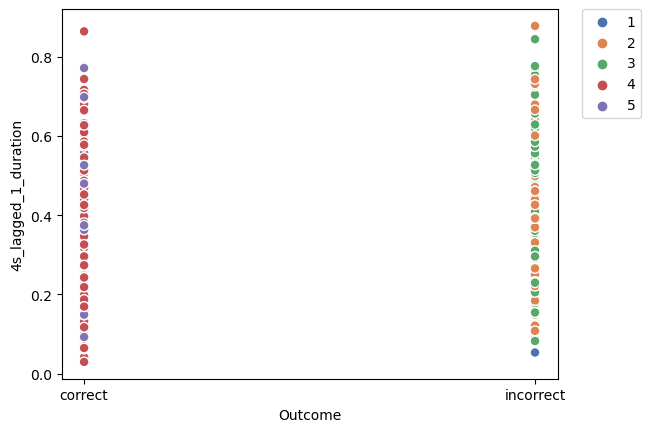

In [3935]:
sns.scatterplot(data=lagged_1_duration_4s, x = 'Outcome', y = '4s_lagged_1_duration', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3936]:
mean_lagged_1_duration_4s = get_mean_performances(lagged_1_duration_4s)

   mouse  4s_lagged_1_duration         %   Outcome
sa199m2e              0.314349 38.461538   correct
sa199m2e              0.300273 38.461538 incorrect
  sa78m5              0.326477 75.000000   correct
  sa78m5              0.304522 75.000000 incorrect
 sa325m1              0.357628 28.571429   correct
 sa325m1              0.349181 28.571429 incorrect
sa196m1e              0.195470 56.521739   correct
sa196m1e              0.230637 56.521739 incorrect
sa199m1e              0.262757 40.000000   correct
sa199m1e              0.293073 40.000000 incorrect
 sa325m2              0.171966 33.333333   correct
 sa325m2              0.244833 33.333333 incorrect
sa196m3e              0.366920 33.333333   correct
sa196m3e              0.328387 33.333333 incorrect
 sa498m2              0.483280 41.379310   correct
 sa498m2              0.353318 41.379310 incorrect
 sa325m4              0.201526 57.894737   correct
 sa325m4              0.175440 57.894737 incorrect
 sa499m2              0.345092 

In [3937]:
mean_lagged_1_duration_4s
#mean_lagged_1_duration_4s.to_csv('mean_arm_dur_past_2.csv', sep='\t', index=False)


,mouse,4s_lagged_1_duration,%,Outcome
0,sa199m2e,0.314349,38.461538,correct
1,sa199m2e,0.300273,38.461538,incorrect
2,sa78m5,0.326477,75.000000,correct
3,sa78m5,0.304522,75.000000,incorrect
4,sa325m1,0.357628,28.571429,correct
5,sa325m1,0.349181,28.571429,incorrect
6,sa196m1e,0.195470,56.521739,correct
7,sa196m1e,0.230637,56.521739,incorrect
8,sa199m1e,0.262757,40.000000,correct
9,sa199m1e,0.293073,40.000000,incorrect


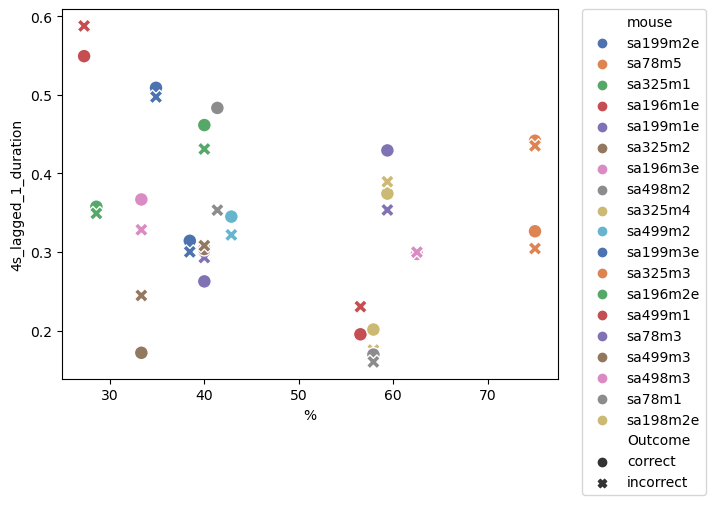

In [3938]:
sns.scatterplot(data=mean_lagged_1_duration_4s, x = '%', y = '4s_lagged_1_duration', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3939]:
lagged_1_nose_time_to_max_dist_4s = get_performance(df_grouped_scaled_ri, 'lagged_1_nose_time_to_max_dist', 4)

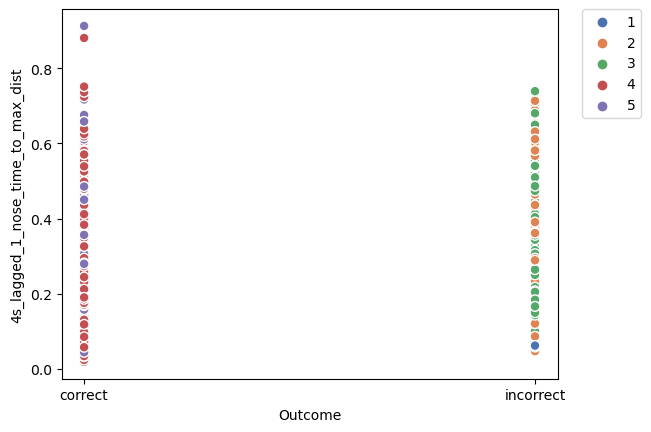

In [3940]:
sns.scatterplot(data=lagged_1_nose_time_to_max_dist_4s, x = 'Outcome', y = '4s_lagged_1_nose_time_to_max_dist', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3941]:
mean_lagged_1_nose_time_to_max_dist_4s = get_mean_performances(lagged_1_nose_time_to_max_dist_4s)

   mouse  4s_lagged_1_nose_time_to_max_dist         %   Outcome
sa199m2e                           0.268434 38.461538   correct
sa199m2e                           0.244831 38.461538 incorrect
  sa78m5                           0.475897 75.000000   correct
  sa78m5                           0.493827 75.000000 incorrect
 sa325m1                           0.251943 28.571429   correct
 sa325m1                           0.284499 28.571429 incorrect
sa196m1e                           0.112235 56.521739   correct
sa196m1e                           0.158116 56.521739 incorrect
sa199m1e                           0.427172 40.000000   correct
sa199m1e                           0.430674 40.000000 incorrect
 sa325m2                           0.260757 33.333333   correct
 sa325m2                           0.285465 33.333333 incorrect
sa196m3e                           0.310786 33.333333   correct
sa196m3e                           0.262716 33.333333 incorrect
 sa498m2                           0.338

In [3942]:
mean_lagged_1_nose_time_to_max_dist_4s

#mean_lagged_1_nose_time_to_max_dist_4s.to_csv('mean_time_to_max_past_2.csv', sep='\t', index=False)

,mouse,4s_lagged_1_nose_time_to_max_dist,%,Outcome
0,sa199m2e,0.268434,38.461538,correct
1,sa199m2e,0.244831,38.461538,incorrect
2,sa78m5,0.475897,75.000000,correct
3,sa78m5,0.493827,75.000000,incorrect
4,sa325m1,0.251943,28.571429,correct
5,sa325m1,0.284499,28.571429,incorrect
6,sa196m1e,0.112235,56.521739,correct
7,sa196m1e,0.158116,56.521739,incorrect
8,sa199m1e,0.427172,40.000000,correct
9,sa199m1e,0.430674,40.000000,incorrect


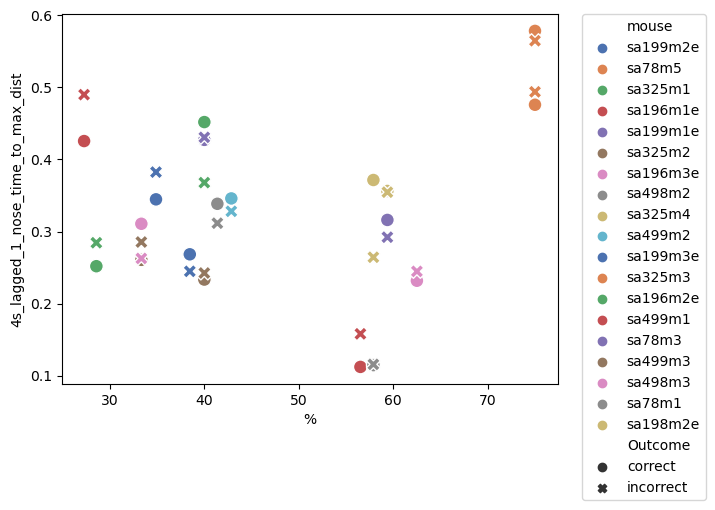

In [3943]:
sns.scatterplot(data=mean_lagged_1_nose_time_to_max_dist_4s, x = '%', y = '4s_lagged_1_nose_time_to_max_dist', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3944]:
lagged_1_arm_nose_mov_4s = get_performance(df_grouped_scaled_ri, 'lagged_1_arm_nose_mov', 4)

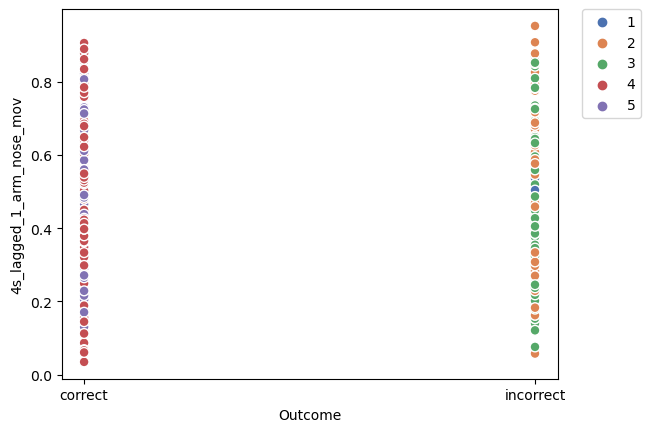

In [3945]:
sns.scatterplot(data=lagged_1_arm_nose_mov_4s, x = 'Outcome', y = '4s_lagged_1_arm_nose_mov', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3946]:
mean_lagged_1_arm_nose_mov_4s = get_mean_performances(lagged_1_arm_nose_mov_4s)

   mouse  4s_lagged_1_arm_nose_mov         %   Outcome
sa199m2e                  0.548492 38.461538   correct
sa199m2e                  0.571796 38.461538 incorrect
  sa78m5                  0.383335 75.000000   correct
  sa78m5                  0.382131 75.000000 incorrect
 sa325m1                  0.493607 28.571429   correct
 sa325m1                  0.476166 28.571429 incorrect
sa196m1e                  0.320956 56.521739   correct
sa196m1e                  0.393891 56.521739 incorrect
sa199m1e                  0.290468 40.000000   correct
sa199m1e                  0.312875 40.000000 incorrect
 sa325m2                  0.360745 33.333333   correct
 sa325m2                  0.405558 33.333333 incorrect
sa196m3e                  0.580556 33.333333   correct
sa196m3e                  0.578462 33.333333 incorrect
 sa498m2                  0.597214 41.379310   correct
 sa498m2                  0.470092 41.379310 incorrect
 sa325m4                  0.401604 57.894737   correct
 sa325m4  

In [3947]:
mean_lagged_1_arm_nose_mov_4s

#mean_lagged_1_arm_nose_mov_4s.to_csv('dist_in_arm_past_2_nose.csv', sep='\t', index=False)

,mouse,4s_lagged_1_arm_nose_mov,%,Outcome
0,sa199m2e,0.548492,38.461538,correct
1,sa199m2e,0.571796,38.461538,incorrect
2,sa78m5,0.383335,75.000000,correct
3,sa78m5,0.382131,75.000000,incorrect
4,sa325m1,0.493607,28.571429,correct
5,sa325m1,0.476166,28.571429,incorrect
6,sa196m1e,0.320956,56.521739,correct
7,sa196m1e,0.393891,56.521739,incorrect
8,sa199m1e,0.290468,40.000000,correct
9,sa199m1e,0.312875,40.000000,incorrect


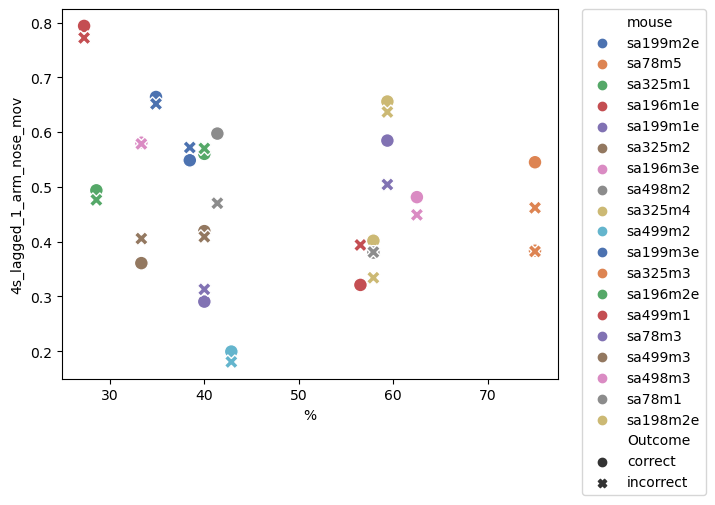

In [3948]:
sns.scatterplot(data=mean_lagged_1_arm_nose_mov_4s, x = '%', y = '4s_lagged_1_arm_nose_mov', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3949]:
lagged_1_arm_nose_vel_4s = get_performance(df_grouped_scaled_ri, 'lagged_1_arm_nose_vel', 4)

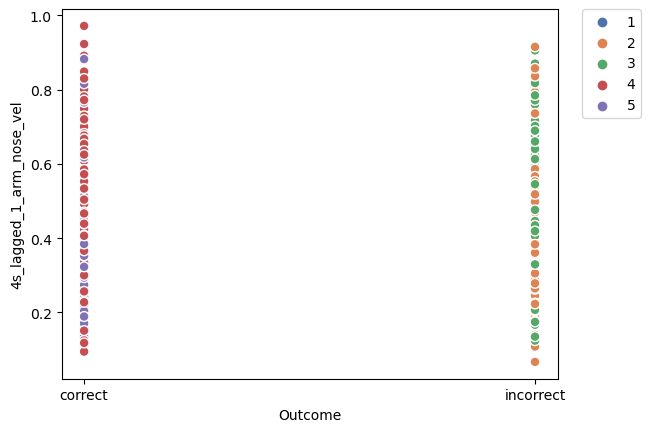

In [3950]:
sns.scatterplot(data=lagged_1_arm_nose_vel_4s, x = 'Outcome', y = '4s_lagged_1_arm_nose_vel', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3951]:
mean_lagged_1_arm_nose_vel_4s = get_mean_performances(lagged_1_arm_nose_vel_4s)

   mouse  4s_lagged_1_arm_nose_vel         %   Outcome
sa199m2e                  0.501864 38.461538   correct
sa199m2e                  0.577341 38.461538 incorrect
  sa78m5                  0.408583 75.000000   correct
  sa78m5                  0.437526 75.000000 incorrect
 sa325m1                  0.451024 28.571429   correct
 sa325m1                  0.471650 28.571429 incorrect
sa196m1e                  0.465796 56.521739   correct
sa196m1e                  0.512619 56.521739 incorrect
sa199m1e                  0.440889 40.000000   correct
sa199m1e                  0.432964 40.000000 incorrect
 sa325m2                  0.652728 33.333333   correct
 sa325m2                  0.512690 33.333333 incorrect
sa196m3e                  0.509455 33.333333   correct
sa196m3e                  0.593197 33.333333 incorrect
 sa498m2                  0.276468 41.379310   correct
 sa498m2                  0.340652 41.379310 incorrect
 sa325m4                  0.448937 57.894737   correct
 sa325m4  

In [3952]:
mean_lagged_1_arm_nose_vel_4s
#mean_lagged_1_arm_nose_vel_4s.to_csv('mean_vel_past_2_nose.csv', sep='\t', index=False)

,mouse,4s_lagged_1_arm_nose_vel,%,Outcome
0,sa199m2e,0.501864,38.461538,correct
1,sa199m2e,0.577341,38.461538,incorrect
2,sa78m5,0.408583,75.000000,correct
3,sa78m5,0.437526,75.000000,incorrect
4,sa325m1,0.451024,28.571429,correct
5,sa325m1,0.471650,28.571429,incorrect
6,sa196m1e,0.465796,56.521739,correct
7,sa196m1e,0.512619,56.521739,incorrect
8,sa199m1e,0.440889,40.000000,correct
9,sa199m1e,0.432964,40.000000,incorrect


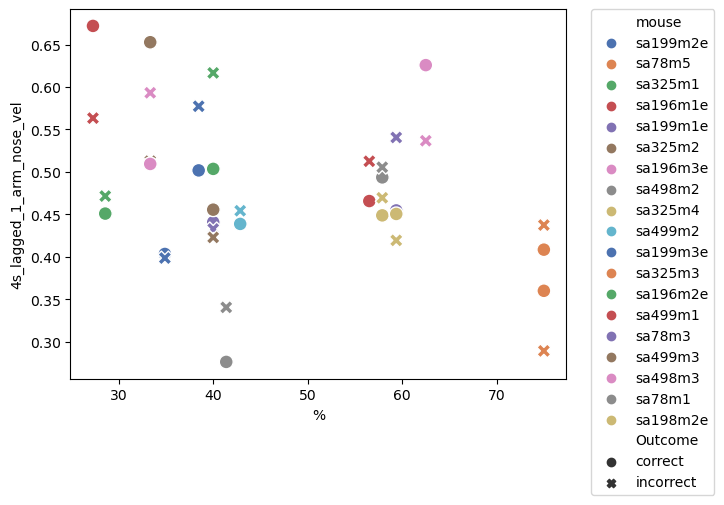

In [3953]:
sns.scatterplot(data=mean_lagged_1_arm_nose_vel_4s, x = '%', y = '4s_lagged_1_arm_nose_vel', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3954]:
lagged_1_arm_tail_mov_4s = get_performance(df_grouped_scaled_ri, 'lagged_1_arm_tail_mov', 4)

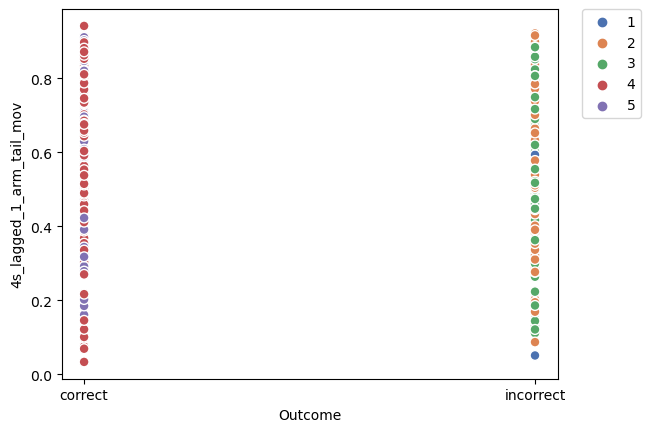

In [3955]:
sns.scatterplot(data=lagged_1_arm_tail_mov_4s, x = 'Outcome', y = '4s_lagged_1_arm_tail_mov', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3956]:
mean_lagged_1_arm_tail_mov_4s = get_mean_performances(lagged_1_arm_tail_mov_4s)

   mouse  4s_lagged_1_arm_tail_mov         %   Outcome
sa199m2e                  0.595174 38.461538   correct
sa199m2e                  0.618155 38.461538 incorrect
  sa78m5                  0.417502 75.000000   correct
  sa78m5                  0.425263 75.000000 incorrect
 sa325m1                  0.537583 28.571429   correct
 sa325m1                  0.514215 28.571429 incorrect
sa196m1e                  0.348927 56.521739   correct
sa196m1e                  0.427958 56.521739 incorrect
sa199m1e                  0.372289 40.000000   correct
sa199m1e                  0.490170 40.000000 incorrect
 sa325m2                  0.471703 33.333333   correct
 sa325m2                  0.488436 33.333333 incorrect
sa196m3e                  0.632536 33.333333   correct
sa196m3e                  0.628651 33.333333 incorrect
 sa498m2                  0.593993 41.379310   correct
 sa498m2                  0.459504 41.379310 incorrect
 sa325m4                  0.575029 57.894737   correct
 sa325m4  

In [3957]:
mean_lagged_1_arm_tail_mov_4s
#mean_lagged_1_arm_tail_mov_4s.to_csv('dist_in_arm_past_2_tail.csv', sep='\t', index=False)

,mouse,4s_lagged_1_arm_tail_mov,%,Outcome
0,sa199m2e,0.595174,38.461538,correct
1,sa199m2e,0.618155,38.461538,incorrect
2,sa78m5,0.417502,75.000000,correct
3,sa78m5,0.425263,75.000000,incorrect
4,sa325m1,0.537583,28.571429,correct
5,sa325m1,0.514215,28.571429,incorrect
6,sa196m1e,0.348927,56.521739,correct
7,sa196m1e,0.427958,56.521739,incorrect
8,sa199m1e,0.372289,40.000000,correct
9,sa199m1e,0.490170,40.000000,incorrect


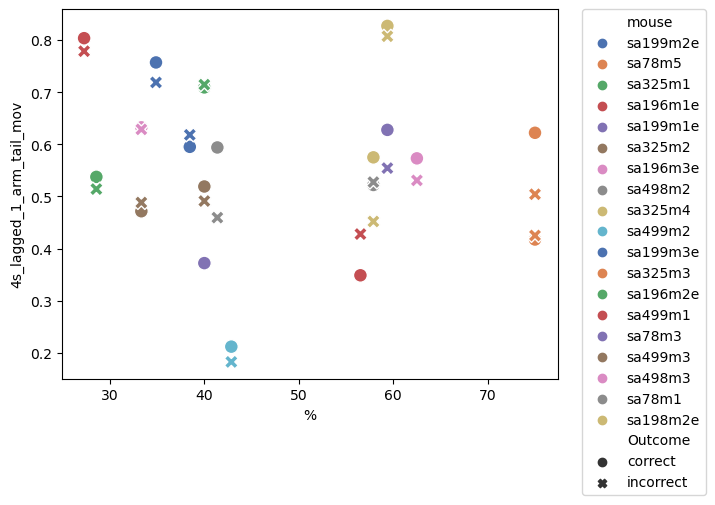

In [3958]:
sns.scatterplot(data=mean_lagged_1_arm_tail_mov_4s, x = '%', y = '4s_lagged_1_arm_tail_mov', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3959]:
lagged_1_arm_tail_vel_4s = get_performance(df_grouped_scaled_ri, 'lagged_1_arm_tail_vel', 4)

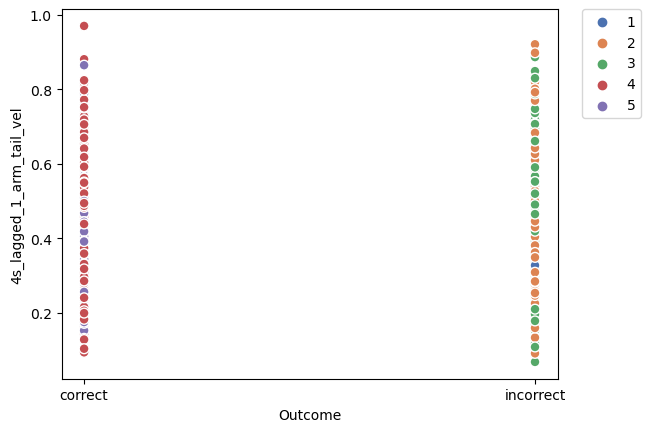

In [3960]:
sns.scatterplot(data=lagged_1_arm_tail_vel_4s, x = 'Outcome', y = '4s_lagged_1_arm_tail_vel', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3961]:
mean_lagged_1_arm_tail_vel_4s = get_mean_performances(lagged_1_arm_tail_vel_4s)

   mouse  4s_lagged_1_arm_tail_vel         %   Outcome
sa199m2e                  0.558708 38.461538   correct
sa199m2e                  0.625018 38.461538 incorrect
  sa78m5                  0.460314 75.000000   correct
  sa78m5                  0.504164 75.000000 incorrect
 sa325m1                  0.433142 28.571429   correct
 sa325m1                  0.450008 28.571429 incorrect
sa196m1e                  0.398498 56.521739   correct
sa196m1e                  0.463350 56.521739 incorrect
sa199m1e                  0.458071 40.000000   correct
sa199m1e                  0.486335 40.000000 incorrect
 sa325m2                  0.683590 33.333333   correct
 sa325m2                  0.522212 33.333333 incorrect
sa196m3e                  0.480392 33.333333   correct
sa196m3e                  0.550335 33.333333 incorrect
 sa498m2                  0.486018 41.379310   correct
 sa498m2                  0.500785 41.379310 incorrect
 sa325m4                  0.439325 57.894737   correct
 sa325m4  

In [3962]:
mean_lagged_1_arm_tail_vel_4s
#mean_lagged_1_arm_tail_vel_4s.to_csv('mean_vel_past_2_tail.csv', sep='\t', index=False)

,mouse,4s_lagged_1_arm_tail_vel,%,Outcome
0,sa199m2e,0.558708,38.461538,correct
1,sa199m2e,0.625018,38.461538,incorrect
2,sa78m5,0.460314,75.000000,correct
3,sa78m5,0.504164,75.000000,incorrect
4,sa325m1,0.433142,28.571429,correct
5,sa325m1,0.450008,28.571429,incorrect
6,sa196m1e,0.398498,56.521739,correct
7,sa196m1e,0.463350,56.521739,incorrect
8,sa199m1e,0.458071,40.000000,correct
9,sa199m1e,0.486335,40.000000,incorrect


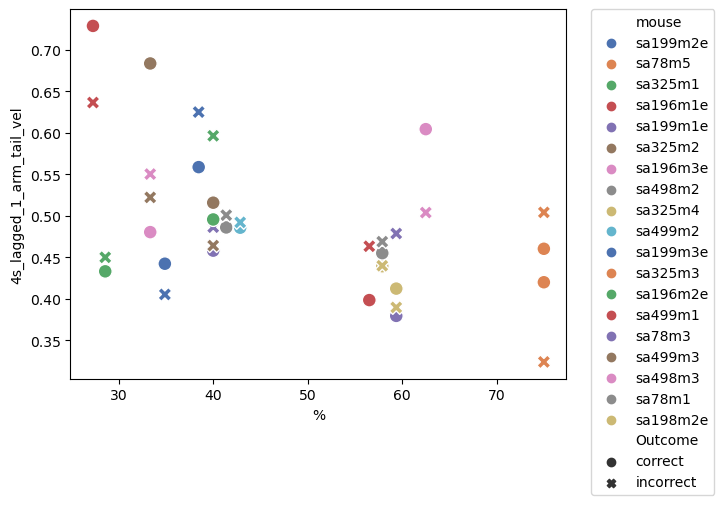

In [3963]:
sns.scatterplot(data=mean_lagged_1_arm_tail_vel_4s, x = '%', y = '4s_lagged_1_arm_tail_vel', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3964]:
lagged_1_entry_tortuosity_4s = get_performance(df_grouped_scaled_ri, 'lagged_1_entry_tortuosity', 4)

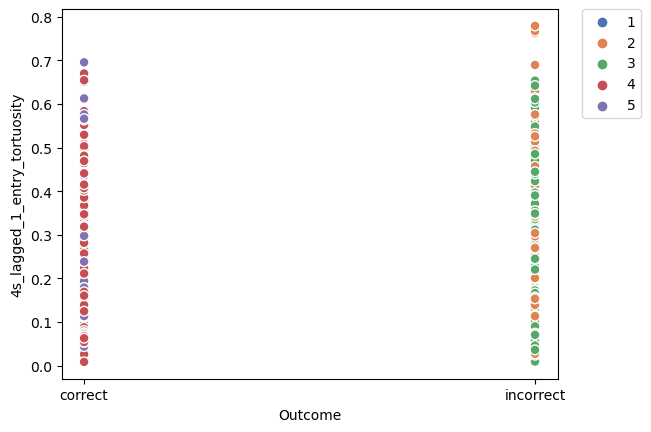

In [3965]:
sns.scatterplot(data=lagged_1_entry_tortuosity_4s, x = 'Outcome', y = '4s_lagged_1_entry_tortuosity', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3966]:
mean_lagged_1_entry_tortuosity_4s = get_mean_performances(lagged_1_entry_tortuosity_4s)

   mouse  4s_lagged_1_entry_tortuosity         %   Outcome
sa199m2e                      0.181695 38.461538   correct
sa199m2e                      0.155218 38.461538 incorrect
  sa78m5                      0.239540 75.000000   correct
  sa78m5                      0.239204 75.000000 incorrect
 sa325m1                      0.199480 28.571429   correct
 sa325m1                      0.185677 28.571429 incorrect
sa196m1e                      0.091148 56.521739   correct
sa196m1e                      0.131295 56.521739 incorrect
sa199m1e                      0.313831 40.000000   correct
sa199m1e                      0.319628 40.000000 incorrect
 sa325m2                      0.297396 33.333333   correct
 sa325m2                      0.309121 33.333333 incorrect
sa196m3e                      0.331250 33.333333   correct
sa196m3e                      0.257281 33.333333 incorrect
 sa498m2                      0.088609 41.379310   correct
 sa498m2                      0.199760 41.379310 incorre

In [3967]:
mean_lagged_1_entry_tortuosity_4s

,mouse,4s_lagged_1_entry_tortuosity,%,Outcome
0,sa199m2e,0.181695,38.461538,correct
1,sa199m2e,0.155218,38.461538,incorrect
2,sa78m5,0.239540,75.000000,correct
3,sa78m5,0.239204,75.000000,incorrect
4,sa325m1,0.199480,28.571429,correct
5,sa325m1,0.185677,28.571429,incorrect
6,sa196m1e,0.091148,56.521739,correct
7,sa196m1e,0.131295,56.521739,incorrect
8,sa199m1e,0.313831,40.000000,correct
9,sa199m1e,0.319628,40.000000,incorrect


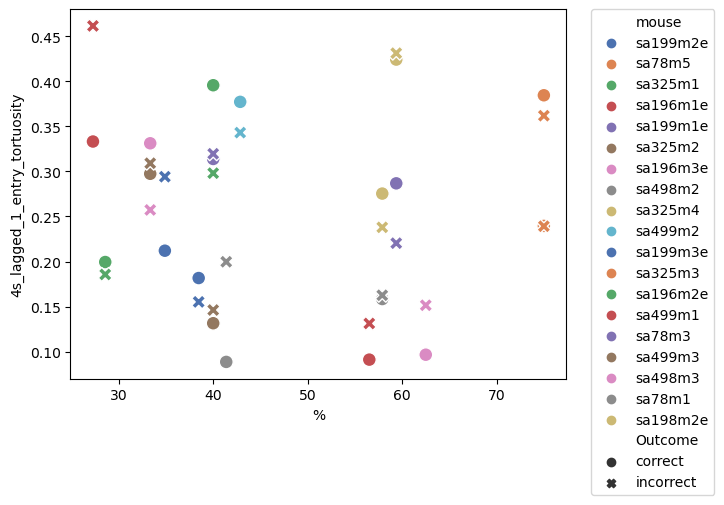

In [3968]:
sns.scatterplot(data=mean_lagged_1_entry_tortuosity_4s, x = '%', y = '4s_lagged_1_entry_tortuosity', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3969]:
lagged_1_exit_tortuosity_4s = get_performance(df_grouped_scaled_ri, 'lagged_1_exit_tortuosity', 4)

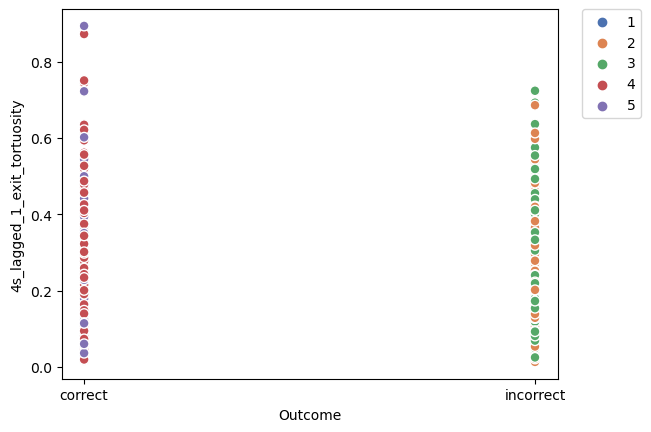

In [3970]:
sns.scatterplot(data=lagged_1_exit_tortuosity_4s, x = 'Outcome', y = '4s_lagged_1_exit_tortuosity', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3971]:
mean_lagged_1_exit_tortuosity_4s = get_mean_performances(lagged_1_exit_tortuosity_4s)

   mouse  4s_lagged_1_exit_tortuosity         %   Outcome
sa199m2e                     0.132778 38.461538   correct
sa199m2e                     0.141761 38.461538 incorrect
  sa78m5                     0.121553 75.000000   correct
  sa78m5                     0.076458 75.000000 incorrect
 sa325m1                     0.371263 28.571429   correct
 sa325m1                     0.310898 28.571429 incorrect
sa196m1e                     0.138973 56.521739   correct
sa196m1e                     0.140167 56.521739 incorrect
sa199m1e                     0.204758 40.000000   correct
sa199m1e                     0.198500 40.000000 incorrect
 sa325m2                     0.079835 33.333333   correct
 sa325m2                     0.193688 33.333333 incorrect
sa196m3e                     0.187415 33.333333   correct
sa196m3e                     0.178414 33.333333 incorrect
 sa498m2                     0.438432 41.379310   correct
 sa498m2                     0.303355 41.379310 incorrect
 sa325m4      

In [3972]:
mean_lagged_1_exit_tortuosity_4s

#mean_lagged_1_exit_tortuosity_4s.to_csv('mean_exit_tortuosity_past_2.csv', sep='\t', index=False)

,mouse,4s_lagged_1_exit_tortuosity,%,Outcome
0,sa199m2e,0.132778,38.461538,correct
1,sa199m2e,0.141761,38.461538,incorrect
2,sa78m5,0.121553,75.000000,correct
3,sa78m5,0.076458,75.000000,incorrect
4,sa325m1,0.371263,28.571429,correct
5,sa325m1,0.310898,28.571429,incorrect
6,sa196m1e,0.138973,56.521739,correct
7,sa196m1e,0.140167,56.521739,incorrect
8,sa199m1e,0.204758,40.000000,correct
9,sa199m1e,0.198500,40.000000,incorrect


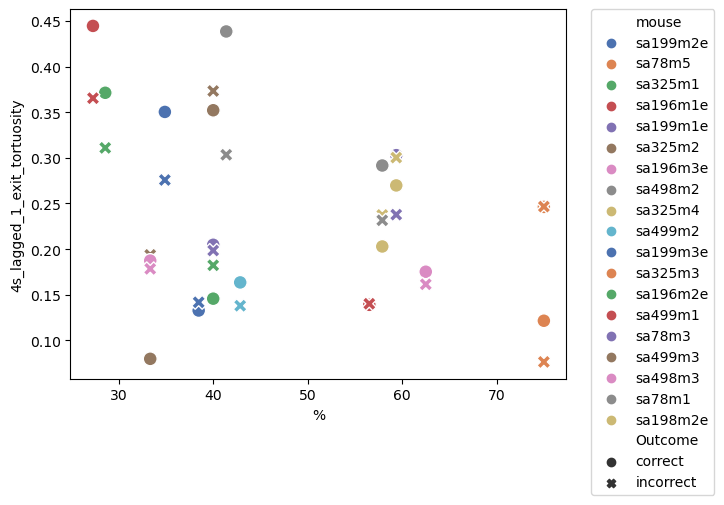

In [3973]:
sns.scatterplot(data=mean_lagged_1_exit_tortuosity_4s, x = '%', y = '4s_lagged_1_exit_tortuosity', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3974]:
lagged_1_other_tortuosity_4s = get_performance(df_grouped_scaled_ri, 'lagged_1_other_tortuosity', 4)

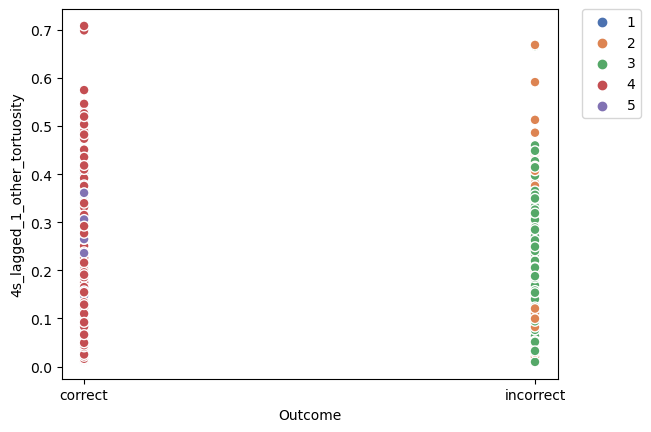

In [3975]:
sns.scatterplot(data=lagged_1_other_tortuosity_4s, x = 'Outcome', y = '4s_lagged_1_other_tortuosity', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3976]:
mean_lagged_1_other_tortuosity_4s = get_mean_performances(lagged_1_other_tortuosity_4s)

   mouse  4s_lagged_1_other_tortuosity         %   Outcome
sa199m2e                      0.121716 38.461538   correct
sa199m2e                      0.166186 38.461538 incorrect
  sa78m5                      0.114407 75.000000   correct
  sa78m5                      0.146552 75.000000 incorrect
 sa325m1                      0.306349 28.571429   correct
 sa325m1                      0.275794 28.571429 incorrect
sa196m1e                      0.148569 56.521739   correct
sa196m1e                      0.185806 56.521739 incorrect
sa199m1e                      0.223054 40.000000   correct
sa199m1e                      0.288106 40.000000 incorrect
 sa325m2                      0.242501 33.333333   correct
 sa325m2                      0.284501 33.333333 incorrect
sa196m3e                      0.191869 33.333333   correct
sa196m3e                      0.125419 33.333333 incorrect
 sa498m2                      0.141385 41.379310   correct
 sa498m2                      0.115204 41.379310 incorre

In [3977]:
mean_lagged_1_other_tortuosity_4s


,mouse,4s_lagged_1_other_tortuosity,%,Outcome
0,sa199m2e,0.121716,38.461538,correct
1,sa199m2e,0.166186,38.461538,incorrect
2,sa78m5,0.114407,75.000000,correct
3,sa78m5,0.146552,75.000000,incorrect
4,sa325m1,0.306349,28.571429,correct
5,sa325m1,0.275794,28.571429,incorrect
6,sa196m1e,0.148569,56.521739,correct
7,sa196m1e,0.185806,56.521739,incorrect
8,sa199m1e,0.223054,40.000000,correct
9,sa199m1e,0.288106,40.000000,incorrect


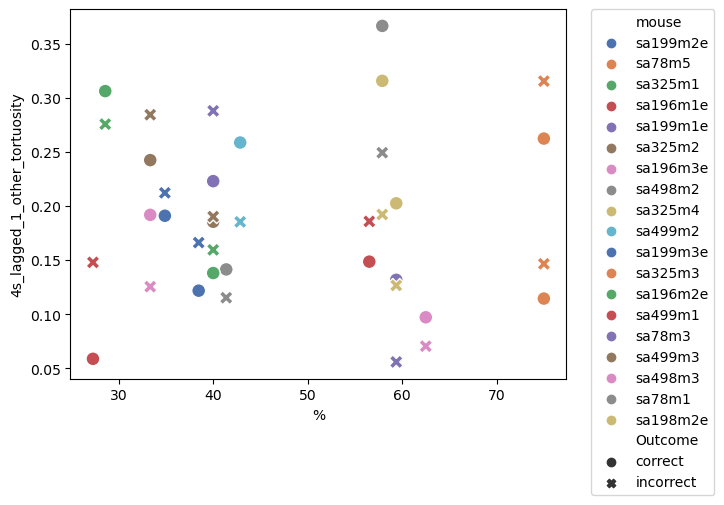

In [3978]:
sns.scatterplot(data=mean_lagged_1_other_tortuosity_4s, x = '%', y = '4s_lagged_1_other_tortuosity', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3979]:
entry_latency_4s = get_performance(df_grouped_scaled_ri, 'Entry Latency', 4)

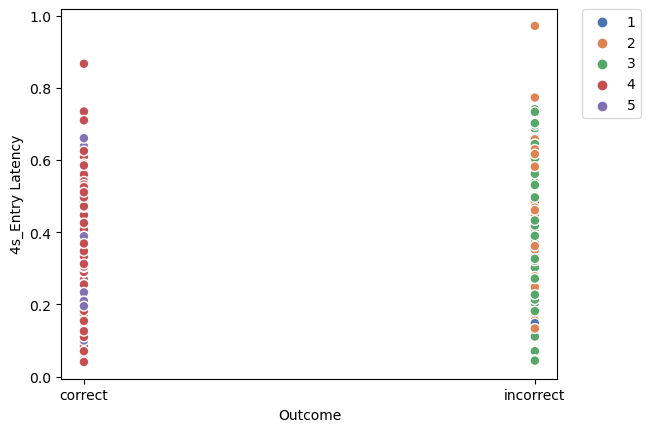

In [3980]:
sns.scatterplot(data=entry_latency_4s, x = 'Outcome', y = '4s_Entry Latency', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3981]:
mean_entry_latency_4s = get_mean_performances(entry_latency_4s)

   mouse  4s_Entry Latency         %   Outcome
sa199m2e          0.435417 38.461538   correct
sa199m2e          0.419596 38.461538 incorrect
  sa78m5          0.276743 75.000000   correct
  sa78m5          0.213941 75.000000 incorrect
 sa325m1          0.187500 28.571429   correct
 sa325m1          0.254938 28.571429 incorrect
sa196m1e          0.364351 56.521739   correct
sa196m1e          0.318817 56.521739 incorrect
sa199m1e          0.381481 40.000000   correct
sa199m1e          0.389300 40.000000 incorrect
 sa325m2          0.332287 33.333333   correct
 sa325m2          0.325746 33.333333 incorrect
sa196m3e          0.290179 33.333333   correct
sa196m3e          0.259859 33.333333 incorrect
 sa498m2          0.314286 41.379310   correct
 sa498m2          0.384314 41.379310 incorrect
 sa325m4          0.386837 57.894737   correct
 sa325m4          0.291016 57.894737 incorrect
 sa499m2          0.410151 42.857143   correct
 sa499m2          0.404835 42.857143 incorrect
sa199m3e     

In [3982]:
mean_entry_latency_4s

,mouse,4s_Entry Latency,%,Outcome
0,sa199m2e,0.435417,38.461538,correct
1,sa199m2e,0.419596,38.461538,incorrect
2,sa78m5,0.276743,75.000000,correct
3,sa78m5,0.213941,75.000000,incorrect
4,sa325m1,0.187500,28.571429,correct
5,sa325m1,0.254938,28.571429,incorrect
6,sa196m1e,0.364351,56.521739,correct
7,sa196m1e,0.318817,56.521739,incorrect
8,sa199m1e,0.381481,40.000000,correct
9,sa199m1e,0.389300,40.000000,incorrect


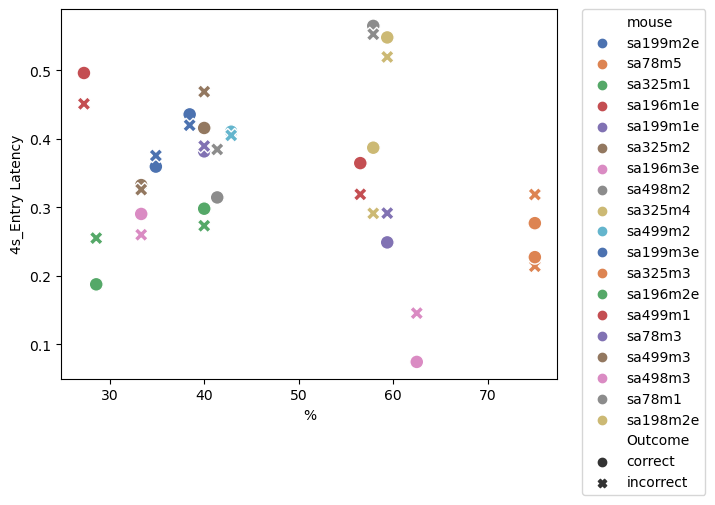

In [3983]:
sns.scatterplot(data=mean_entry_latency_4s, x = '%', y = '4s_Entry Latency', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3984]:
lagged_1_new_cur_coeff_4s = get_performance(df_grouped_scaled_ri, 'New Lagged 1 Cur Coeff', 4)

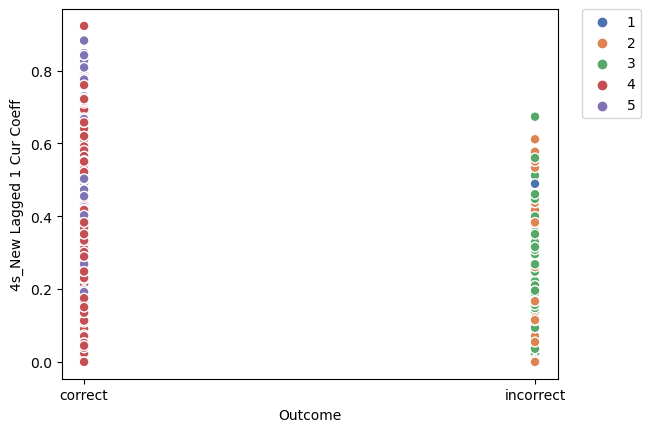

In [3985]:
sns.scatterplot(data=lagged_1_new_cur_coeff_4s, x = 'Outcome', y = '4s_New Lagged 1 Cur Coeff', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3986]:
mean_lagged_1_new_cur_coeff_4s = get_mean_performances(lagged_1_new_cur_coeff_4s)

   mouse  4s_New Lagged 1 Cur Coeff         %   Outcome
sa199m2e                   0.165962 38.461538   correct
sa199m2e                   0.200608 38.461538 incorrect
  sa78m5                   0.334292 75.000000   correct
  sa78m5                   0.306544 75.000000 incorrect
 sa325m1                   0.430170 28.571429   correct
 sa325m1                   0.351886 28.571429 incorrect
sa196m1e                   0.349701 56.521739   correct
sa196m1e                   0.311326 56.521739 incorrect
sa199m1e                   0.358626 40.000000   correct
sa199m1e                   0.272552 40.000000 incorrect
 sa325m2                   0.392321 33.333333   correct
 sa325m2                   0.223129 33.333333 incorrect
sa196m3e                   0.174451 33.333333   correct
sa196m3e                   0.227561 33.333333 incorrect
 sa498m2                   0.314753 41.379310   correct
 sa498m2                   0.265410 41.379310 incorrect
 sa325m4                   0.551721 57.894737   

In [3987]:
mean_lagged_1_new_cur_coeff_4s

,mouse,4s_New Lagged 1 Cur Coeff,%,Outcome
0,sa199m2e,0.165962,38.461538,correct
1,sa199m2e,0.200608,38.461538,incorrect
2,sa78m5,0.334292,75.000000,correct
3,sa78m5,0.306544,75.000000,incorrect
4,sa325m1,0.430170,28.571429,correct
5,sa325m1,0.351886,28.571429,incorrect
6,sa196m1e,0.349701,56.521739,correct
7,sa196m1e,0.311326,56.521739,incorrect
8,sa199m1e,0.358626,40.000000,correct
9,sa199m1e,0.272552,40.000000,incorrect


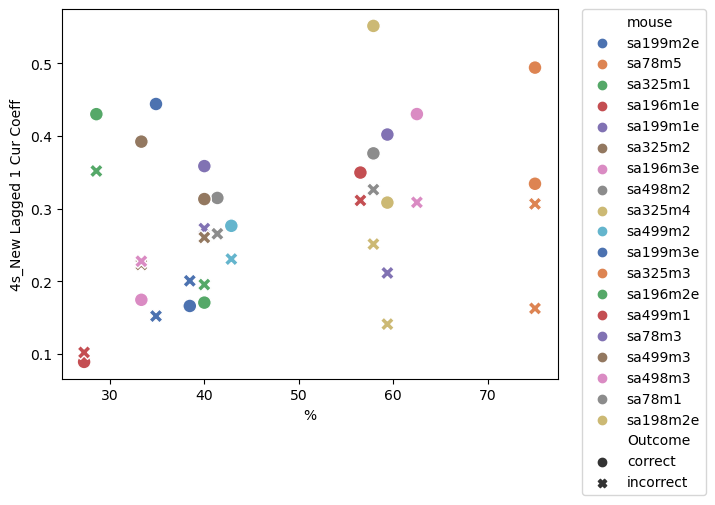

In [3988]:
sns.scatterplot(data=mean_lagged_1_new_cur_coeff_4s, x = '%', y = '4s_New Lagged 1 Cur Coeff', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3989]:
middle_duration_4s = get_performance(df_grouped_scaled_ri, 'Middle Duration', 4)

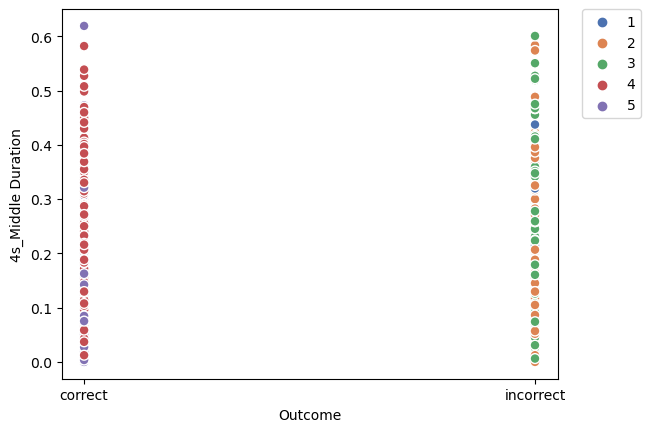

In [3990]:
sns.scatterplot(data=middle_duration_4s, x = 'Outcome', y = '4s_Middle Duration', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3991]:
mean_middle_duration_4s = get_mean_performances(middle_duration_4s)

   mouse  4s_Middle Duration         %   Outcome
sa199m2e            0.258140 38.461538   correct
sa199m2e            0.318072 38.461538 incorrect
  sa78m5            0.173405 75.000000   correct
  sa78m5            0.195418 75.000000 incorrect
 sa325m1            0.269444 28.571429   correct
 sa325m1            0.306111 28.571429 incorrect
sa196m1e            0.266026 56.521739   correct
sa196m1e            0.258333 56.521739 incorrect
sa199m1e            0.207216 40.000000   correct
sa199m1e            0.192635 40.000000 incorrect
 sa325m2            0.121358 33.333333   correct
 sa325m2            0.180229 33.333333 incorrect
sa196m3e            0.252240 33.333333   correct
sa196m3e            0.249293 33.333333 incorrect
 sa498m2            0.061564 41.379310   correct
 sa498m2            0.144069 41.379310 incorrect
 sa325m4            0.159834 57.894737   correct
 sa325m4            0.114924 57.894737 incorrect
 sa499m2            0.221996 42.857143   correct
 sa499m2            

In [3992]:
mean_middle_duration_4s

,mouse,4s_Middle Duration,%,Outcome
0,sa199m2e,0.258140,38.461538,correct
1,sa199m2e,0.318072,38.461538,incorrect
2,sa78m5,0.173405,75.000000,correct
3,sa78m5,0.195418,75.000000,incorrect
4,sa325m1,0.269444,28.571429,correct
5,sa325m1,0.306111,28.571429,incorrect
6,sa196m1e,0.266026,56.521739,correct
7,sa196m1e,0.258333,56.521739,incorrect
8,sa199m1e,0.207216,40.000000,correct
9,sa199m1e,0.192635,40.000000,incorrect


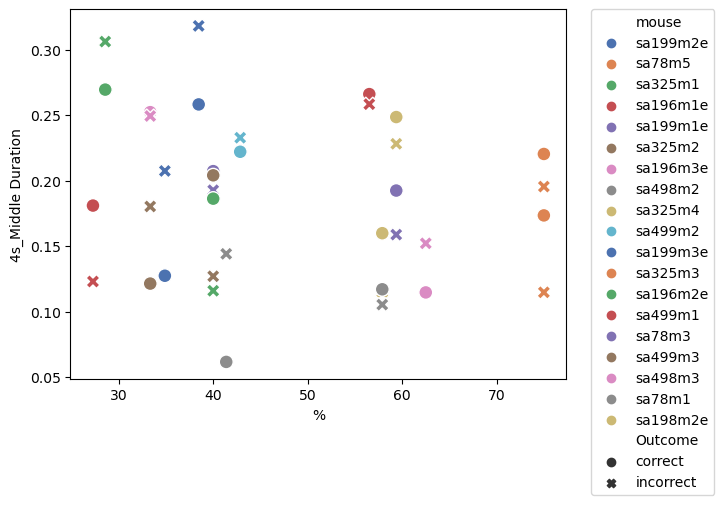

In [3993]:
sns.scatterplot(data=mean_middle_duration_4s, x = '%', y = '4s_Middle Duration', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3994]:
# 5s

In [3995]:
exitmidentry_duration_5s = get_performance(df_grouped_scaled_ri, 'ExitMidEntry Duration', 5)

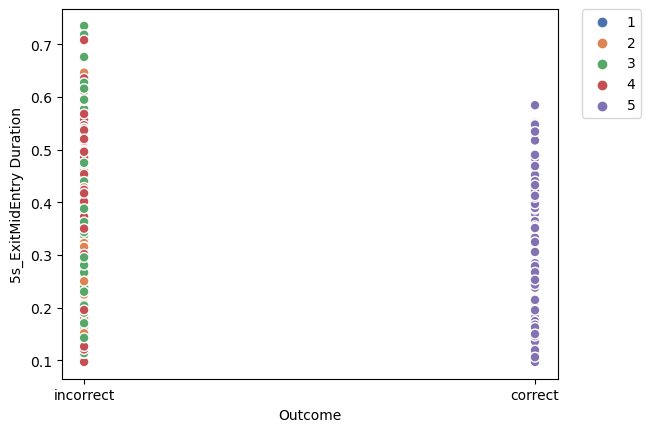

In [3996]:
sns.scatterplot(data=exitmidentry_duration_5s, x = 'Outcome', y = '5s_ExitMidEntry Duration', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [3997]:
mean_exitmidentry_duration_5s = get_mean_performances(exitmidentry_duration_5s)

   mouse  5s_ExitMidEntry Duration         %   Outcome
sa199m2e                  0.439236  3.921569   correct
sa199m2e                  0.495111  3.921569 incorrect
  sa78m5                  0.303135 37.037037   correct
  sa78m5                  0.240165 37.037037 incorrect
 sa325m1                  0.136040  5.000000   correct
 sa325m1                  0.252924  5.000000 incorrect
sa196m1e                  0.489167  9.090909   correct
sa196m1e                  0.491667  9.090909 incorrect
sa199m1e                  0.355000  6.896552   correct
sa199m1e                  0.320432  6.896552 incorrect
 sa325m2                  0.342233 10.000000   correct
 sa325m2                  0.384214 10.000000 incorrect
sa196m3e                  0.419540  7.317073   correct
sa196m3e                  0.397731  7.317073 incorrect
 sa498m2                  0.185185 14.285714   correct
 sa498m2                  0.274981 14.285714 incorrect
 sa325m4                  0.174167  5.555556   correct
 sa325m4  

C:\Users\Josue Regalado\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\Josue Regalado\anaconda3\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


In [3998]:
mean_exitmidentry_duration_5s

,mouse,5s_ExitMidEntry Duration,%,Outcome
0,sa199m2e,0.439236,3.921569,correct
1,sa199m2e,0.495111,3.921569,incorrect
2,sa78m5,0.303135,37.037037,correct
3,sa78m5,0.240165,37.037037,incorrect
4,sa325m1,0.136040,5.000000,correct
5,sa325m1,0.252924,5.000000,incorrect
6,sa196m1e,0.489167,9.090909,correct
7,sa196m1e,0.491667,9.090909,incorrect
8,sa199m1e,0.355000,6.896552,correct
9,sa199m1e,0.320432,6.896552,incorrect


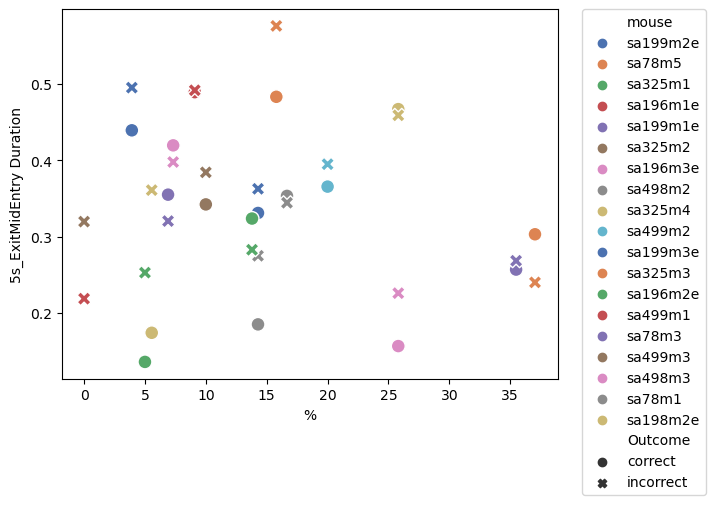

In [3999]:
sns.scatterplot(data=mean_exitmidentry_duration_5s, x = '%', y = '5s_ExitMidEntry Duration', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [4000]:
middle_tortuosity_5s = get_performance(df_grouped_scaled_ri, 'Middle Tortuosity', 5)

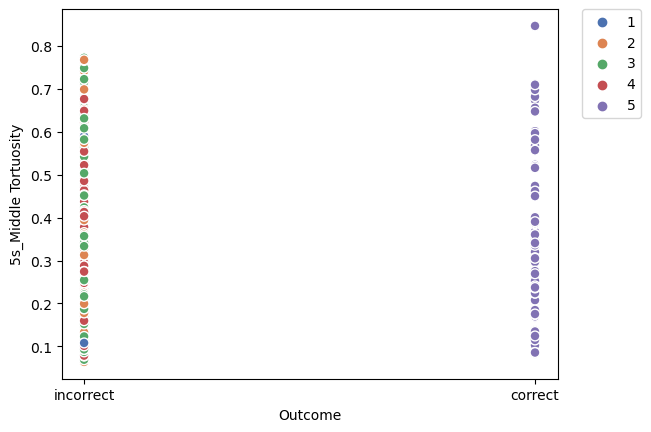

In [4001]:
sns.scatterplot(data=middle_tortuosity_5s, x = 'Outcome', y = '5s_Middle Tortuosity', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [4002]:
mean_middle_tortuosity_5s = get_mean_performances(middle_tortuosity_5s)

   mouse  5s_Middle Tortuosity         %   Outcome
sa199m2e              0.517922  3.921569   correct
sa199m2e              0.570607  3.921569 incorrect
  sa78m5              0.222648 37.037037   correct
  sa78m5              0.181455 37.037037 incorrect
 sa325m1              0.115044  5.000000   correct
 sa325m1              0.189841  5.000000 incorrect
sa196m1e              0.431416  9.090909   correct
sa196m1e              0.477266  9.090909 incorrect
sa199m1e              0.350247  6.896552   correct
sa199m1e              0.357808  6.896552 incorrect
 sa325m2              0.363188 10.000000   correct
 sa325m2              0.407229 10.000000 incorrect
sa196m3e              0.172380  7.317073   correct
sa196m3e              0.206813  7.317073 incorrect
 sa498m2              0.094976 14.285714   correct
 sa498m2              0.127824 14.285714 incorrect
 sa325m4              0.175476  5.555556   correct
 sa325m4              0.301119  5.555556 incorrect
 sa499m2              0.609994 

C:\Users\Josue Regalado\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\Josue Regalado\anaconda3\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


In [4003]:
mean_middle_tortuosity_5s

,mouse,5s_Middle Tortuosity,%,Outcome
0,sa199m2e,0.517922,3.921569,correct
1,sa199m2e,0.570607,3.921569,incorrect
2,sa78m5,0.222648,37.037037,correct
3,sa78m5,0.181455,37.037037,incorrect
4,sa325m1,0.115044,5.000000,correct
5,sa325m1,0.189841,5.000000,incorrect
6,sa196m1e,0.431416,9.090909,correct
7,sa196m1e,0.477266,9.090909,incorrect
8,sa199m1e,0.350247,6.896552,correct
9,sa199m1e,0.357808,6.896552,incorrect


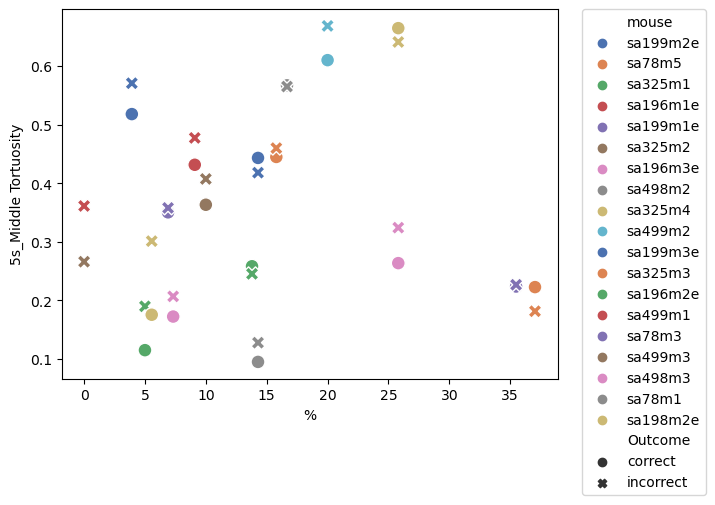

In [4004]:
sns.scatterplot(data=mean_middle_tortuosity_5s, x = '%', y = '5s_Middle Tortuosity', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [4005]:
new_cur_coeff_time_prop_5s = get_performance(df_grouped_scaled_ri, 'New Current Coeff Time Proportional', 5)

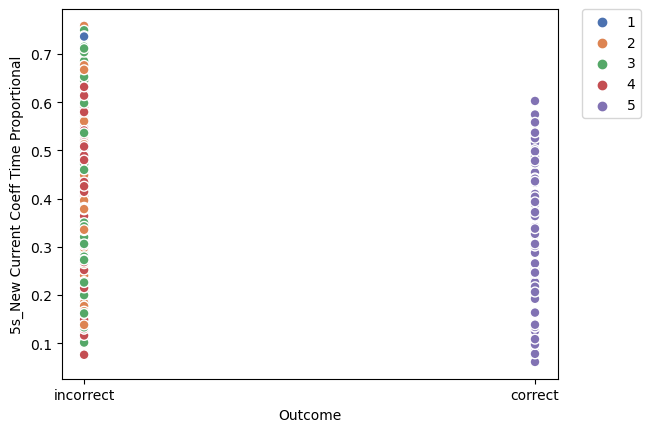

In [4006]:
sns.scatterplot(data=new_cur_coeff_time_prop_5s, x = 'Outcome', y = '5s_New Current Coeff Time Proportional', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [4007]:
mean_new_cur_coeff_time_prop_5s = get_mean_performances(new_cur_coeff_time_prop_5s)

   mouse  5s_New Current Coeff Time Proportional         %   Outcome
sa199m2e                                0.368163  3.921569   correct
sa199m2e                                0.439967  3.921569 incorrect
  sa78m5                                0.313001 37.037037   correct
  sa78m5                                0.232504 37.037037 incorrect
 sa325m1                                0.388225  5.000000   correct
 sa325m1                                0.445640  5.000000 incorrect
sa196m1e                                0.491191  9.090909   correct
sa196m1e                                0.426171  9.090909 incorrect
sa199m1e                                0.472271  6.896552   correct
sa199m1e                                0.436708  6.896552 incorrect
 sa325m2                                0.302125 10.000000   correct
 sa325m2                                0.383484 10.000000 incorrect
sa196m3e                                0.510049  7.317073   correct
sa196m3e                          

C:\Users\Josue Regalado\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\Josue Regalado\anaconda3\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


In [4008]:
mean_new_cur_coeff_time_prop_5s

,mouse,5s_New Current Coeff Time Proportional,%,Outcome
0,sa199m2e,0.368163,3.921569,correct
1,sa199m2e,0.439967,3.921569,incorrect
2,sa78m5,0.313001,37.037037,correct
3,sa78m5,0.232504,37.037037,incorrect
4,sa325m1,0.388225,5.000000,correct
5,sa325m1,0.445640,5.000000,incorrect
6,sa196m1e,0.491191,9.090909,correct
7,sa196m1e,0.426171,9.090909,incorrect
8,sa199m1e,0.472271,6.896552,correct
9,sa199m1e,0.436708,6.896552,incorrect


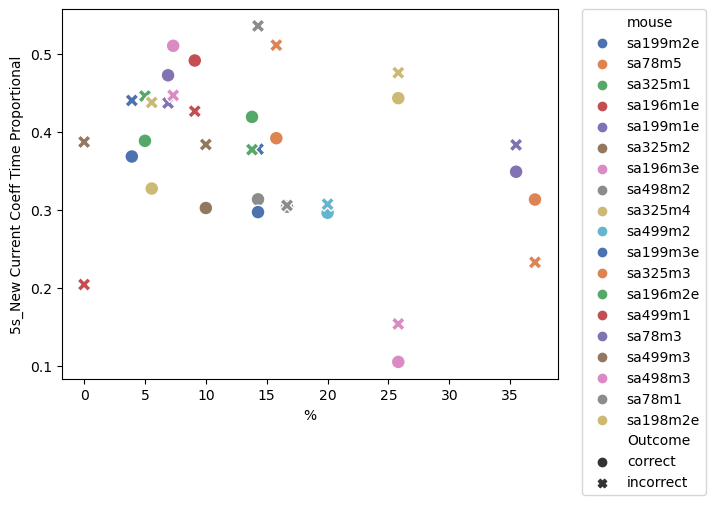

In [4009]:
sns.scatterplot(data=mean_new_cur_coeff_time_prop_5s, x = '%', y = '5s_New Current Coeff Time Proportional', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [4010]:
new_current_coeff_5s = get_performance(df_grouped_scaled_ri, 'New Current Coeff', 5)

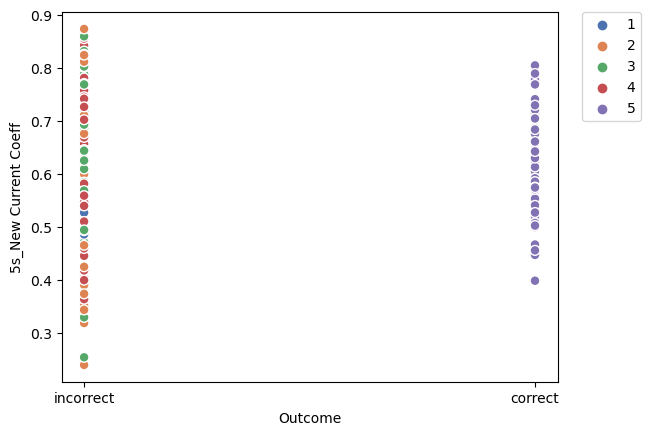

In [4011]:
sns.scatterplot(data=new_current_coeff_5s, x = 'Outcome', y = '5s_New Current Coeff', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [4012]:
mean_new_current_coeff_5s = get_mean_performances(new_current_coeff_5s)

   mouse  5s_New Current Coeff         %   Outcome
sa199m2e              0.577285  3.921569   correct
sa199m2e              0.618832  3.921569 incorrect
  sa78m5              0.665065 37.037037   correct
  sa78m5              0.654071 37.037037 incorrect
 sa325m1              0.646250  5.000000   correct
 sa325m1              0.487823  5.000000 incorrect
sa196m1e              0.666319  9.090909   correct
sa196m1e              0.594380  9.090909 incorrect
sa199m1e              0.671809  6.896552   correct
sa199m1e              0.699988  6.896552 incorrect
 sa325m2              0.603502 10.000000   correct
 sa325m2              0.666085 10.000000 incorrect
sa196m3e              0.611447  7.317073   correct
sa196m3e              0.592262  7.317073 incorrect
 sa498m2              0.540332 14.285714   correct
 sa498m2              0.660366 14.285714 incorrect
 sa325m4              0.768732  5.555556   correct
 sa325m4              0.587498  5.555556 incorrect
 sa499m2              0.666802 

C:\Users\Josue Regalado\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\Josue Regalado\anaconda3\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


In [4013]:
mean_new_current_coeff_5s

,mouse,5s_New Current Coeff,%,Outcome
0,sa199m2e,0.577285,3.921569,correct
1,sa199m2e,0.618832,3.921569,incorrect
2,sa78m5,0.665065,37.037037,correct
3,sa78m5,0.654071,37.037037,incorrect
4,sa325m1,0.646250,5.000000,correct
5,sa325m1,0.487823,5.000000,incorrect
6,sa196m1e,0.666319,9.090909,correct
7,sa196m1e,0.594380,9.090909,incorrect
8,sa199m1e,0.671809,6.896552,correct
9,sa199m1e,0.699988,6.896552,incorrect


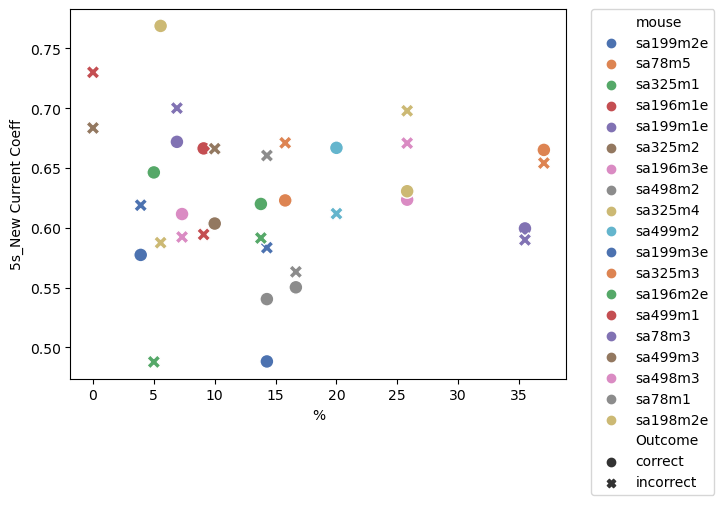

In [4014]:
sns.scatterplot(data=mean_new_current_coeff_5s, x = '%', y = '5s_New Current Coeff', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [4015]:
current_coeff_5s = get_performance(df_grouped_scaled_ri, 'Current Coeff', 5)

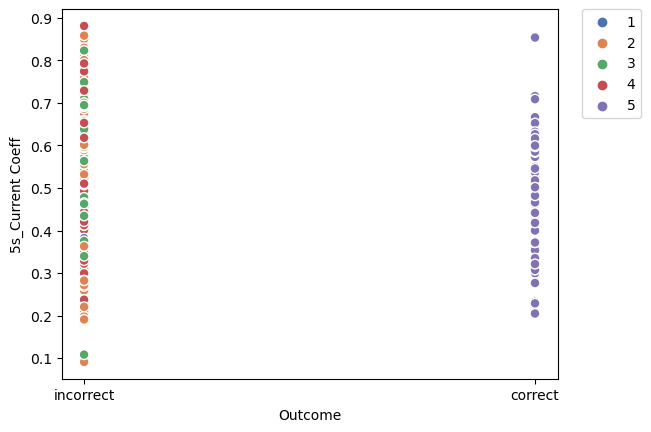

In [4016]:
sns.scatterplot(data=current_coeff_5s, x = 'Outcome', y = '5s_Current Coeff', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [4017]:
mean_current_coeff_5s = get_mean_performances(current_coeff_5s)

   mouse  5s_Current Coeff         %   Outcome
sa199m2e          0.486061  3.921569   correct
sa199m2e          0.518715  3.921569 incorrect
  sa78m5          0.530060 37.037037   correct
  sa78m5          0.558976 37.037037 incorrect
 sa325m1          0.626486  5.000000   correct
 sa325m1          0.436197  5.000000 incorrect
sa196m1e          0.592484  9.090909   correct
sa196m1e          0.479721  9.090909 incorrect
sa199m1e          0.532974  6.896552   correct
sa199m1e          0.558603  6.896552 incorrect
 sa325m2          0.524514 10.000000   correct
 sa325m2          0.590585 10.000000 incorrect
sa196m3e          0.553475  7.317073   correct
sa196m3e          0.495365  7.317073 incorrect
 sa498m2          0.456106 14.285714   correct
 sa498m2          0.596394 14.285714 incorrect
 sa325m4          0.616403  5.555556   correct
 sa325m4          0.505461  5.555556 incorrect
 sa499m2          0.568552 20.000000   correct
 sa499m2          0.493059 20.000000 incorrect
sa199m3e     

C:\Users\Josue Regalado\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\Josue Regalado\anaconda3\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


In [4018]:
mean_current_coeff_5s

,mouse,5s_Current Coeff,%,Outcome
0,sa199m2e,0.486061,3.921569,correct
1,sa199m2e,0.518715,3.921569,incorrect
2,sa78m5,0.530060,37.037037,correct
3,sa78m5,0.558976,37.037037,incorrect
4,sa325m1,0.626486,5.000000,correct
5,sa325m1,0.436197,5.000000,incorrect
6,sa196m1e,0.592484,9.090909,correct
7,sa196m1e,0.479721,9.090909,incorrect
8,sa199m1e,0.532974,6.896552,correct
9,sa199m1e,0.558603,6.896552,incorrect


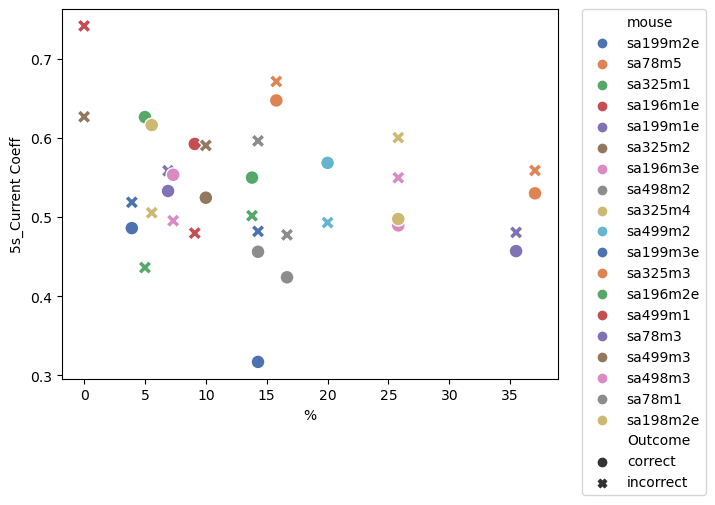

In [4019]:
sns.scatterplot(data=mean_current_coeff_5s, x = '%', y = '5s_Current Coeff', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [4020]:
cur_coeff_time_prop_5s = get_performance(df_grouped_scaled_ri, 'Current Coeff Time Proportional', 5)

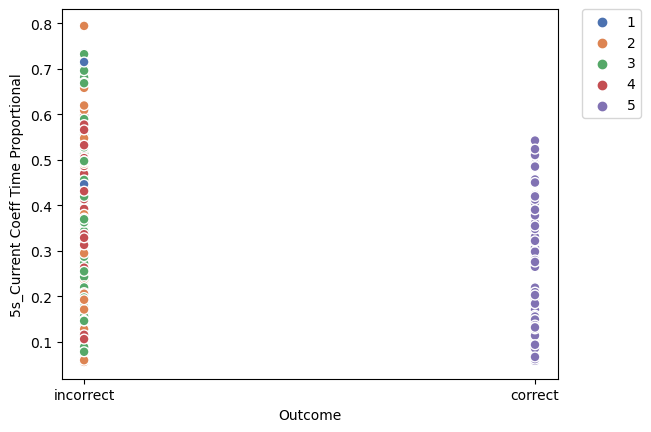

In [4021]:
sns.scatterplot(data=cur_coeff_time_prop_5s, x = 'Outcome', y = '5s_Current Coeff Time Proportional', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [4022]:
mean_cur_coeff_time_prop_5s = get_mean_performances(cur_coeff_time_prop_5s)

   mouse  5s_Current Coeff Time Proportional         %   Outcome
sa199m2e                            0.183732  3.921569   correct
sa199m2e                            0.267365  3.921569 incorrect
  sa78m5                            0.240803 37.037037   correct
  sa78m5                            0.185892 37.037037 incorrect
 sa325m1                            0.523491  5.000000   correct
 sa325m1                            0.515812  5.000000 incorrect
sa196m1e                            0.415651  9.090909   correct
sa196m1e                            0.304681  9.090909 incorrect
sa199m1e                            0.416511  6.896552   correct
sa199m1e                            0.385341  6.896552 incorrect
 sa325m2                            0.206109 10.000000   correct
 sa325m2                            0.290544 10.000000 incorrect
sa196m3e                            0.425881  7.317073   correct
sa196m3e                            0.362251  7.317073 incorrect
 sa498m2                 

C:\Users\Josue Regalado\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\Josue Regalado\anaconda3\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


In [4023]:
mean_cur_coeff_time_prop_5s

,mouse,5s_Current Coeff Time Proportional,%,Outcome
0,sa199m2e,0.183732,3.921569,correct
1,sa199m2e,0.267365,3.921569,incorrect
2,sa78m5,0.240803,37.037037,correct
3,sa78m5,0.185892,37.037037,incorrect
4,sa325m1,0.523491,5.000000,correct
5,sa325m1,0.515812,5.000000,incorrect
6,sa196m1e,0.415651,9.090909,correct
7,sa196m1e,0.304681,9.090909,incorrect
8,sa199m1e,0.416511,6.896552,correct
9,sa199m1e,0.385341,6.896552,incorrect


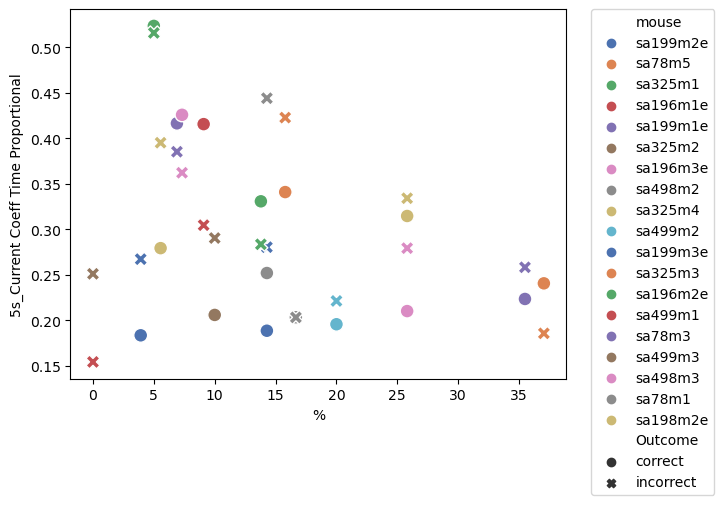

In [4024]:
sns.scatterplot(data=mean_cur_coeff_time_prop_5s, x = '%', y = '5s_Current Coeff Time Proportional', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [4025]:
lagged_1_duration_5s = get_performance(df_grouped_scaled_ri, 'lagged_1_duration', 5)

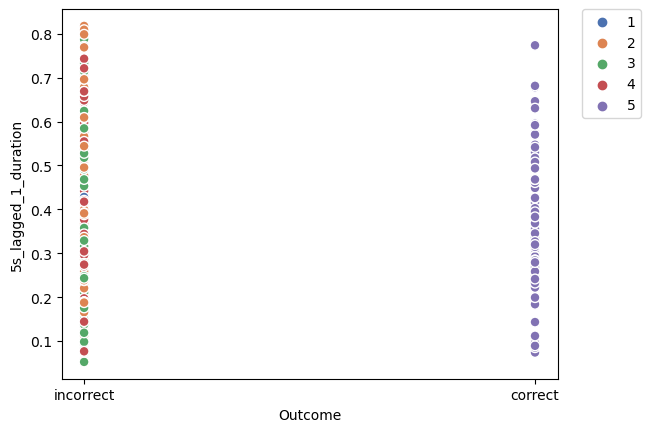

In [4026]:
sns.scatterplot(data=lagged_1_duration_5s, x = 'Outcome', y = '5s_lagged_1_duration', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [4027]:
mean_lagged_1_duration_5s = get_mean_performances(lagged_1_duration_5s)

   mouse  5s_lagged_1_duration         %   Outcome
sa199m2e              0.280080  3.921569   correct
sa199m2e              0.307828  3.921569 incorrect
  sa78m5              0.331723 37.037037   correct
  sa78m5              0.323752 37.037037 incorrect
 sa325m1              0.493339  5.000000   correct
 sa325m1              0.341322  5.000000 incorrect
sa196m1e              0.226011  9.090909   correct
sa196m1e              0.212847  9.090909 incorrect
sa199m1e              0.245833  6.896552   correct
sa199m1e              0.284979  6.896552 incorrect
 sa325m2              0.182654 10.000000   correct
 sa325m2              0.223355 10.000000 incorrect
sa196m3e              0.448671  7.317073   correct
sa196m3e              0.333715  7.317073 incorrect
 sa498m2              0.557212 14.285714   correct
 sa498m2              0.388922 14.285714 incorrect
 sa325m4              0.089161  5.555556   correct
 sa325m4              0.189657  5.555556 incorrect
 sa499m2              0.354347 

C:\Users\Josue Regalado\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\Josue Regalado\anaconda3\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


In [4028]:
mean_lagged_1_duration_5s
#mean_lagged_1_duration_5s.to_csv('mean_arm_dur_past_2.csv', sep='\t', index=False)


,mouse,5s_lagged_1_duration,%,Outcome
0,sa199m2e,0.280080,3.921569,correct
1,sa199m2e,0.307828,3.921569,incorrect
2,sa78m5,0.331723,37.037037,correct
3,sa78m5,0.323752,37.037037,incorrect
4,sa325m1,0.493339,5.000000,correct
5,sa325m1,0.341322,5.000000,incorrect
6,sa196m1e,0.226011,9.090909,correct
7,sa196m1e,0.212847,9.090909,incorrect
8,sa199m1e,0.245833,6.896552,correct
9,sa199m1e,0.284979,6.896552,incorrect


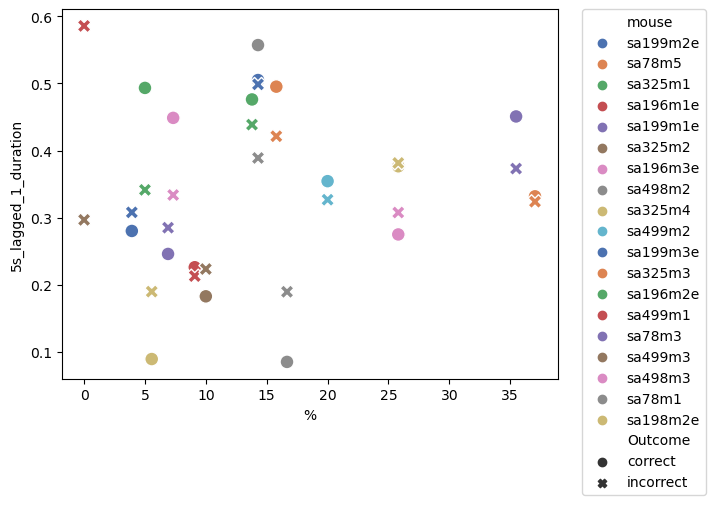

In [4029]:
sns.scatterplot(data=mean_lagged_1_duration_5s, x = '%', y = '5s_lagged_1_duration', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [4030]:
lagged_1_nose_time_to_max_dist_5s = get_performance(df_grouped_scaled_ri, 'lagged_1_nose_time_to_max_dist', 5)

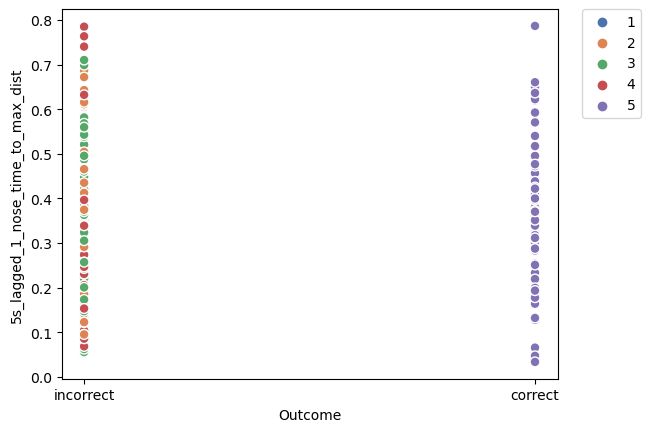

In [4031]:
sns.scatterplot(data=lagged_1_nose_time_to_max_dist_5s, x = 'Outcome', y = '5s_lagged_1_nose_time_to_max_dist', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [4032]:
mean_lagged_1_nose_time_to_max_dist_5s = get_mean_performances(lagged_1_nose_time_to_max_dist_5s)

   mouse  5s_lagged_1_nose_time_to_max_dist         %   Outcome
sa199m2e                           0.218277  3.921569   correct
sa199m2e                           0.256358  3.921569 incorrect
  sa78m5                           0.532870 37.037037   correct
  sa78m5                           0.457448 37.037037 incorrect
 sa325m1                           0.438272  5.000000   correct
 sa325m1                           0.269845  5.000000 incorrect
sa196m1e                           0.215625  9.090909   correct
sa196m1e                           0.125489  9.090909 incorrect
sa199m1e                           0.366987  6.896552   correct
sa199m1e                           0.429487  6.896552 incorrect
 sa325m2                           0.259958 10.000000   correct
 sa325m2                           0.277370 10.000000 incorrect
sa196m3e                           0.370265  7.317073   correct
sa196m3e                           0.273500  7.317073 incorrect
 sa498m2                           0.330

C:\Users\Josue Regalado\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\Josue Regalado\anaconda3\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


In [4033]:
mean_lagged_1_nose_time_to_max_dist_5s

#mean_lagged_1_nose_time_to_max_dist_5s.to_csv('mean_time_to_max_past_2.csv', sep='\t', index=False)

,mouse,5s_lagged_1_nose_time_to_max_dist,%,Outcome
0,sa199m2e,0.218277,3.921569,correct
1,sa199m2e,0.256358,3.921569,incorrect
2,sa78m5,0.532870,37.037037,correct
3,sa78m5,0.457448,37.037037,incorrect
4,sa325m1,0.438272,5.000000,correct
5,sa325m1,0.269845,5.000000,incorrect
6,sa196m1e,0.215625,9.090909,correct
7,sa196m1e,0.125489,9.090909,incorrect
8,sa199m1e,0.366987,6.896552,correct
9,sa199m1e,0.429487,6.896552,incorrect


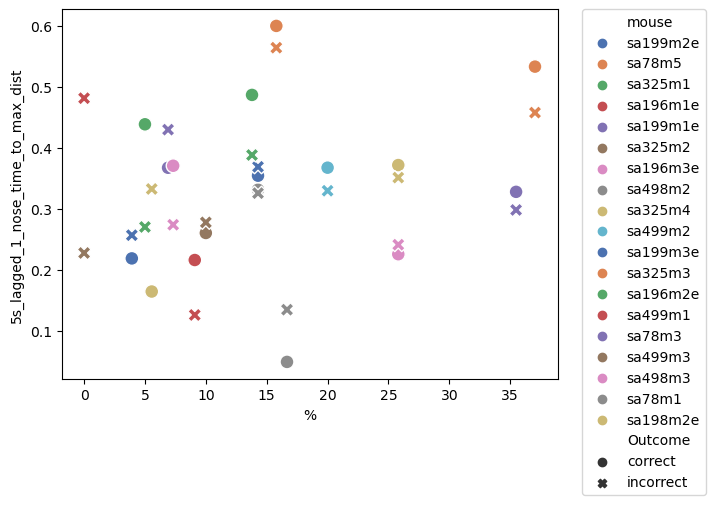

In [4034]:
sns.scatterplot(data=mean_lagged_1_nose_time_to_max_dist_5s, x = '%', y = '5s_lagged_1_nose_time_to_max_dist', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [4035]:
lagged_1_arm_nose_mov_5s = get_performance(df_grouped_scaled_ri, 'lagged_1_arm_nose_mov', 5)

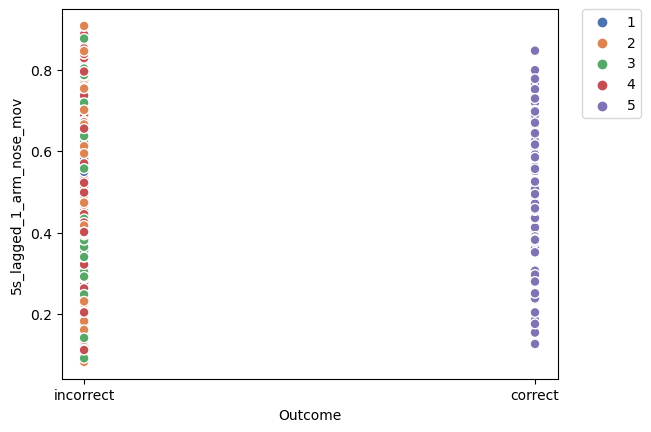

In [4036]:
sns.scatterplot(data=lagged_1_arm_nose_mov_5s, x = 'Outcome', y = '5s_lagged_1_arm_nose_mov', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [4037]:
mean_lagged_1_arm_nose_mov_5s = get_mean_performances(lagged_1_arm_nose_mov_5s)

   mouse  5s_lagged_1_arm_nose_mov         %   Outcome
sa199m2e                  0.499204  3.921569   correct
sa199m2e                  0.567130  3.921569 incorrect
  sa78m5                  0.402030 37.037037   correct
  sa78m5                  0.378774 37.037037 incorrect
 sa325m1                  0.643885  5.000000   correct
 sa325m1                  0.470374  5.000000 incorrect
sa196m1e                  0.399574  9.090909   correct
sa196m1e                  0.351154  9.090909 incorrect
sa199m1e                  0.273821  6.896552   correct
sa199m1e                  0.309264  6.896552 incorrect
 sa325m2                  0.383753 10.000000   correct
 sa325m2                  0.389362 10.000000 incorrect
sa196m3e                  0.644478  7.317073   correct
sa196m3e                  0.574372  7.317073 incorrect
 sa498m2                  0.635515 14.285714   correct
 sa498m2                  0.511061 14.285714 incorrect
 sa325m4                  0.279484  5.555556   correct
 sa325m4  

C:\Users\Josue Regalado\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\Josue Regalado\anaconda3\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


In [4038]:
mean_lagged_1_arm_nose_mov_5s

#mean_lagged_1_arm_nose_mov_5s.to_csv('dist_in_arm_past_2_nose.csv', sep='\t', index=False)

,mouse,5s_lagged_1_arm_nose_mov,%,Outcome
0,sa199m2e,0.499204,3.921569,correct
1,sa199m2e,0.567130,3.921569,incorrect
2,sa78m5,0.402030,37.037037,correct
3,sa78m5,0.378774,37.037037,incorrect
4,sa325m1,0.643885,5.000000,correct
5,sa325m1,0.470374,5.000000,incorrect
6,sa196m1e,0.399574,9.090909,correct
7,sa196m1e,0.351154,9.090909,incorrect
8,sa199m1e,0.273821,6.896552,correct
9,sa199m1e,0.309264,6.896552,incorrect


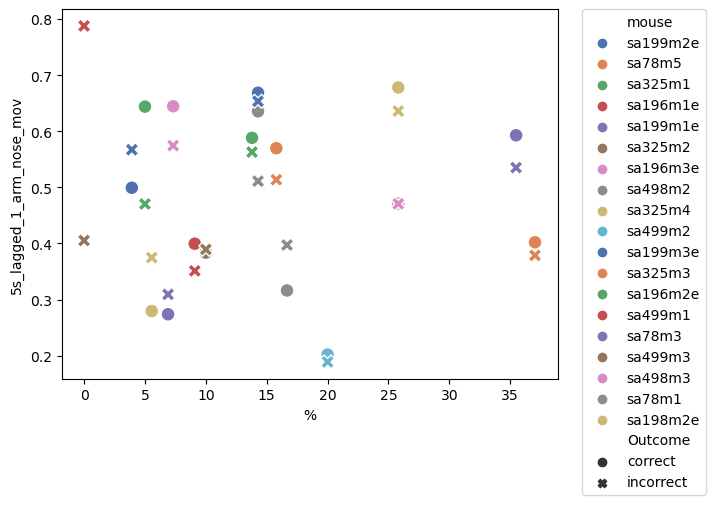

In [4039]:
sns.scatterplot(data=mean_lagged_1_arm_nose_mov_5s, x = '%', y = '5s_lagged_1_arm_nose_mov', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [4040]:
lagged_1_arm_nose_vel_5s = get_performance(df_grouped_scaled_ri, 'lagged_1_arm_nose_vel', 5)

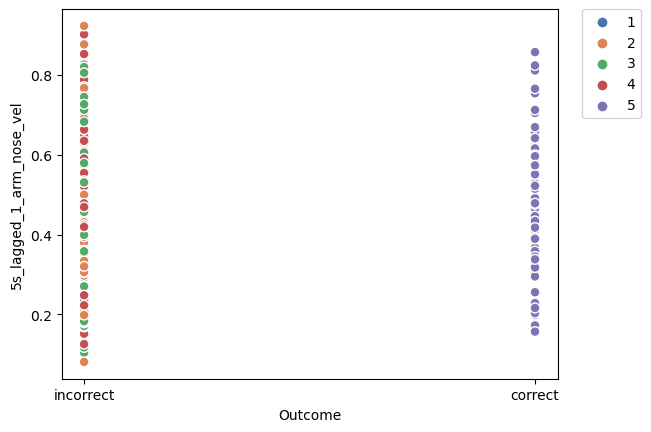

In [4041]:
sns.scatterplot(data=lagged_1_arm_nose_vel_5s, x = 'Outcome', y = '5s_lagged_1_arm_nose_vel', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [4042]:
mean_lagged_1_arm_nose_vel_5s = get_mean_performances(lagged_1_arm_nose_vel_5s)

   mouse  5s_lagged_1_arm_nose_vel         %   Outcome
sa199m2e                  0.514946  3.921569   correct
sa199m2e                  0.551359  3.921569 incorrect
  sa78m5                  0.430750 37.037037   correct
  sa78m5                  0.400838 37.037037 incorrect
 sa325m1                  0.345360  5.000000   correct
 sa325m1                  0.474506  5.000000 incorrect
sa196m1e                  0.556757  9.090909   correct
sa196m1e                  0.477860  9.090909 incorrect
sa199m1e                  0.468988  6.896552   correct
sa199m1e                  0.434274  6.896552 incorrect
 sa325m2                  0.632034 10.000000   correct
 sa325m2                  0.544276 10.000000 incorrect
sa196m3e                  0.439001  7.317073   correct
sa196m3e                  0.574639  7.317073 incorrect
 sa498m2                  0.231574 14.285714   correct
 sa498m2                  0.328826 14.285714 incorrect
 sa325m4                  0.573902  5.555556   correct
 sa325m4  

C:\Users\Josue Regalado\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\Josue Regalado\anaconda3\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


In [4043]:
mean_lagged_1_arm_nose_vel_5s
#mean_lagged_1_arm_nose_vel_5s.to_csv('mean_vel_past_2_nose.csv', sep='\t', index=False)

,mouse,5s_lagged_1_arm_nose_vel,%,Outcome
0,sa199m2e,0.514946,3.921569,correct
1,sa199m2e,0.551359,3.921569,incorrect
2,sa78m5,0.430750,37.037037,correct
3,sa78m5,0.400838,37.037037,incorrect
4,sa325m1,0.345360,5.000000,correct
5,sa325m1,0.474506,5.000000,incorrect
6,sa196m1e,0.556757,9.090909,correct
7,sa196m1e,0.477860,9.090909,incorrect
8,sa199m1e,0.468988,6.896552,correct
9,sa199m1e,0.434274,6.896552,incorrect


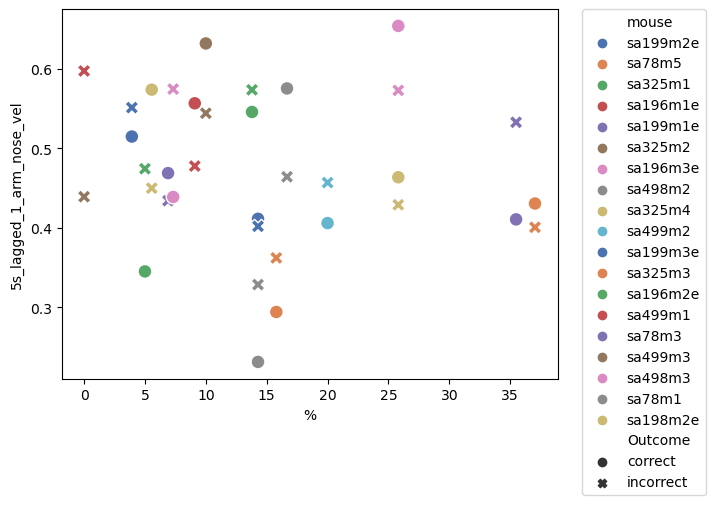

In [4044]:
sns.scatterplot(data=mean_lagged_1_arm_nose_vel_5s, x = '%', y = '5s_lagged_1_arm_nose_vel', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [4045]:
lagged_1_arm_tail_mov_5s = get_performance(df_grouped_scaled_ri, 'lagged_1_arm_tail_mov', 5)

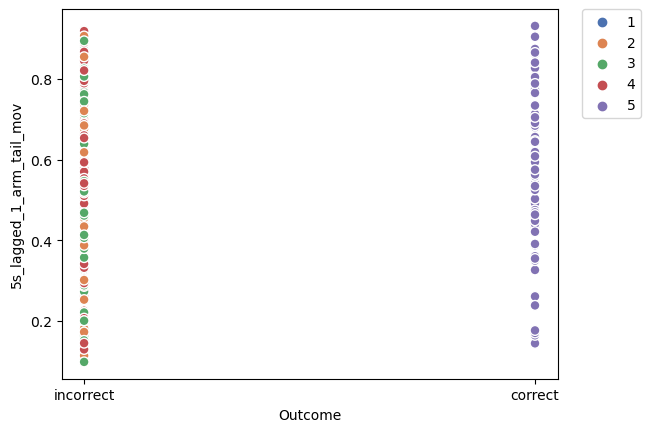

In [4046]:
sns.scatterplot(data=lagged_1_arm_tail_mov_5s, x = 'Outcome', y = '5s_lagged_1_arm_tail_mov', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [4047]:
mean_lagged_1_arm_tail_mov_5s = get_mean_performances(lagged_1_arm_tail_mov_5s)

   mouse  5s_lagged_1_arm_tail_mov         %   Outcome
sa199m2e                  0.561471  3.921569   correct
sa199m2e                  0.612884  3.921569 incorrect
  sa78m5                  0.439460 37.037037   correct
  sa78m5                  0.414466 37.037037 incorrect
 sa325m1                  0.691075  5.000000   correct
 sa325m1                  0.508762  5.000000 incorrect
sa196m1e                  0.434236  9.090909   correct
sa196m1e                  0.380654  9.090909 incorrect
sa199m1e                  0.252093  6.896552   correct
sa199m1e                  0.461123  6.896552 incorrect
 sa325m2                  0.490603 10.000000   correct
 sa325m2                  0.479669 10.000000 incorrect
sa196m3e                  0.694382  7.317073   correct
sa196m3e                  0.625404  7.317073 incorrect
 sa498m2                  0.645657 14.285714   correct
 sa498m2                  0.500569 14.285714 incorrect
 sa325m4                  0.420950  5.555556   correct
 sa325m4  

C:\Users\Josue Regalado\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\Josue Regalado\anaconda3\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


In [4048]:
mean_lagged_1_arm_tail_mov_5s
#mean_lagged_1_arm_tail_mov_5s.to_csv('dist_in_arm_past_2_tail.csv', sep='\t', index=False)

,mouse,5s_lagged_1_arm_tail_mov,%,Outcome
0,sa199m2e,0.561471,3.921569,correct
1,sa199m2e,0.612884,3.921569,incorrect
2,sa78m5,0.439460,37.037037,correct
3,sa78m5,0.414466,37.037037,incorrect
4,sa325m1,0.691075,5.000000,correct
5,sa325m1,0.508762,5.000000,incorrect
6,sa196m1e,0.434236,9.090909,correct
7,sa196m1e,0.380654,9.090909,incorrect
8,sa199m1e,0.252093,6.896552,correct
9,sa199m1e,0.461123,6.896552,incorrect


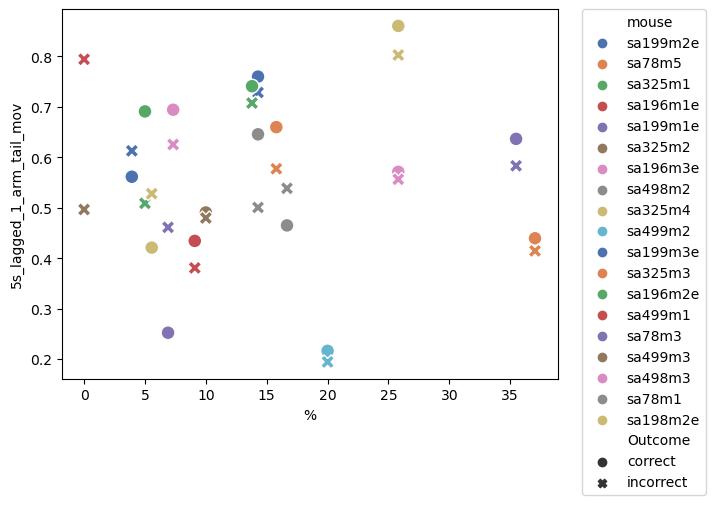

In [4049]:
sns.scatterplot(data=mean_lagged_1_arm_tail_mov_5s, x = '%', y = '5s_lagged_1_arm_tail_mov', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [4050]:
lagged_1_arm_tail_vel_5s = get_performance(df_grouped_scaled_ri, 'lagged_1_arm_tail_vel', 5)

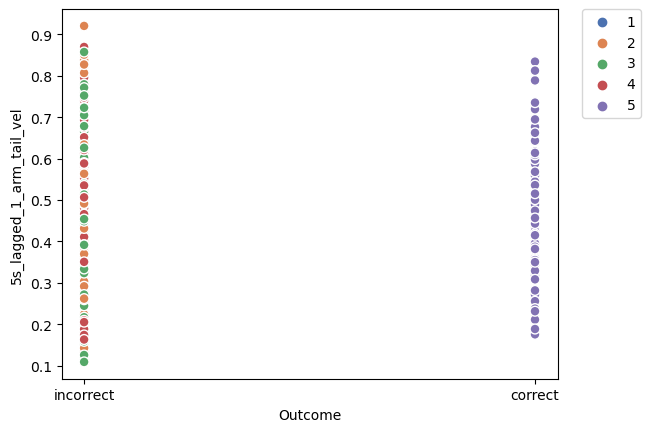

In [4051]:
sns.scatterplot(data=lagged_1_arm_tail_vel_5s, x = 'Outcome', y = '5s_lagged_1_arm_tail_vel', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [4052]:
mean_lagged_1_arm_tail_vel_5s = get_mean_performances(lagged_1_arm_tail_vel_5s)

   mouse  5s_lagged_1_arm_tail_vel         %   Outcome
sa199m2e                  0.577459  3.921569   correct
sa199m2e                  0.602171  3.921569 incorrect
  sa78m5                  0.493056 37.037037   correct
  sa78m5                  0.454269 37.037037 incorrect
 sa325m1                  0.349895  5.000000   correct
 sa325m1                  0.450889  5.000000 incorrect
sa196m1e                  0.487452  9.090909   correct
sa196m1e                  0.419266  9.090909 incorrect
sa199m1e                  0.451651  6.896552   correct
sa199m1e                  0.477369  6.896552 incorrect
 sa325m2                  0.651732 10.000000   correct
 sa325m2                  0.559868 10.000000 incorrect
sa196m3e                  0.448894  7.317073   correct
sa196m3e                  0.532327  7.317073 incorrect
 sa498m2                  0.438754 14.285714   correct
 sa498m2                  0.504896 14.285714 incorrect
 sa325m4                  0.535933  5.555556   correct
 sa325m4  

C:\Users\Josue Regalado\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\Josue Regalado\anaconda3\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


In [4053]:
mean_lagged_1_arm_tail_vel_5s
#mean_lagged_1_arm_tail_vel_5s.to_csv('mean_vel_past_2_tail.csv', sep='\t', index=False)

,mouse,5s_lagged_1_arm_tail_vel,%,Outcome
0,sa199m2e,0.577459,3.921569,correct
1,sa199m2e,0.602171,3.921569,incorrect
2,sa78m5,0.493056,37.037037,correct
3,sa78m5,0.454269,37.037037,incorrect
4,sa325m1,0.349895,5.000000,correct
5,sa325m1,0.450889,5.000000,incorrect
6,sa196m1e,0.487452,9.090909,correct
7,sa196m1e,0.419266,9.090909,incorrect
8,sa199m1e,0.451651,6.896552,correct
9,sa199m1e,0.477369,6.896552,incorrect


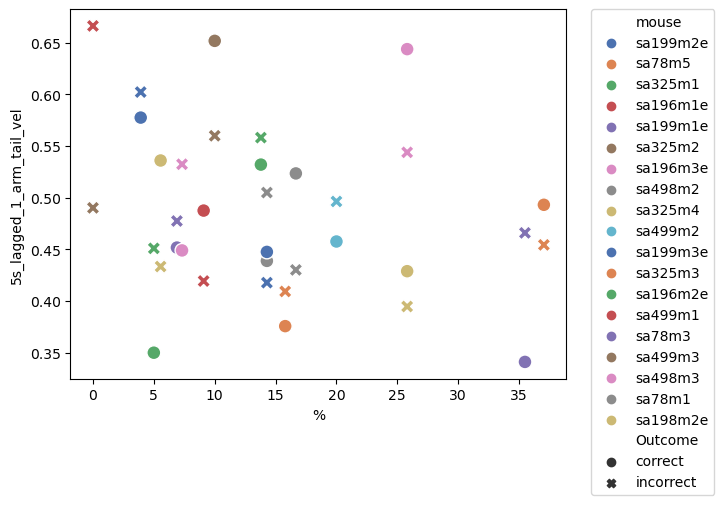

In [4054]:
sns.scatterplot(data=mean_lagged_1_arm_tail_vel_5s, x = '%', y = '5s_lagged_1_arm_tail_vel', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [4055]:
lagged_1_entry_tortuosity_5s = get_performance(df_grouped_scaled_ri, 'lagged_1_entry_tortuosity', 5)

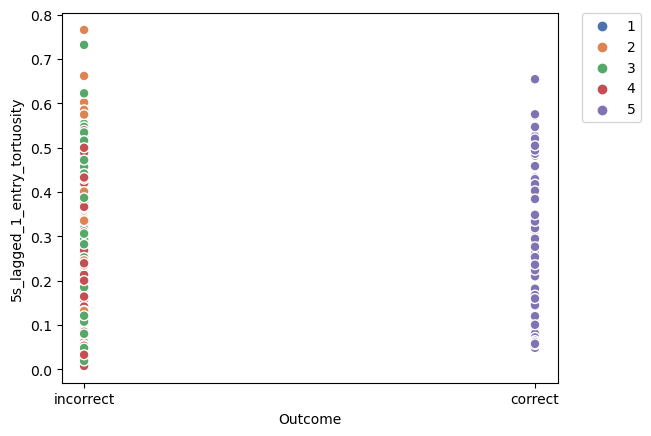

In [4056]:
sns.scatterplot(data=lagged_1_entry_tortuosity_5s, x = 'Outcome', y = '5s_lagged_1_entry_tortuosity', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [4057]:
mean_lagged_1_entry_tortuosity_5s = get_mean_performances(lagged_1_entry_tortuosity_5s)

   mouse  5s_lagged_1_entry_tortuosity         %   Outcome
sa199m2e                      0.128115  3.921569   correct
sa199m2e                      0.168278  3.921569 incorrect
  sa78m5                      0.257477 37.037037   correct
  sa78m5                      0.222126 37.037037 incorrect
 sa325m1                      0.383933  5.000000   correct
 sa325m1                      0.181315  5.000000 incorrect
sa196m1e                      0.188695  9.090909   correct
sa196m1e                      0.102400  9.090909 incorrect
sa199m1e                      0.261908  6.896552   correct
sa199m1e                      0.320638  6.896552 incorrect
 sa325m2                      0.297220 10.000000   correct
 sa325m2                      0.305643 10.000000 incorrect
sa196m3e                      0.396919  7.317073   correct
sa196m3e                      0.277115  7.317073 incorrect
 sa498m2                      0.072949 14.285714   correct
 sa498m2                      0.170502 14.285714 incorre

C:\Users\Josue Regalado\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\Josue Regalado\anaconda3\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


In [4058]:
mean_lagged_1_entry_tortuosity_5s

,mouse,5s_lagged_1_entry_tortuosity,%,Outcome
0,sa199m2e,0.128115,3.921569,correct
1,sa199m2e,0.168278,3.921569,incorrect
2,sa78m5,0.257477,37.037037,correct
3,sa78m5,0.222126,37.037037,incorrect
4,sa325m1,0.383933,5.000000,correct
5,sa325m1,0.181315,5.000000,incorrect
6,sa196m1e,0.188695,9.090909,correct
7,sa196m1e,0.102400,9.090909,incorrect
8,sa199m1e,0.261908,6.896552,correct
9,sa199m1e,0.320638,6.896552,incorrect


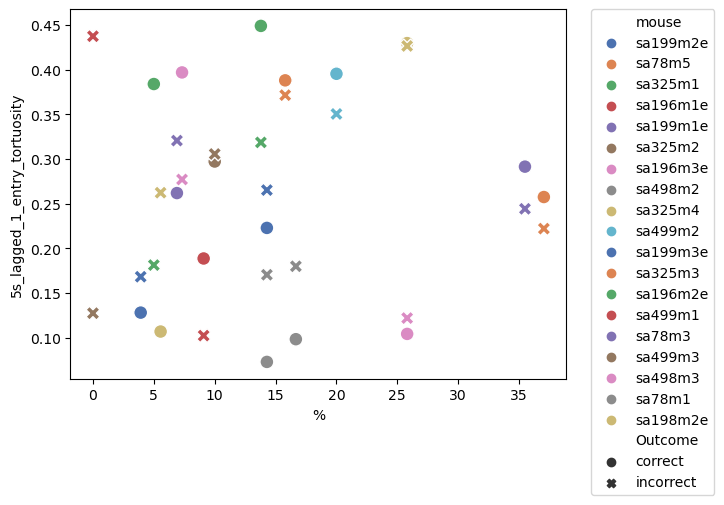

In [4059]:
sns.scatterplot(data=mean_lagged_1_entry_tortuosity_5s, x = '%', y = '5s_lagged_1_entry_tortuosity', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [4060]:
lagged_1_exit_tortuosity_5s = get_performance(df_grouped_scaled_ri, 'lagged_1_exit_tortuosity', 5)

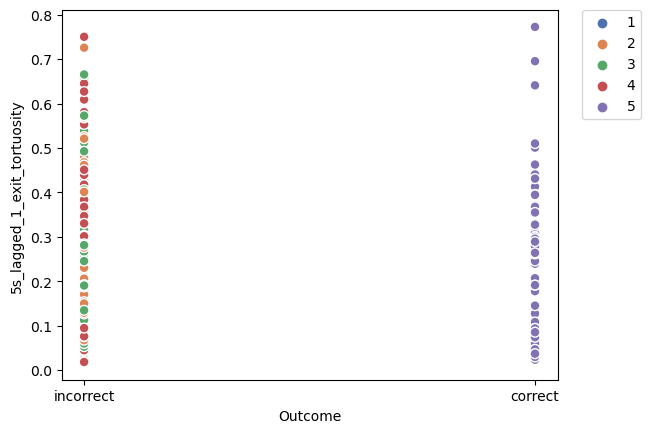

In [4061]:
sns.scatterplot(data=lagged_1_exit_tortuosity_5s, x = 'Outcome', y = '5s_lagged_1_exit_tortuosity', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [4062]:
mean_lagged_1_exit_tortuosity_5s = get_mean_performances(lagged_1_exit_tortuosity_5s)

   mouse  5s_lagged_1_exit_tortuosity         %   Outcome
sa199m2e                     0.090886  3.921569   correct
sa199m2e                     0.140129  3.921569 incorrect
  sa78m5                     0.115699 37.037037   correct
  sa78m5                     0.112484 37.037037 incorrect
 sa325m1                     0.327577  5.000000   correct
 sa325m1                     0.320238  5.000000 incorrect
sa196m1e                     0.082977  9.090909   correct
sa196m1e                     0.147812  9.090909 incorrect
sa199m1e                     0.275853  6.896552   correct
sa199m1e                     0.196613  6.896552 incorrect
 sa325m2                     0.117346 10.000000   correct
 sa325m2                     0.162679 10.000000 incorrect
sa196m3e                     0.195103  7.317073   correct
sa196m3e                     0.180250  7.317073 incorrect
 sa498m2                     0.575176 14.285714   correct
 sa498m2                     0.330193 14.285714 incorrect
 sa325m4      

C:\Users\Josue Regalado\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\Josue Regalado\anaconda3\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


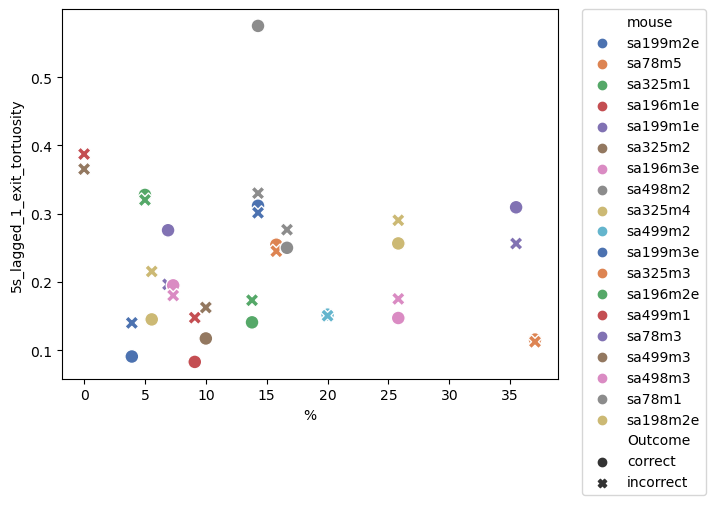

In [4063]:
sns.scatterplot(data=mean_lagged_1_exit_tortuosity_5s, x = '%', y = '5s_lagged_1_exit_tortuosity', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [4064]:
lagged_1_other_tortuosity_5s = get_performance(df_grouped_scaled_ri, 'lagged_1_other_tortuosity', 5)

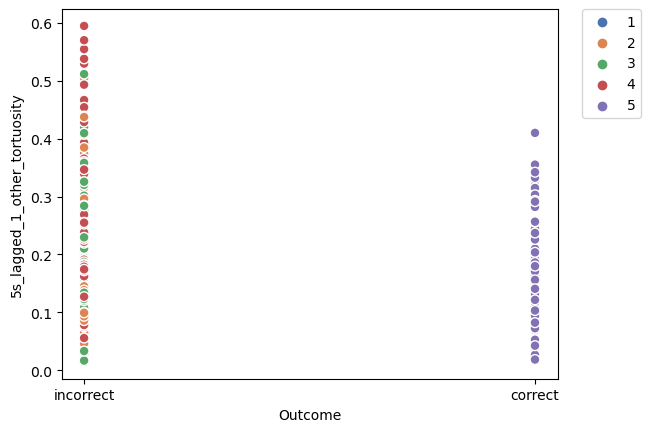

In [4065]:
sns.scatterplot(data=lagged_1_other_tortuosity_5s, x = 'Outcome', y = '5s_lagged_1_other_tortuosity', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [4066]:
mean_lagged_1_other_tortuosity_5s = get_mean_performances(lagged_1_other_tortuosity_5s)

   mouse  5s_lagged_1_other_tortuosity         %   Outcome
sa199m2e                      0.108926  3.921569   correct
sa199m2e                      0.152057  3.921569 incorrect
  sa78m5                      0.102059 37.037037   correct
  sa78m5                      0.130141 37.037037 incorrect
 sa325m1                      0.282141  5.000000   correct
 sa325m1                      0.272767  5.000000 incorrect
sa196m1e                      0.245964  9.090909   correct
sa196m1e                      0.157156  9.090909 incorrect
sa199m1e                      0.171526  6.896552   correct
sa199m1e                      0.270358  6.896552 incorrect
 sa325m2                      0.147436 10.000000   correct
 sa325m2                      0.278773 10.000000 incorrect
sa196m3e                      0.185130  7.317073   correct
sa196m3e                      0.146942  7.317073 incorrect
 sa498m2                      0.134034 14.285714   correct
 sa498m2                      0.128942 14.285714 incorre

C:\Users\Josue Regalado\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\Josue Regalado\anaconda3\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


In [4067]:
mean_lagged_1_other_tortuosity_5s


,mouse,5s_lagged_1_other_tortuosity,%,Outcome
0,sa199m2e,0.108926,3.921569,correct
1,sa199m2e,0.152057,3.921569,incorrect
2,sa78m5,0.102059,37.037037,correct
3,sa78m5,0.130141,37.037037,incorrect
4,sa325m1,0.282141,5.000000,correct
5,sa325m1,0.272767,5.000000,incorrect
6,sa196m1e,0.245964,9.090909,correct
7,sa196m1e,0.157156,9.090909,incorrect
8,sa199m1e,0.171526,6.896552,correct
9,sa199m1e,0.270358,6.896552,incorrect


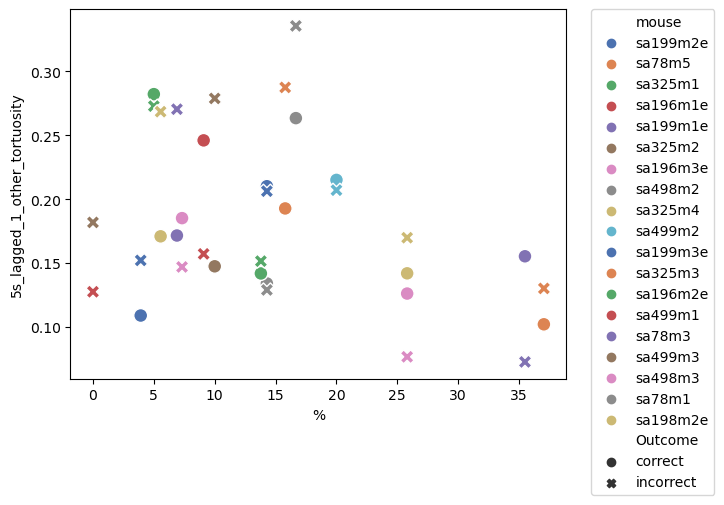

In [4068]:
sns.scatterplot(data=mean_lagged_1_other_tortuosity_5s, x = '%', y = '5s_lagged_1_other_tortuosity', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [4069]:
entry_latency_5s = get_performance(df_grouped_scaled_ri, 'Entry Latency', 5)

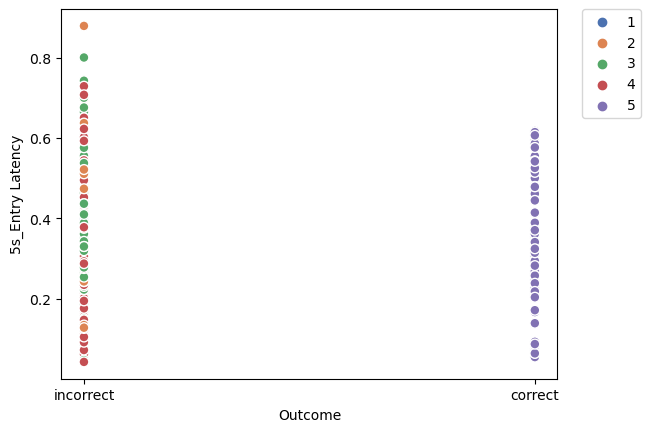

In [4070]:
sns.scatterplot(data=entry_latency_5s, x = 'Outcome', y = '5s_Entry Latency', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [4071]:
mean_entry_latency_5s = get_mean_performances(entry_latency_5s)

   mouse  5s_Entry Latency         %   Outcome
sa199m2e          0.437500  3.921569   correct
sa199m2e          0.423310  3.921569 incorrect
  sa78m5          0.314130 37.037037   correct
  sa78m5          0.231245 37.037037 incorrect
 sa325m1          0.138889  5.000000   correct
 sa325m1          0.244700  5.000000 incorrect
sa196m1e          0.306452  9.090909   correct
sa196m1e          0.343548  9.090909 incorrect
sa199m1e          0.402778  6.896552   correct
sa199m1e          0.378395  6.896552 incorrect
 sa325m2          0.317308 10.000000   correct
 sa325m2          0.331349 10.000000 incorrect
sa196m3e          0.294271  7.317073   correct
sa196m3e          0.269223  7.317073 incorrect
 sa498m2          0.254464 14.285714   correct
 sa498m2          0.373958 14.285714 incorrect
 sa325m4          0.238281  5.555556   correct
 sa325m4          0.357537  5.555556 incorrect
 sa499m2          0.460648 20.000000   correct
 sa499m2          0.400752 20.000000 incorrect
sa199m3e     

C:\Users\Josue Regalado\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\Josue Regalado\anaconda3\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


In [4072]:
mean_entry_latency_5s

,mouse,5s_Entry Latency,%,Outcome
0,sa199m2e,0.437500,3.921569,correct
1,sa199m2e,0.423310,3.921569,incorrect
2,sa78m5,0.314130,37.037037,correct
3,sa78m5,0.231245,37.037037,incorrect
4,sa325m1,0.138889,5.000000,correct
5,sa325m1,0.244700,5.000000,incorrect
6,sa196m1e,0.306452,9.090909,correct
7,sa196m1e,0.343548,9.090909,incorrect
8,sa199m1e,0.402778,6.896552,correct
9,sa199m1e,0.378395,6.896552,incorrect


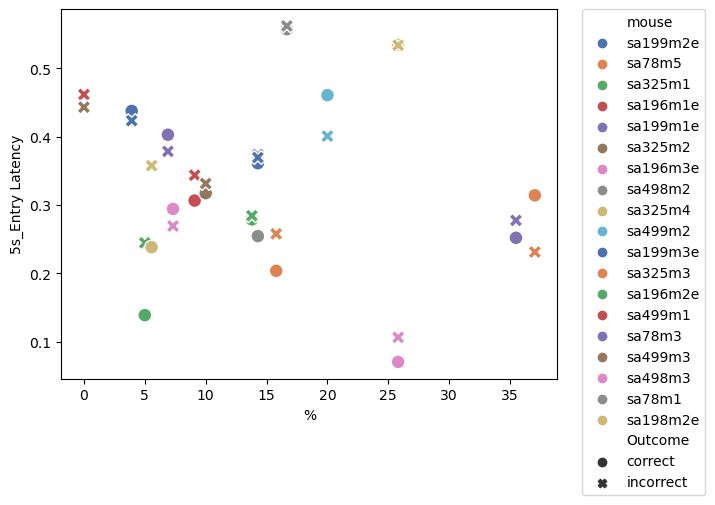

In [4073]:
sns.scatterplot(data=mean_entry_latency_5s, x = '%', y = '5s_Entry Latency', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [4074]:
lagged_1_new_cur_coeff_5s = get_performance(df_grouped_scaled_ri, 'New Lagged 1 Cur Coeff', 5)

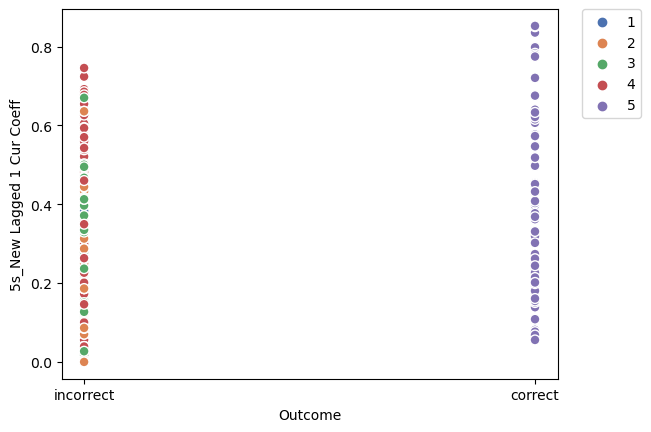

In [4075]:
sns.scatterplot(data=lagged_1_new_cur_coeff_5s, x = 'Outcome', y = '5s_New Lagged 1 Cur Coeff', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [4076]:
mean_lagged_1_new_cur_coeff_5s = get_mean_performances(lagged_1_new_cur_coeff_5s)

   mouse  5s_New Lagged 1 Cur Coeff         %   Outcome
sa199m2e                   0.165483  3.921569   correct
sa199m2e                   0.182666  3.921569 incorrect
  sa78m5                   0.367842 37.037037   correct
  sa78m5                   0.307024 37.037037 incorrect
 sa325m1                   0.497606  5.000000   correct
 sa325m1                   0.362723  5.000000 incorrect
sa196m1e                   0.212810  9.090909   correct
sa196m1e                   0.346429  9.090909 incorrect
sa199m1e                   0.325813  6.896552   correct
sa199m1e                   0.302851  6.896552 incorrect
 sa325m2                   0.428319 10.000000   correct
 sa325m2                   0.256715 10.000000 incorrect
sa196m3e                   0.110427  7.317073   correct
sa196m3e                   0.218532  7.317073 incorrect
 sa498m2                   0.594771 14.285714   correct
 sa498m2                   0.241649 14.285714 incorrect
 sa325m4                   0.198590  5.555556   

C:\Users\Josue Regalado\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\Josue Regalado\anaconda3\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


In [4077]:
mean_lagged_1_new_cur_coeff_5s

,mouse,5s_New Lagged 1 Cur Coeff,%,Outcome
0,sa199m2e,0.165483,3.921569,correct
1,sa199m2e,0.182666,3.921569,incorrect
2,sa78m5,0.367842,37.037037,correct
3,sa78m5,0.307024,37.037037,incorrect
4,sa325m1,0.497606,5.000000,correct
5,sa325m1,0.362723,5.000000,incorrect
6,sa196m1e,0.212810,9.090909,correct
7,sa196m1e,0.346429,9.090909,incorrect
8,sa199m1e,0.325813,6.896552,correct
9,sa199m1e,0.302851,6.896552,incorrect


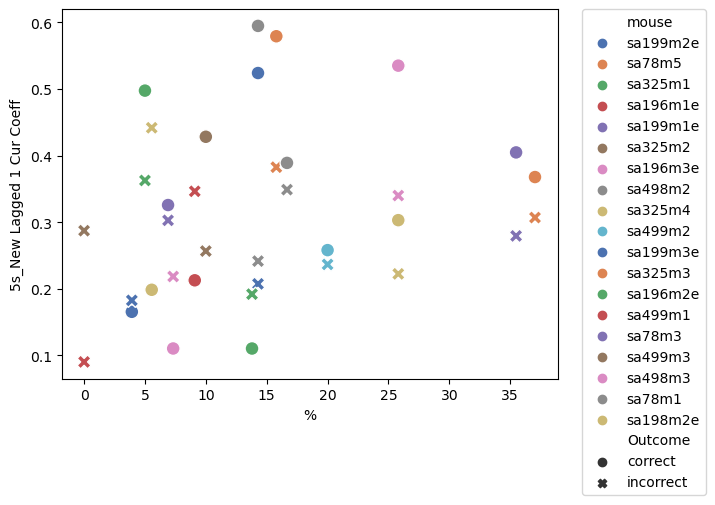

In [4078]:
sns.scatterplot(data=mean_lagged_1_new_cur_coeff_5s, x = '%', y = '5s_New Lagged 1 Cur Coeff', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [4079]:
middle_duration_5s = get_performance(df_grouped_scaled_ri, 'Middle Duration', 5)

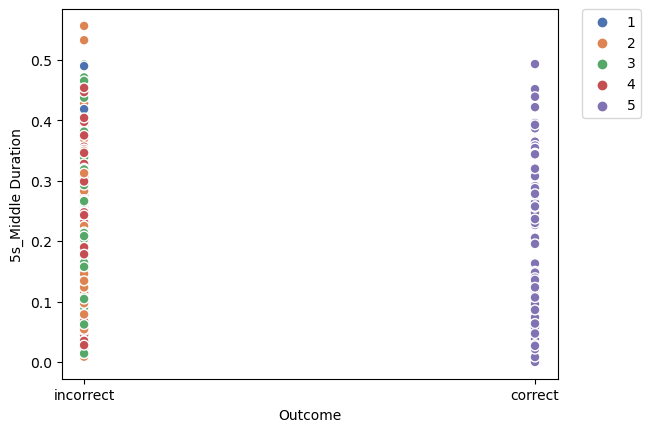

In [4080]:
sns.scatterplot(data=middle_duration_5s, x = 'Outcome', y = '5s_Middle Duration', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [4081]:
mean_middle_duration_5s = get_mean_performances(middle_duration_5s)

   mouse  5s_Middle Duration         %   Outcome
sa199m2e            0.194767  3.921569   correct
sa199m2e            0.301376  3.921569 incorrect
  sa78m5            0.207193 37.037037   correct
  sa78m5            0.162042 37.037037 incorrect
 sa325m1            0.343750  5.000000   correct
 sa325m1            0.299671  5.000000 incorrect
sa196m1e            0.314236  9.090909   correct
sa196m1e            0.256424  9.090909 incorrect
sa199m1e            0.218391  6.896552   correct
sa199m1e            0.194338  6.896552 incorrect
 sa325m2            0.118671 10.000000   correct
 sa325m2            0.170827 10.000000 incorrect
sa196m3e            0.263201  7.317073   correct
sa196m3e            0.246548  7.317073 incorrect
 sa498m2            0.035683 14.285714   correct
 sa498m2            0.124187 14.285714 incorrect
 sa325m4            0.063725  5.555556   correct
 sa325m4            0.149942  5.555556 incorrect
 sa499m2            0.201220 20.000000   correct
 sa499m2            

C:\Users\Josue Regalado\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\Josue Regalado\anaconda3\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


In [4082]:
mean_middle_duration_5s

,mouse,5s_Middle Duration,%,Outcome
0,sa199m2e,0.194767,3.921569,correct
1,sa199m2e,0.301376,3.921569,incorrect
2,sa78m5,0.207193,37.037037,correct
3,sa78m5,0.162042,37.037037,incorrect
4,sa325m1,0.343750,5.000000,correct
5,sa325m1,0.299671,5.000000,incorrect
6,sa196m1e,0.314236,9.090909,correct
7,sa196m1e,0.256424,9.090909,incorrect
8,sa199m1e,0.218391,6.896552,correct
9,sa199m1e,0.194338,6.896552,incorrect


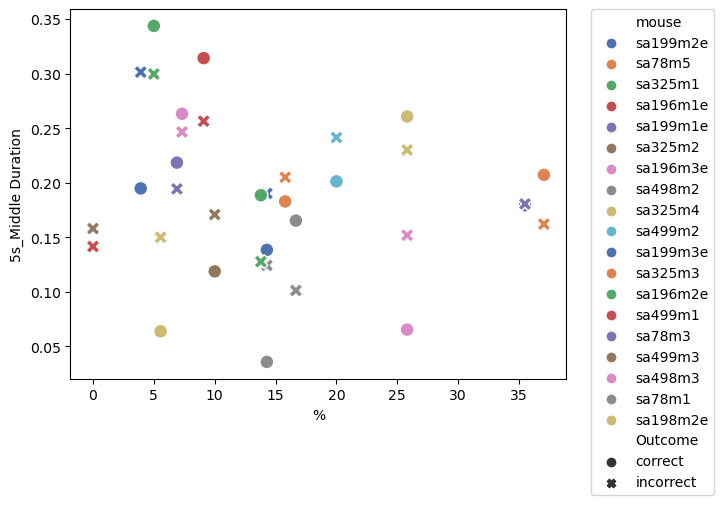

In [4083]:
sns.scatterplot(data=mean_middle_duration_5s, x = '%', y = '5s_Middle Duration', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [4084]:
df_grouped_scaled_ri['Choice Output'] = df_grouped_scaled_ri['Choice Output'].astype(str)

In [4085]:
df_grouped_scaled_ri = df_grouped_scaled_ri.iloc[:,1:]

In [4086]:
x_1= df_grouped_scaled_ri.drop(columns = ['Choice Output', 'Duration', 'Exit Latency', 
        'Nose Max Distance', 'Nose Time to Max Dist', 'Tail Base Max Distance', 'Tail Base Time to Max Dist', 'Entry Tortuosity', 'Exit Tortuosity',
        'Other Tortuosity', 'Arm Nose Movement', 'Arm Nose Velocity', 'Arm Tail Movement', 'Arm Tail Velocity',       
        'lagged_1_lagged_1_cur_coeff',
       'lagged_2_lagged_1_cur_coeff', 'lagged_3_lagged_1_cur_coeff',
       'lagged_4_lagged_1_cur_coeff',
       'lagged_1_lagged_2_cur_coeff', 'lagged_2_lagged_2_cur_coeff',
       'lagged_3_lagged_2_cur_coeff', 'lagged_4_lagged_2_cur_coeff',
       'lagged_1_lagged_3_cur_coeff',
       'lagged_2_lagged_3_cur_coeff', 'lagged_3_lagged_3_cur_coeff',
       'lagged_4_lagged_3_cur_coeff', 
       'lagged_1_lagged_4_cur_coeff', 'lagged_2_lagged_4_cur_coeff',
       'lagged_3_lagged_4_cur_coeff', 'lagged_4_lagged_4_cur_coeff',
       
       
       'lagged_1_lagged_1_cur_coeff_time_prop',
       'lagged_2_lagged_1_cur_coeff_time_prop',
       'lagged_3_lagged_1_cur_coeff_time_prop',
       'lagged_4_lagged_1_cur_coeff_time_prop',
       
       'lagged_1_lagged_2_cur_coeff_time_prop',
       'lagged_2_lagged_2_cur_coeff_time_prop',
       'lagged_3_lagged_2_cur_coeff_time_prop',
       'lagged_4_lagged_2_cur_coeff_time_prop',
       
       'lagged_1_lagged_3_cur_coeff_time_prop',
       'lagged_2_lagged_3_cur_coeff_time_prop',
       'lagged_3_lagged_3_cur_coeff_time_prop',
       'lagged_4_lagged_3_cur_coeff_time_prop',
       
       'lagged_1_lagged_4_cur_coeff_time_prop',
       'lagged_2_lagged_4_cur_coeff_time_prop',
       'lagged_3_lagged_4_cur_coeff_time_prop',
       'lagged_4_lagged_4_cur_coeff_time_prop',
                                                                                                             
                                                                                                             
        'lagged_1_lagged_1_cur_coeff_time_prop',
       'lagged_2_lagged_1_cur_coeff_time_prop','lagged_3_lagged_1_cur_coeff_time_prop','lagged_4_lagged_1_cur_coeff_time_prop',
       'lagged_1_lagged_2_cur_coeff_time_prop','lagged_2_lagged_2_cur_coeff_time_prop','lagged_3_lagged_2_cur_coeff_time_prop',
       'lagged_4_lagged_2_cur_coeff_time_prop','lagged_1_lagged_3_cur_coeff_time_prop','lagged_2_lagged_3_cur_coeff_time_prop',
       'lagged_3_lagged_3_cur_coeff_time_prop','lagged_4_lagged_3_cur_coeff_time_prop','lagged_1_lagged_4_cur_coeff_time_prop',
       'lagged_2_lagged_4_cur_coeff_time_prop','lagged_3_lagged_4_cur_coeff_time_prop','lagged_4_lagged_4_cur_coeff_time_prop', 
        'Turn', 'lagged_1_turn_ago', 'lagged_2_turn_ago', 'lagged_3_turn_ago', 'lagged_4_turn_ago', 
        
                                                                                                               
        'lagged_1_choice_ago', 'lagged_2_choice_ago', 'lagged_3_choice_ago',
       'lagged_4_choice_ago',
        'lagged_1_new_lagged_1_cur_coeff',
        'lagged_2_new_lagged_1_cur_coeff', 
        'lagged_3_new_lagged_1_cur_coeff','lagged_4_new_lagged_1_cur_coeff','lagged_1_new_lagged_2_cur_coeff', 'lagged_2_new_lagged_2_cur_coeff', 
        'lagged_3_new_lagged_2_cur_coeff', 'lagged_4_new_lagged_2_cur_coeff','lagged_1_new_lagged_3_cur_coeff','lagged_2_new_lagged_3_cur_coeff', 
        'lagged_3_new_lagged_3_cur_coeff','lagged_4_new_lagged_3_cur_coeff','lagged_1_new_lagged_4_cur_coeff', 'lagged_2_new_lagged_4_cur_coeff',
        'lagged_3_new_lagged_4_cur_coeff', 'lagged_4_new_lagged_4_cur_coeff','lagged_1_new_lagged_1_cur_coeff_time_prop',
       'lagged_2_new_lagged_1_cur_coeff_time_prop','lagged_3_new_lagged_1_cur_coeff_time_prop','lagged_4_new_lagged_1_cur_coeff_time_prop',
       'lagged_1_new_lagged_2_cur_coeff_time_prop','lagged_2_new_lagged_2_cur_coeff_time_prop','lagged_3_new_lagged_2_cur_coeff_time_prop',
       'lagged_4_new_lagged_2_cur_coeff_time_prop','lagged_1_new_lagged_3_cur_coeff_time_prop','lagged_2_new_lagged_3_cur_coeff_time_prop',
       'lagged_3_new_lagged_3_cur_coeff_time_prop','lagged_4_new_lagged_3_cur_coeff_time_prop','lagged_1_new_lagged_4_cur_coeff_time_prop',
       'lagged_2_new_lagged_4_cur_coeff_time_prop','lagged_3_new_lagged_4_cur_coeff_time_prop','lagged_4_new_lagged_4_cur_coeff_time_prop',
        'Exit Latency Nose Movement', 'Exit Latency Nose Velocity', 'Exit Latency Tail Movement', 'Exit Latency Tail Velocity',
        
                                                                                  
   
        'Lagged 4 Cur Coeff', 
        'New Lagged 4 Cur Coeff',                                          
                                               
         'Lagged 4 Cur Coeff Time Proportional',
          'New Lagged 4 Cur Coeff Time Proportional',                                            
       'Lagged 2 Cur Coeff',  'New Lagged 2 Cur Coeff', 'Lagged 2 Cur Coeff Time Proportional', 'New Lagged 2 Cur Coeff Time Proportional',                                            
       'Lagged 3 Cur Coeff','New Lagged 3 Cur Coeff','Lagged 3 Cur Coeff Time Proportional', 'New Lagged 3 Cur Coeff Time Proportional',                                                
        'Lagged 1 Cur Coeff','New Lagged 1 Cur Coeff','Lagged 1 Cur Coeff Time Proportional', 'New Lagged 1 Cur Coeff Time Proportional', 'mouse'])


'''
'2_cur_arm_duration', '3_cur_arm_duration', '4_cur_arm_duration',
       '5_cur_arm_duration', 'mean_2_cur_arm_duration',
       'mean_3_cur_arm_duration', 'mean_4_cur_arm_duration',
       'mean_5_cur_arm_duration', '2_past_arm_duration', '3_past_arm_duration',
       '4_past_arm_duration', 'mean_2_past_arm_duration',
       'mean_3_past_arm_duration', 'mean_4_past_arm_duration',
       '2_past_mid_duration', '3_past_mid_duration', '4_past_mid_duration',
       '5_past_mid_duration', 'mean_2_past_mid_duration',
       'mean_3_past_mid_duration', 'mean_4_past_mid_duration',
       'mean_5_past_mid_duration', '2_past_exitmid_duration',
       '3_past_exitmid_duration', '4_past_exitmid_duration',
       '5_past_exitmid_duration', 'mean_2_past_exitmid_duration',
       'mean_3_past_exitmid_duration', 'mean_4_past_exitmid_duration',
       'mean_5_past_exitmid_duration', '2_past_midentry_duration',
       '3_past_midentry_duration', '4_past_midentry_duration',
       '5_past_midentry_duration', 'mean_2_past_midentry_duration',
       'mean_3_past_midentry_duration', 'mean_4_past_midentry_duration',
       'mean_5_past_midentry_duration', '2_past_exitmidentry_duration',
       '3_past_exitmidentry_duration', '4_past_exitmidentry_duration',
       '5_past_exitmidentry_duration', 'mean_2_past_exitmidentry_duration',
       'mean_3_past_exitmidentry_duration',
       'mean_4_past_exitmidentry_duration',
       'mean_5_past_exitmidentry_duration',
               'lagged_4_mid_duration', 
       'lagged_4_mid_nose_mov', 'lagged_4_mid_nose_vel', 
       'lagged_4_mid_tail_mov', 'lagged_4_mid_tail_vel', 'lagged_4_mid_tortuosity',                                              
         'lagged_4_current_coeff', 
        'lagged_4_new_current_coeff',                                       
        'lagged_4_current_coeff_time_prop',                                         
         
       'lagged_4_new_current_coeff_time_prop',                                            
       
       'lagged_4_entry_lat', 'lagged_4_entry_lat_nose_mov',
       'lagged_4_entry_lat_nose_vel', 'lagged_4_entry_lat_tail_mov',
       'lagged_4_entry_lat_tail_vel', 'lagged_4_duration',
       'lagged_4_nose_max_distance', 'lagged_4_nose_time_to_max_dist',
       'lagged_4_tail_max_distance', 'lagged_4_tail_time_to_max_dist',                                         
       'lagged_4_arm_nose_mov', 'lagged_4_arm_nose_vel',                                                 
        'lagged_4_arm_tail_mov', 'lagged_4_arm_tail_vel',
       'lagged_4_entry_tortuosity', 'lagged_4_exit_tortuosity',
       'lagged_4_other_tortuosity', 'lagged_4_exit_lat',
       'lagged_4_exit_lat_nose_mov', 'lagged_4_exit_lat_nose_vel',
       'lagged_4_exit_lat_tail_mov', 'lagged_4_exit_lat_tail_vel',
       'lagged_4_exitmid_duration', 'lagged_4_midentry_duration',
       'lagged_4_exitmidentry_duration', 
'''




"\n'2_cur_arm_duration', '3_cur_arm_duration', '4_cur_arm_duration',\n       '5_cur_arm_duration', 'mean_2_cur_arm_duration',\n       'mean_3_cur_arm_duration', 'mean_4_cur_arm_duration',\n       'mean_5_cur_arm_duration', '2_past_arm_duration', '3_past_arm_duration',\n       '4_past_arm_duration', 'mean_2_past_arm_duration',\n       'mean_3_past_arm_duration', 'mean_4_past_arm_duration',\n       '2_past_mid_duration', '3_past_mid_duration', '4_past_mid_duration',\n       '5_past_mid_duration', 'mean_2_past_mid_duration',\n       'mean_3_past_mid_duration', 'mean_4_past_mid_duration',\n       'mean_5_past_mid_duration', '2_past_exitmid_duration',\n       '3_past_exitmid_duration', '4_past_exitmid_duration',\n       '5_past_exitmid_duration', 'mean_2_past_exitmid_duration',\n       'mean_3_past_exitmid_duration', 'mean_4_past_exitmid_duration',\n       'mean_5_past_exitmid_duration', '2_past_midentry_duration',\n       '3_past_midentry_duration', '4_past_midentry_duration',\n       '5_p

In [4087]:
y_1 = df_grouped_scaled_ri['Choice Output']

In [4088]:
from sklearn.decomposition import PCA

In [4089]:
pca = PCA(n_components=2)
x_pca = pca.fit_transform(x_1)

In [4090]:
pca.explained_variance_ratio_

array([0.22904769, 0.16195902])

In [4091]:
pca.feature_names_in_ 

array(['Middle Duration', 'lagged_1_mid_duration',
       'lagged_2_mid_duration', 'lagged_3_mid_duration',
       'lagged_4_mid_duration', 'Middle Nose Movement',
       'lagged_1_mid_nose_mov', 'lagged_2_mid_nose_mov',
       'lagged_3_mid_nose_mov', 'lagged_4_mid_nose_mov',
       'Middle Nose Velocity', 'lagged_1_mid_nose_vel',
       'lagged_2_mid_nose_vel', 'lagged_3_mid_nose_vel',
       'lagged_4_mid_nose_vel', 'Middle Tail Movement',
       'lagged_1_mid_tail_mov', 'lagged_2_mid_tail_mov',
       'lagged_3_mid_tail_mov', 'lagged_4_mid_tail_mov',
       'Middle Tail Velocity', 'lagged_1_mid_tail_vel',
       'lagged_2_mid_tail_vel', 'lagged_3_mid_tail_vel',
       'lagged_4_mid_tail_vel', 'Middle Tortuosity',
       'lagged_1_mid_tortuosity', 'lagged_2_mid_tortuosity',
       'lagged_3_mid_tortuosity', 'lagged_4_mid_tortuosity',
       'Current Coeff', 'lagged_1_current_coeff',
       'lagged_2_current_coeff', 'lagged_3_current_coeff',
       'lagged_4_current_coeff', 'New Curr

In [4092]:
pca_df = pd.DataFrame(data=x_pca, columns=['Principal Component 1', 'Principal Component 2'])

In [4093]:
pca_df['Target'] = y_1

<Axes: xlabel='Principal Component 1', ylabel='Principal Component 2'>

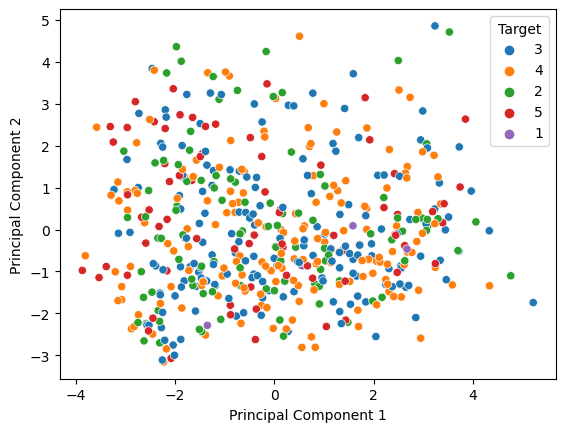

In [4094]:
sns.scatterplot(data = pca_df, x = 'Principal Component 1', y = 'Principal Component 2', hue = 'Target')

In [4095]:
from sklearn.cluster import k_means
from sklearn.cluster import KMeans

x_kma = x_1.values

In [4096]:
y_kma = y_1.values

In [4097]:
kmeans = KMeans(n_clusters = 5, random_state=0, n_init = "auto").fit(x_kma)

C:\Users\Josue Regalado\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(


In [4098]:
kmeans.labels_

array([1, 1, 1, 2, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 1, 1, 2, 2, 1, 1, 1, 1,
       1, 2, 2, 1, 1, 1, 1, 2, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       2, 2, 1, 1, 1, 1, 1, 2, 4, 4, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 2, 2, 2, 3, 1, 0, 2, 2, 1, 2, 1, 1, 1, 2,
       2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 2, 2, 1, 2, 1, 1, 2, 2, 2, 2, 2, 4,
       2, 2, 2, 2, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0,
       0, 2, 2, 2, 3, 4, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 0, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 3, 3,
       4, 4, 4, 4, 4, 2, 2, 2, 3, 3, 3, 3, 2, 2, 2, 1, 1, 1, 1, 1, 1, 2,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2,
       2, 2, 2, 4, 1, 1, 1, 2, 2, 2, 3, 3, 2, 3, 2, 4, 4, 4, 4, 4, 4, 2,
       2, 2, 1, 4, 4, 4, 4, 4, 2, 2, 0, 0, 1, 2, 2, 2, 4, 4, 4, 4, 2, 4,
       4, 4, 4, 4, 4, 4, 1, 2, 2, 3, 3, 3, 3, 3, 3, 3, 2, 2, 2, 1, 0, 3,
       3, 3, 3, 2, 2, 2, 0, 0, 4, 4, 4, 4, 2, 2, 1,

In [4099]:
tsne = TSNE(n_components=2, random_state=42)

In [4100]:
x_tsne = tsne.fit_transform(x_kma)

In [4101]:
tsne_df = pd.DataFrame(data=x_tsne, columns= ['TSNE Component 1', 'TSNE Component 2'])

In [4102]:
tsne_df['Target']=y_kma

In [4103]:
tsne_df['Labels'] = kmeans.labels_

<Axes: xlabel='TSNE Component 1', ylabel='TSNE Component 2'>

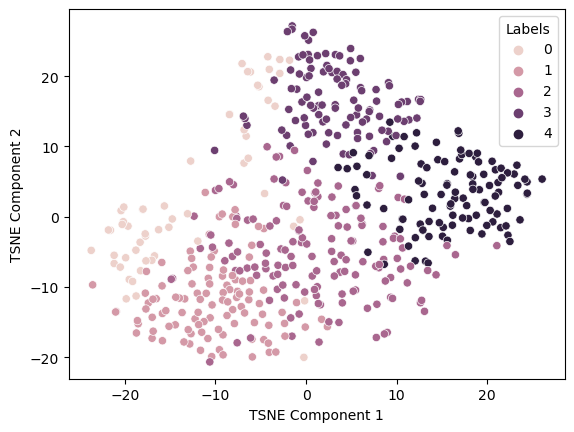

In [4104]:
sns.scatterplot(data = tsne_df, x = 'TSNE Component 1', y = 'TSNE Component 2', hue = 'Labels')

<Axes: xlabel='TSNE Component 1', ylabel='TSNE Component 2'>

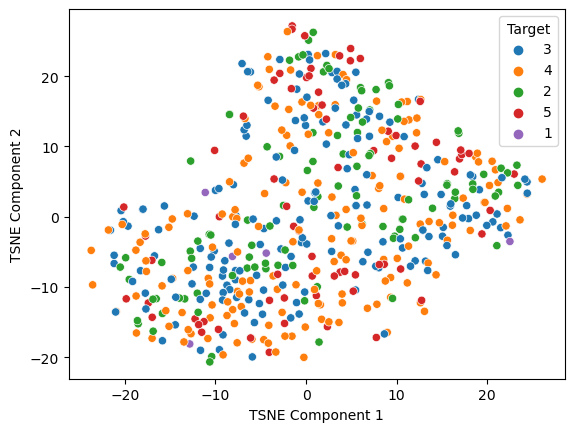

In [4105]:
sns.scatterplot(data = tsne_df, x = 'TSNE Component 1', y = 'TSNE Component 2', hue = 'Target')